# Random forest and logistic regression applied to RNA seq data of prostate cancer.
<h1 style="font-size: 18px;">- Prediction of cancer outcome</h1>
<h2 style="font-size: 18px;">- Study of feature important for cancer prediction by the random forest model by different methods.</h2>
<h3 style="font-size: 18px;">- Identification of the common genes/ features </h3>
<h3 style="font-size: 18px;">- Pub Med retrieval on Gene info. </h3>



# Notebook contents:

    - The data used in this notebook: PRAD_ML_df_gene_names was prepared in the notebook Data preparation.
    
    -Splitting the data to input into the models:
      Data was split either in test and training sets or training, test and validation sets.
     (Note: on the code,  x_test and y_test variables label the validation sets used for hyperparameters tunning while training the model. The  sets used for training are called: x_train, y_train.  x,y are the whole data set when all features are used. x_PCA and y_PCA the whole data set when PCA components are used for training. x_val, y_val are the sets used in all cases for final testing of the model when using all the features or the PCs, respectivelly). This data sets were used as input to test the following ML models:
     
    -Random forest classifier (single random split tunning)
    -Random forest classifier (crossvalidation tunning)
    -Linear logistic regression
    
    -Feature importance in the random forest classifier by
            -permutation importances
            -Gini importances
            -SHAP model explanation
    -Venn diagrams of the genes identify by calculating features important for model preformance by different algorithms (Gini, SHAP, permutation importance) and the top DE genes were done to identify potential biomarkers and targets.
    -PubMed and Euro PMC information retrival on the most interesting genes/ features.
     
    - Note: the notebook was set to run locally. File paths has to be set accordingly. Since problems of memory arrived when calculating the hierarchical clusters, this part of the notebook can run in collab if the data is open with the collab script.   

In [29]:
#load packages and libraries (installed packages in the activated enviroment from terminal)
# pip install pydeseq2 from the terminal
# pip install shap from terminal
#pip install plotly
#pip install seaborn
#pip install tensorflow
#pip install matplotlib-venn
#pip install mplcursors
 
# numeric libraries
import numpy as np
import os
import pandas as pd
from time import time as timer
import random
import warnings


#file libraries
import tarfile
import pickle as pkl
from IPython.display import HTML
from typing import Tuple
from typing import Union


# common visualization module
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns
sns.set()
%matplotlib inline
from matplotlib import animation
from matplotlib_venn import venn3
from matplotlib_venn import venn2
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

# machine learning modules and visualization

import tensorflow as tf
import sklearn
from sklearn import ensemble
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_predict, StratifiedKFold, cross_val_score
from sklearn.inspection import permutation_importance
from sklearn import linear_model
from sklearn import tree
from sklearn import ensemble
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
#from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.inspection import permutation_importance





import shap

from timeit import default_timer as timer
import warnings
from sklearn.exceptions import ConvergenceWarning

# for literature search

# Euro PMC requirements
import requests
from bs4 import BeautifulSoup

# Pubmed requirements
!pip install biopython
import re
from Bio import Entrez

#from google.colab import files # if running in google collab
#!pip install shap (when running in collab)

# Clustering ans statistics
import scipy.cluster.hierarchy as sch
from scipy.stats import mannwhitneyu

# Create and output pass to save results or open files if working in jupyther notebooks

#Replace this with the path to directory where you would like results to be saved
OUTPUT_PATH = "DataMiner-main/PRAD/pyDeseq2_output"
os.makedirs(OUTPUT_PATH, exist_ok=True)  # Create path if it doesn't exist




import numpy as np
from sklearn import linear_model
from sklearn.model_selection import StratifiedKFold, cross_val_score
import warnings



# Load Data file if using  Collab

In [ ]:
# for working with Google collab
# open PRAD_ML_df_gene_names.csv generated in the Data_preparation notebook


uploaded = files.upload()




Saving PRAD_ML_df_gene_names.csv to PRAD_ML_df_gene_names.csv


In [ ]:
# Import the example data and linearly scale each feature so that its minimum and maximum values are 0 and 1, respectively.The table used to generate the files and has the information-sample-condition:
PRAD_ML_df_gene_names = pd.read_csv('/content/PRAD_ML_df_gene_names.csv', index_col=0)
PRAD_ML_df_gene_names

,Condition,TNMD,AOC1,PDK4,ZMYND10,MYH13,SLC13A2,MATK,TFAP2B,TENM1,...,ENSG00000288047.1,ENSG00000288048.1,ENSG00000288060.1,ENSG00000288086.1,ENSG00000288097.1,ENSG00000288101.1,ENSG00000288104.1,ENSG00000288172.1,ENSG00000288547.3,ENSG00000288658.1
unstranded_2fa8c89c-893e-465a-aeb5-e3fb81a200c7.rna_seq.augmented_star_gene_counts.tsv,1,15.966137,865.532686,3723.471197,31.091951,0.840323,0.840323,874.776239,0.000000,715.955193,...,0.000000,35.293566,0.000000,5.041938,0.840323,3.361292,1.680646,0.000000,52.940349,0.000000
unstranded_288d2dc8-9fb3-4164-8e6a-cee107d11404.rna_seq.augmented_star_gene_counts.tsv,1,11.725003,34.002509,1224.090334,69.177519,0.000000,1.172500,315.402586,68.005019,1279.197849,...,0.000000,16.415004,2.345001,8.207502,0.000000,0.000000,5.862502,0.000000,22.277506,2.345001
unstranded_7b97885a-f365-4f11-8f35-9bf17a7344b5.rna_seq.augmented_star_gene_counts.tsv,1,1.597117,251.545950,1652.217685,46.316397,8.784144,3.194234,528.645775,1.597117,177.280003,...,0.000000,0.798559,1.597117,0.000000,0.000000,0.000000,3.194234,0.000000,22.359640,0.798559
unstranded_e32fc401-5ddd-4dfc-8be4-8d4072a080c3.rna_seq.augmented_star_gene_counts.tsv,1,4.584119,51.342133,150.359103,257.627488,2.750471,8.251414,110.935680,8.251414,16160.853136,...,1.833648,6.417767,23.837419,0.000000,0.916824,0.000000,106.351561,0.000000,5.500943,7.334590
unstranded_16eca87b-206a-4c2d-8ab7-f8c2fdb51b0e.rna_seq.augmented_star_gene_counts.tsv,1,2.606933,196.388934,13978.373392,48.662745,0.868978,0.000000,146.857211,2.606933,78.207982,...,0.000000,21.724440,2.606933,0.000000,0.000000,0.000000,4.344888,0.000000,92.980601,0.868978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unstranded_422d5778-bfe0-4e2f-b254-2a753c777686.rna_seq.augmented_star_gene_counts.tsv,0,362.026157,85.928388,359838.505069,23.947256,7.043310,8271.663796,30.990566,153.544168,209.890652,...,14.086621,390.199399,0.000000,7.043310,8.451973,0.000000,1.408662,16.903945,2842.680099,177.491423
unstranded_60028d9d-c8e5-4c4e-a75c-cc3df6f2eea1.rna_seq.augmented_star_gene_counts.tsv,0,37.214004,5730.956592,877.946703,26.581431,0.000000,0.759469,30.378779,0.759469,841.492169,...,0.759469,15.948859,0.000000,5.316286,0.000000,0.000000,3.037878,0.000000,12.910981,0.000000
unstranded_2c022016-756e-4cbf-9baa-dab196b6e715.rna_seq.augmented_star_gene_counts.tsv,0,15.963598,27217.934445,12411.697379,17.959048,0.000000,9.312099,67.845291,1.330300,1197.934994,...,1.330300,24.610547,0.000000,9.312099,0.665150,0.665150,0.000000,0.000000,21.949947,2.660600
unstranded_998581d3-8fdc-4f4a-92cd-d98fc0f910bc.rna_seq.augmented_star_gene_counts.tsv,0,501.478180,7.975796,33270.036453,41.872930,0.000000,6171.272232,24.924363,121.630891,56.827547,...,48.851751,447.641556,0.000000,0.996975,26.918312,0.000000,0.996975,8.972771,2408.690422,280.149838


# Open File when  using Jupyter notebook locally

In [48]:
# open the file saved locally in the Data preparation notebook, change the path accordingly

# when needed load again with the code:
PRAD_ML_df_gene_names = pd.read_csv(os.path.join(OUTPUT_PATH, 'PRAD_ML_df_gene_names.csv'), index_col=0)
PRAD_ML_df_gene_names



,Condition,TNMD,AOC1,PDK4,ZMYND10,MYH13,SLC13A2,MATK,TFAP2B,TENM1,...,ENSG00000288047.1,ENSG00000288048.1,ENSG00000288060.1,ENSG00000288086.1,ENSG00000288097.1,ENSG00000288101.1,ENSG00000288104.1,ENSG00000288172.1,ENSG00000288547.3,ENSG00000288658.1
unstranded_2fa8c89c-893e-465a-aeb5-e3fb81a200c7.rna_seq.augmented_star_gene_counts.tsv,1,15.966137,865.532686,3723.471197,31.091951,0.840323,0.840323,874.776239,0.000000,715.955193,...,0.000000,35.293566,0.000000,5.041938,0.840323,3.361292,1.680646,0.000000,52.940349,0.000000
unstranded_288d2dc8-9fb3-4164-8e6a-cee107d11404.rna_seq.augmented_star_gene_counts.tsv,1,11.725003,34.002509,1224.090334,69.177519,0.000000,1.172500,315.402586,68.005019,1279.197849,...,0.000000,16.415004,2.345001,8.207502,0.000000,0.000000,5.862502,0.000000,22.277506,2.345001
unstranded_7b97885a-f365-4f11-8f35-9bf17a7344b5.rna_seq.augmented_star_gene_counts.tsv,1,1.597117,251.545950,1652.217685,46.316397,8.784144,3.194234,528.645775,1.597117,177.280003,...,0.000000,0.798559,1.597117,0.000000,0.000000,0.000000,3.194234,0.000000,22.359640,0.798559
unstranded_e32fc401-5ddd-4dfc-8be4-8d4072a080c3.rna_seq.augmented_star_gene_counts.tsv,1,4.584119,51.342133,150.359103,257.627488,2.750471,8.251414,110.935680,8.251414,16160.853136,...,1.833648,6.417767,23.837419,0.000000,0.916824,0.000000,106.351561,0.000000,5.500943,7.334590
unstranded_16eca87b-206a-4c2d-8ab7-f8c2fdb51b0e.rna_seq.augmented_star_gene_counts.tsv,1,2.606933,196.388934,13978.373392,48.662745,0.868978,0.000000,146.857211,2.606933,78.207982,...,0.000000,21.724440,2.606933,0.000000,0.000000,0.000000,4.344888,0.000000,92.980601,0.868978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unstranded_422d5778-bfe0-4e2f-b254-2a753c777686.rna_seq.augmented_star_gene_counts.tsv,0,362.026157,85.928388,359838.505069,23.947256,7.043310,8271.663796,30.990566,153.544168,209.890652,...,14.086621,390.199399,0.000000,7.043310,8.451973,0.000000,1.408662,16.903945,2842.680099,177.491423
unstranded_60028d9d-c8e5-4c4e-a75c-cc3df6f2eea1.rna_seq.augmented_star_gene_counts.tsv,0,37.214004,5730.956592,877.946703,26.581431,0.000000,0.759469,30.378779,0.759469,841.492169,...,0.759469,15.948859,0.000000,5.316286,0.000000,0.000000,3.037878,0.000000,12.910981,0.000000
unstranded_2c022016-756e-4cbf-9baa-dab196b6e715.rna_seq.augmented_star_gene_counts.tsv,0,15.963598,27217.934445,12411.697379,17.959048,0.000000,9.312099,67.845291,1.330300,1197.934994,...,1.330300,24.610547,0.000000,9.312099,0.665150,0.665150,0.000000,0.000000,21.949947,2.660600
unstranded_998581d3-8fdc-4f4a-92cd-d98fc0f910bc.rna_seq.augmented_star_gene_counts.tsv,0,501.478180,7.975796,33270.036453,41.872930,0.000000,6171.272232,24.924363,121.630891,56.827547,...,48.851751,447.641556,0.000000,0.996975,26.918312,0.000000,0.996975,8.972771,2408.690422,280.149838


# Prepare features and output data

In [4]:
Output_names = ['Normal Tissue PRAD (0)','Primary Tumor PRAD (1)', ]

features = PRAD_ML_df_gene_names.columns[1:].tolist()

print(features)
print(len(features))

['TNMD', 'AOC1', 'PDK4', 'ZMYND10', 'MYH13', 'SLC13A2', 'MATK', 'TFAP2B', 'TENM1', 'CLCA4', 'C8B', 'DNAH5', 'ZIC2', 'MAGEC2', 'ROS1', 'LMO3', 'COL9A2', 'CBLN4', 'NPFFR2', 'ARSF', 'ATP2B3', 'GAL', 'EPHA8', 'TRPM5', 'MOV10L1', 'CD5L', 'PTGS2', 'PAX2', 'CAPN6', 'TRPM3', 'GSTP1', 'SLCO1A2', 'NKAIN1', 'AKR1B1', 'HBQ1', 'GNAO1', 'DLL3', 'SLC26A3', 'APOH', 'JPH4', 'PTGS1', 'TDRD1', 'CRTAC1', 'EFNA2', 'PLA2G3', 'TRIM9', 'CCDC198', 'CPNE6', 'MYBL2', 'CHRNA4', 'HAO1', 'CST4', 'WFDC2', 'SPINT3', 'EPPIN', 'LIPG', 'MCF2', 'KLHL4', 'MSLN', 'MT4', 'NDRG4', 'QPRT', 'SLC6A2', 'CA2', 'ANXA13', 'NEFM', 'ADAM2', 'FGL1', 'TUBB4A', 'AMH', 'CASP14', 'CLC', 'SULT2A1', 'COMP', 'HPN', 'PON3', 'ATP6V0A4', 'LHX2', 'ELAVL2', 'GLIS3', 'GATA3', 'UNC5B', 'ASPA', 'HOXB6', 'SMR3A', 'ANXA10', 'SLC2A9', 'FOLR1', 'APOC3', 'SYT10', 'RASAL1', 'SLCO1B3', 'ADTRP', 'ULBP1', 'BMP5', 'SIM1', 'NR2E1', 'AGXT2', 'UNC5A', 'KNG1', 'HRG', 'IL1A', 'TLX2', 'EVA1A', 'KCNJ13', 'OTX1', 'IL1RL1', 'DLX2', 'KISS1R', 'PLA2G4A', 'RPE65', 'NT5C1

In [49]:
# create the features and outcome np arrays for inputs on ML

# Outcome data: selectthe Condition column

df_y = PRAD_ML_df_gene_names.Condition
print(df_y)

# Fetures data with the gene counts : remove the Condition Column
df_x= PRAD_ML_df_gene_names.drop('Condition', axis=1)
df_x =df_x.reset_index(drop=True)
print(df_x)

# convert to numpy arrays

x = df_x.to_numpy().astype(np.float32)
y = df_y.to_numpy().astype(np.float32)
print(y)
print(x)








unstranded_2fa8c89c-893e-465a-aeb5-e3fb81a200c7.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_288d2dc8-9fb3-4164-8e6a-cee107d11404.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_7b97885a-f365-4f11-8f35-9bf17a7344b5.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_e32fc401-5ddd-4dfc-8be4-8d4072a080c3.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_16eca87b-206a-4c2d-8ab7-f8c2fdb51b0e.rna_seq.augmented_star_gene_counts.tsv    1
                                                                                         ..
unstranded_422d5778-bfe0-4e2f-b254-2a753c777686.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_60028d9d-c8e5-4c4e-a75c-cc3df6f2eea1.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_2c022016-756e-4cbf-9baa-dab196b6e715.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_998581d3-8fdc-4f4a-92cd-d98fc0f910bc.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_9975ae8f-09f2-4343-9281-cbe13c775dca.rna_seq.augmented_star_gene_coun

# Plot to check number of samples for each category

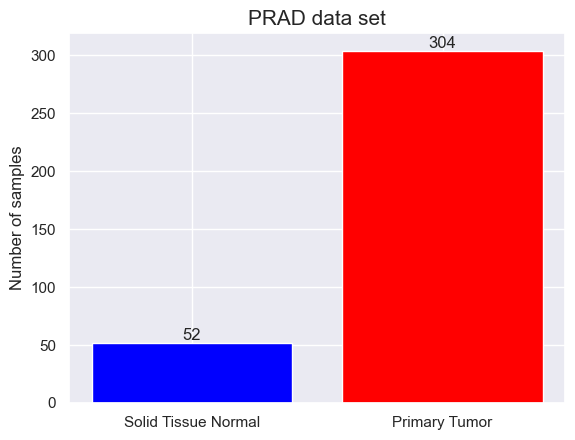

In [6]:
# plot number of controls and tumor samples

# Count the occurrences of zeros and ones
zeros_count = np.count_nonzero(y == 0)
ones_count = np.count_nonzero(y == 1)

# Plotting
labels = ['Solid Tissue Normal', 'Primary Tumor']
counts = [zeros_count, ones_count]

plt.bar(labels, counts, color=['blue', 'red'])
plt.title('PRAD data set', fontsize=15)
plt.ylabel('Number of samples', fontsize=12)

#Add counts on top of the bars
for i in range(len(labels)):
    plt.text(i, counts[i], str(counts[i]), ha='center', va='bottom')

plt.show()
plt.show()


# Split data in traning, validation and test sets

 <h4 style="font-size: 22px;">- First Split (Optional) to remove 10 % of the data to keep as unseen data for final model testing. </h4>

<h4 style="font-size: 20px;">- Split when using all the features for training. </h4>

Note: the kept unseen sets are called the names: x_val and y_val

In [50]:
# Only run this code if we want to remove 10% of the data before for validation to keep unseen, use the rest for total training
# use stratify to keep the balance of classes

# we have the data in x and y
# First, split the data into validation and the rest (will be the new x use for training and testing)
x, x_val, y, y_val = train_test_split(x, y, test_size=0.1, random_state=42, stratify=y)


#print(x)
#print(x_val)
#print(y)
#print(y_val)

print("size (x):", x.shape)
print(" size (x_val):", x_val.shape)
print("size (y):", y.shape)
print("size (y_val):", y_val.shape)

# Convert y_val to integers
y_val_int = y_val.astype(int)

# Count the occurrences of each class
class_counts = np.bincount(y_val_int)

# Print the class counts
print("Class counts in validation set:")
print(class_counts)

# Convert y_val to integers
y_int = y.astype(int)

# Count the occurrences of each class
class_counts = np.bincount(y_int)

# Print the class counts
print("Class counts in set use for training/evaluation:")
print(class_counts)



size (x): (320, 1380)
 size (x_val): (36, 1380)
size (y): (320,)
size (y_val): (36,)
Class counts in validation set:
[ 5 31]
Class counts in set use for training/evaluation:
[ 47 273]


<h4 style="font-size: 22px;">- Split for using Principal Components for training (PCA anaylsis is done bellow in the notebook) </h4>

Note: the kept unseen sets are asing the names: x_val and y_val

In [ ]:
# Only run this code if we want to try  remove 10% of the data (PCA features) before for validation to keep unseen, use the rest for total training
# use stratify to keep the balance of classes

# For using the PCA components (run the PCA bellow before)
x_PCA, x_val, y_PCA, y_val = train_test_split(x_PCA, y_PCA, test_size=0.1, random_state=42,stratify=y_PCA)

# For PCA check:

# Convert y_val to integers
y_PCA_int = y_PCA.astype(int)

# Count the occurrences of each class
class_counts = np.bincount(y_PCA_int)

# Print the class counts
print("Class counts in training/evaluation for PCA:")
print(class_counts)
# Convert y_val to integers
y_val_int = y_val.astype(int)

# Count the occurrences of each class
class_counts = np.bincount(y_val_int)

# Print the class counts
print("Class counts in validation PCA set:")
print(class_counts)



Class counts in training/evaluation for PCA:
[ 47 273]
Class counts in validation PCA set:
[ 5 31]


In [ ]:
# x can be also first normalized (in random forest does not  make no differences, but important for other algorithms)

# chose a scaler:
# normalization to values between 0 and 1
#scaler = MinMaxScaler()


# normalization with 0 as center
#scaler = StandardScaler()

# normalize x if requiered
#x = scaler.fit_transform(x)
#print(x)

# normalize x_val for final test of the model
#x_val = scaler.fit_transform(x_val)



# Second Split: create training and validation sets


Note: on the code:

-The vaidation set used for testing the model while training is called x_test and y_test.

-The sets used for training was called: x_train, y_train

-x,y is the whole data set when all features are used

-x_PCA and y_PCA the whole data set when PCA components are used for training

-x-val and y_val are the 10 % of the data kept as unseen for final testing, when using all the features or the PCs.


# Split when using all the features

In [51]:
# split the data in training and test sets:

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)


print(x_train)
print(y_train)
print(x_test)
print(y_test)
print(len(x_train))
print(len(x_test))
print(len(y_train))
print(len(y_test))


# Convert y_val to integers
y_train_int = y_train.astype(int)

# Count the occurrences of each class
class_counts = np.bincount(y_train_int)

# Print the class counts
print("Class counts in train:")
print(class_counts)

# Convert y_val to integers
y_test_int = y_test.astype(int)

# Count the occurrences of each class
class_counts = np.bincount(y_test_int)

# Print the class counts
print("Class counts in test:")
print(class_counts)


[[1.2229304e+01 2.2917717e+03 1.5604592e+03 ... 1.2229304e+00
  1.1006374e+01 2.4458609e+00]
 [5.4023275e+00 1.6206982e+01 1.8838688e+03 ... 0.0000000e+00
  2.7011637e+01 0.0000000e+00]
 [2.2728149e+01 9.1739075e+02 1.2149230e+03 ... 2.0661955e+00
  4.3390102e+01 3.0992932e+00]
 ...
 [1.2016905e+01 1.5881542e+04 4.3164722e+03 ... 0.0000000e+00
  9.6135244e+00 0.0000000e+00]
 [1.1473260e+03 6.4739403e+01 1.6163870e+05 ... 9.5910225e+00
  1.5813198e+03 5.6347256e+01]
 [9.8071114e+01 1.8653944e+03 7.8742935e+03 ... 0.0000000e+00
  4.9035557e+01 1.2258889e+01]]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1

# Split for PC selected from the PCA analyis (bellow in the notebook)

In [ ]:
# Select this is PC form PCA analysis are used: PCA analsis has to be run before (under: PCA analyis bellow in this Jupyter notebook):
x_train, x_test, y_train, y_test = train_test_split(x_PCA, y_PCA, test_size=0.2, random_state=42,stratify=y_PCA)


# Training the models

# Random Forest

# Checking best hyperparameters by single random-train-validation-split

 estimator: 1 depth: 4 test score:0.8888888888888888
 estimator: 1 depth: 4 train score:0.9471830985915493
Classification Report:
              precision    recall  f1-score   support

         0.0       0.64      0.64      0.64        11
         1.0       0.93      0.93      0.93        61

    accuracy                           0.89        72
   macro avg       0.79      0.79      0.79        72
weighted avg       0.89      0.89      0.89        72



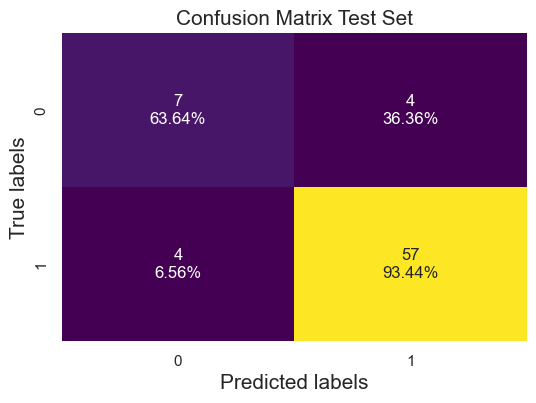

 estimator: 5 depth: 4 test score:0.9444444444444444
 estimator: 5 depth: 4 train score:0.9823943661971831
Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.95      0.98      0.97        61

    accuracy                           0.94        72
   macro avg       0.92      0.86      0.88        72
weighted avg       0.94      0.94      0.94        72



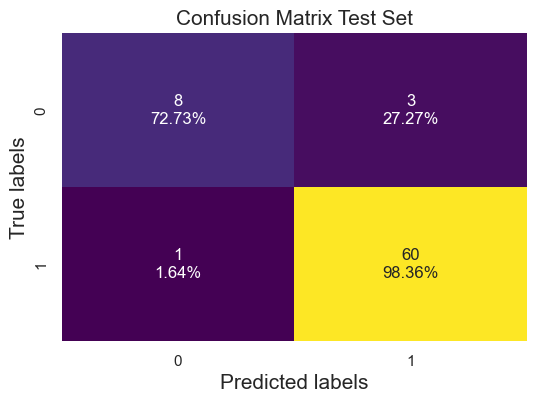

 estimator: 8 depth: 4 test score:0.9861111111111112
 estimator: 8 depth: 4 train score:0.9929577464788732
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



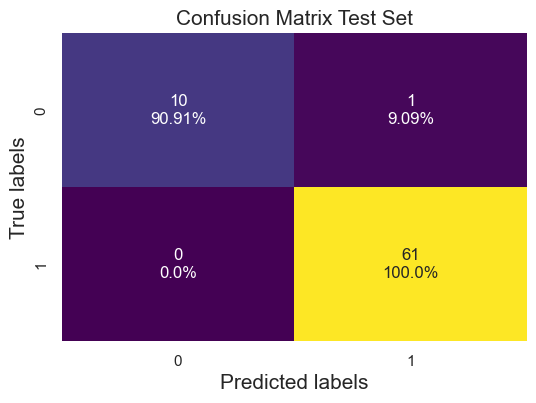

 estimator: 10 depth: 4 test score:0.9861111111111112
 estimator: 10 depth: 4 train score:0.9929577464788732
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



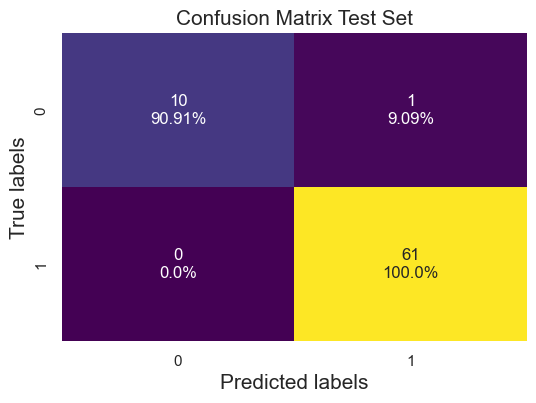

 estimator: 20 depth: 4 test score:0.9722222222222222
 estimator: 20 depth: 4 train score:0.9929577464788732
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



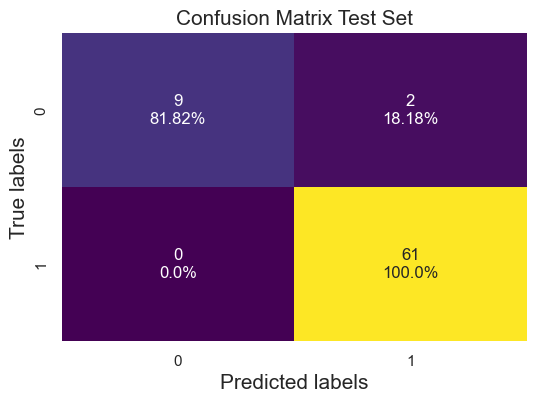

 estimator: 50 depth: 4 test score:0.9583333333333334
 estimator: 50 depth: 4 train score:0.9929577464788732
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



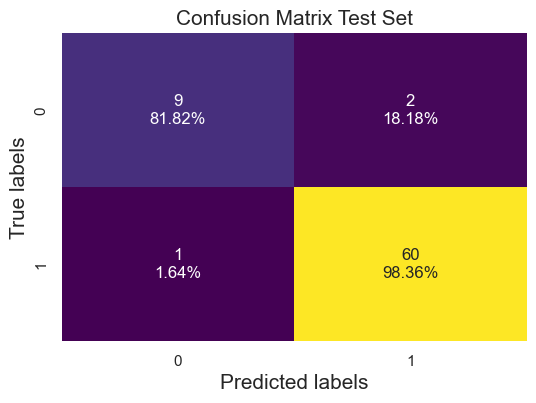

 estimator: 100 depth: 4 test score:0.9583333333333334
 estimator: 100 depth: 4 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



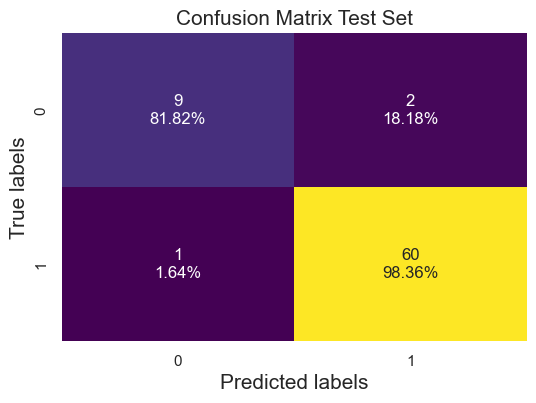

 estimator: 200 depth: 4 test score:0.9583333333333334
 estimator: 200 depth: 4 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



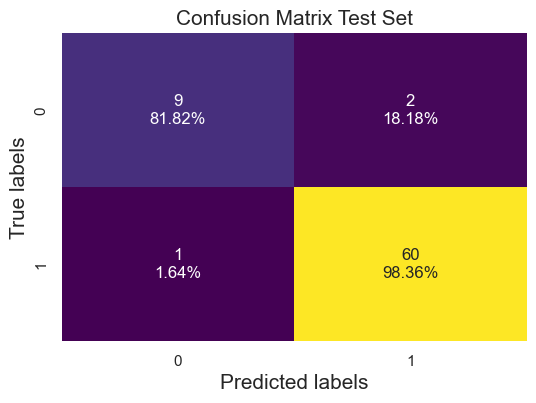

 estimator: 250 depth: 4 test score:0.9583333333333334
 estimator: 250 depth: 4 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



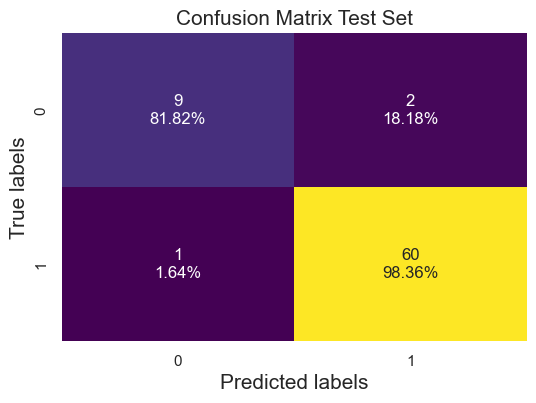

 estimator: 300 depth: 4 test score:0.9583333333333334
 estimator: 300 depth: 4 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



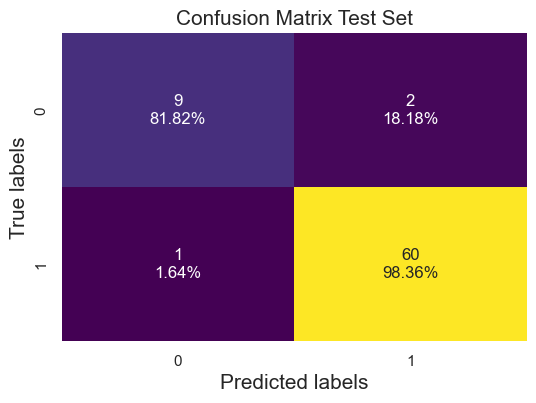

 estimator: 1 depth: 8 test score:0.875
 estimator: 1 depth: 8 train score:0.954225352112676
Classification Report:
              precision    recall  f1-score   support

         0.0       0.58      0.64      0.61        11
         1.0       0.93      0.92      0.93        61

    accuracy                           0.88        72
   macro avg       0.76      0.78      0.77        72
weighted avg       0.88      0.88      0.88        72



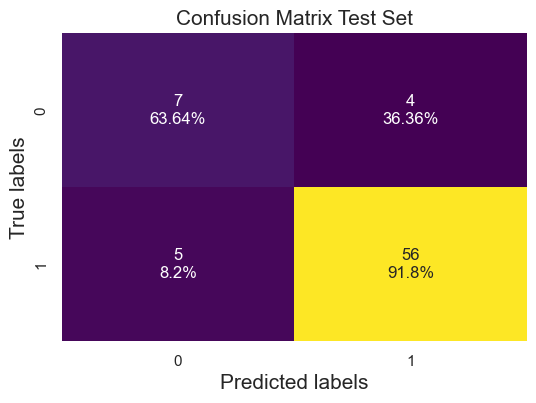

 estimator: 5 depth: 8 test score:0.9444444444444444
 estimator: 5 depth: 8 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.95      0.98      0.97        61

    accuracy                           0.94        72
   macro avg       0.92      0.86      0.88        72
weighted avg       0.94      0.94      0.94        72



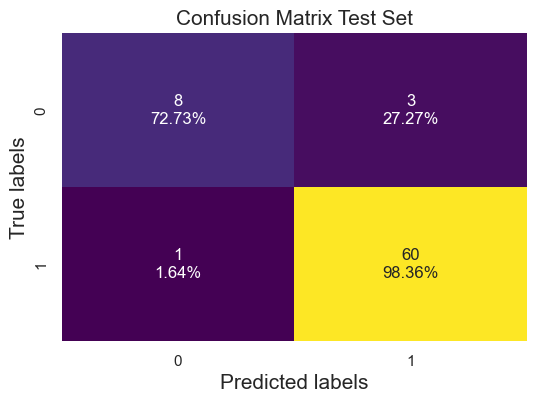

 estimator: 8 depth: 8 test score:0.9861111111111112
 estimator: 8 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



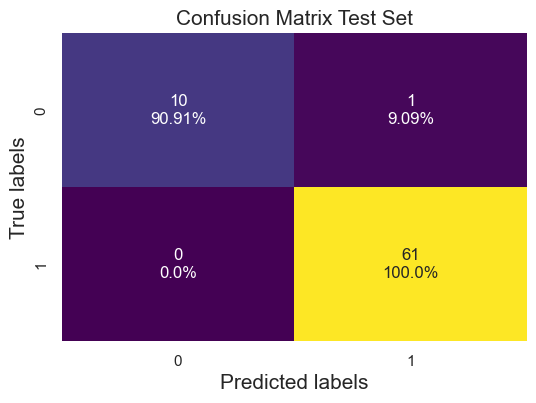

 estimator: 10 depth: 8 test score:0.9722222222222222
 estimator: 10 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



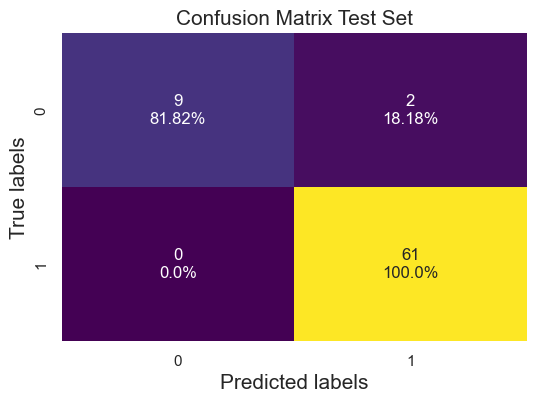

 estimator: 20 depth: 8 test score:0.9722222222222222
 estimator: 20 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



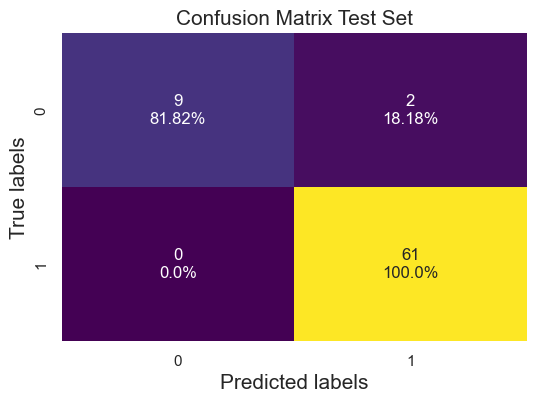

 estimator: 50 depth: 8 test score:0.9583333333333334
 estimator: 50 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



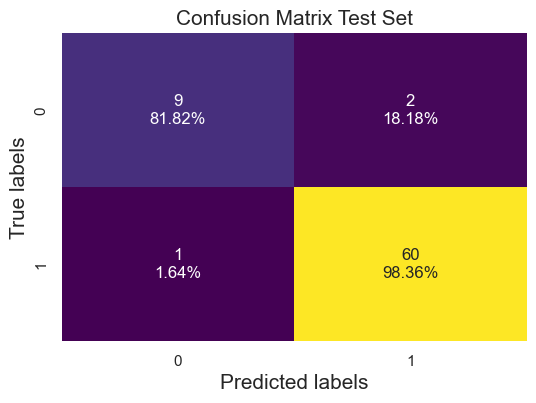

 estimator: 100 depth: 8 test score:0.9583333333333334
 estimator: 100 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



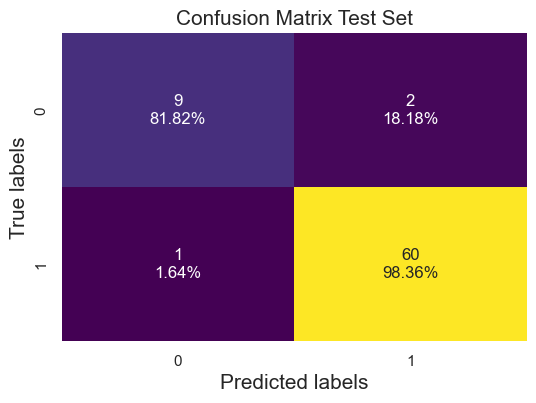

 estimator: 200 depth: 8 test score:0.9722222222222222
 estimator: 200 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



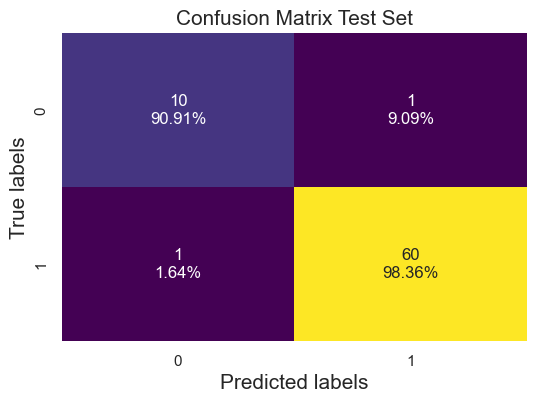

 estimator: 250 depth: 8 test score:0.9722222222222222
 estimator: 250 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



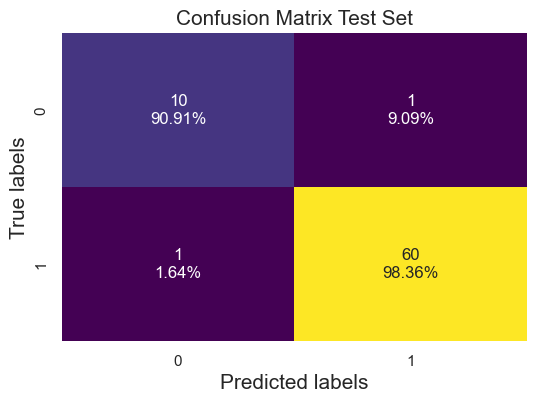

 estimator: 300 depth: 8 test score:0.9722222222222222
 estimator: 300 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



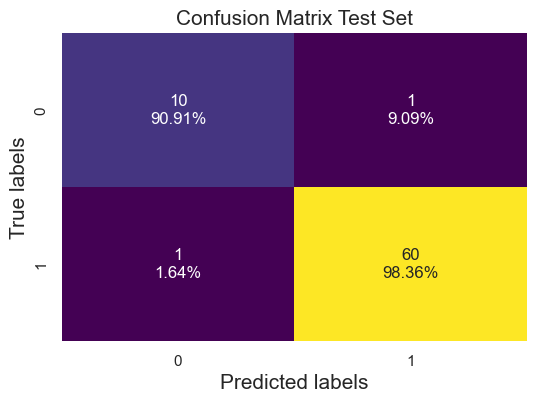

 estimator: 1 depth: 16 test score:0.875
 estimator: 1 depth: 16 train score:0.954225352112676
Classification Report:
              precision    recall  f1-score   support

         0.0       0.58      0.64      0.61        11
         1.0       0.93      0.92      0.93        61

    accuracy                           0.88        72
   macro avg       0.76      0.78      0.77        72
weighted avg       0.88      0.88      0.88        72



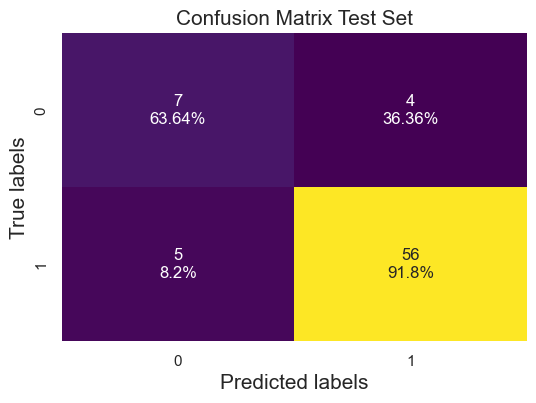

 estimator: 5 depth: 16 test score:0.9444444444444444
 estimator: 5 depth: 16 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.95      0.98      0.97        61

    accuracy                           0.94        72
   macro avg       0.92      0.86      0.88        72
weighted avg       0.94      0.94      0.94        72



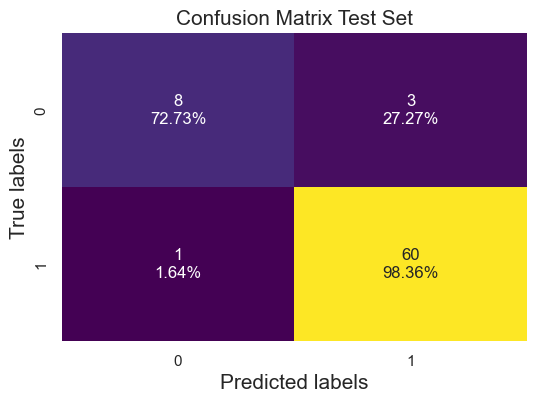

 estimator: 8 depth: 16 test score:0.9861111111111112
 estimator: 8 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



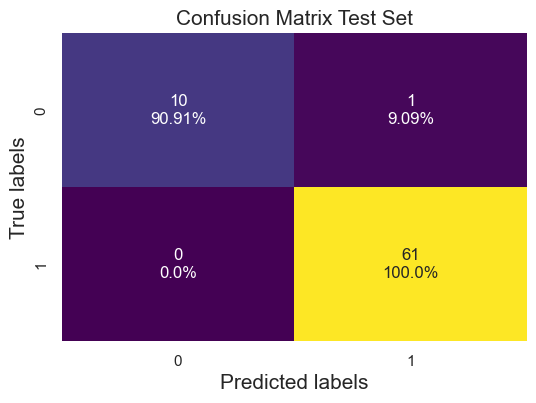

 estimator: 10 depth: 16 test score:0.9722222222222222
 estimator: 10 depth: 16 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



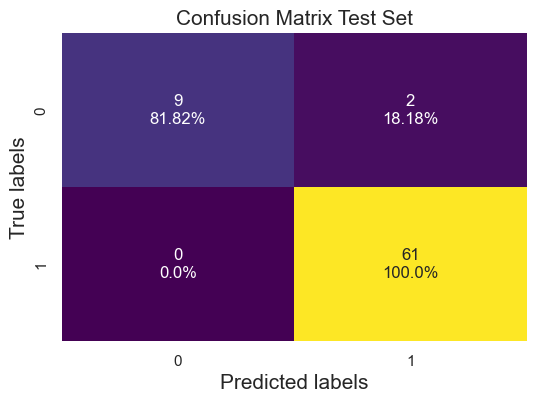

 estimator: 20 depth: 16 test score:0.9722222222222222
 estimator: 20 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



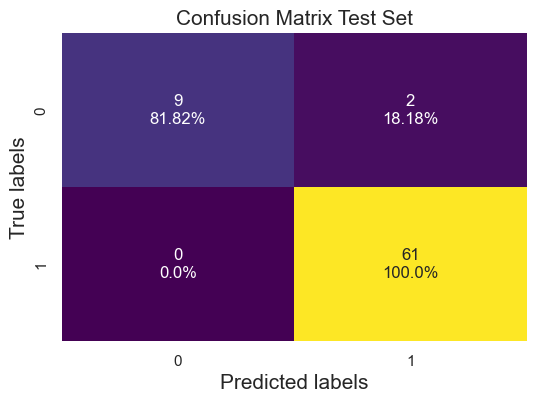

 estimator: 50 depth: 16 test score:0.9722222222222222
 estimator: 50 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



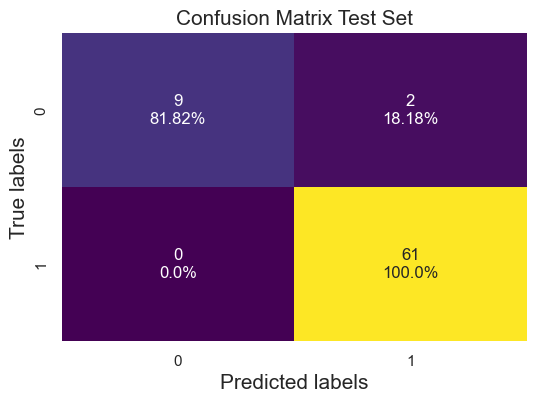

 estimator: 100 depth: 16 test score:0.9583333333333334
 estimator: 100 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



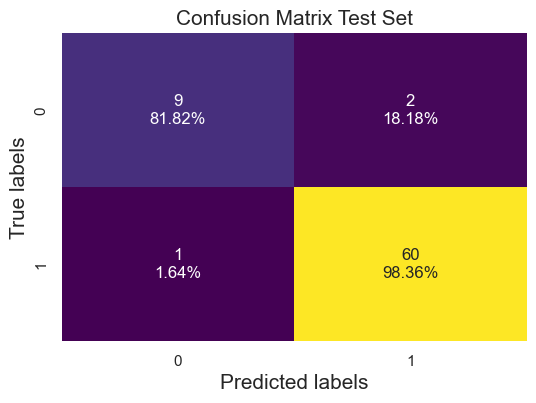

 estimator: 200 depth: 16 test score:0.9722222222222222
 estimator: 200 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



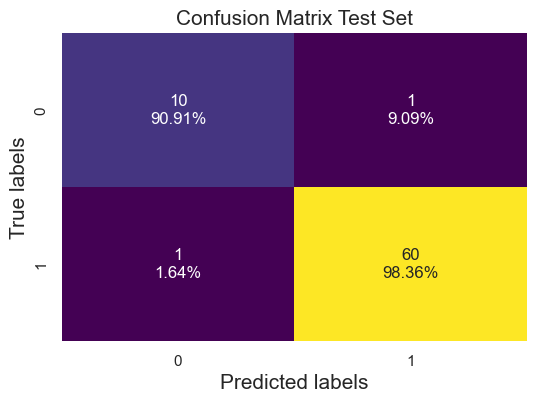

 estimator: 250 depth: 16 test score:0.9722222222222222
 estimator: 250 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



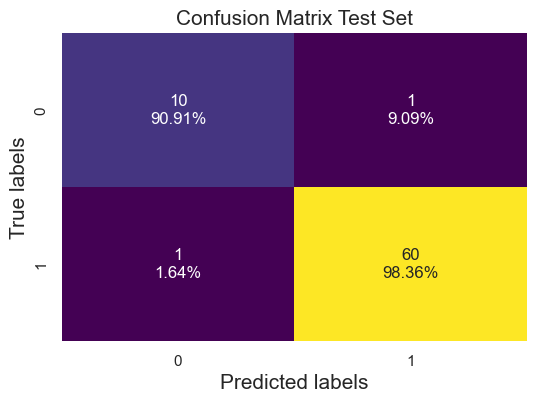

 estimator: 300 depth: 16 test score:0.9722222222222222
 estimator: 300 depth: 16 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



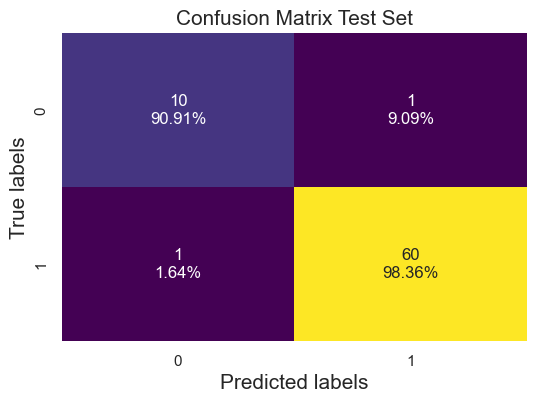

 estimator: 1 depth: 20 test score:0.875
 estimator: 1 depth: 20 train score:0.954225352112676
Classification Report:
              precision    recall  f1-score   support

         0.0       0.58      0.64      0.61        11
         1.0       0.93      0.92      0.93        61

    accuracy                           0.88        72
   macro avg       0.76      0.78      0.77        72
weighted avg       0.88      0.88      0.88        72



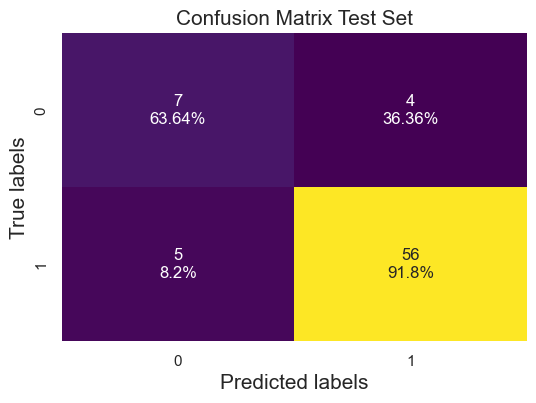

 estimator: 5 depth: 20 test score:0.9444444444444444
 estimator: 5 depth: 20 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.95      0.98      0.97        61

    accuracy                           0.94        72
   macro avg       0.92      0.86      0.88        72
weighted avg       0.94      0.94      0.94        72



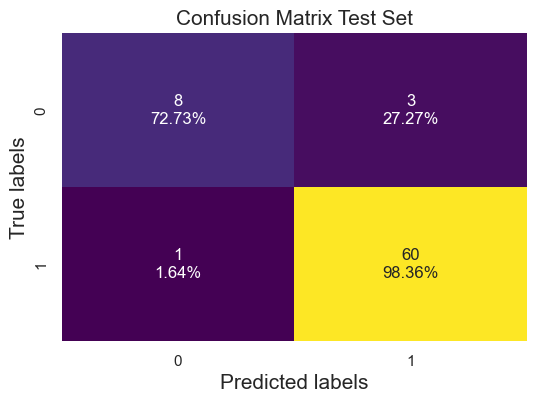

 estimator: 8 depth: 20 test score:0.9861111111111112
 estimator: 8 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



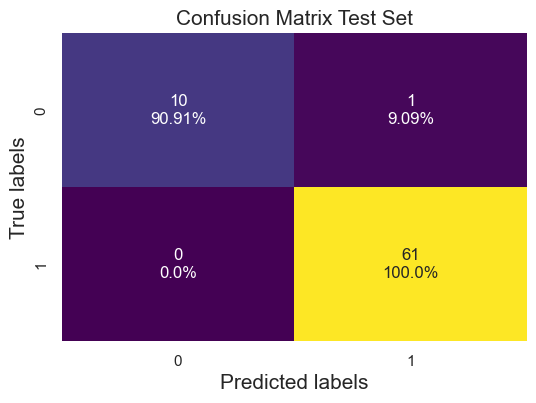

 estimator: 10 depth: 20 test score:0.9722222222222222
 estimator: 10 depth: 20 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



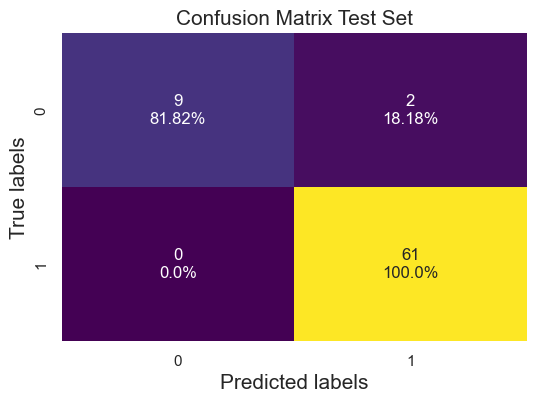

 estimator: 20 depth: 20 test score:0.9722222222222222
 estimator: 20 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



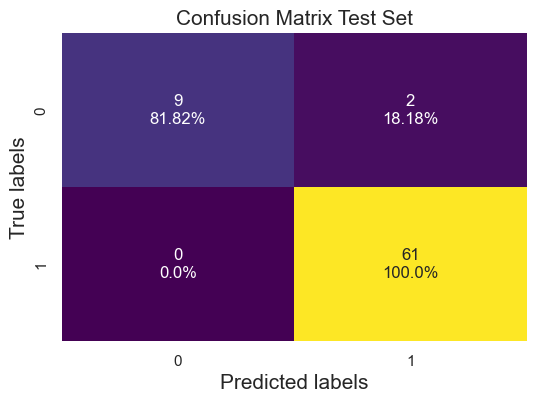

 estimator: 50 depth: 20 test score:0.9722222222222222
 estimator: 50 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



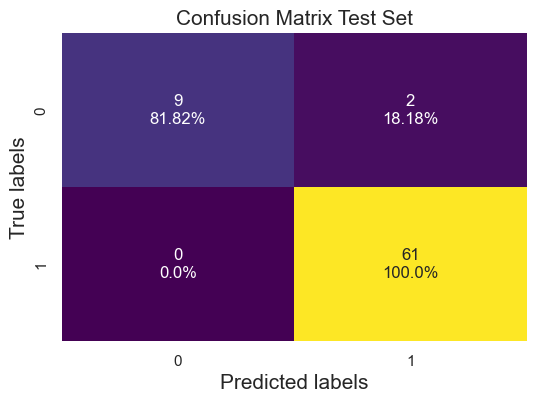

 estimator: 100 depth: 20 test score:0.9583333333333334
 estimator: 100 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



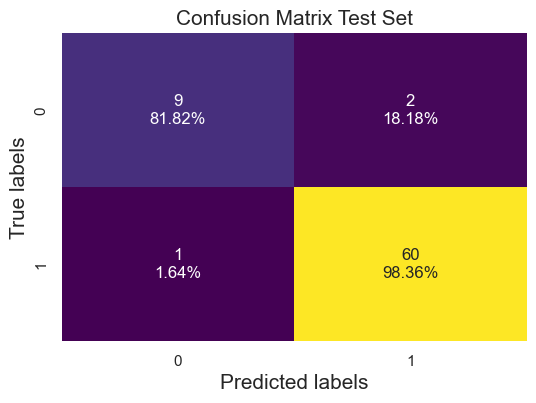

 estimator: 200 depth: 20 test score:0.9722222222222222
 estimator: 200 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



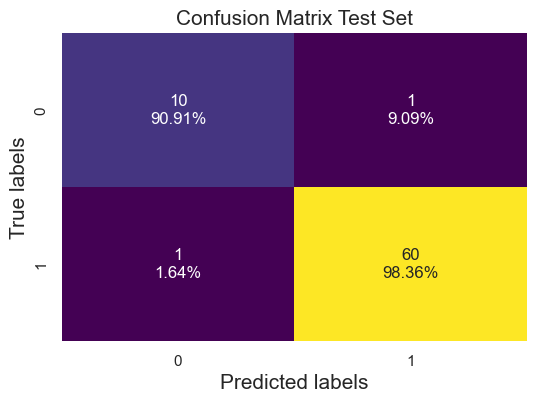

 estimator: 250 depth: 20 test score:0.9722222222222222
 estimator: 250 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



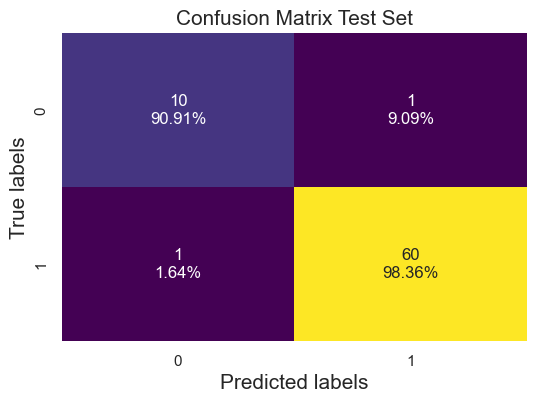

 estimator: 300 depth: 20 test score:0.9722222222222222
 estimator: 300 depth: 20 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



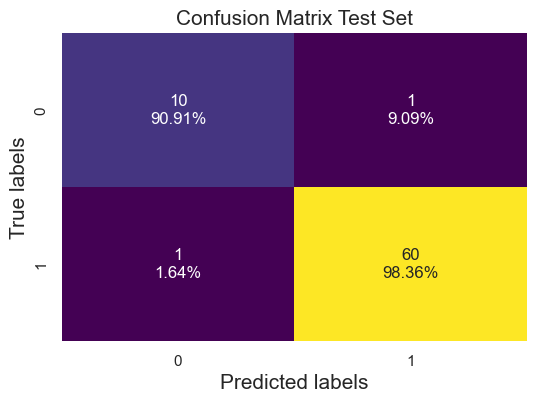

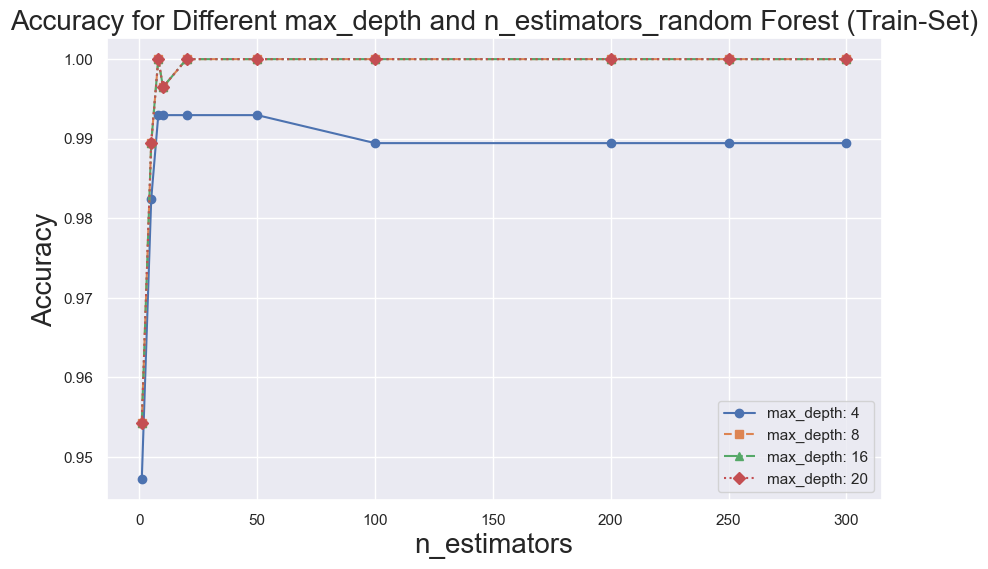

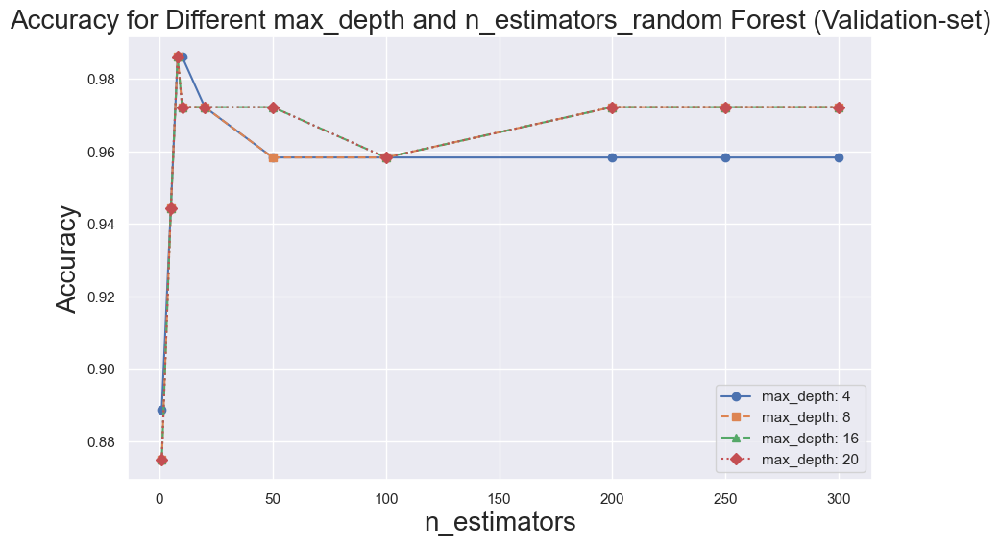

In [ ]:
# Code to check the best hyperparameters for random forest:

# Define lists of values for n_estimators and max_depth
#n_estimators_list = [1, 5, 8, 10, 20, 50, 100, 200,500]
#n_estimators_list = [1, 5, 8, 10, 15, 20, 50, 100]

n_estimators_list = [1, 5, 8, 10, 20, 50, 100, 200,250,300]
max_depth_list = [4, 8, 16, 20]


accuracies_test =[]
accuracies_train =[]
for m_deph in max_depth_list:
    acc_row_test =[]
    acc_row_train =[]
    for n_est in n_estimators_list: #we are changing the number of estimatores to check
#for n_est in [100]:
# do fit
      rfc= ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est,random_state=42)
      rfc.fit(x_train, y_train)
   # test different hyperparameters and take the one that gives the best accuracy at the end.
    # print the training scores
      print(f' estimator: {n_est} depth: {m_deph} test score:{(rfc.score(x_test, y_test))}')
      print(f' estimator: {n_est} depth: {m_deph} train score:{(rfc.score(x_train, y_train))}')
      y_pred_test = rfc.predict(x_test)
      y_pred_train = rfc.predict(x_train)
    #print(y_pred_test)
       #Evaluate the classifier
      accuracy_test = accuracy_score(y_test, y_pred_test)
      #print(f'Accuracy test: {accuracy_test}')
      acc_row_test.append(accuracy_test)

      accuracy_train = accuracy_score(y_train, y_pred_train)
      #print(f'Accuracy train: {accuracy_train}')
      acc_row_train.append(accuracy_train)



    # Print classification report and confusion matrix
      print("Classification Report:")
      print(classification_report(y_test, y_pred_test))

      #print("Confusion Matrix:")
      cm = confusion_matrix(y_test, y_pred_test)

    # Display the confusion matrix with values and percentages
      cm_sum = np.sum(cm, axis=1, keepdims=True)
      cm_percentages = cm / cm_sum.astype(float) * 100
      cm_with_percentages = np.round(cm_percentages, 2)

      plt.figure(figsize=(6, 4))
      sns.heatmap(
      cm,
      annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
      fmt='',
      cmap='viridis',
      cbar=False)

      plt.xlabel('Predicted labels',fontsize=15)
      plt.ylabel('True labels',fontsize=15)
      plt.title('Confusion Matrix Test Set',fontsize=15)
      plt.show()
    
    # this code can calculate the feature importance for every combination of est and deph but it is very time consumming so the importances were then calculated with the best hyperparamethers
     #calculate feature importance in test set
     # p_importances = permutation_importance(rfc, x_test, y_test, n_repeats=20, n_jobs=-1,random_state=42)

    # acces the mean  and sd
      #importances = p_importances.importances_mean
     # std_importances = p_importances.importances_std

    # Get the indices of the top N most important features
     # N = 35  # Number of top features to print
     # top_indices = np.argsort(importances)[::-1][:N]

    # Get the names of the top N most important features
      #top_features = [features[i] for i in top_indices]

    # Print the top N most important features
     # print("Top", N, "Most Important Features:")
     # for feature in top_features:
     #   print(feature)

      #plt.figure(figsize=(10, 6))
     # sns.barplot(x=top_features, y=importances[top_indices],yerr=std_importances[top_indices])
      #plt.xticks(rotation=90)
      #plt.xlabel('Features')
      #plt.ylabel('Importance')
     # plt.title('Top {} Most Important Features (Permutation Importance)-Test Set'.format(N))
      #plt.show()


    #calculate feature importance in train set
      #p_importances_train = permutation_importance(rfc, x_train, y_train, n_repeats=20, n_jobs=-1,random_state=42)

    # acces the mean  and sd
      #importances_train = p_importances_train.importances_mean
      #std_importances_train = p_importances_train.importances_std

    # Get the indices of the top N most important features
     # N = 35  # Number of top features to print
     # top_indices_train = np.argsort(importances_train)[::-1][:N]

    # Get the names of the top N most important features
      #top_features_train = [features[i] for i in top_indices_train]

    # Print the top N most important features
     # print("Top", N, "Most Important Features:")
      #for feature in top_features_train:
      #  print(feature)

      #plt.figure(figsize=(10, 6))
      #sns.barplot(x=top_features_train, y=importances_train[top_indices_train],yerr=std_importances_train[top_indices_train])
      #plt.xticks(rotation=90)
      #plt.xlabel('Features')
      #plt.ylabel('Importance')
      #plt.title('Top {} Most Important Features (Permutation Importance) in Train set'.format(N))
      #plt.show()



    accuracies_test.append(acc_row_test)
    accuracies_train.append(acc_row_train)




plt.figure(figsize=(10, 6))
markers = ['o', 's', '^', 'D', '*']
lines = ['-', '--', '-.', ':']
for i, m_deph in enumerate(max_depth_list):
    plt.plot(n_estimators_list, accuracies_train[i], linestyle=lines[i % len(lines)], marker=markers[i % len(markers)], label=f"max_depth: {m_deph}")

plt.xlabel("n_estimators", fontsize=20)
plt.ylabel("Accuracy", fontsize=20)
plt.title("Accuracy for Different max_depth and n_estimators_random Forest (Train-Set)", fontsize=20)
plt.legend()
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))
for i, m_deph in enumerate(max_depth_list):
    plt.plot((n_estimators_list), accuracies_test[i], linestyle=lines[i % len(lines)], marker=markers[i % len(markers)], label=f"max_depth: {m_deph}")

plt.xlabel("n_estimators", fontsize=20)
plt.ylabel("Accuracy", fontsize=20)
plt.title("Accuracy for Different max_depth and n_estimators_random Forest (Validation-set)", fontsize=20)
plt.legend()
plt.grid(True)
plt.show()


 estimator: 2 depth: 8 val score:0.8611111111111112
 estimator: 2 depth: 8 train score:0.9577464788732394
Classification Report:
              precision    recall  f1-score   support

         0.0       0.53      0.82      0.64        11
         1.0       0.96      0.87      0.91        61

    accuracy                           0.86        72
   macro avg       0.75      0.84      0.78        72
weighted avg       0.90      0.86      0.87        72



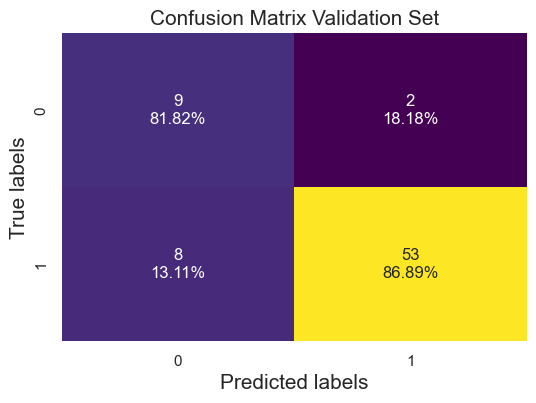

 estimator: 3 depth: 8 val score:0.9166666666666666
 estimator: 3 depth: 8 train score:0.9753521126760564
Classification Report:
              precision    recall  f1-score   support

         0.0       0.86      0.55      0.67        11
         1.0       0.92      0.98      0.95        61

    accuracy                           0.92        72
   macro avg       0.89      0.76      0.81        72
weighted avg       0.91      0.92      0.91        72



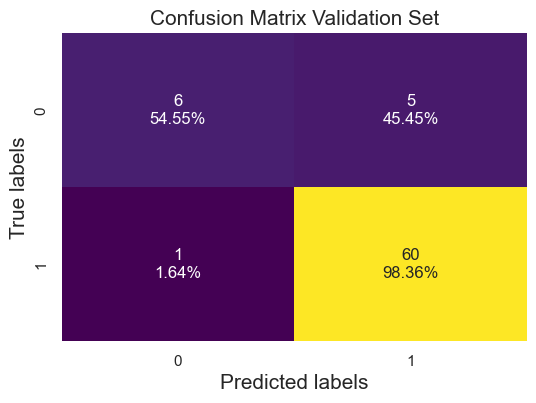

 estimator: 4 depth: 8 val score:0.9583333333333334
 estimator: 4 depth: 8 train score:0.9859154929577465
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



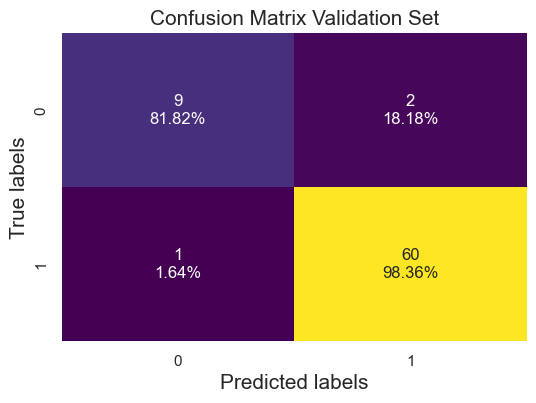

 estimator: 5 depth: 8 val score:0.9444444444444444
 estimator: 5 depth: 8 train score:0.9894366197183099
Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.95      0.98      0.97        61

    accuracy                           0.94        72
   macro avg       0.92      0.86      0.88        72
weighted avg       0.94      0.94      0.94        72



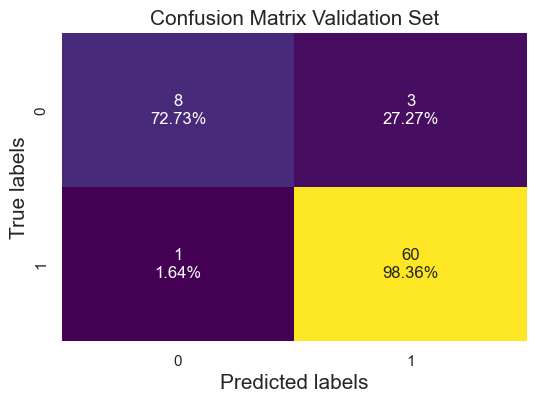

 estimator: 6 depth: 8 val score:0.9722222222222222
 estimator: 6 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



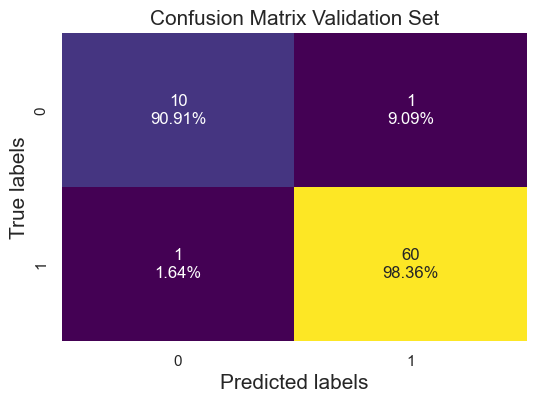

 estimator: 7 depth: 8 val score:0.9861111111111112
 estimator: 7 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



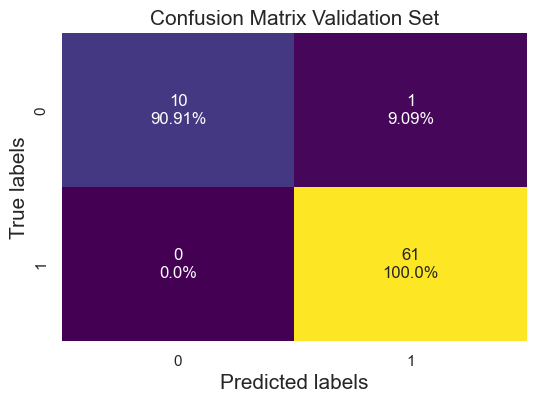

 estimator: 8 depth: 8 val score:0.9861111111111112
 estimator: 8 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



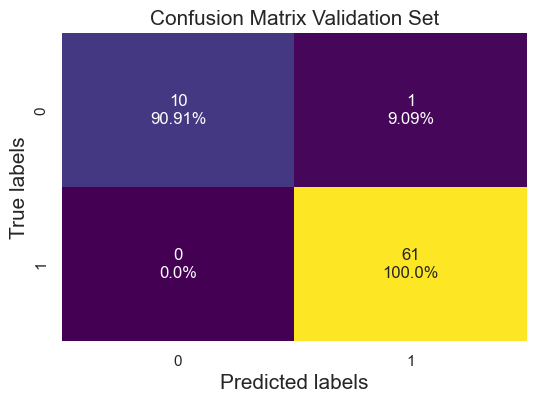

 estimator: 9 depth: 8 val score:0.9722222222222222
 estimator: 9 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



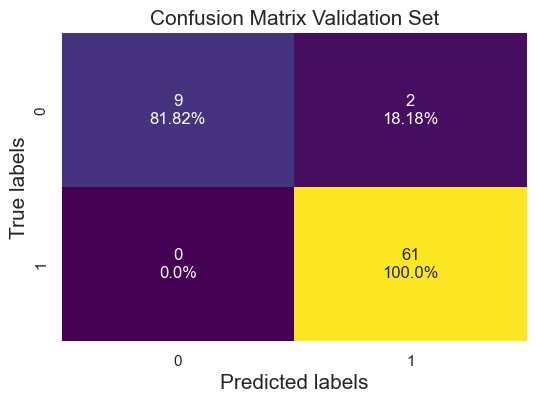

 estimator: 10 depth: 8 val score:0.9722222222222222
 estimator: 10 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



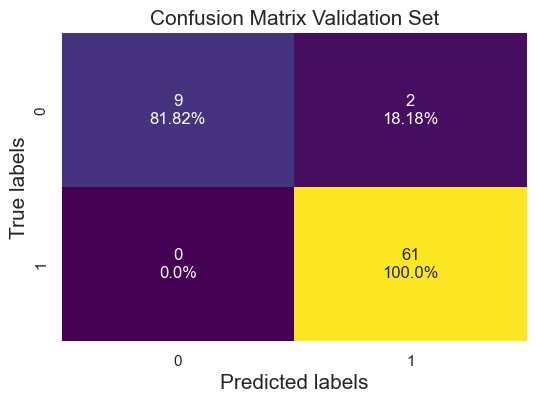

 estimator: 11 depth: 8 val score:0.9722222222222222
 estimator: 11 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



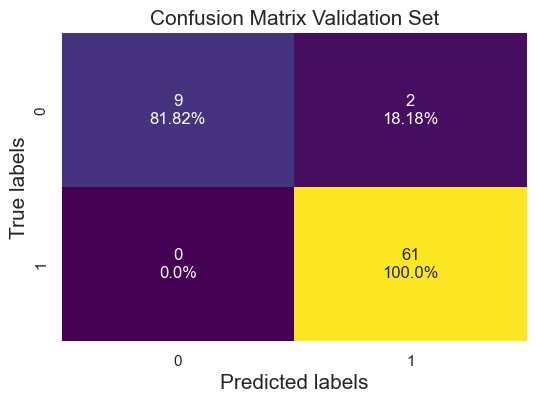

 estimator: 12 depth: 8 val score:0.9722222222222222
 estimator: 12 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



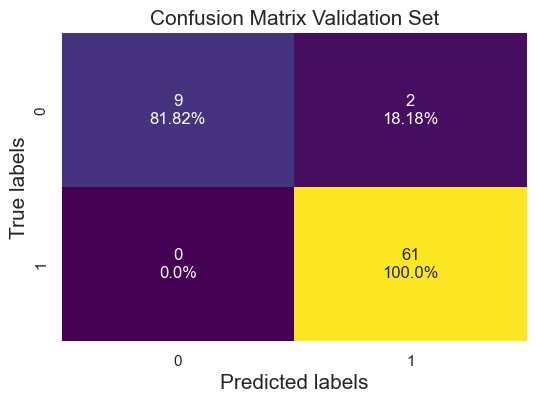

 estimator: 13 depth: 8 val score:0.9722222222222222
 estimator: 13 depth: 8 train score:0.9964788732394366
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



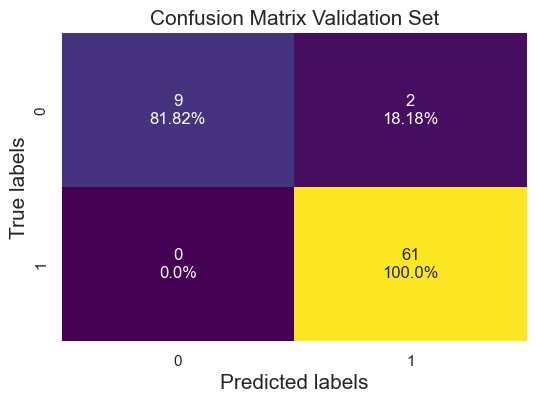

 estimator: 14 depth: 8 val score:0.9722222222222222
 estimator: 14 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



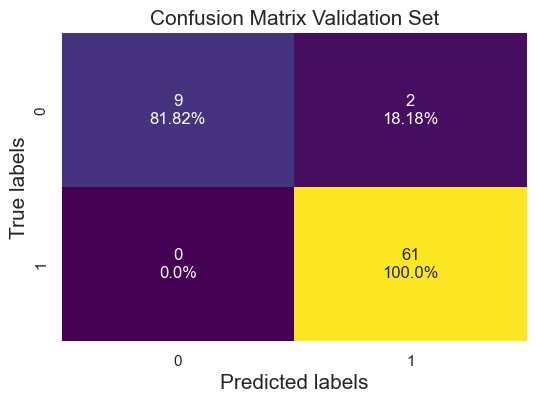

 estimator: 15 depth: 8 val score:0.9722222222222222
 estimator: 15 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



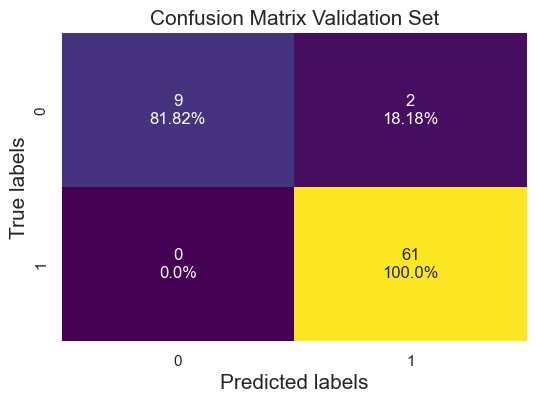

 estimator: 16 depth: 8 val score:0.9722222222222222
 estimator: 16 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



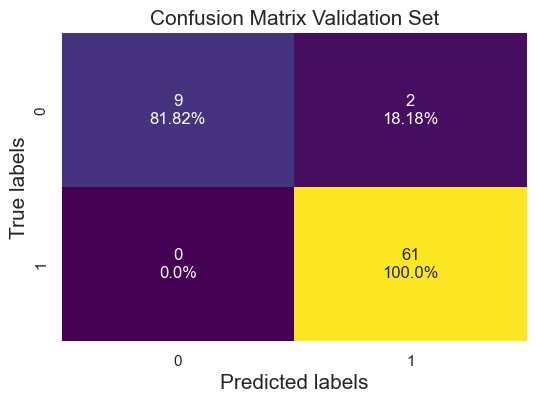

 estimator: 17 depth: 8 val score:0.9722222222222222
 estimator: 17 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



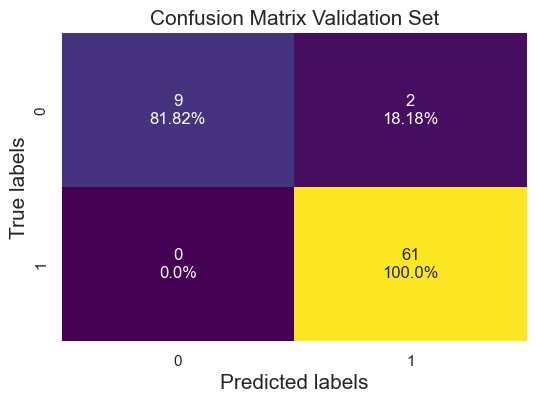

 estimator: 18 depth: 8 val score:0.9722222222222222
 estimator: 18 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



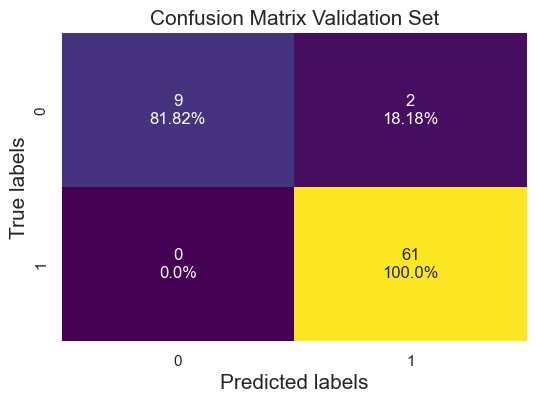

 estimator: 19 depth: 8 val score:0.9722222222222222
 estimator: 19 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



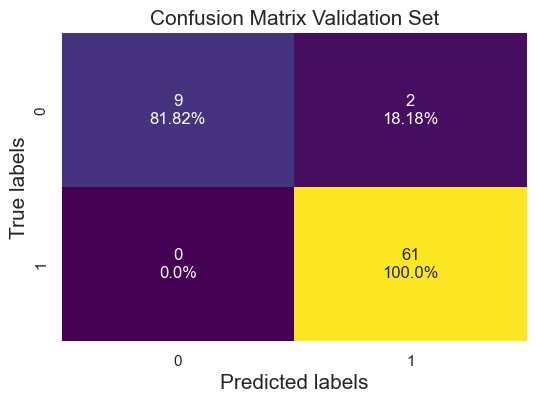

 estimator: 20 depth: 8 val score:0.9722222222222222
 estimator: 20 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



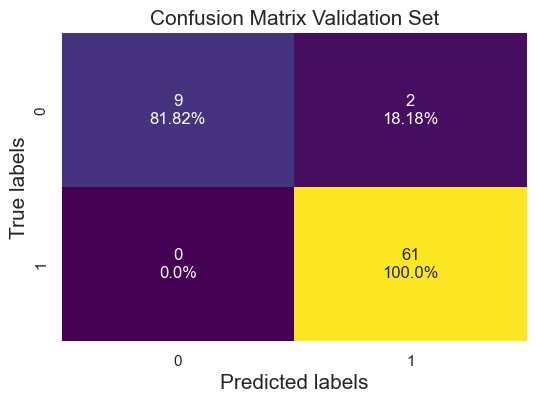

 estimator: 21 depth: 8 val score:0.9722222222222222
 estimator: 21 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



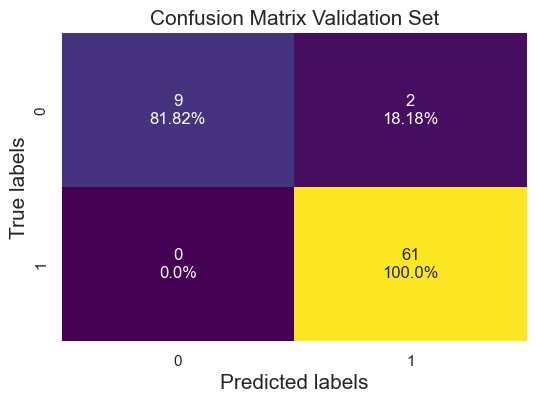

 estimator: 22 depth: 8 val score:0.9722222222222222
 estimator: 22 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



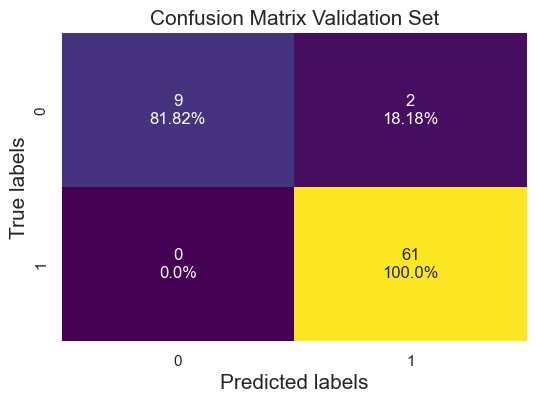

 estimator: 23 depth: 8 val score:0.9722222222222222
 estimator: 23 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



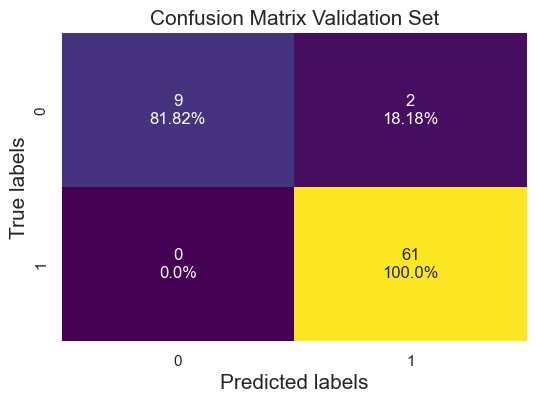

 estimator: 24 depth: 8 val score:0.9722222222222222
 estimator: 24 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



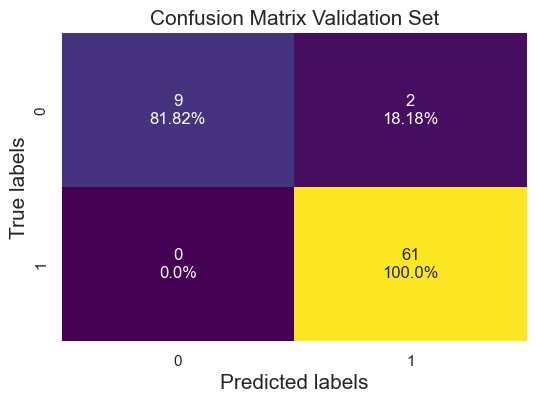

 estimator: 25 depth: 8 val score:0.9722222222222222
 estimator: 25 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



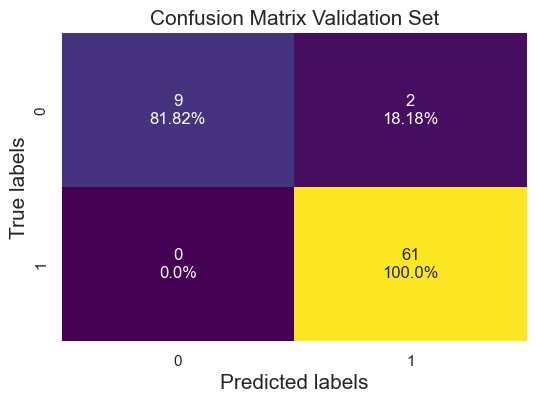

 estimator: 26 depth: 8 val score:0.9722222222222222
 estimator: 26 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



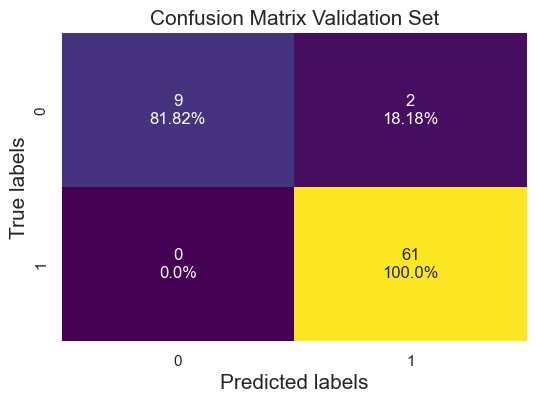

 estimator: 27 depth: 8 val score:0.9722222222222222
 estimator: 27 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



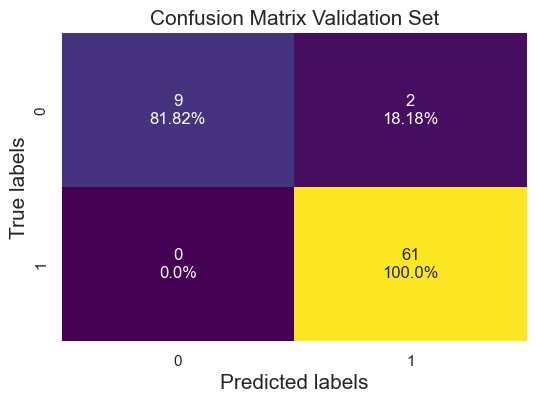

 estimator: 28 depth: 8 val score:0.9722222222222222
 estimator: 28 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



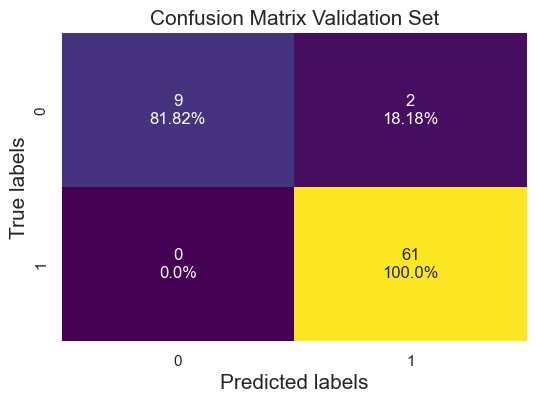

 estimator: 29 depth: 8 val score:0.9722222222222222
 estimator: 29 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



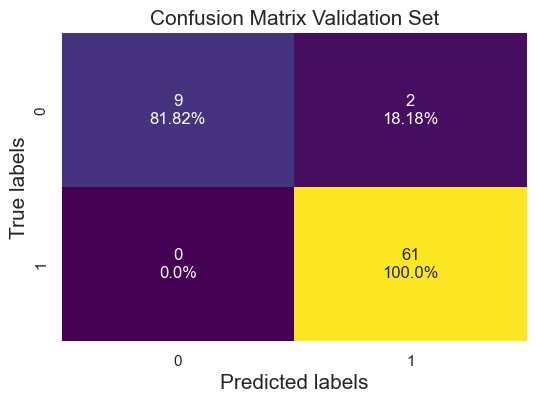

 estimator: 30 depth: 8 val score:0.9722222222222222
 estimator: 30 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



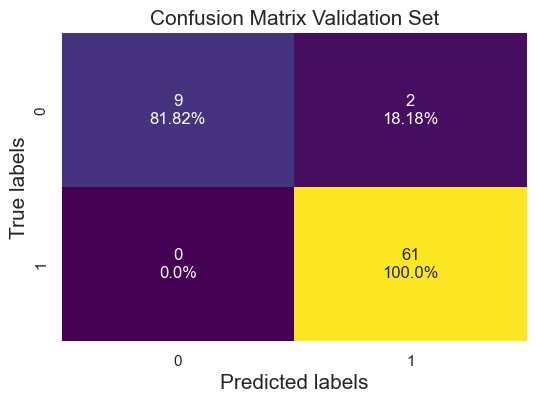

 estimator: 31 depth: 8 val score:0.9722222222222222
 estimator: 31 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



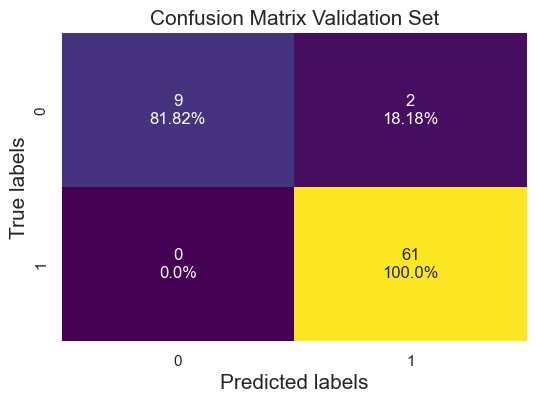

 estimator: 32 depth: 8 val score:0.9722222222222222
 estimator: 32 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



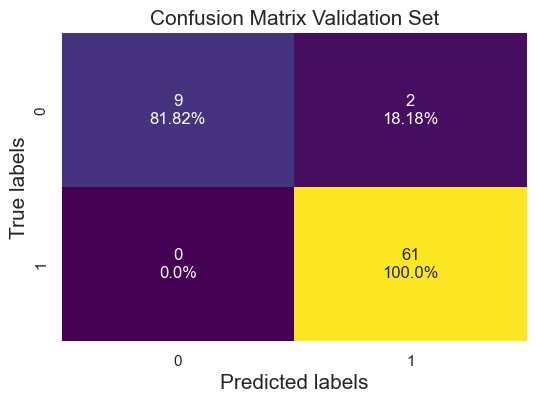

 estimator: 33 depth: 8 val score:0.9722222222222222
 estimator: 33 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



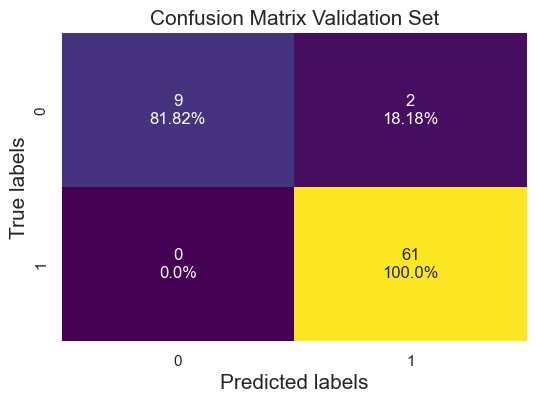

 estimator: 34 depth: 8 val score:0.9722222222222222
 estimator: 34 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



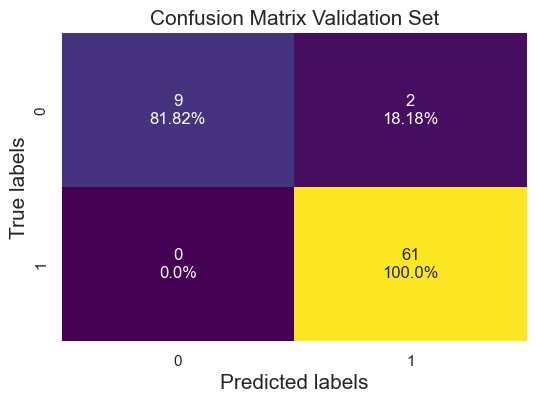

 estimator: 35 depth: 8 val score:0.9722222222222222
 estimator: 35 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



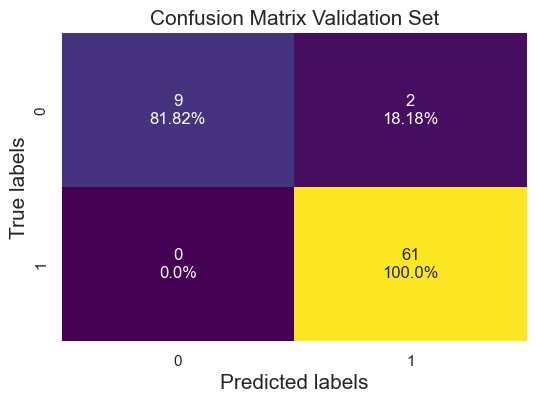

 estimator: 36 depth: 8 val score:0.9583333333333334
 estimator: 36 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



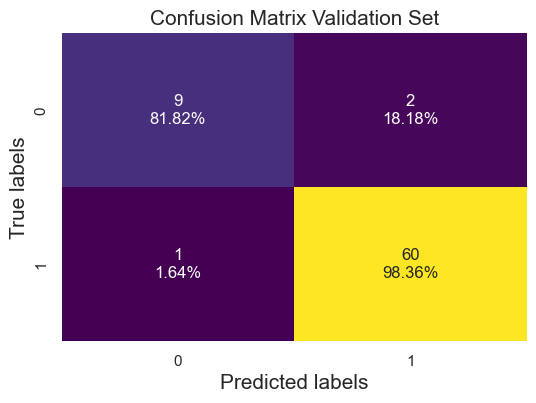

 estimator: 37 depth: 8 val score:0.9583333333333334
 estimator: 37 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



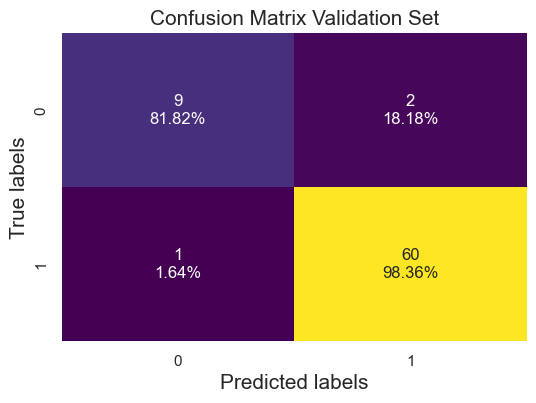

 estimator: 38 depth: 8 val score:0.9583333333333334
 estimator: 38 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



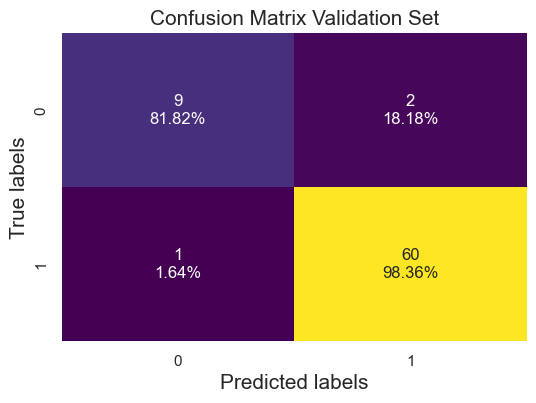

 estimator: 39 depth: 8 val score:0.9583333333333334
 estimator: 39 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



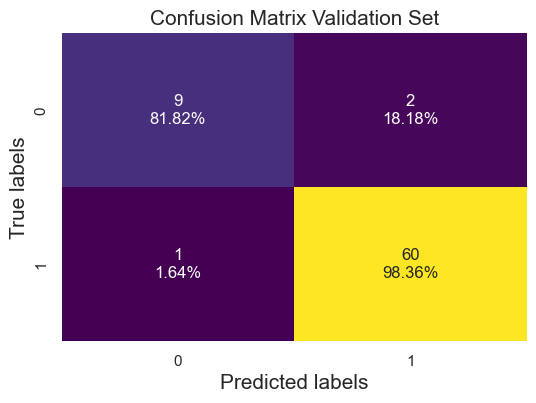

 estimator: 40 depth: 8 val score:0.9583333333333334
 estimator: 40 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



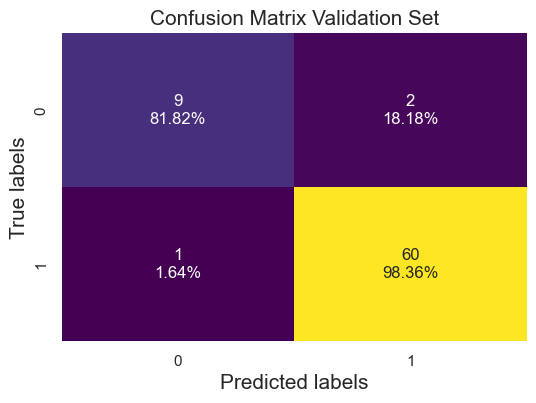

 estimator: 41 depth: 8 val score:0.9583333333333334
 estimator: 41 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



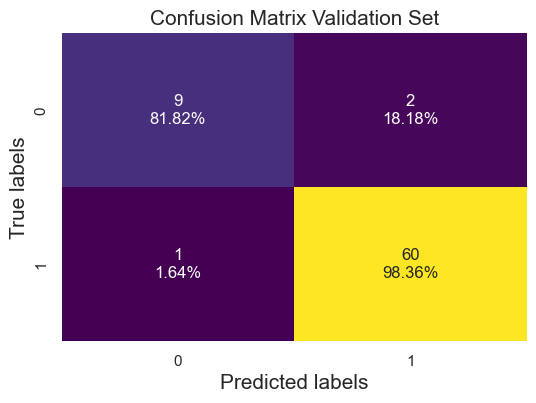

 estimator: 42 depth: 8 val score:0.9583333333333334
 estimator: 42 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



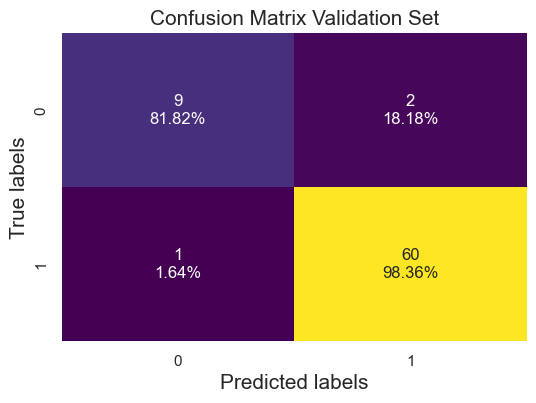

 estimator: 43 depth: 8 val score:0.9583333333333334
 estimator: 43 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



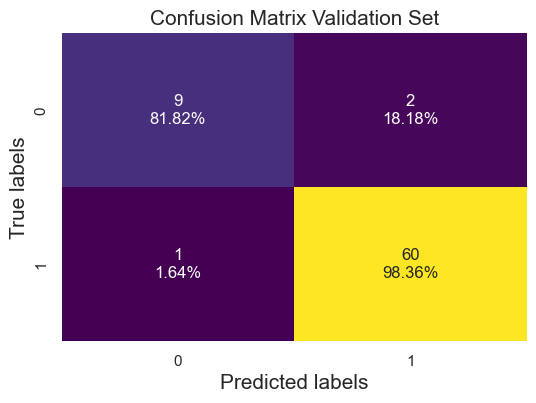

 estimator: 44 depth: 8 val score:0.9583333333333334
 estimator: 44 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



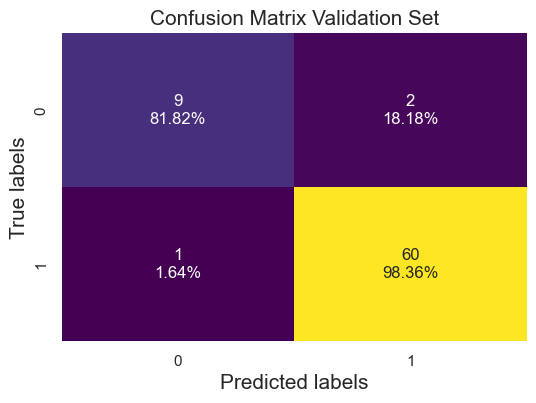

 estimator: 45 depth: 8 val score:0.9583333333333334
 estimator: 45 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



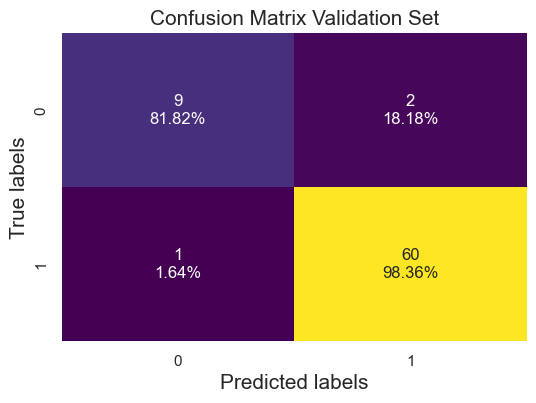

 estimator: 46 depth: 8 val score:0.9583333333333334
 estimator: 46 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



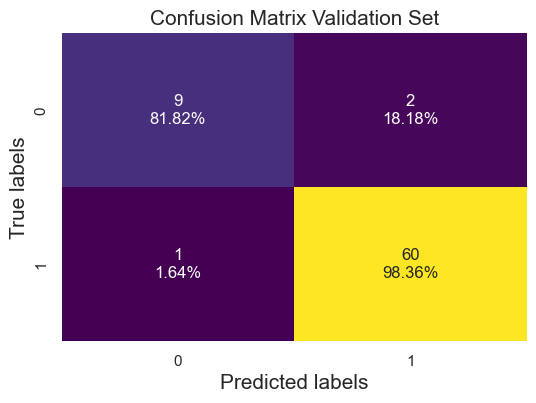

 estimator: 47 depth: 8 val score:0.9583333333333334
 estimator: 47 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



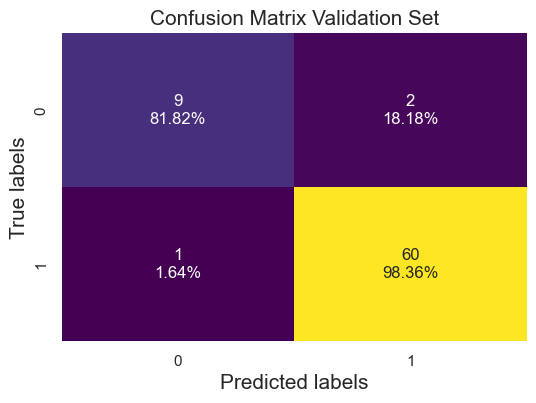

 estimator: 48 depth: 8 val score:0.9583333333333334
 estimator: 48 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



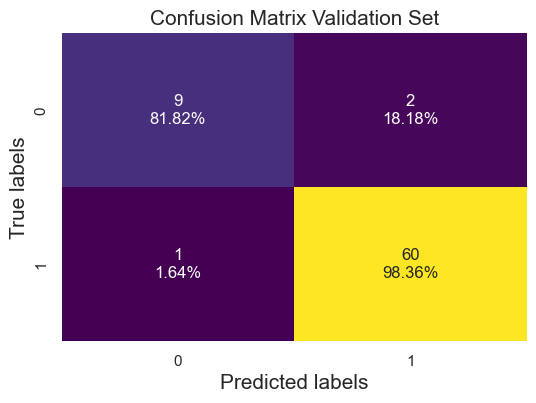

 estimator: 49 depth: 8 val score:0.9583333333333334
 estimator: 49 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



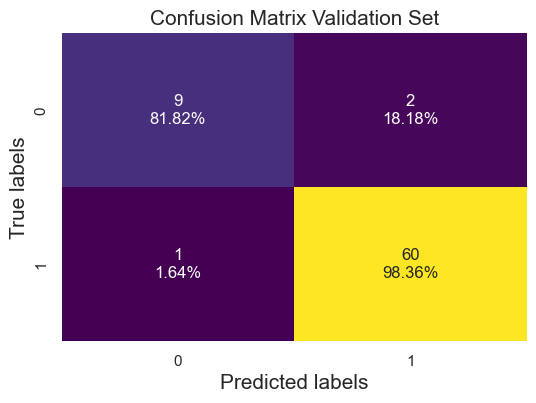

 estimator: 50 depth: 8 val score:0.9583333333333334
 estimator: 50 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



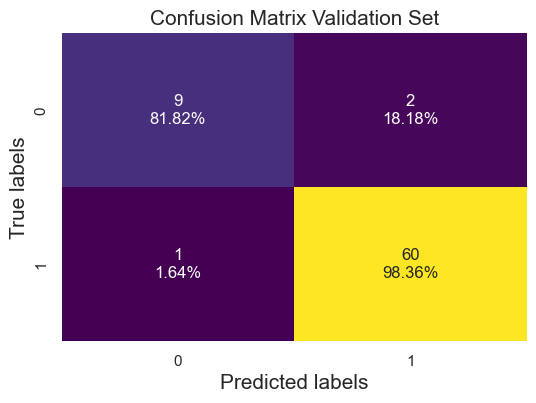

 estimator: 51 depth: 8 val score:0.9722222222222222
 estimator: 51 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



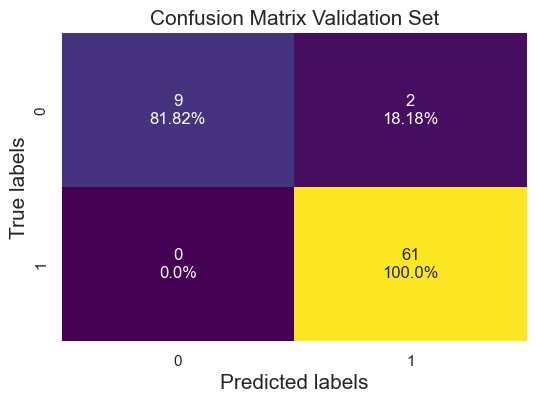

 estimator: 52 depth: 8 val score:0.9722222222222222
 estimator: 52 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



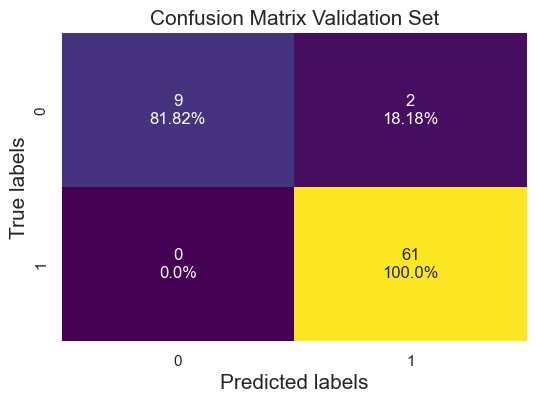

 estimator: 53 depth: 8 val score:0.9722222222222222
 estimator: 53 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



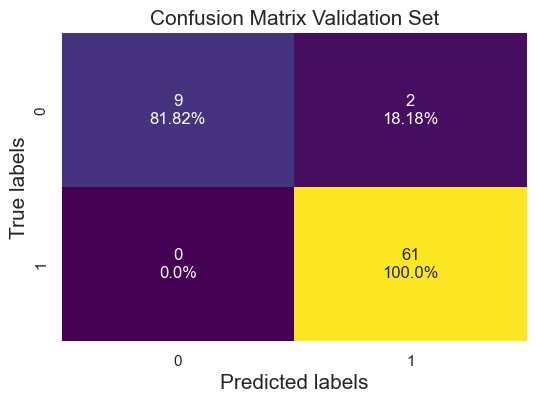

 estimator: 54 depth: 8 val score:0.9722222222222222
 estimator: 54 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



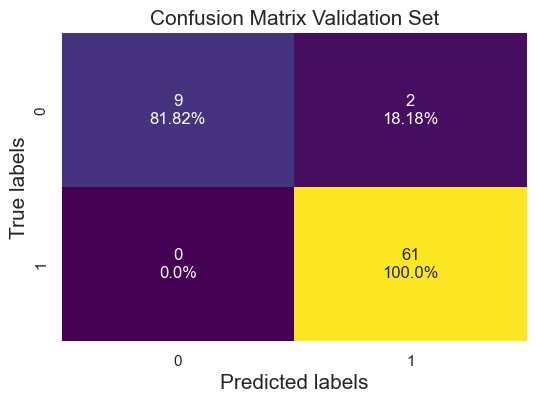

 estimator: 55 depth: 8 val score:0.9722222222222222
 estimator: 55 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



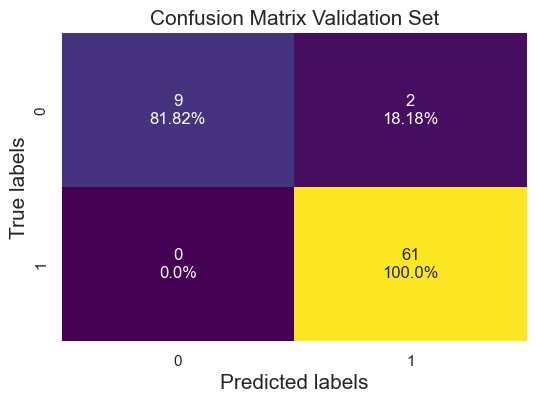

 estimator: 56 depth: 8 val score:0.9722222222222222
 estimator: 56 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



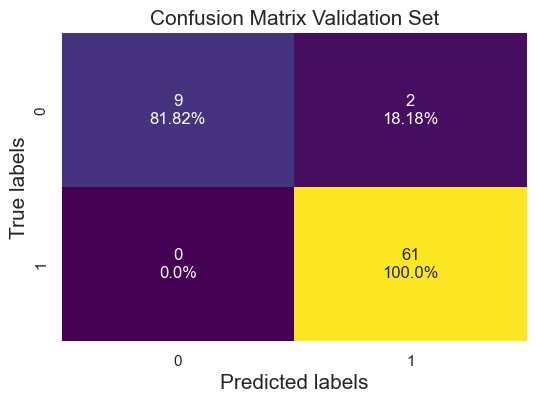

 estimator: 57 depth: 8 val score:0.9722222222222222
 estimator: 57 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



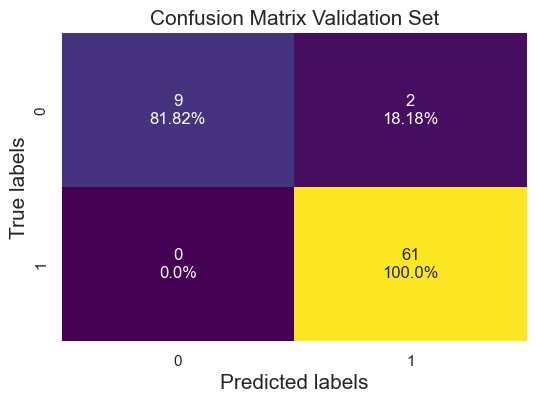

 estimator: 58 depth: 8 val score:0.9722222222222222
 estimator: 58 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



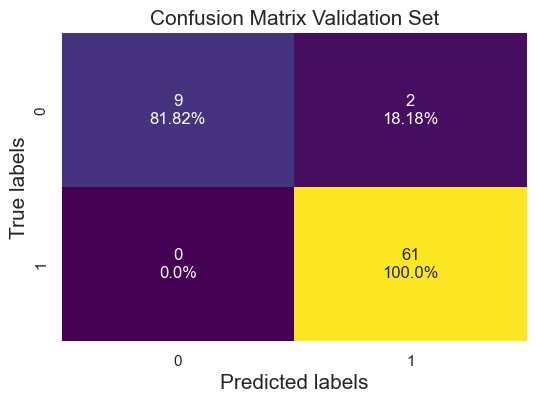

 estimator: 59 depth: 8 val score:0.9722222222222222
 estimator: 59 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



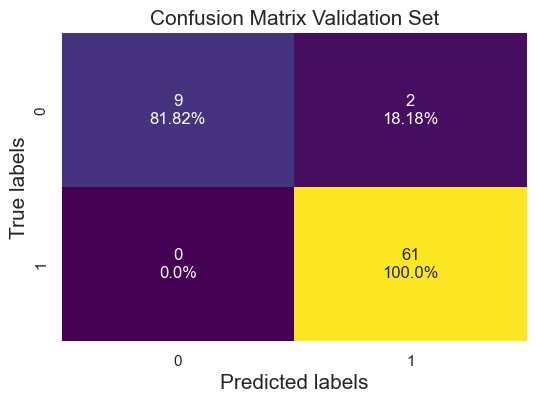

 estimator: 60 depth: 8 val score:0.9722222222222222
 estimator: 60 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



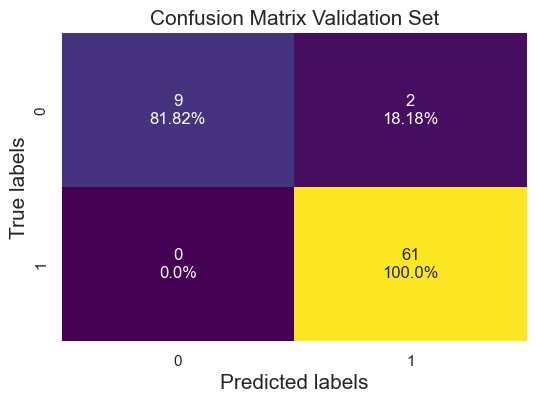

 estimator: 61 depth: 8 val score:0.9722222222222222
 estimator: 61 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



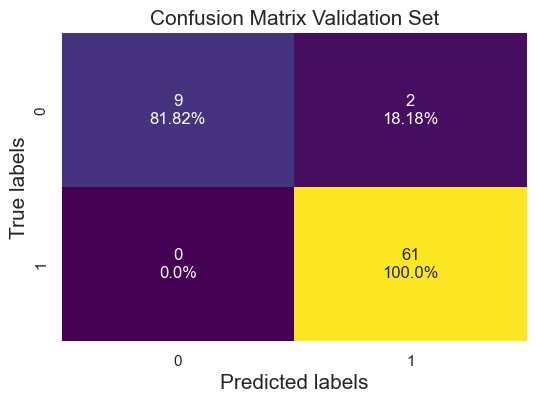

 estimator: 62 depth: 8 val score:0.9722222222222222
 estimator: 62 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



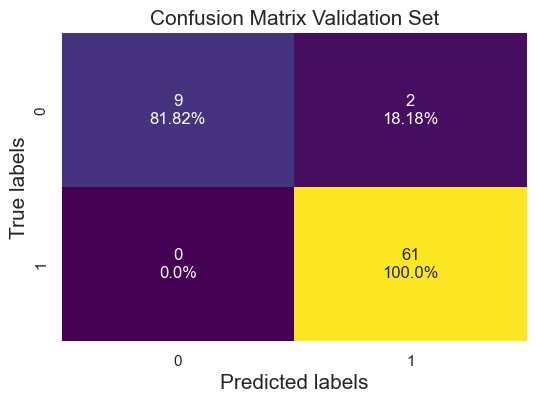

 estimator: 63 depth: 8 val score:0.9722222222222222
 estimator: 63 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



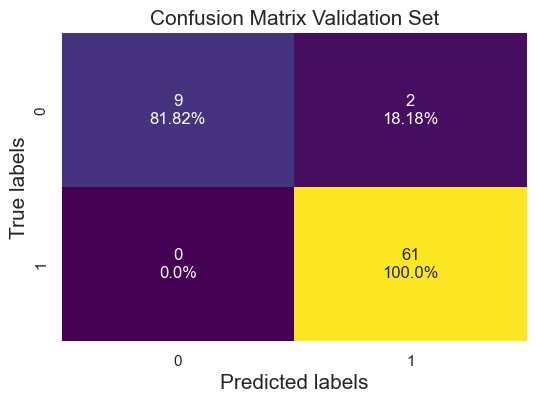

 estimator: 64 depth: 8 val score:0.9722222222222222
 estimator: 64 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



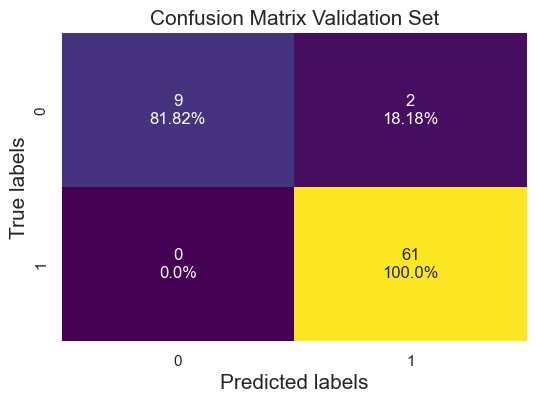

 estimator: 65 depth: 8 val score:0.9722222222222222
 estimator: 65 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



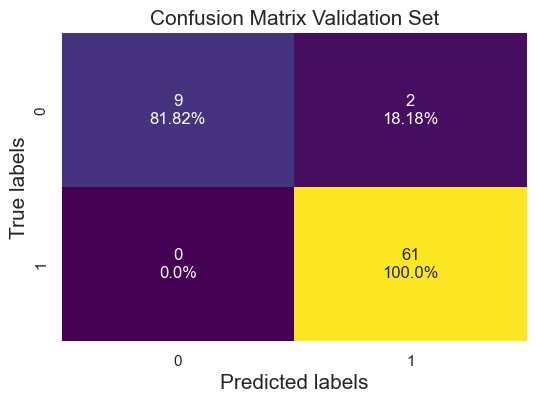

 estimator: 66 depth: 8 val score:0.9722222222222222
 estimator: 66 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



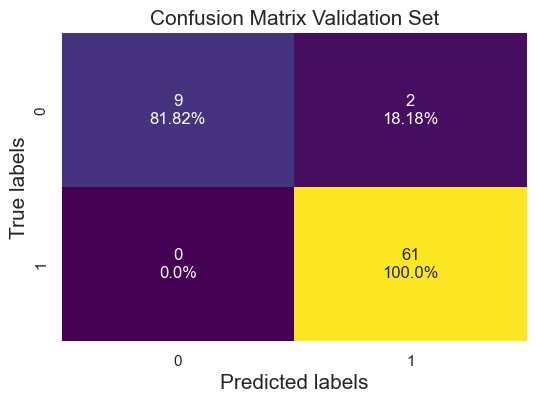

 estimator: 67 depth: 8 val score:0.9722222222222222
 estimator: 67 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



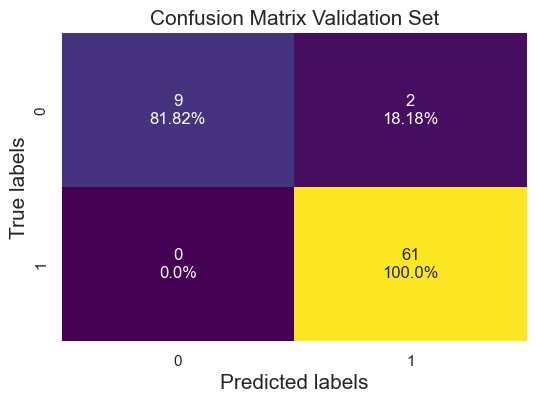

 estimator: 68 depth: 8 val score:0.9722222222222222
 estimator: 68 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



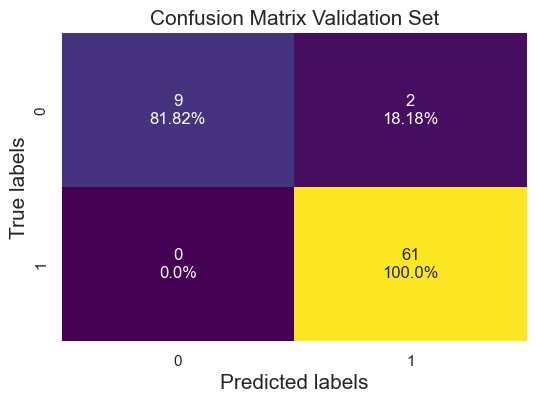

 estimator: 69 depth: 8 val score:0.9722222222222222
 estimator: 69 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



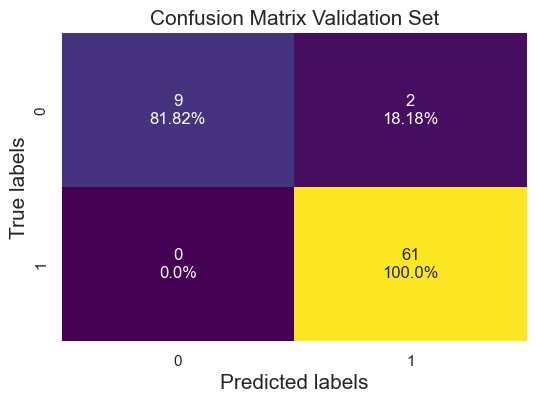

 estimator: 70 depth: 8 val score:0.9722222222222222
 estimator: 70 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



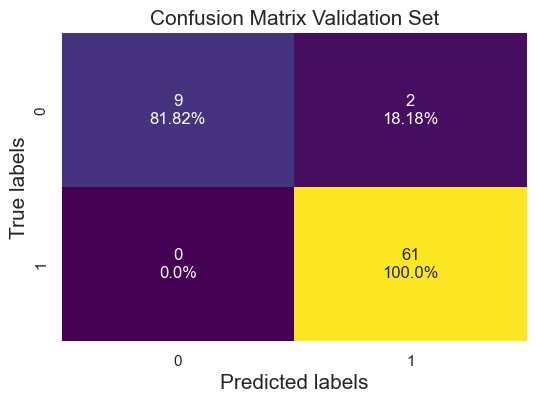

 estimator: 71 depth: 8 val score:0.9722222222222222
 estimator: 71 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



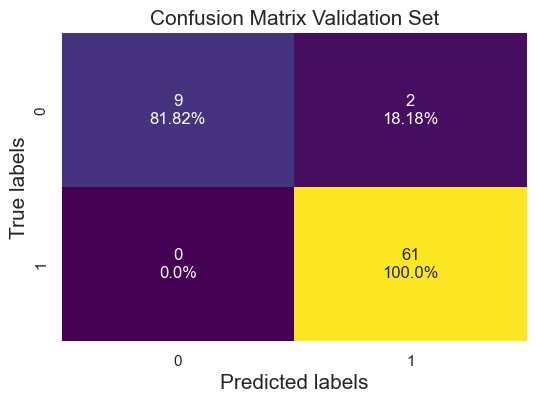

 estimator: 72 depth: 8 val score:0.9583333333333334
 estimator: 72 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



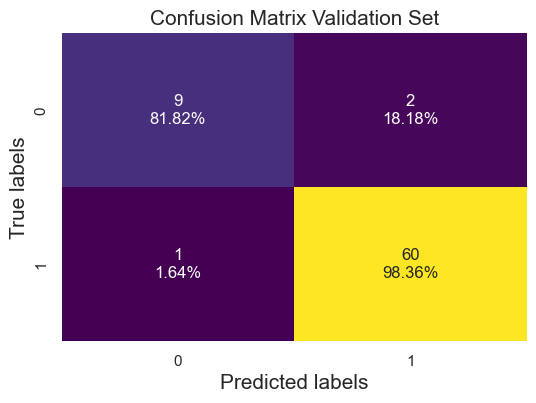

 estimator: 73 depth: 8 val score:0.9583333333333334
 estimator: 73 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



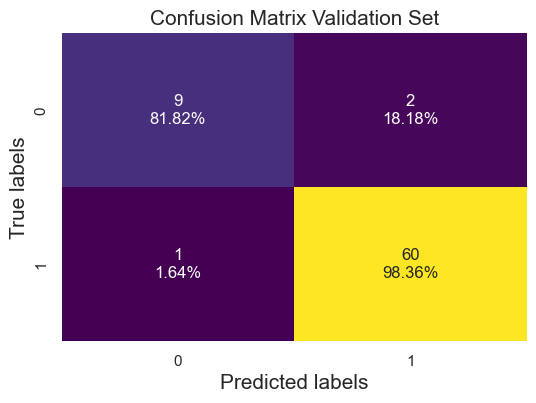

 estimator: 74 depth: 8 val score:0.9583333333333334
 estimator: 74 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



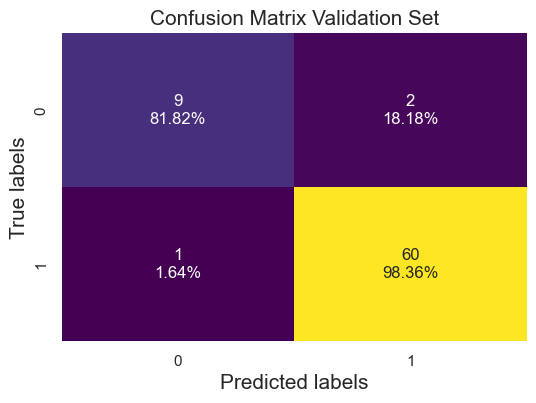

 estimator: 75 depth: 8 val score:0.9583333333333334
 estimator: 75 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



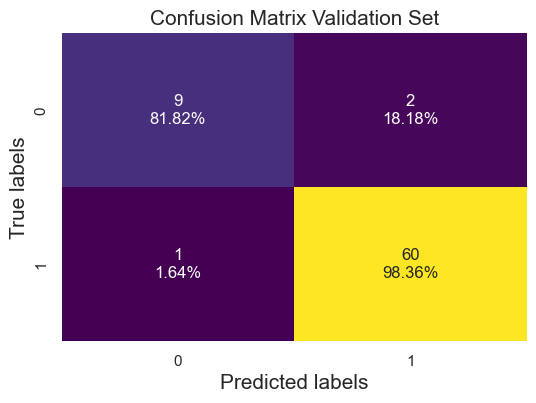

 estimator: 76 depth: 8 val score:0.9583333333333334
 estimator: 76 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



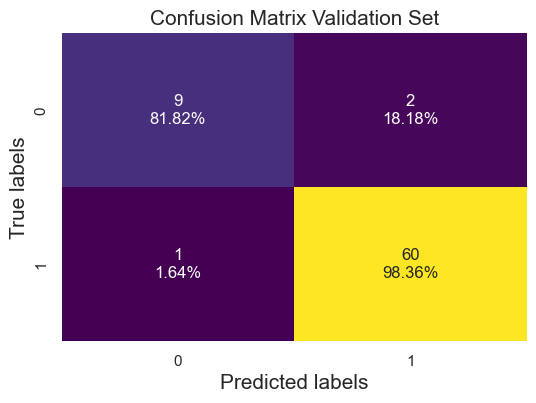

 estimator: 77 depth: 8 val score:0.9583333333333334
 estimator: 77 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



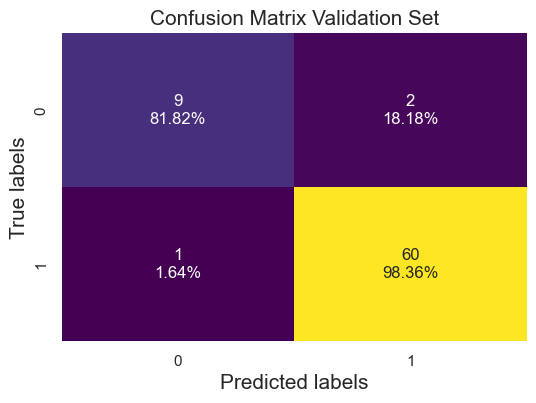

 estimator: 78 depth: 8 val score:0.9583333333333334
 estimator: 78 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



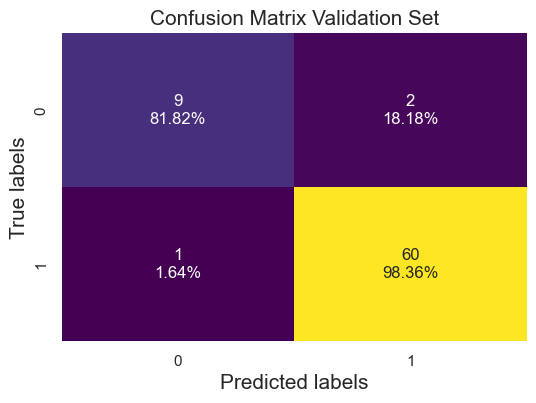

 estimator: 79 depth: 8 val score:0.9583333333333334
 estimator: 79 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



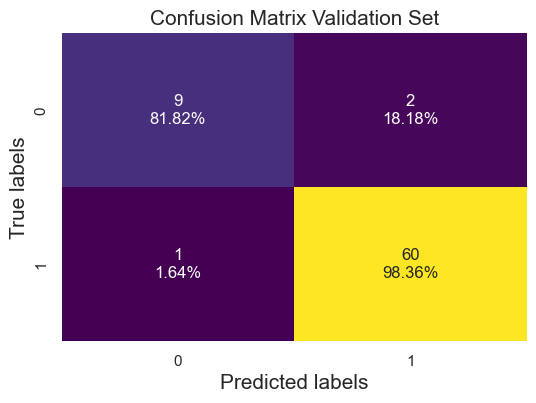

 estimator: 80 depth: 8 val score:0.9583333333333334
 estimator: 80 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



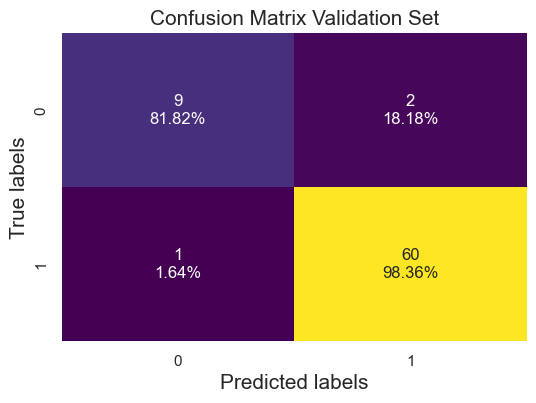

 estimator: 81 depth: 8 val score:0.9583333333333334
 estimator: 81 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



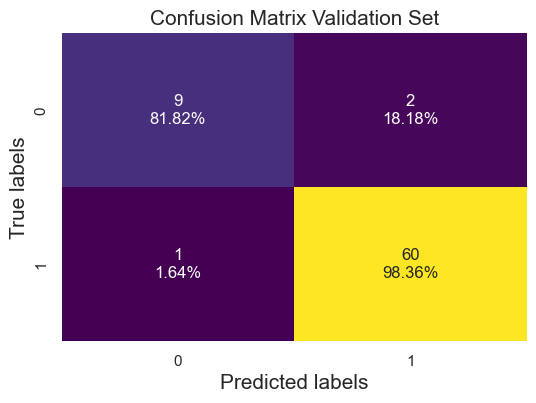

 estimator: 82 depth: 8 val score:0.9583333333333334
 estimator: 82 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



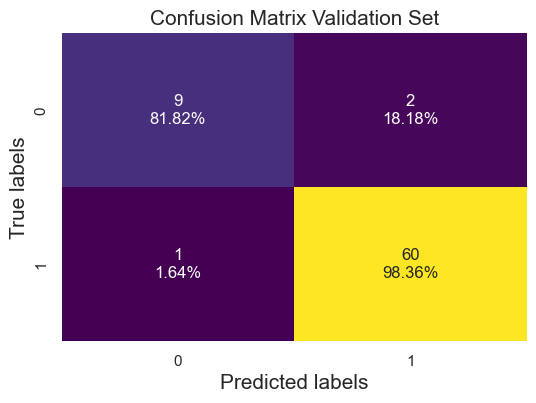

 estimator: 83 depth: 8 val score:0.9722222222222222
 estimator: 83 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        11
         1.0       0.97      1.00      0.98        61

    accuracy                           0.97        72
   macro avg       0.98      0.91      0.94        72
weighted avg       0.97      0.97      0.97        72



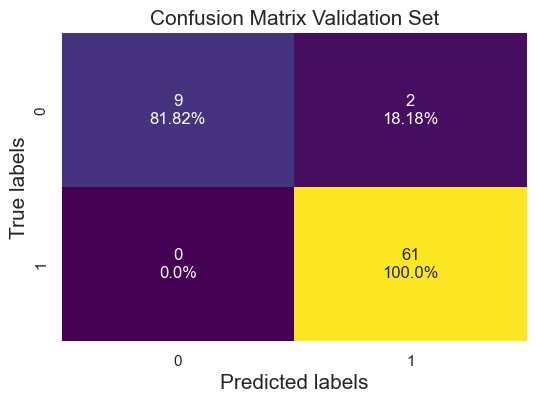

 estimator: 84 depth: 8 val score:0.9583333333333334
 estimator: 84 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



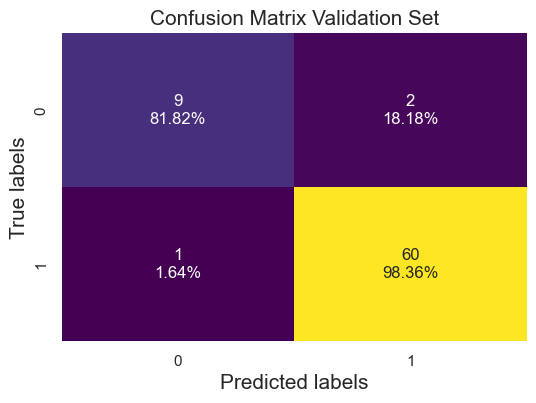

 estimator: 85 depth: 8 val score:0.9583333333333334
 estimator: 85 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



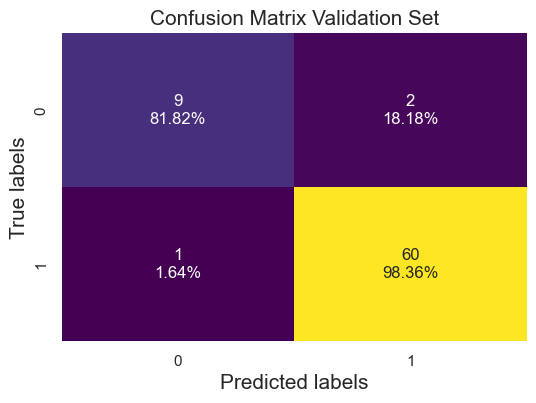

 estimator: 86 depth: 8 val score:0.9583333333333334
 estimator: 86 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



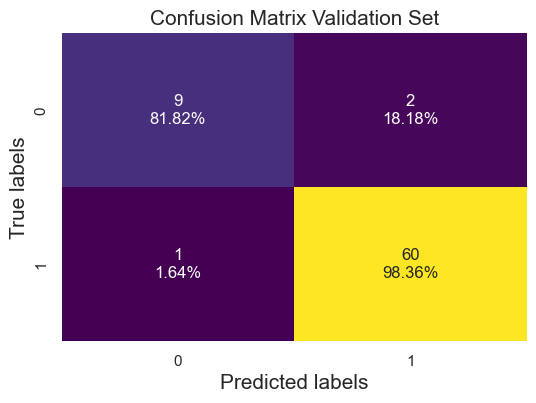

 estimator: 87 depth: 8 val score:0.9583333333333334
 estimator: 87 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



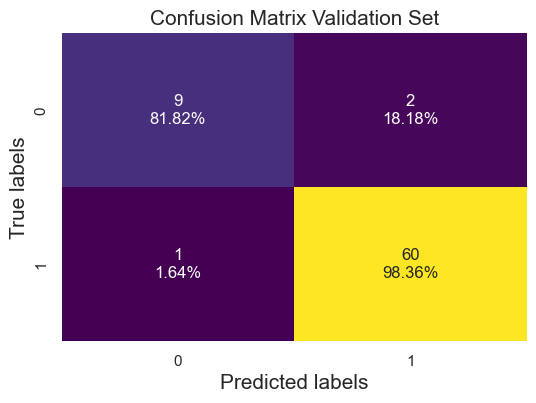

 estimator: 88 depth: 8 val score:0.9583333333333334
 estimator: 88 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



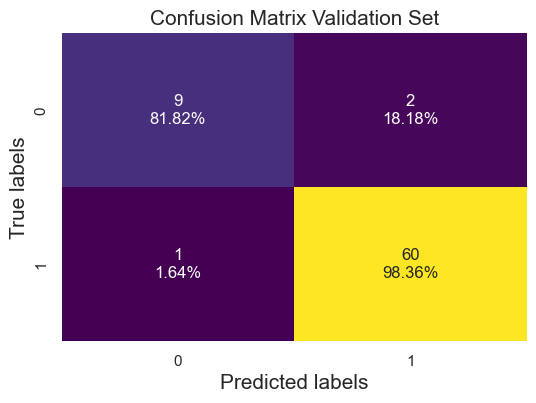

 estimator: 89 depth: 8 val score:0.9583333333333334
 estimator: 89 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



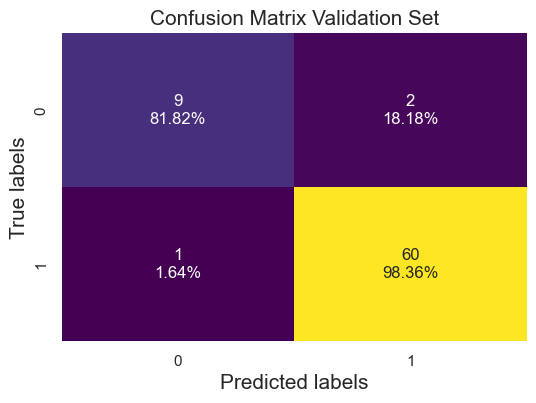

 estimator: 90 depth: 8 val score:0.9583333333333334
 estimator: 90 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



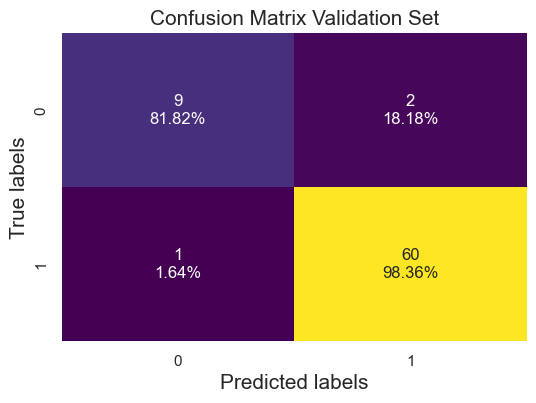

 estimator: 91 depth: 8 val score:0.9583333333333334
 estimator: 91 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



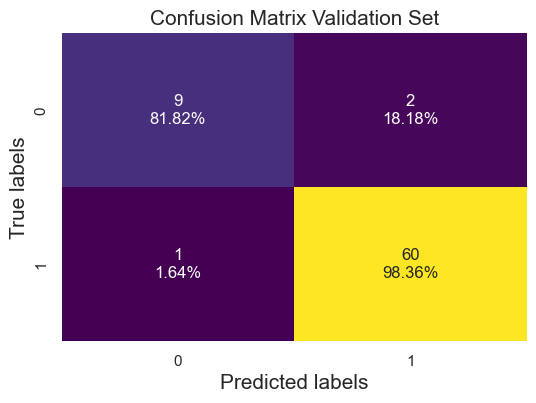

 estimator: 92 depth: 8 val score:0.9583333333333334
 estimator: 92 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



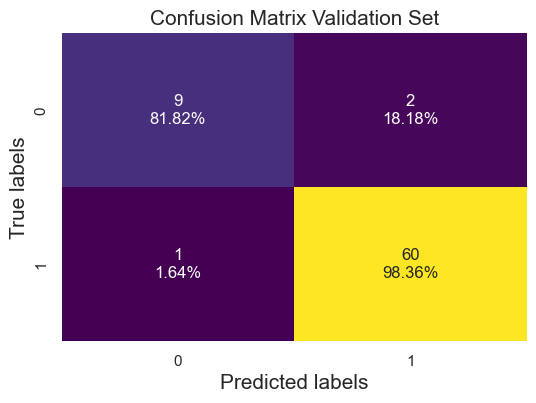

 estimator: 93 depth: 8 val score:0.9583333333333334
 estimator: 93 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



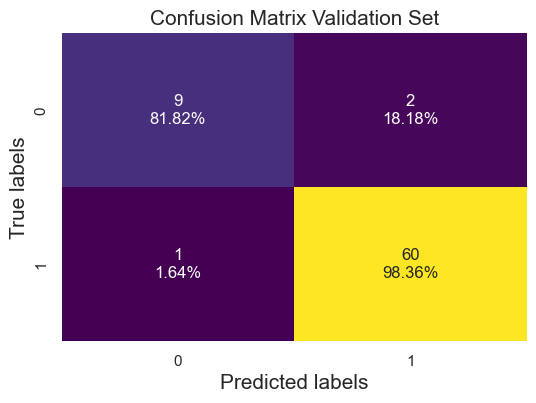

 estimator: 94 depth: 8 val score:0.9583333333333334
 estimator: 94 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



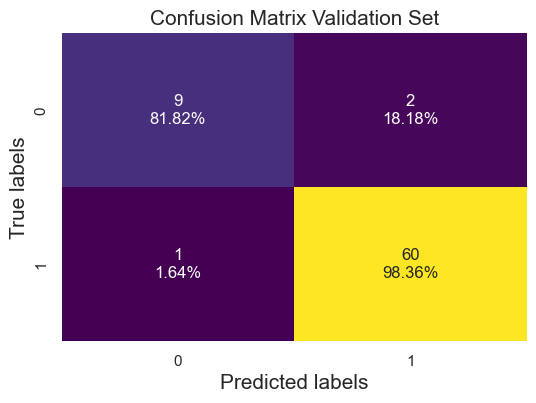

 estimator: 95 depth: 8 val score:0.9583333333333334
 estimator: 95 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



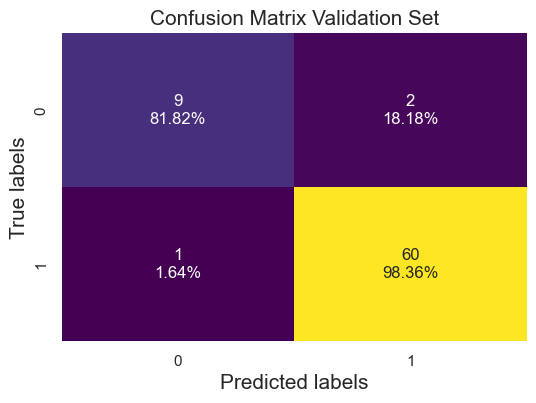

 estimator: 96 depth: 8 val score:0.9583333333333334
 estimator: 96 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



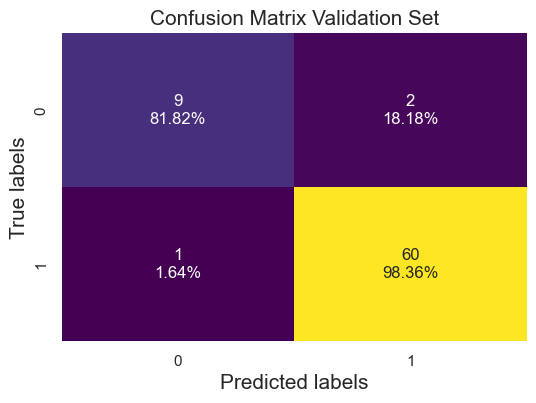

 estimator: 97 depth: 8 val score:0.9583333333333334
 estimator: 97 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



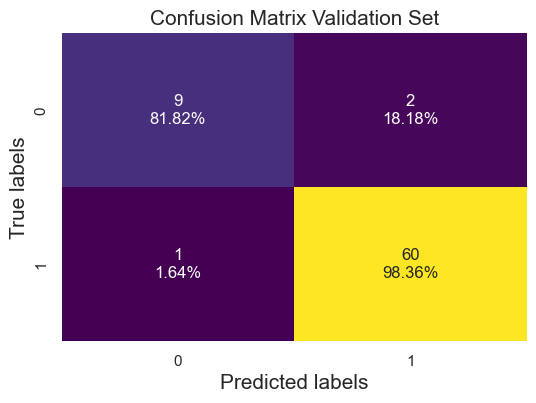

 estimator: 98 depth: 8 val score:0.9583333333333334
 estimator: 98 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



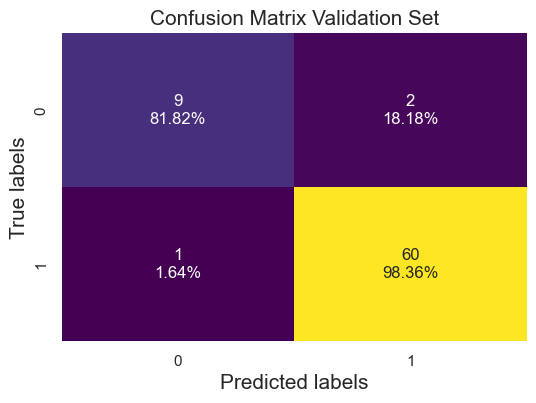

 estimator: 99 depth: 8 val score:0.9583333333333334
 estimator: 99 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



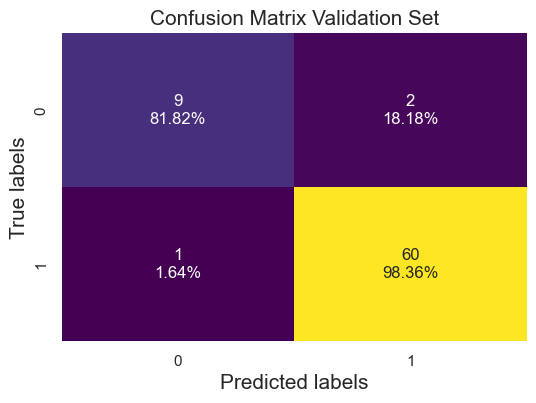

 estimator: 100 depth: 8 val score:0.9583333333333334
 estimator: 100 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



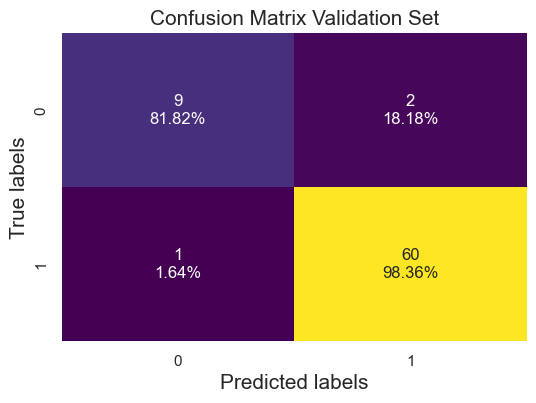

 estimator: 101 depth: 8 val score:0.9583333333333334
 estimator: 101 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



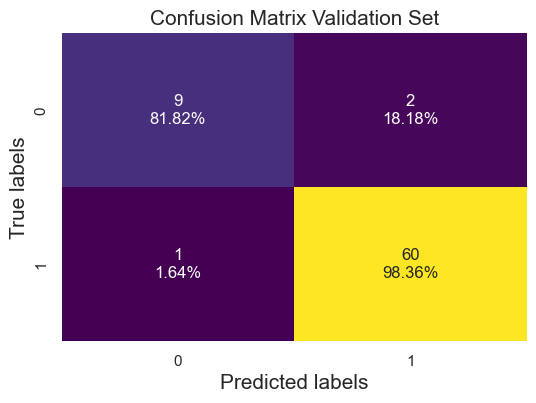

 estimator: 102 depth: 8 val score:0.9583333333333334
 estimator: 102 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



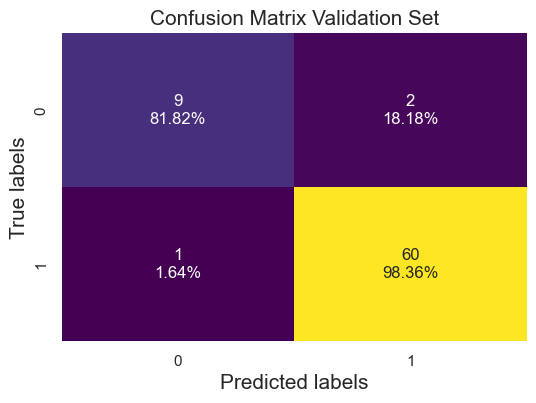

 estimator: 103 depth: 8 val score:0.9583333333333334
 estimator: 103 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



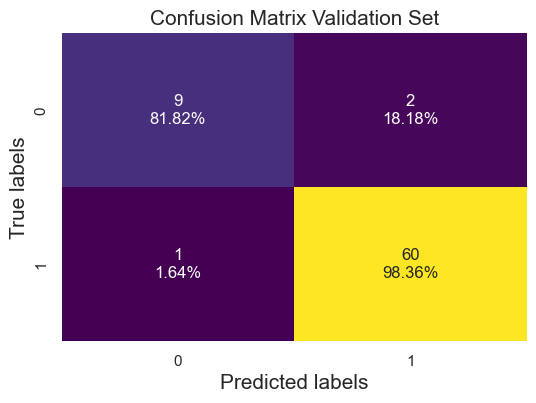

 estimator: 104 depth: 8 val score:0.9583333333333334
 estimator: 104 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



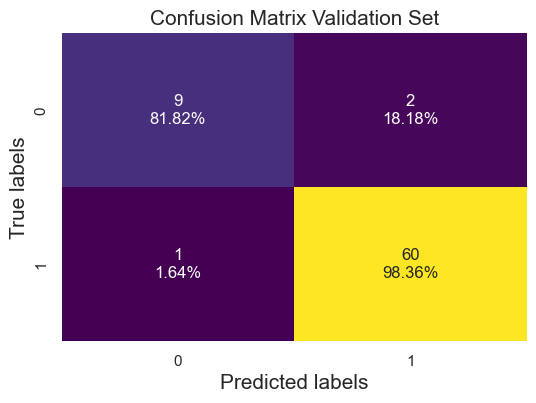

 estimator: 105 depth: 8 val score:0.9583333333333334
 estimator: 105 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



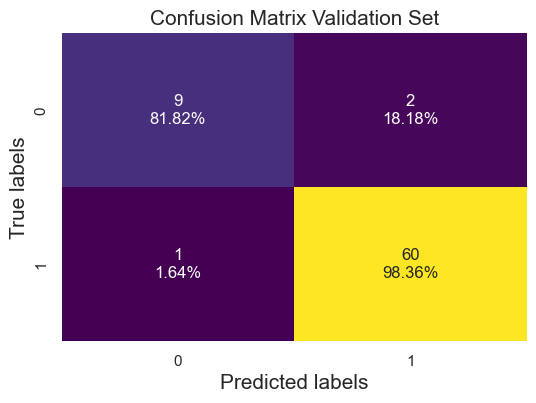

 estimator: 106 depth: 8 val score:0.9583333333333334
 estimator: 106 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



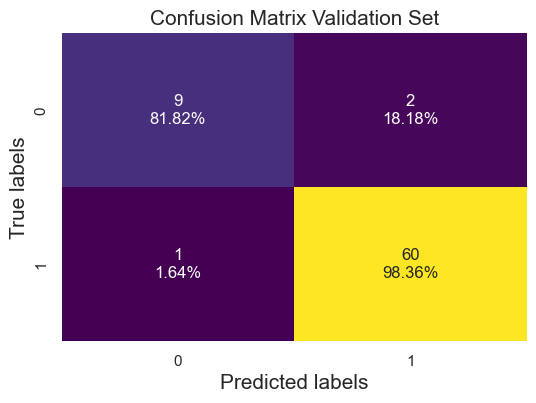

 estimator: 107 depth: 8 val score:0.9583333333333334
 estimator: 107 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



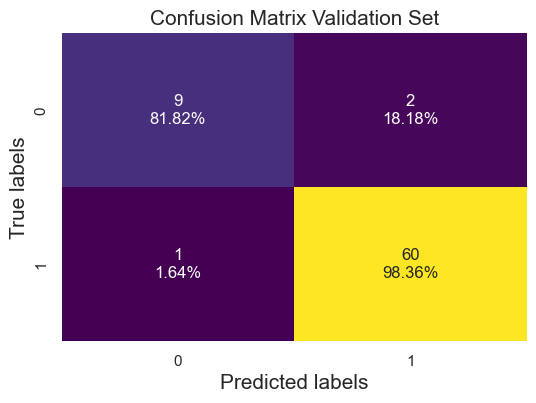

 estimator: 108 depth: 8 val score:0.9583333333333334
 estimator: 108 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



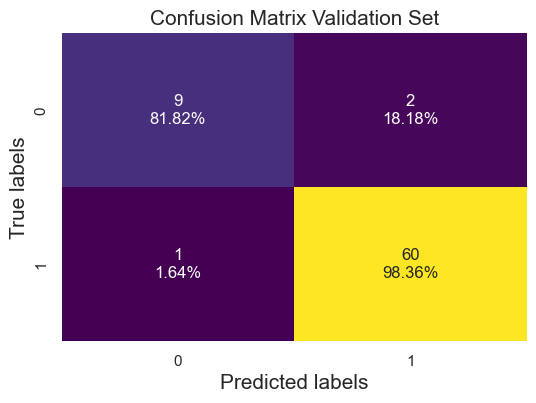

 estimator: 109 depth: 8 val score:0.9583333333333334
 estimator: 109 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



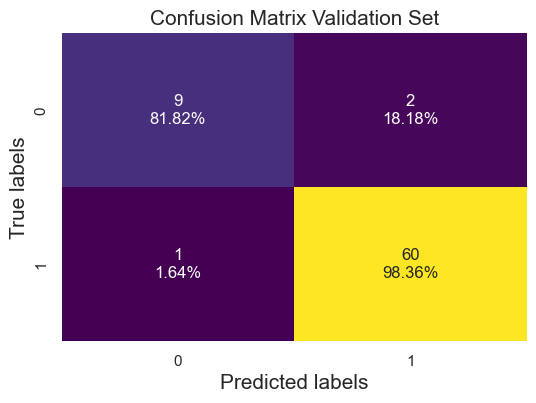

 estimator: 110 depth: 8 val score:0.9583333333333334
 estimator: 110 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



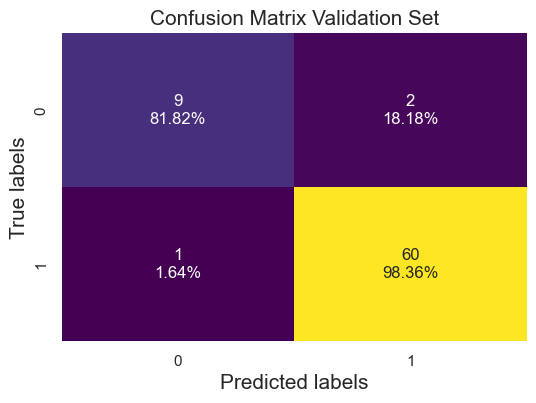

 estimator: 111 depth: 8 val score:0.9583333333333334
 estimator: 111 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



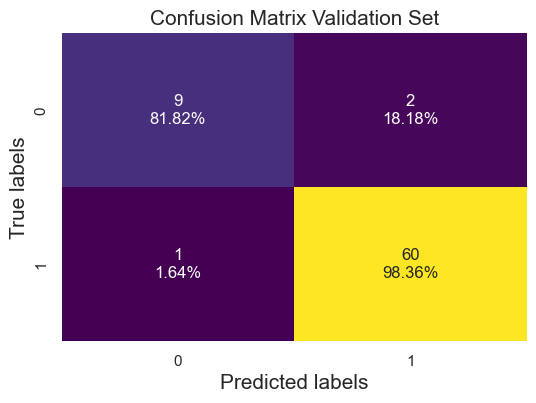

 estimator: 112 depth: 8 val score:0.9583333333333334
 estimator: 112 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



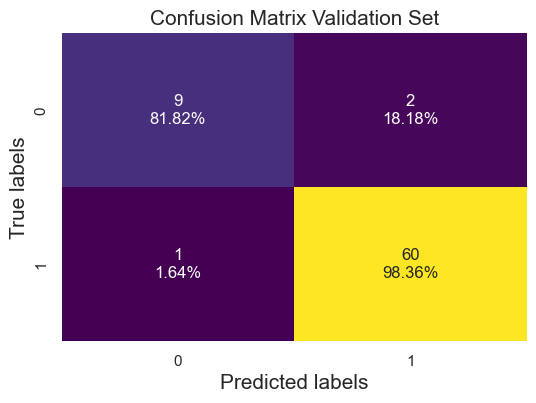

 estimator: 113 depth: 8 val score:0.9583333333333334
 estimator: 113 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



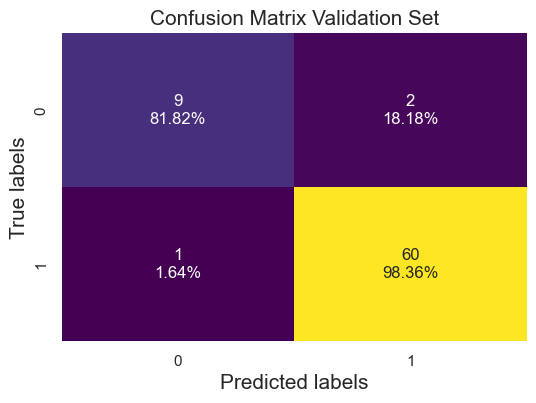

 estimator: 114 depth: 8 val score:0.9583333333333334
 estimator: 114 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



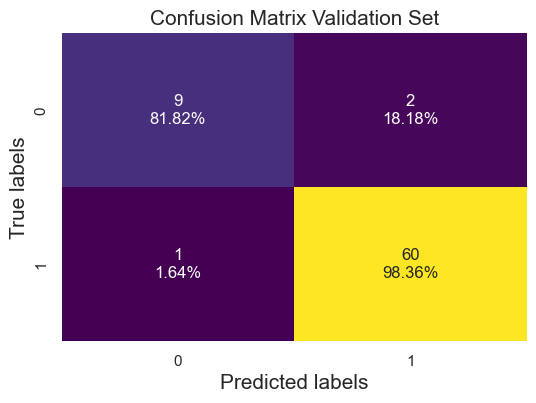

 estimator: 115 depth: 8 val score:0.9583333333333334
 estimator: 115 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



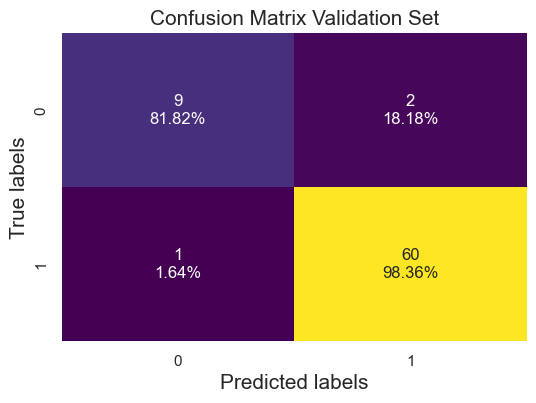

 estimator: 116 depth: 8 val score:0.9583333333333334
 estimator: 116 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



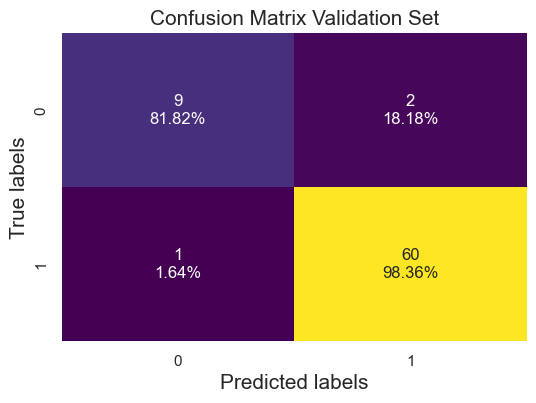

 estimator: 117 depth: 8 val score:0.9583333333333334
 estimator: 117 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



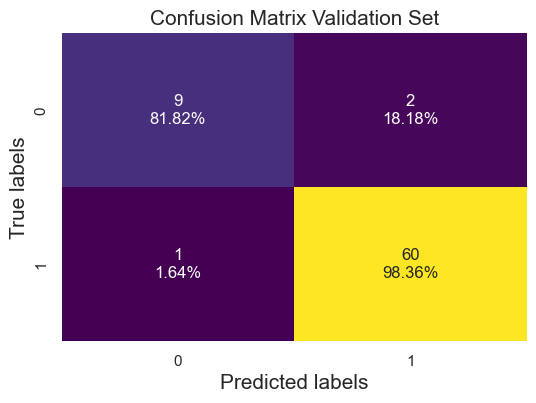

 estimator: 118 depth: 8 val score:0.9583333333333334
 estimator: 118 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



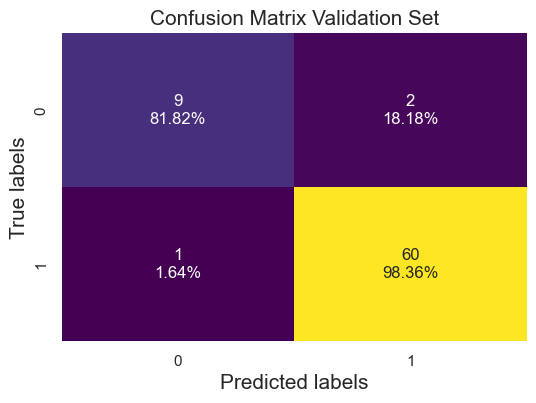

 estimator: 119 depth: 8 val score:0.9583333333333334
 estimator: 119 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



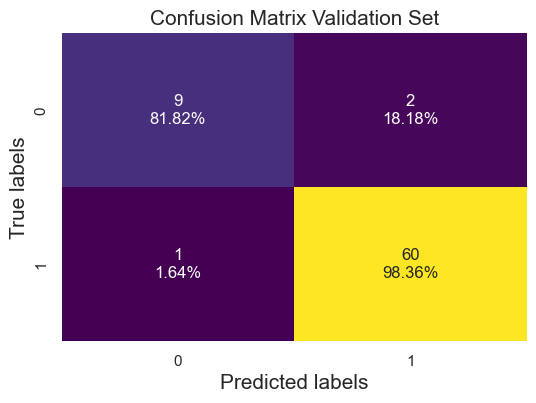

 estimator: 120 depth: 8 val score:0.9583333333333334
 estimator: 120 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



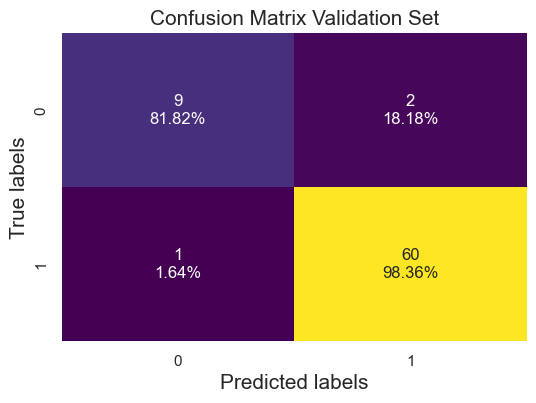

 estimator: 121 depth: 8 val score:0.9583333333333334
 estimator: 121 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



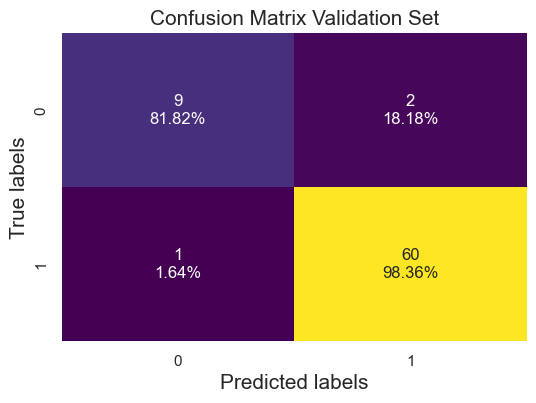

 estimator: 122 depth: 8 val score:0.9583333333333334
 estimator: 122 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



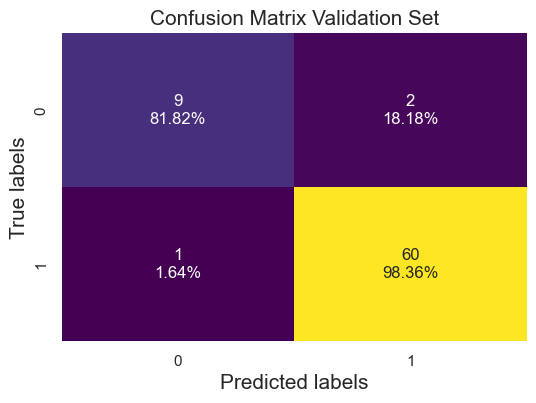

 estimator: 123 depth: 8 val score:0.9583333333333334
 estimator: 123 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



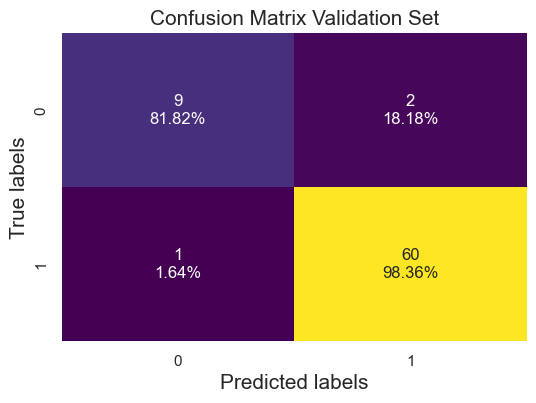

 estimator: 124 depth: 8 val score:0.9583333333333334
 estimator: 124 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



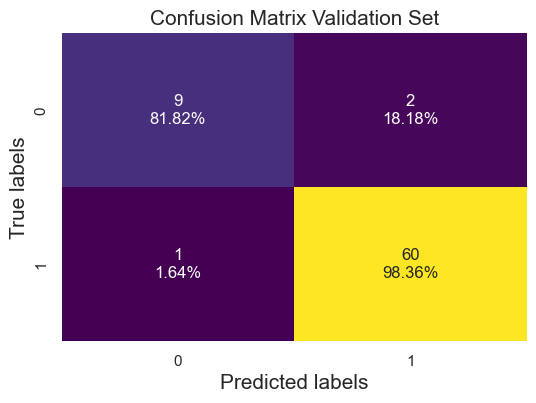

 estimator: 125 depth: 8 val score:0.9583333333333334
 estimator: 125 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



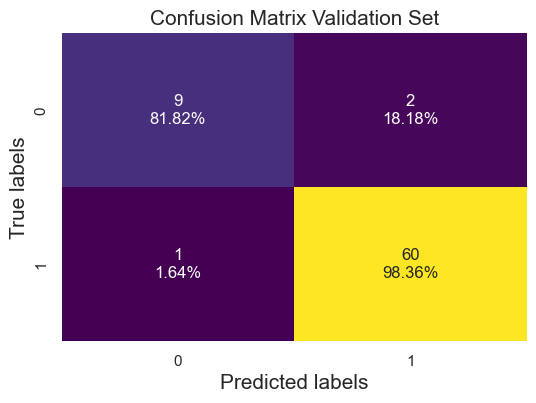

 estimator: 126 depth: 8 val score:0.9583333333333334
 estimator: 126 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



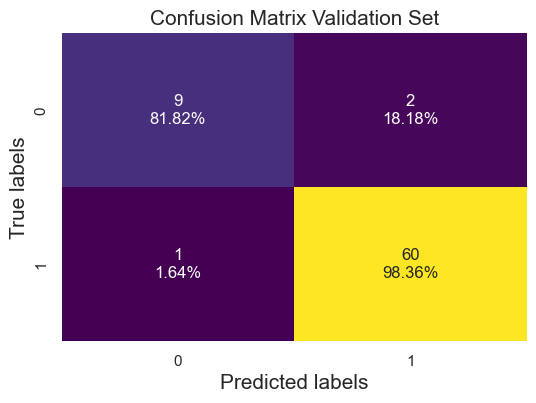

 estimator: 127 depth: 8 val score:0.9583333333333334
 estimator: 127 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



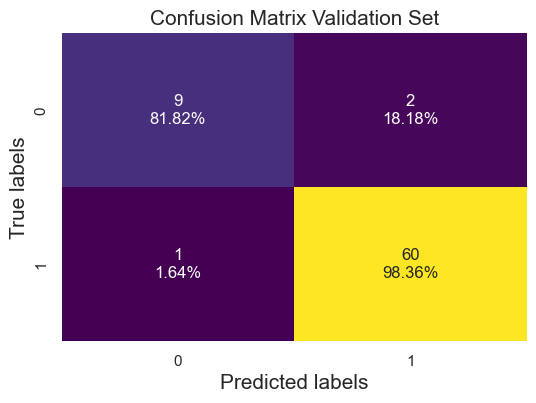

 estimator: 128 depth: 8 val score:0.9583333333333334
 estimator: 128 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



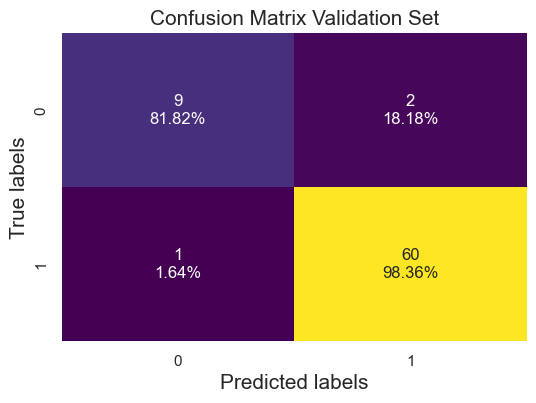

 estimator: 129 depth: 8 val score:0.9583333333333334
 estimator: 129 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



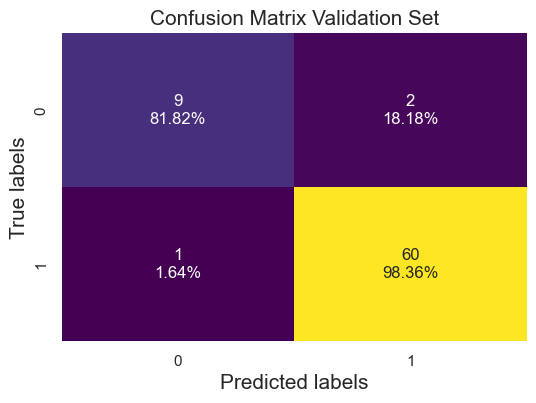

 estimator: 130 depth: 8 val score:0.9583333333333334
 estimator: 130 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



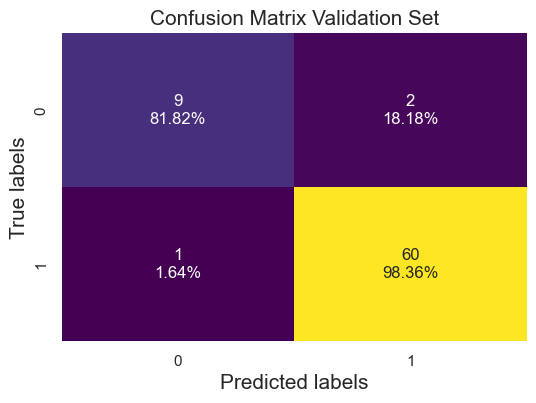

 estimator: 131 depth: 8 val score:0.9583333333333334
 estimator: 131 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



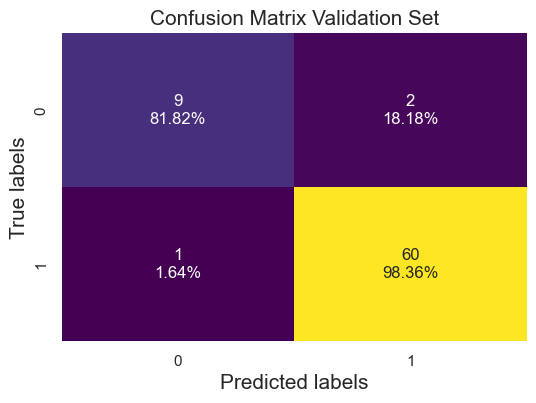

 estimator: 132 depth: 8 val score:0.9583333333333334
 estimator: 132 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



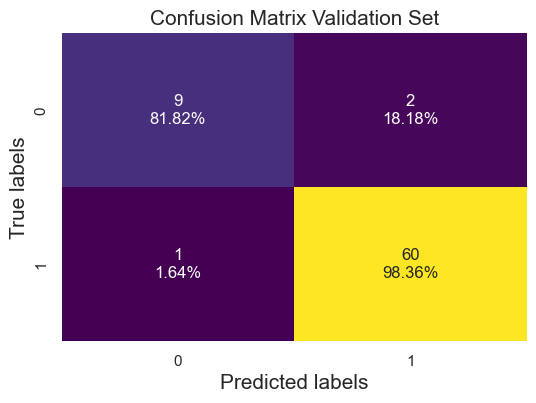

 estimator: 133 depth: 8 val score:0.9583333333333334
 estimator: 133 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



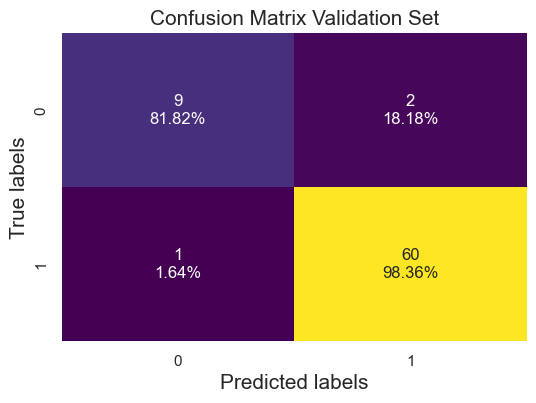

 estimator: 134 depth: 8 val score:0.9583333333333334
 estimator: 134 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



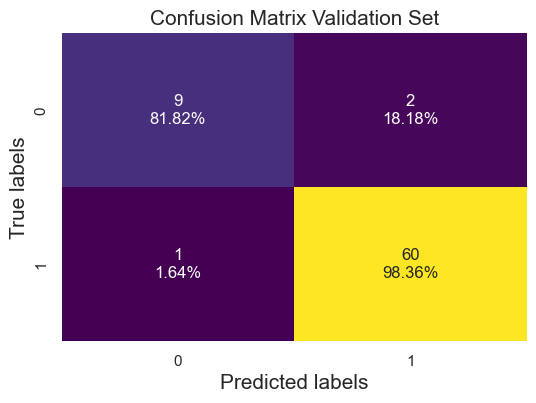

 estimator: 135 depth: 8 val score:0.9583333333333334
 estimator: 135 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



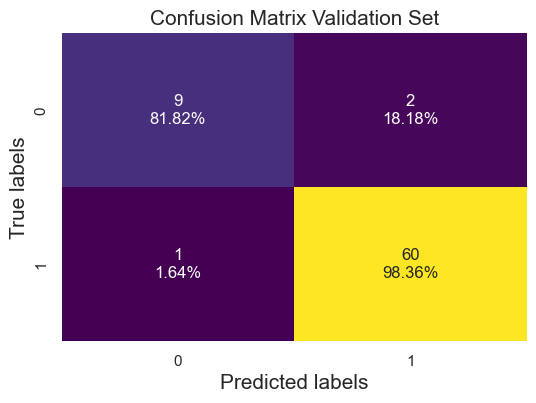

 estimator: 136 depth: 8 val score:0.9583333333333334
 estimator: 136 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



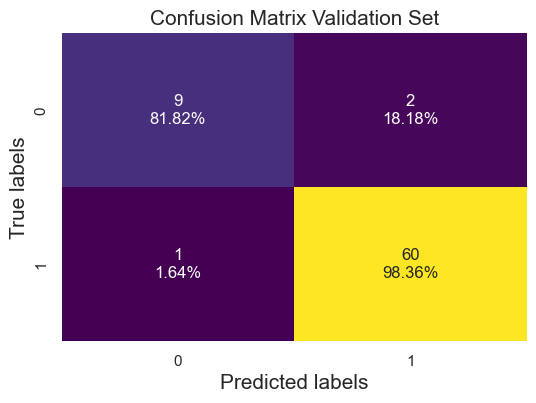

 estimator: 137 depth: 8 val score:0.9583333333333334
 estimator: 137 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



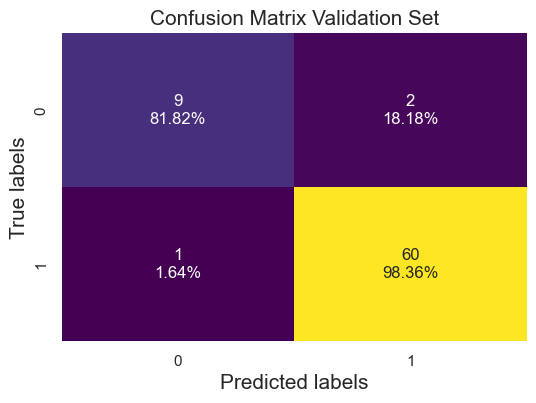

 estimator: 138 depth: 8 val score:0.9583333333333334
 estimator: 138 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



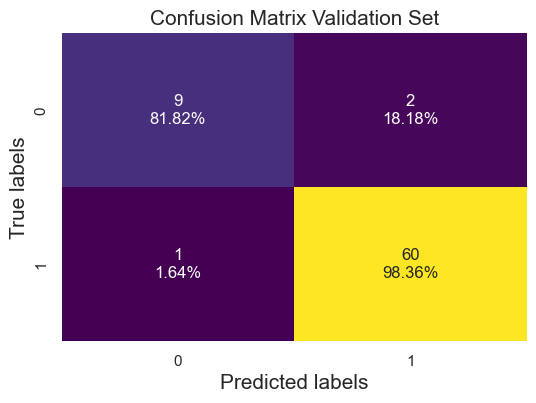

 estimator: 139 depth: 8 val score:0.9583333333333334
 estimator: 139 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



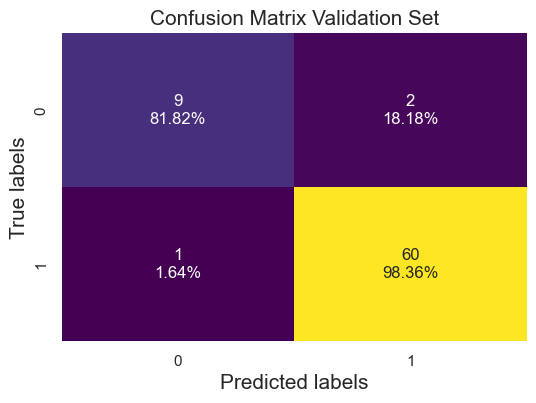

 estimator: 140 depth: 8 val score:0.9583333333333334
 estimator: 140 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



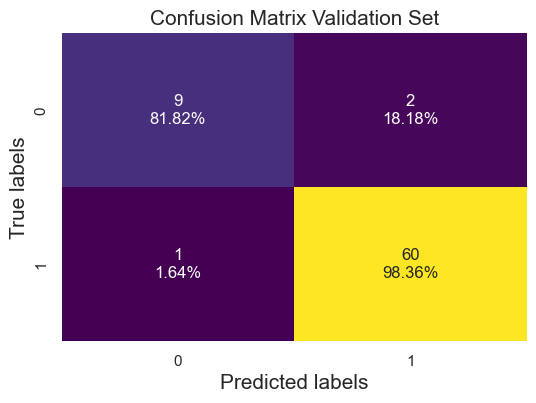

 estimator: 141 depth: 8 val score:0.9583333333333334
 estimator: 141 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



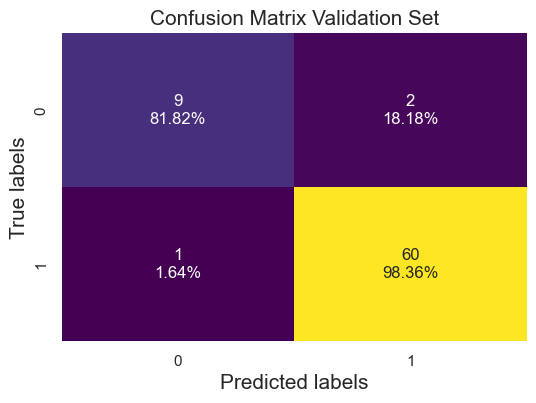

 estimator: 142 depth: 8 val score:0.9583333333333334
 estimator: 142 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



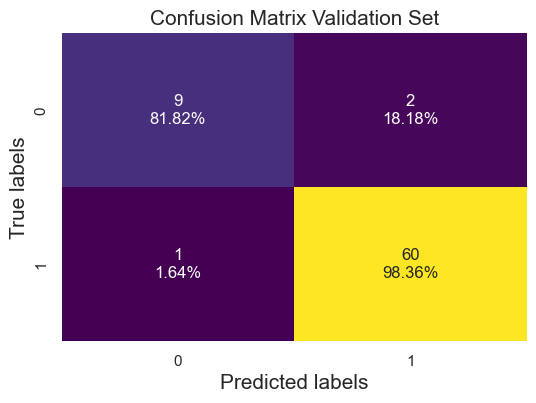

 estimator: 143 depth: 8 val score:0.9583333333333334
 estimator: 143 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



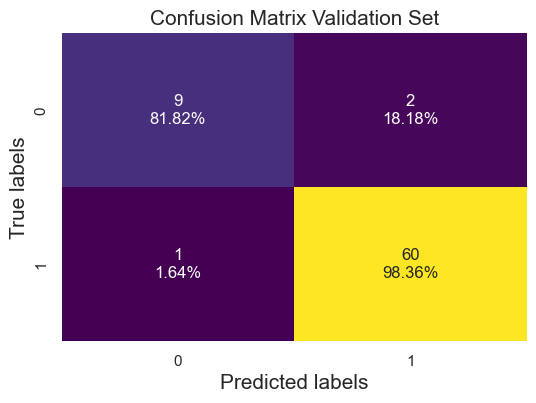

 estimator: 144 depth: 8 val score:0.9583333333333334
 estimator: 144 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



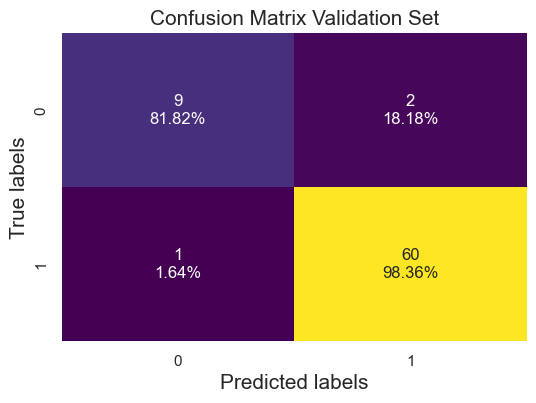

 estimator: 145 depth: 8 val score:0.9583333333333334
 estimator: 145 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



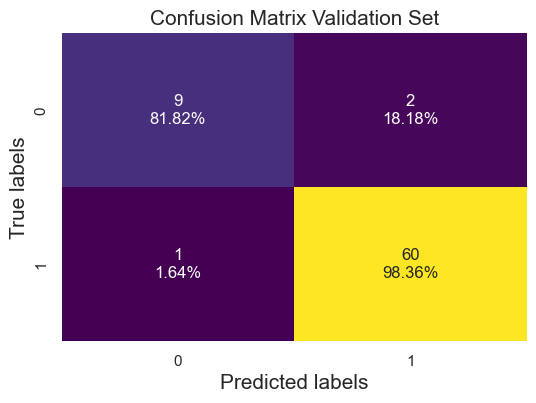

 estimator: 146 depth: 8 val score:0.9583333333333334
 estimator: 146 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



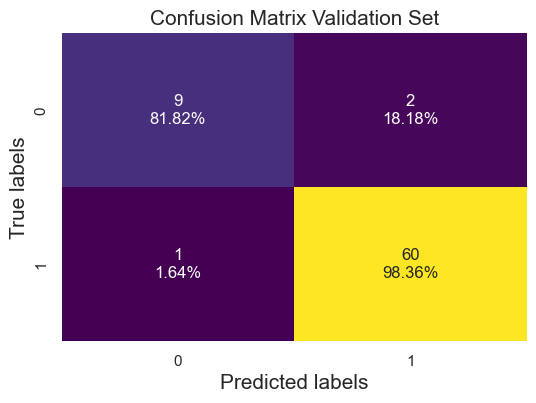

 estimator: 147 depth: 8 val score:0.9583333333333334
 estimator: 147 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



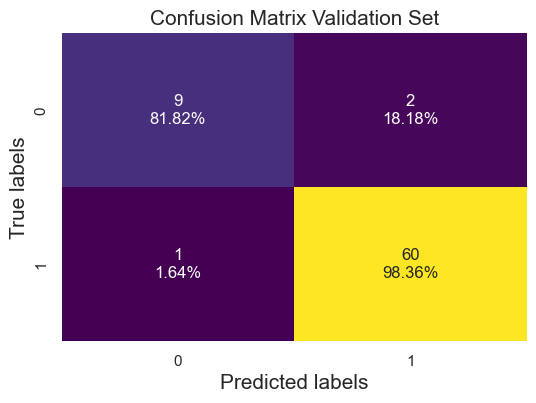

 estimator: 148 depth: 8 val score:0.9583333333333334
 estimator: 148 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



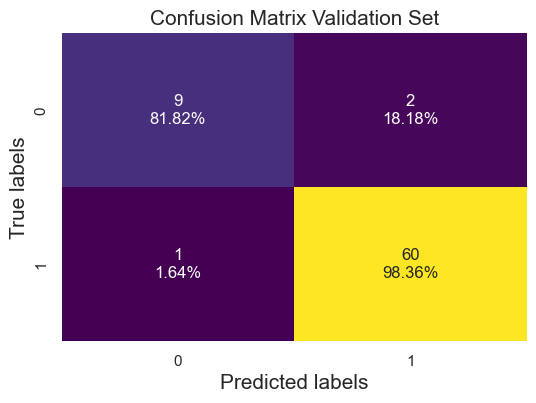

 estimator: 149 depth: 8 val score:0.9583333333333334
 estimator: 149 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



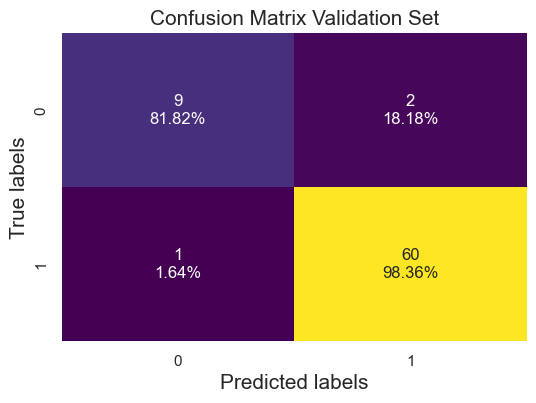

 estimator: 150 depth: 8 val score:0.9583333333333334
 estimator: 150 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



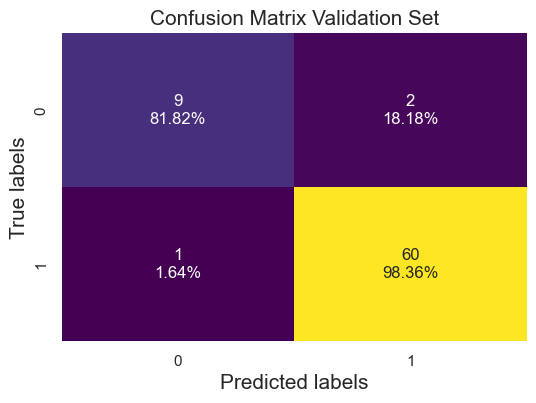

 estimator: 151 depth: 8 val score:0.9583333333333334
 estimator: 151 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



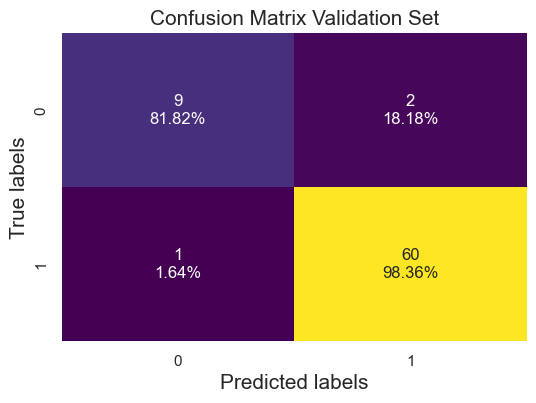

 estimator: 152 depth: 8 val score:0.9722222222222222
 estimator: 152 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



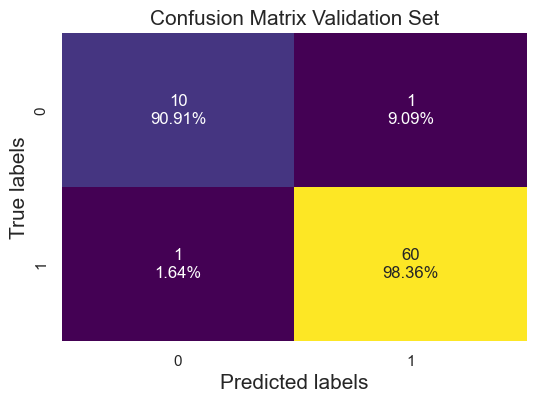

 estimator: 153 depth: 8 val score:0.9722222222222222
 estimator: 153 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



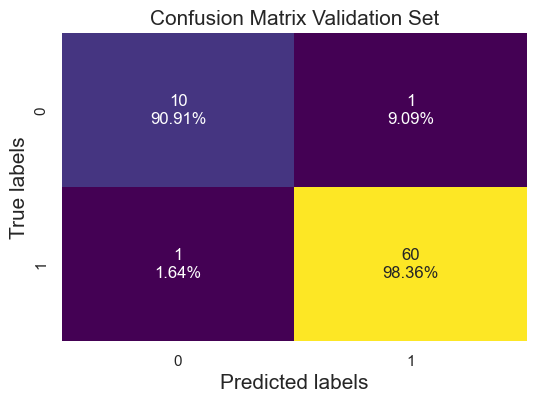

 estimator: 154 depth: 8 val score:0.9722222222222222
 estimator: 154 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



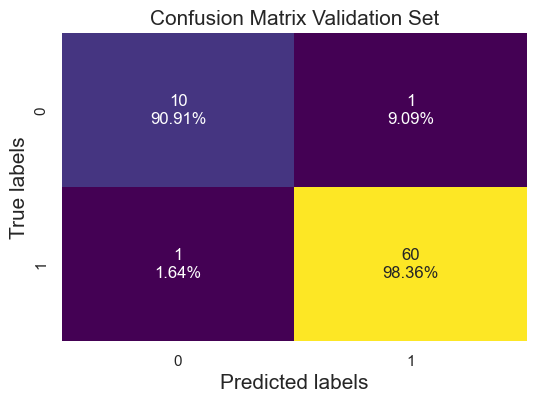

 estimator: 155 depth: 8 val score:0.9722222222222222
 estimator: 155 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



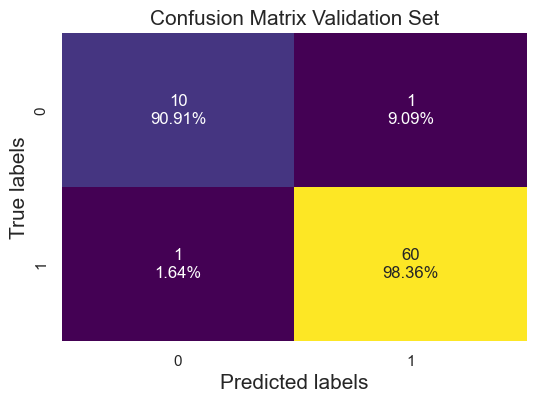

 estimator: 156 depth: 8 val score:0.9722222222222222
 estimator: 156 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



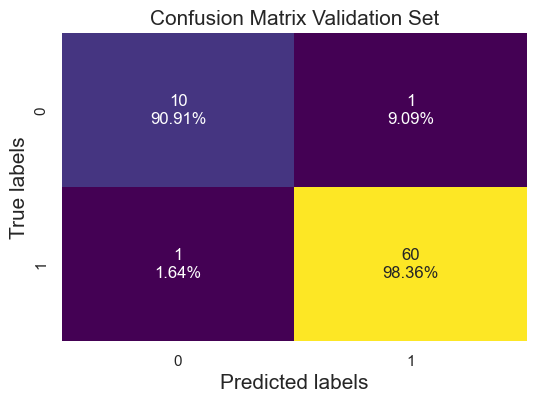

 estimator: 157 depth: 8 val score:0.9583333333333334
 estimator: 157 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



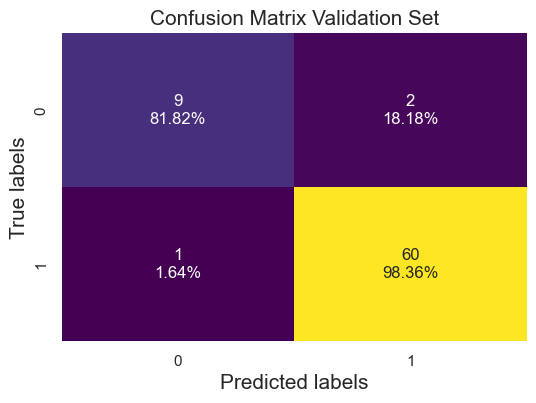

 estimator: 158 depth: 8 val score:0.9583333333333334
 estimator: 158 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



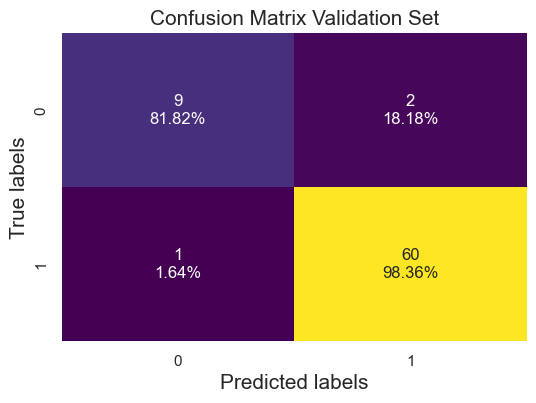

 estimator: 159 depth: 8 val score:0.9583333333333334
 estimator: 159 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



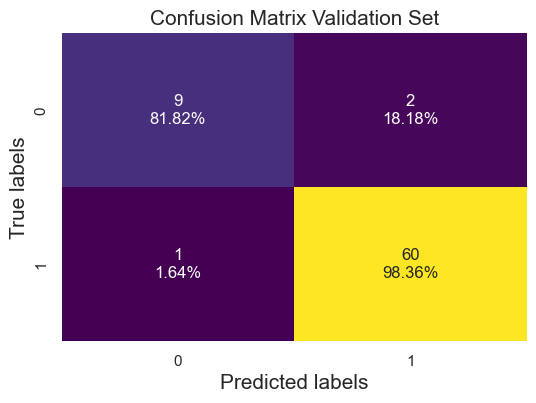

 estimator: 160 depth: 8 val score:0.9583333333333334
 estimator: 160 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



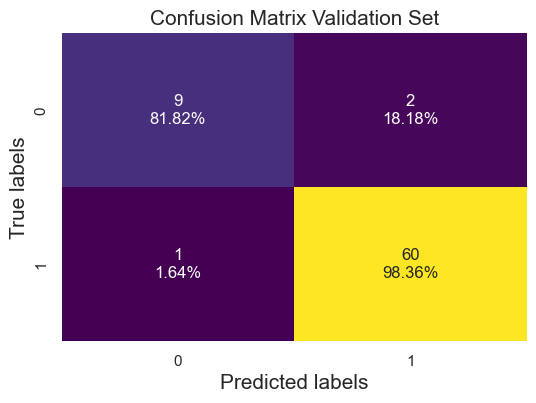

 estimator: 161 depth: 8 val score:0.9583333333333334
 estimator: 161 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



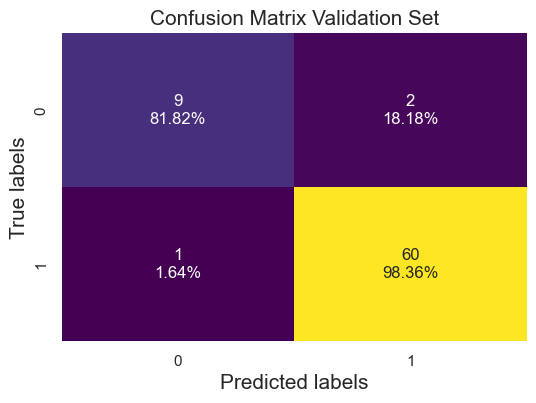

 estimator: 162 depth: 8 val score:0.9583333333333334
 estimator: 162 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



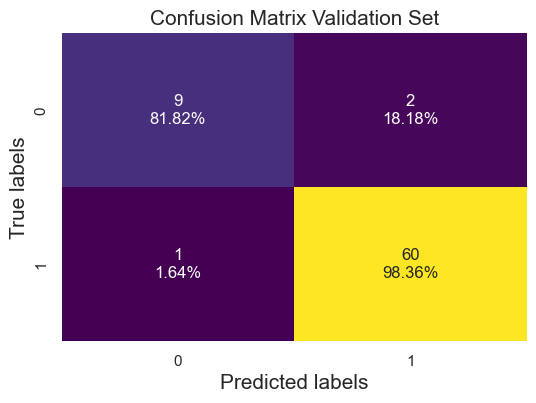

 estimator: 163 depth: 8 val score:0.9583333333333334
 estimator: 163 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



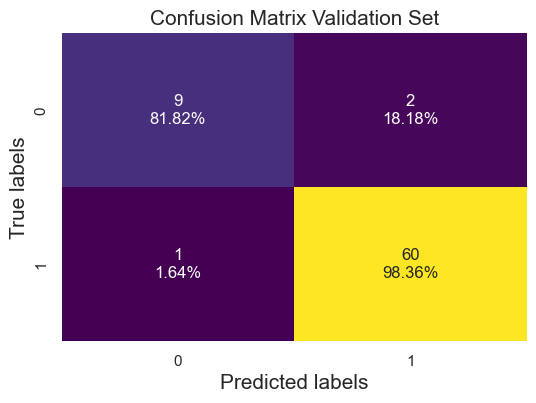

 estimator: 164 depth: 8 val score:0.9722222222222222
 estimator: 164 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



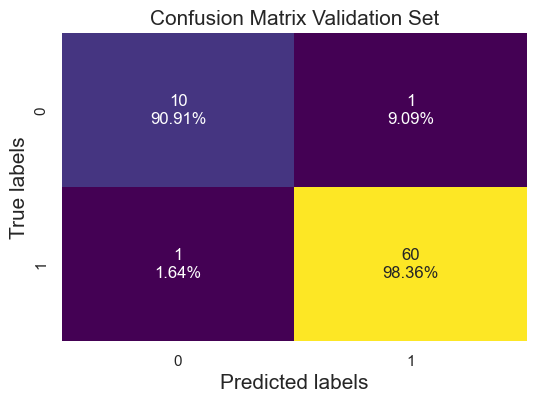

 estimator: 165 depth: 8 val score:0.9583333333333334
 estimator: 165 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



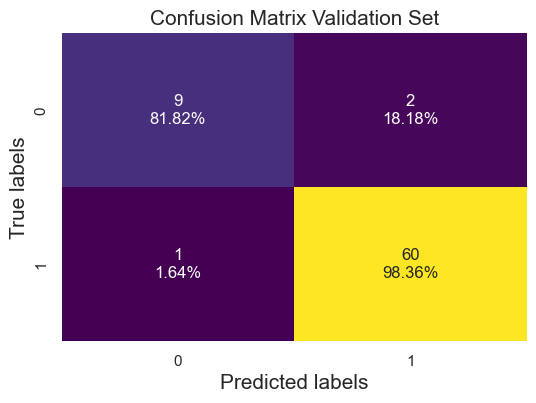

 estimator: 166 depth: 8 val score:0.9722222222222222
 estimator: 166 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



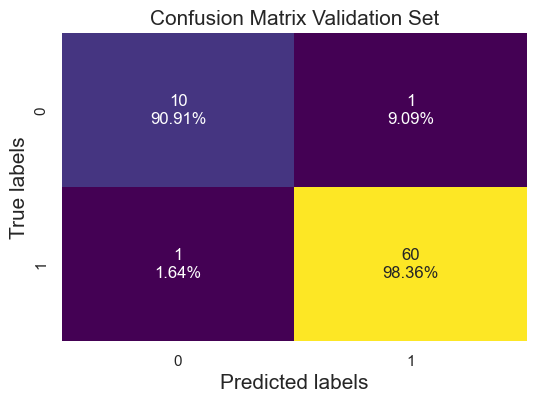

 estimator: 167 depth: 8 val score:0.9583333333333334
 estimator: 167 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



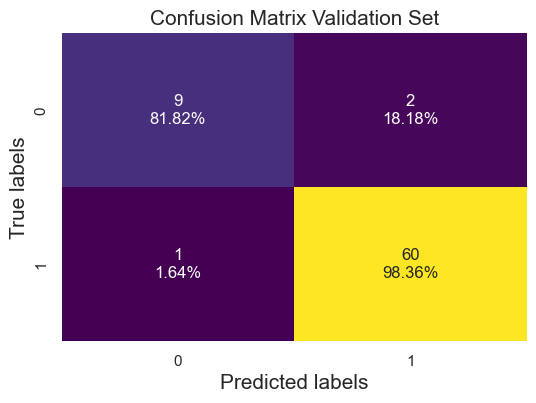

 estimator: 168 depth: 8 val score:0.9722222222222222
 estimator: 168 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



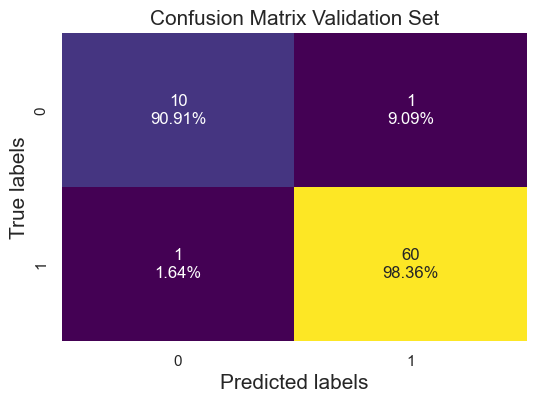

 estimator: 169 depth: 8 val score:0.9583333333333334
 estimator: 169 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



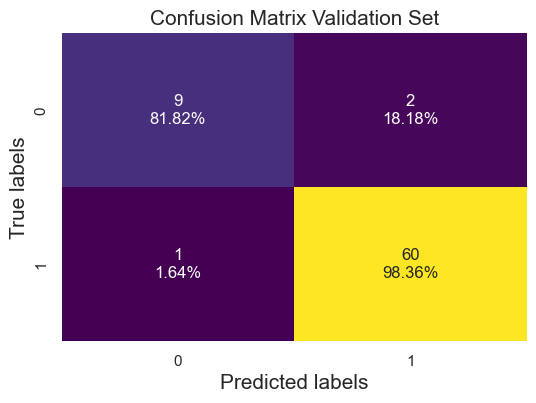

 estimator: 170 depth: 8 val score:0.9583333333333334
 estimator: 170 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



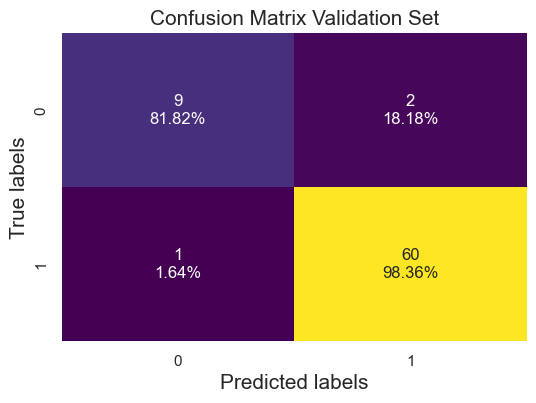

 estimator: 171 depth: 8 val score:0.9583333333333334
 estimator: 171 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



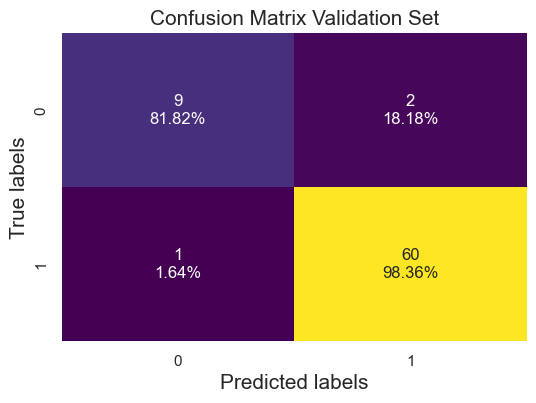

 estimator: 172 depth: 8 val score:0.9583333333333334
 estimator: 172 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



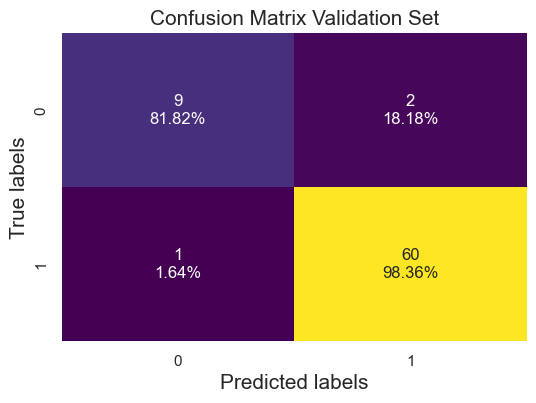

 estimator: 173 depth: 8 val score:0.9583333333333334
 estimator: 173 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



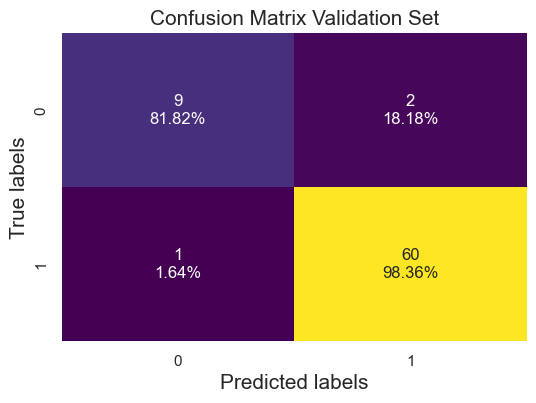

 estimator: 174 depth: 8 val score:0.9722222222222222
 estimator: 174 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



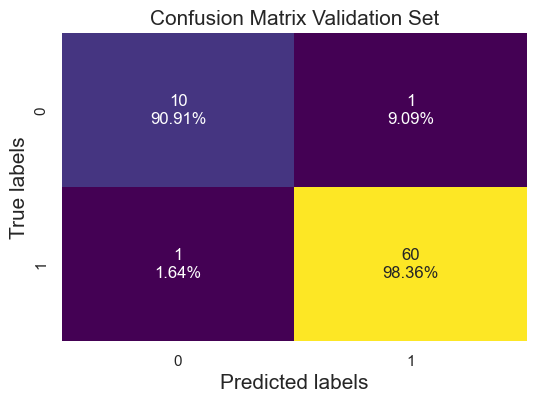

 estimator: 175 depth: 8 val score:0.9583333333333334
 estimator: 175 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



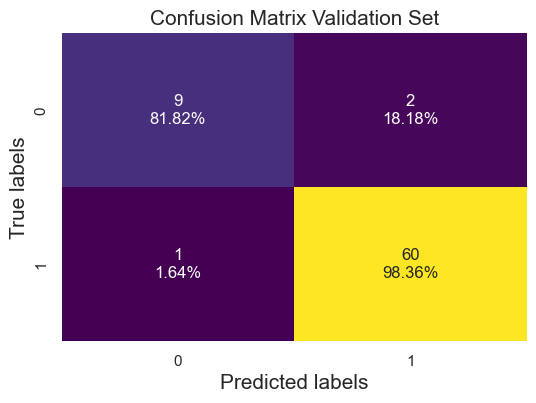

 estimator: 176 depth: 8 val score:0.9583333333333334
 estimator: 176 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



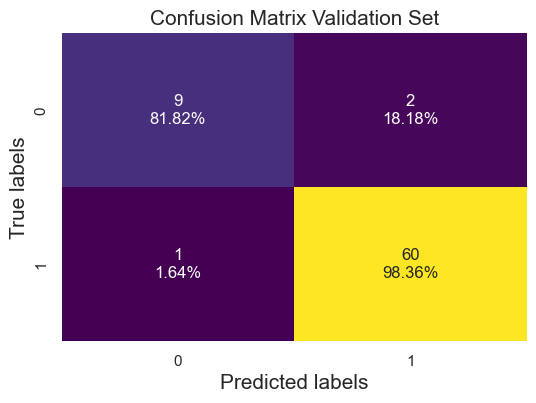

 estimator: 177 depth: 8 val score:0.9583333333333334
 estimator: 177 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



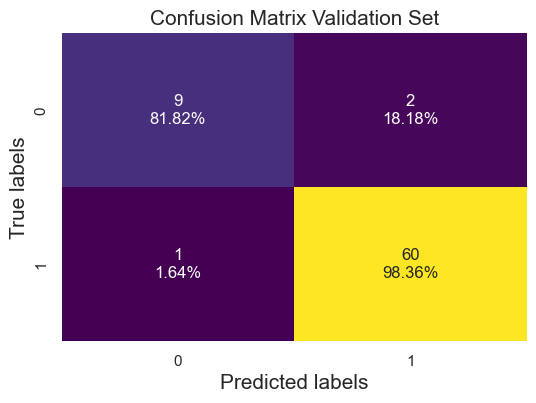

 estimator: 178 depth: 8 val score:0.9583333333333334
 estimator: 178 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



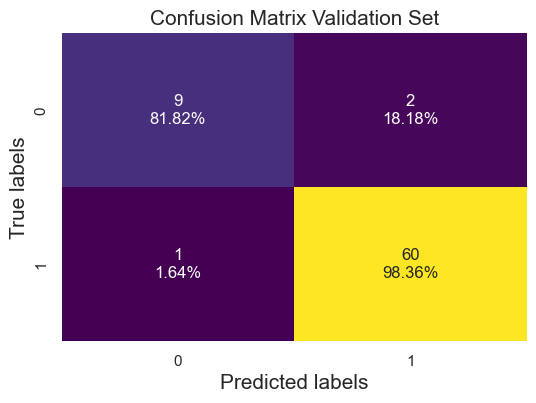

 estimator: 179 depth: 8 val score:0.9583333333333334
 estimator: 179 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



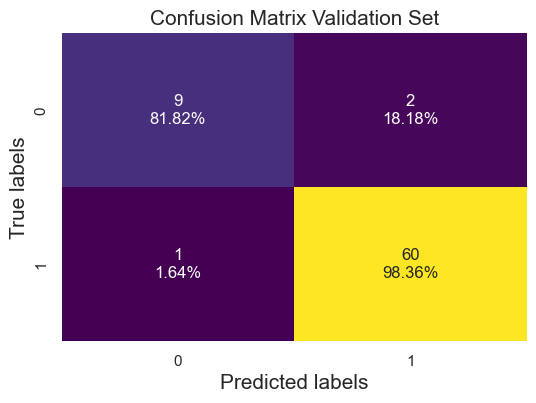

 estimator: 180 depth: 8 val score:0.9583333333333334
 estimator: 180 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



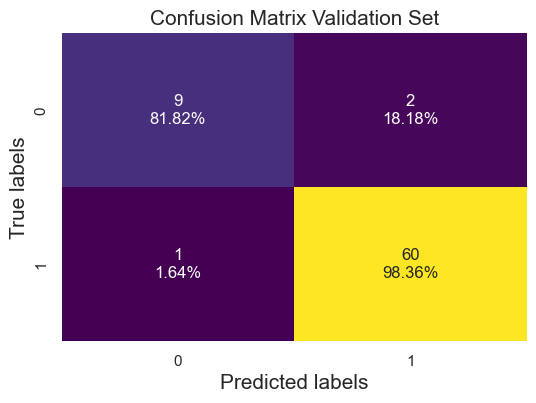

 estimator: 181 depth: 8 val score:0.9583333333333334
 estimator: 181 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



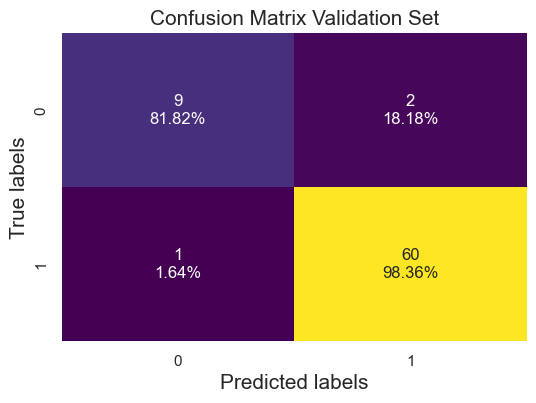

 estimator: 182 depth: 8 val score:0.9583333333333334
 estimator: 182 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



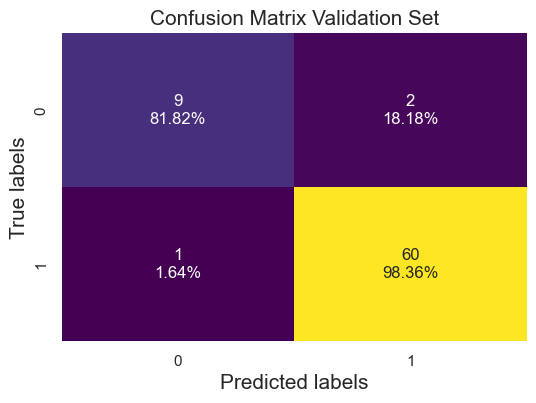

 estimator: 183 depth: 8 val score:0.9583333333333334
 estimator: 183 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



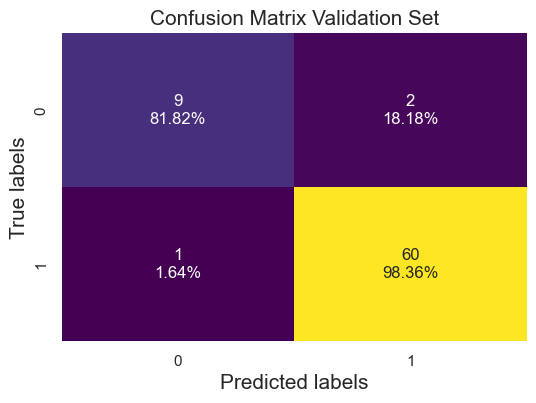

 estimator: 184 depth: 8 val score:0.9583333333333334
 estimator: 184 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



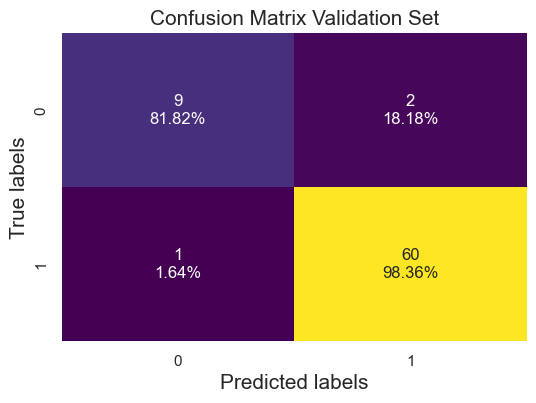

 estimator: 185 depth: 8 val score:0.9583333333333334
 estimator: 185 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



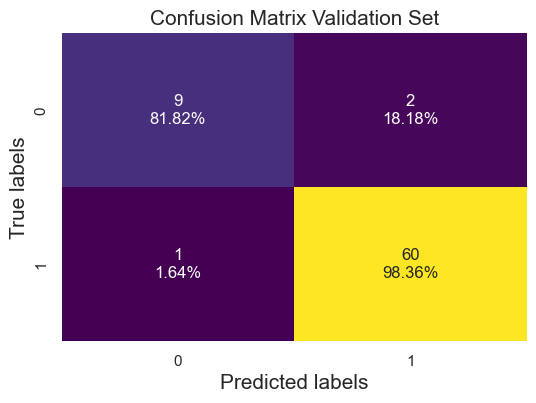

 estimator: 186 depth: 8 val score:0.9583333333333334
 estimator: 186 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



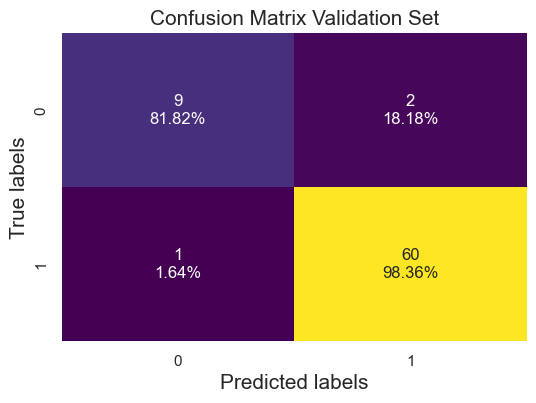

 estimator: 187 depth: 8 val score:0.9583333333333334
 estimator: 187 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



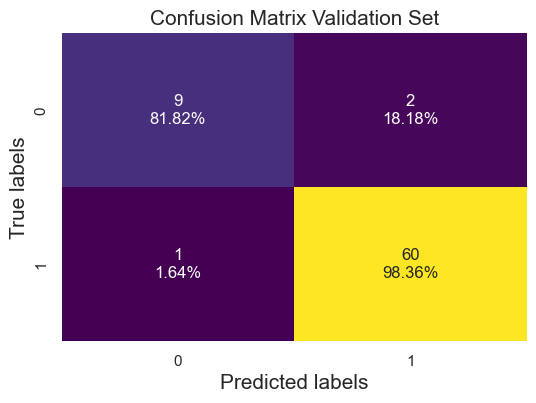

 estimator: 188 depth: 8 val score:0.9583333333333334
 estimator: 188 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



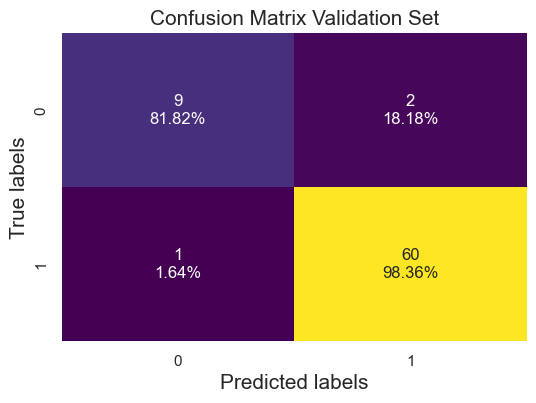

 estimator: 189 depth: 8 val score:0.9583333333333334
 estimator: 189 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



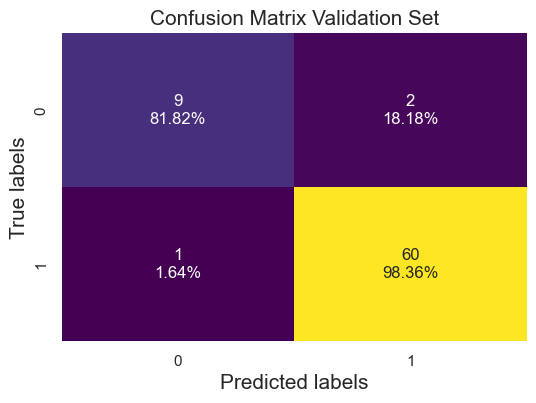

 estimator: 190 depth: 8 val score:0.9583333333333334
 estimator: 190 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



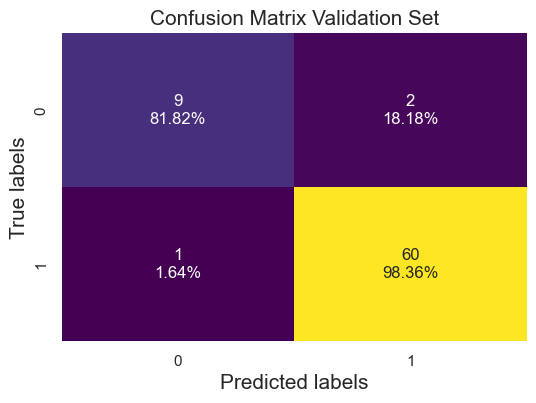

 estimator: 191 depth: 8 val score:0.9583333333333334
 estimator: 191 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



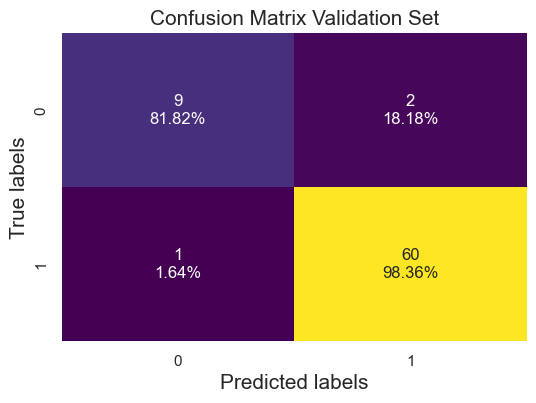

 estimator: 192 depth: 8 val score:0.9583333333333334
 estimator: 192 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



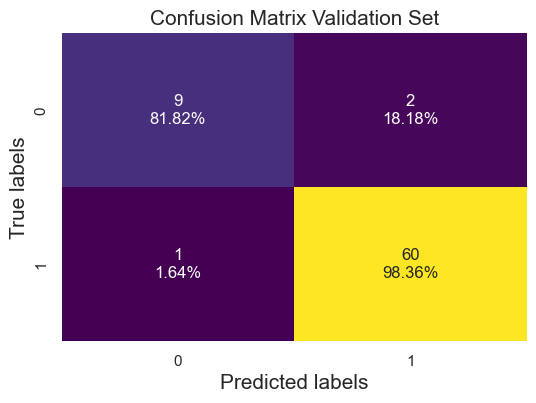

 estimator: 193 depth: 8 val score:0.9583333333333334
 estimator: 193 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



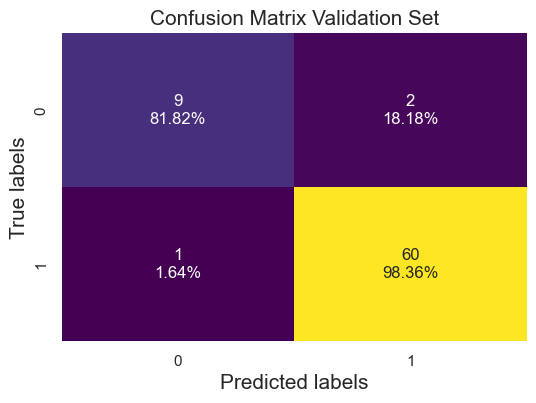

 estimator: 194 depth: 8 val score:0.9722222222222222
 estimator: 194 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



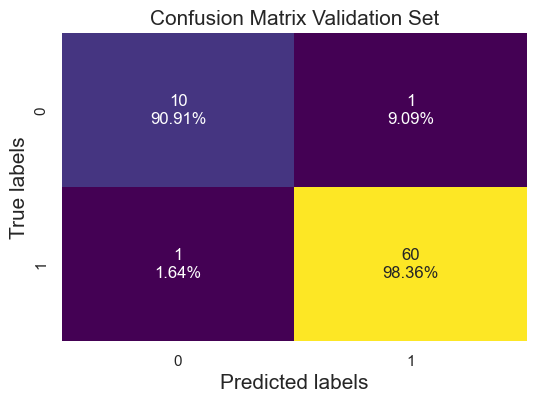

 estimator: 195 depth: 8 val score:0.9722222222222222
 estimator: 195 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



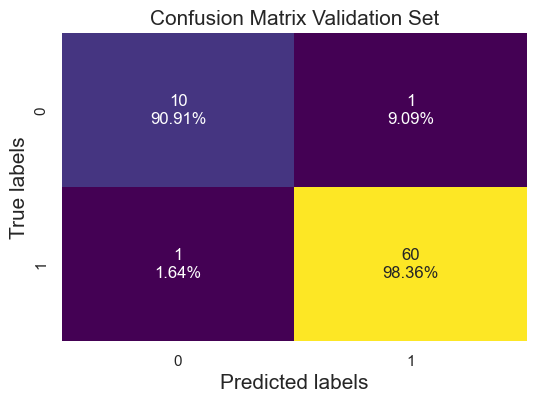

 estimator: 196 depth: 8 val score:0.9722222222222222
 estimator: 196 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



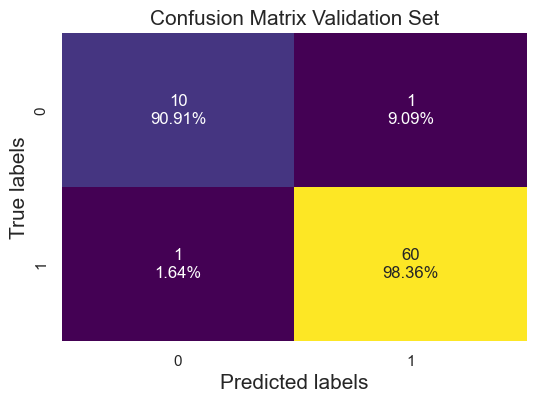

 estimator: 197 depth: 8 val score:0.9583333333333334
 estimator: 197 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.97      0.98      0.98        61

    accuracy                           0.96        72
   macro avg       0.93      0.90      0.92        72
weighted avg       0.96      0.96      0.96        72



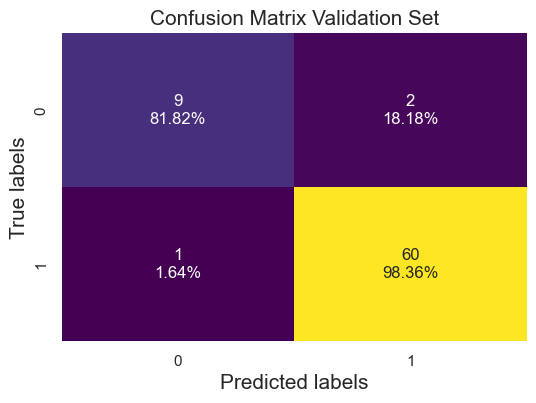

 estimator: 198 depth: 8 val score:0.9722222222222222
 estimator: 198 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



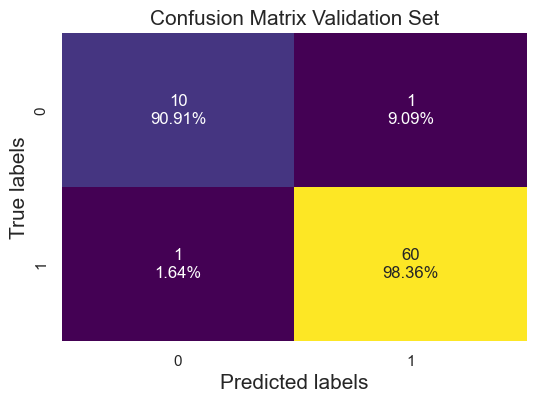

 estimator: 199 depth: 8 val score:0.9722222222222222
 estimator: 199 depth: 8 train score:1.0
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91        11
         1.0       0.98      0.98      0.98        61

    accuracy                           0.97        72
   macro avg       0.95      0.95      0.95        72
weighted avg       0.97      0.97      0.97        72



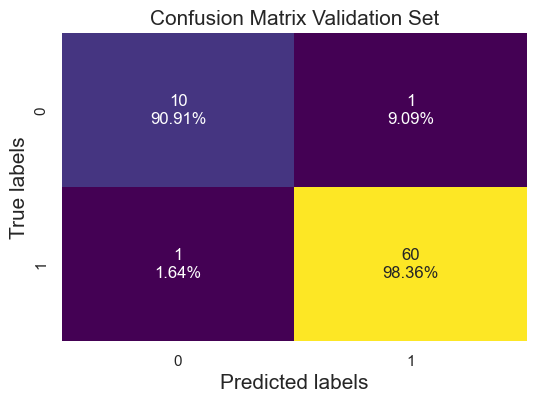

In [ ]:
# to check more arround the best hyperparameters: choose m_depth and test different n_est using more continue values

accuracies_test =[]
accuracies_train =[]
m_deph= 8
acc_row_test =[]
acc_row_train =[]
#we are changing the number of estimatores to check (use different ranges)

for n_est in range (2,200): #we are changing the number of estimatores to check depending on the previous results
#for n_est in [100]:
# do fit
    rfc= ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est,random_state=42)
    rfc.fit(x_train, y_train)
   # test different paramethers and take the one that gives the best aqurancy at the end.
    # print the training scores
    print(f' estimator: {n_est} depth: {m_deph} val score:{(rfc.score(x_test, y_test))}')
    print(f' estimator: {n_est} depth: {m_deph} train score:{(rfc.score(x_train, y_train))}')
    y_pred_test = rfc.predict(x_test)
    y_pred_train = rfc.predict(x_train)
    #print(y_pred_test)
       #Evaluate the classifier
    accuracy_test = accuracy_score(y_test, y_pred_test)
      #print(f'Accuracy test: {accuracy_test}')
    acc_row_test.append(accuracy_test)

    accuracy_train = accuracy_score(y_train, y_pred_train)
      #print(f'Accuracy train: {accuracy_train}')
    acc_row_train.append(accuracy_train)



    # Print classification report and confusion matrix
    print("Classification Report:")
    print(classification_report(y_test, y_pred_test))

      #print("Confusion Matrix:")
    cm = confusion_matrix(y_test, y_pred_test)

    # Display the confusion matrix with values and percentages
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_percentages = cm / cm_sum.astype(float) * 100
    cm_with_percentages = np.round(cm_percentages, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(
    cm,
    annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
    fmt='',
    cmap='viridis',
    cbar=False)

    plt.xlabel('Predicted labels',fontsize=15)
    plt.ylabel('True labels',fontsize=15)
    plt.title('Confusion Matrix Validation Set',fontsize=15)
    plt.show()

     #calculate feature importance in test set
    #p_importances = permutation_importance(rfc, x_test, y_test, n_repeats=20, n_jobs=-1,random_state=42)

    # acces the mean  and sd
    #importances = p_importances.importances_mean
    #std_importances = p_importances.importances_std

    # Get the indices of the top N most important features
    #N = 35  # Number of top features to print
    #top_indices = np.argsort(importances)[::-1][:N]

    # Get the names of the top N most important features
    #top_features = [features[i] for i in top_indices]

    # Print the top N most important features
    #print("Top", N, "Most Important Features:")
    #for feature in top_features:
     # print(feature)

    #plt.figure(figsize=(10, 6))
    #sns.barplot(x=top_features, y=importances[top_indices],yerr=std_importances[top_indices])
    #plt.xticks(rotation=90)
   # plt.xlabel('Features')
    #plt.ylabel('Importance')
    #plt.title('Top {} Most Important Features (Permutation Importance) in Test Set'.format(N))
    #plt.show()


    #calculate feature importance in train set
    #p_importances_train = permutation_importance(rfc, x_train, y_train, n_repeats=20, n_jobs=-1,random_state=42)

    # acces the mean  and sd
    #importances_train = p_importances_train.importances_mean
    #std_importances_train = p_importances_train.importances_std

    # Get the indices of the top N most important features
    #N = 35  # Number of top features to print
    #top_indices_train = np.argsort(importances_train)[::-1][:N]

    # Get the names of the top N most important features
    #top_features_train = [features[i] for i in top_indices_train]

    # Print the top N most important features
    #print("Top", N, "Most Important Features:")
    #for feature in top_features_train:
     # print(feature)

    #plt.figure(figsize=(10, 6))
    #sns.barplot(x=top_features_train, y=importances_train[top_indices_train],yerr=std_importances_train[top_indices_train])
    #plt.xticks(rotation=90)
    #plt.xlabel('Features')
    #plt.ylabel('Importance')
    #plt.title('Top {} Most Important Features (Permutation Importance) in Train Set'.format(N))
    #plt.show()


accuracies_test.append(acc_row_test)
accuracies_train.append(acc_row_train)




In [ ]:
print(accuracies_train)
print(accuracies_test)

[[0.9577464788732394, 0.9753521126760564, 0.9859154929577465, 0.9894366197183099, 0.9964788732394366, 0.9964788732394366, 1.0, 0.9964788732394366, 0.9964788732394366, 0.9964788732394366, 0.9964788732394366, 0.9964788732394366, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0

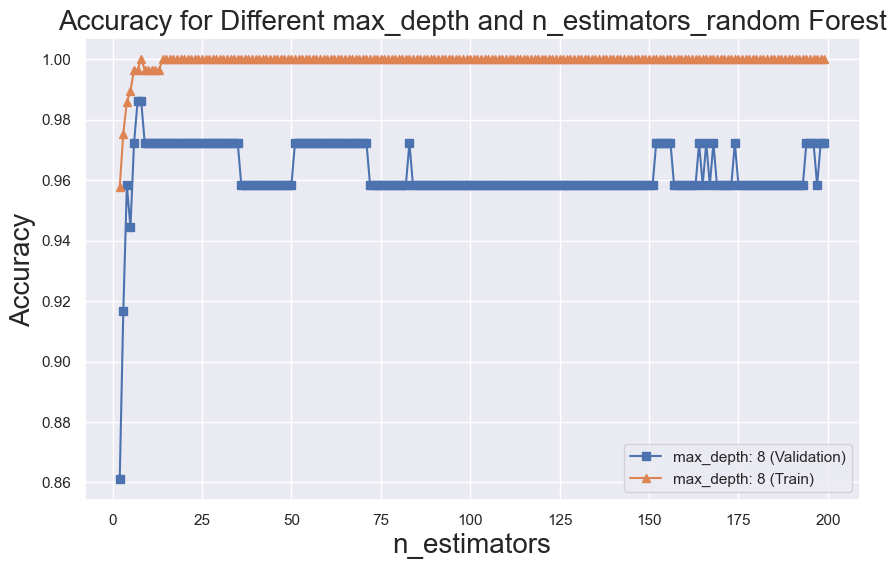

In [ ]:
plt.figure(figsize=(10, 6))

for i in range(len(accuracies_test)):
    plt.plot(range(2, 200), accuracies_test[i],  marker=markers[1], label=f"max_depth: {m_deph} (Validation)")

for i in range(len(accuracies_train)):
    plt.plot(range(2, 200), accuracies_train[i], marker=markers[2],label=f"max_depth: {m_deph} (Train)")

plt.xlabel("n_estimators", fontsize=20)
plt.ylabel("Accuracy", fontsize=20)
plt.title("Accuracy for Different max_depth and n_estimators_random Forest", fontsize=20)
plt.legend()
plt.show()


# Code to run final inference evaluation in unseen data if set was split in 3 sets (train, test and validation)

# For inference with all features:


Classification Report (Entire Dataset):
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99        47
         1.0       1.00      1.00      1.00       273

    accuracy                           1.00       320
   macro avg       0.99      1.00      0.99       320
weighted avg       1.00      1.00      1.00       320


Confusion Matrix (Entire Dataset):


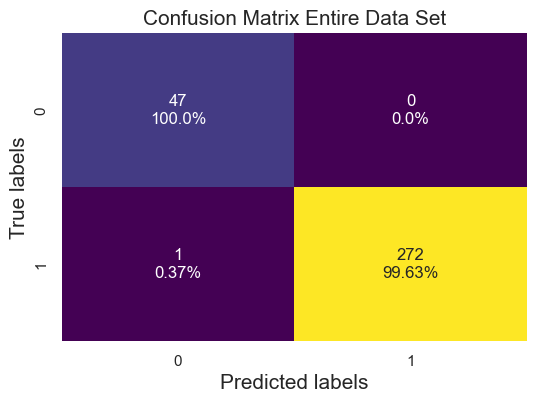


Classification Report Test( Kept unseen data):
              precision    recall  f1-score   support

         0.0       0.80      0.80      0.80         5
         1.0       0.97      0.97      0.97        31

    accuracy                           0.94        36
   macro avg       0.88      0.88      0.88        36
weighted avg       0.94      0.94      0.94        36



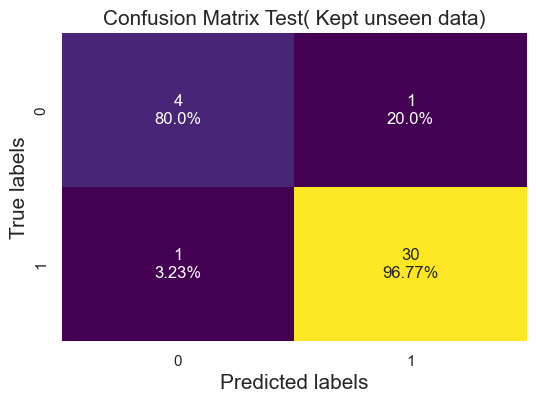

In [52]:
# RUN THIS CODE FOR FINAL EVALUATION on the 10 % left unseen data of the models IF DATA WAS SPLIT BEFORE in 3 sets:


# otherwise do not run this code

# Fit the model on the entire dataset (train plus validation tests) with the best paramethers found and then test on the kept unseen data
# final test in the kept unseen data (x_val, y_val)

m_deph = 8
n_est = 4 #we are changing the number of estimatores to check # for PCA was 100 (also for CV test), for split with whole data 10

# do fit
rfc= ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est,random_state=42)

# fit to all features
rfc.fit(x, y)
# Get predictions for the entire dataset for all features

y_pred = rfc.predict(x)

# Print classification report and confusion matrix for the entire dataset
print("\nClassification Report (Entire Dataset):")
print(classification_report(y, y_pred))

print("\nConfusion Matrix (Entire Dataset):")
cm = confusion_matrix(y, y_pred)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Entire Data Set',fontsize=15)
plt.show()

# evaluate the evaluation set (keep unseen)

y_pred_val = rfc.predict(x_val)
print("\nClassification Report Test( Kept unseen data):")
print(classification_report(y_val,y_pred_val))


#print("Confusion Matrix validations set:")
cm = confusion_matrix(y_val, y_pred_val)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Test( Kept unseen data)',fontsize=15)
plt.show()




# Final validation with PCA components

 Traning done with: estimator: 40 depth: 8

Classification Report (Entire Dataset):
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99        47
         1.0       1.00      1.00      1.00       273

    accuracy                           1.00       320
   macro avg       1.00      0.99      0.99       320
weighted avg       1.00      1.00      1.00       320


Confusion Matrix (Entire Dataset):


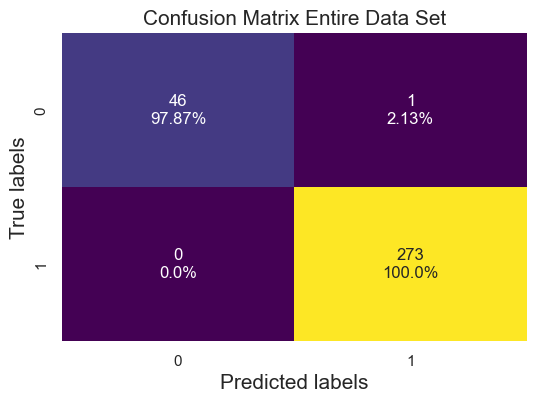


Classification Report Test(Kept unseen data):
              precision    recall  f1-score   support

         0.0       0.80      0.80      0.80         5
         1.0       0.97      0.97      0.97        31

    accuracy                           0.94        36
   macro avg       0.88      0.88      0.88        36
weighted avg       0.94      0.94      0.94        36



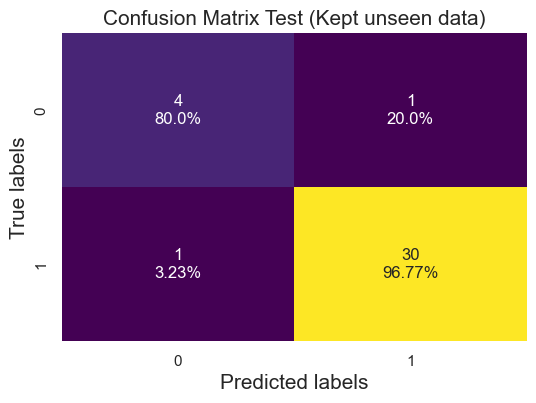

In [ ]:
# Predictions with the  PCA selected components

# RUN THIS CODE FOR EVALUATION of the models IF DATA WAS SPLIT BEFORE in 3 sets:


# otherwise do not run this code

# Fit the model on the entire entire PCA data set (train plus evaluation)  with the best paramethers selected 
# final test in the kept unseen data (x_val, y_val)


m_deph = 8
n_est = 40 #we are changing the number of estimatores to check # for PCA was 100 (also for CV test), for split with whole data 10

# do fit
rfc= ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est,random_state=42)

# fit and get predictions to the entire PCA data set (train plus evaluation)
rfc.fit(x_PCA,y_PCA)
y_pred = rfc.predict(x_PCA)

print(f' Traning done with: estimator: {n_est} depth: {m_deph}')
# Print classification report and confusion matrix for the entire dataset
print("\nClassification Report (Entire Dataset):")
print(classification_report(y_PCA, y_pred))

print("\nConfusion Matrix (Entire Dataset):")
cm = confusion_matrix(y_PCA, y_pred)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Entire Data Set',fontsize=15)
plt.show()

# evaluate the evaluation set (keep unseen)

y_pred_val = rfc.predict(x_val)
print("\nClassification Report Test(Kept unseen data):")
print(classification_report(y_val,y_pred_val))


#print("Confusion Matrix validations set:")
cm = confusion_matrix(y_val, y_pred_val)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Test (Kept unseen data)',fontsize=15)
plt.show()




# Analysis of Feature importances

# Permutation importances (random-split_training)

 estimator: 7 depth: 8 val score:0.9861111111111112
 estimator: 7 depth: 8 train score:0.9964788732394366
Accuracy: 0.9861111111111112
Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        11
         1.0       0.98      1.00      0.99        61

    accuracy                           0.99        72
   macro avg       0.99      0.95      0.97        72
weighted avg       0.99      0.99      0.99        72



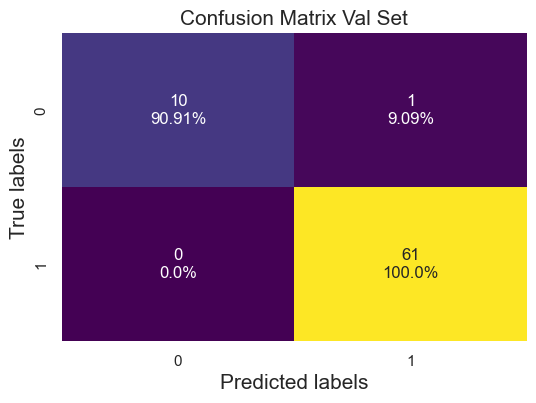

array([0.        , 0.        , 0.00055556, ..., 0.        , 0.        ,
       0.        ])

In [8]:
# train model with the best hyperparamethers calculated before, plot and save important features (permutation importance)

m_deph = 8
n_est = 7 #we are changing the number of estimatores to check # for PCA was 100 (also for CV test), for split with whole data 10

# do fit
rfc= ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est,random_state=42)
rfc.fit(x_train, y_train)
   # test different paramethers and take the one that gives the best aqurancy at the end.
    # print the training scores
print(f' estimator: {n_est} depth: {m_deph} val score:{(rfc.score(x_test, y_test))}')
print(f' estimator: {n_est} depth: {m_deph} train score:{(rfc.score(x_train, y_train))}')
y_pred_test = rfc.predict(x_test)
y_pred_train = rfc.predict(x_train)
    #print(y_pred_test)
       #Store accuracy
accuracy = accuracy_score(y_test, y_pred_test)
print(f'Accuracy: {accuracy}')


    # Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, y_pred_test))

      #print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_test)

    # Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
      cm,
      annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
      fmt='',
      cmap='viridis',
      cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Val Set',fontsize=15)
plt.show()

#calculate feature importance in test set
p_importances_test = permutation_importance(rfc, x_test, y_test, n_repeats=200, n_jobs=-1,random_state=42)

# acces the mean  and sd
perm_mean_importances_test = p_importances_test.importances_mean
perm_std_importances_test = p_importances_test.importances_std

perm_mean_importances_test

In [ ]:
perm_mean_importances_test

array([0.        , 0.        , 0.00055556, ..., 0.        , 0.        ,
       0.        ])

Top 22 Most Important Features in validation set:
GAL
EPHA10
KRT24
SAPCD1
FAM83C
MYBL2
EVA1A
DUOXA1
AC008759.1
ARHGAP19-SLIT1
PPP3R2
AC005064.1
CCDC27
AC022558.2
JPH4
AC005180.1
ENSG00000286989.1
AC087235.2
ENPP3
AC010329.2
PDK4
SCGB1A1


/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dty

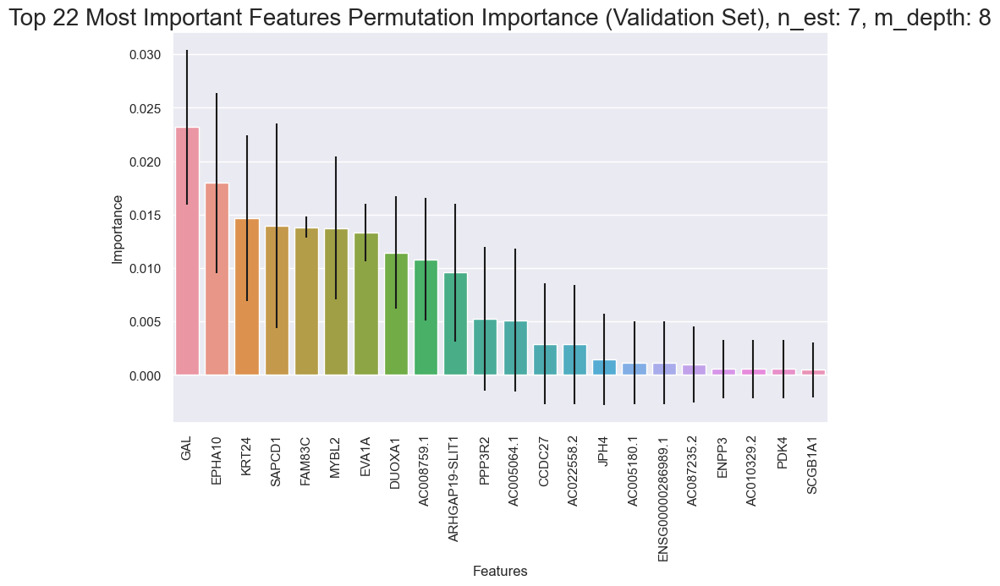

In [9]:
# Get the indices of the top N most important features and plot importances for validation set:

N= 22

top_indices_test = np.argsort(perm_mean_importances_test)[::-1][:N]

# Get the names of the top N most important features

top_features_test = [features[i] for i in top_indices_test]

 # Print the top N most important features
print("Top", N, "Most Important Features in validation set:")
for feature in top_features_test:
    print(feature)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_test, y=perm_mean_importances_test[top_indices_test],yerr=perm_std_importances_test[top_indices_test])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title(f'Top {N} Most Important Features Permutation Importance (Validation Set), n_est: {n_est}, m_depth: {m_deph}', fontsize=20)
plt.show()


# Save top features for comparison with other models
Permutation_split_top_features_test = top_features_test



In [ ]:
#calculate feature importance in train set, plot and save them:

p_importances_train = permutation_importance(rfc, x_train, y_train, n_repeats=200, n_jobs=-1,random_state=42)

    # acces the mean  and sd
perm_mean_importances_train = p_importances_train.importances_mean
perm_std_importances_train = p_importances_train.importances_std



Top 22 Most Important Features in train set:
SCGB1A1
CASP14
KRT24
LINC01204
PDK4
AL139280.1
SLC34A2
FAM83B
AC087235.2
AL512363.1
SAPCD1
GAL
MYBL2
ARHGAP19-SLIT1
EPHA10
MGAT4C
AC005064.1
MEI4
MARCKSL1P2
PLCZ1
CCDC27
ENSG00000284623.1


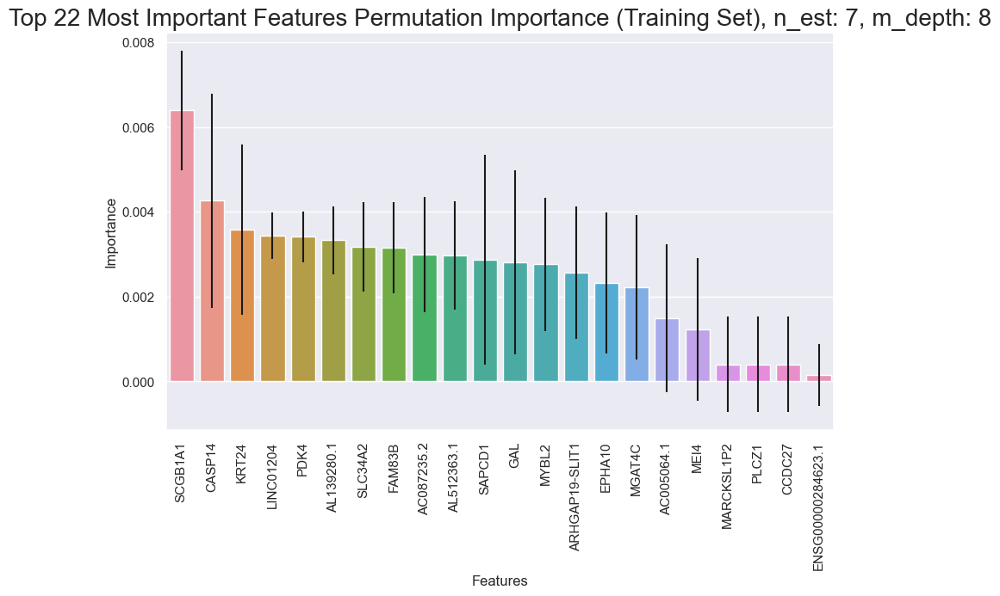

In [ ]:
# Get the indices of the top N most important features
N= 22
top_indices_train = np.argsort(perm_mean_importances_train)[::-1][:N]

    # Get the names of the top N most important features
top_features_train = [features[i] for i in top_indices_train]

    # Print the top N most important features
print("Top", N, "Most Important Features in train set:")
for feature in top_features_train:
    print(feature)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_train, y=perm_mean_importances_train[top_indices_train],yerr=perm_std_importances_train[top_indices_train])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title(f'Top {N} Most Important Features Permutation Importance (Training Set), n_est: {n_est}, m_depth: {m_deph}', fontsize=20)

plt.show()

# Save top features for comparison with other models
Permutation_split_top_features_train = top_features_train

# Gini importances

In [10]:
# Calculate Gini importances in the training set with the best hyperparameters

# RandomForestClassifier parameters
m_depth = 8
n_est = 7

# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_depth, n_estimators=n_est, random_state=42)

# Fit the RandomForestClassifier on the training data
rfc.fit(x_train, y_train)

# Get the importances of features
Gini_importances_train = rfc.feature_importances_




Top 67 Most Important Features (Gini) across train sets:
EPHA10
HOXC6
CCDC27
AL512363.1
GAL
MYBL2
JPH4
ARHGAP19-SLIT1
AL353746.1
ONECUT2
FNDC10
PPP3R2
DUOXA1
LINC01204
CYP4B1
KRT24
SAPCD1
SCGB1A1
BRINP2
LINC01210
AL023803.1
ENPP3
AC112492.1
FAM83B
MGAT4C
LINC01727
DLGAP1-AS3
OR6F1
AC087516.2
AC009902.3
AC005180.1
AC005064.1
SPINT3
PLCZ1
GPRC6A
AC087235.2
CDH8
CASP14
TNRC18P1
CYSLTR2
LINC02056
PDK4
AC084211.1
H2AC4
FAM83C
C11orf87
TDRD1
ENSG00000286989.1
UGT1A3
AC008759.1
EVA1A
AC022558.2
MEI4
DEFB131A
ADCY8
HCAR3
ENSG00000283601.1
MARCKSL1P2
NKAIN1
LINC00868
SLC34A2
AL662864.1
ENSG00000284623.1
C8B
LINC01942
AC010329.2
AL139280.1


/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dty

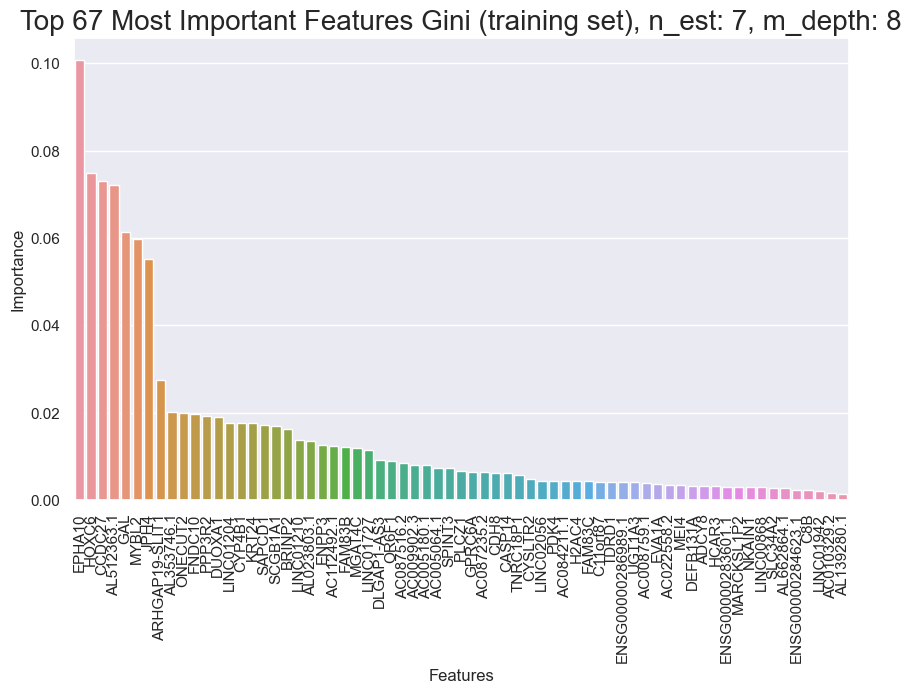

In [22]:
# Get the indices of the top N most important features
N=67

top_indices_train = np.argsort(Gini_importances_train)[::-1][:N]

# Get the names of the top N most important features
top_features_train = [features[i] for i in top_indices_train]

# Print the top N most important features
print("\nTop", N, "Most Important Features (Gini) across train sets:")
for feature in top_features_train:
    print(feature)

# Plot the Gini importances on train set
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_train, y=Gini_importances_train[top_indices_train])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title(f'Top {N} Most Important Features Gini (training set), n_est: {n_est}, m_depth: {m_depth}', fontsize=20)
plt.show()

# Save top features for comparison with other models
Gini_split_top_features_train = top_features_train


# SHAP  model interpretation ( for using with random-train-test-split)

In [11]:
# SHAP for model interpretation

#RandomForestClassifier parameters
m_deph = 8
n_est = 7

# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)


rfc.fit(x_train, y_train)

# Prediction
y_pred = rfc.predict(x_test)

# Model evaluation
print(classification_report(y_pred, y_test))

# Create a SHAP explainer
explainer = shap.TreeExplainer(rfc)

# Compute SHAP values for the test set
shap_values_test = explainer.shap_values(x_test)

# Calculate the absolute mean of the shap values along the last axis (axis=-1)
shap_values_abs_mean_test = np.abs(shap_values_test).mean(axis=-1)
print(shap_values_abs_mean_test.shape)








              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95        10
         1.0       1.00      0.98      0.99        62

    accuracy                           0.99        72
   macro avg       0.95      0.99      0.97        72
weighted avg       0.99      0.99      0.99        72

(72, 1380)



Features with the highest absolute mean SHAP values:
EPHA10                        : 0.026315
HOXC6                         : 0.025320
GAL                           : 0.019731
MYBL2                         : 0.018230
CCDC27                        : 0.016000
AL512363.1                    : 0.015478
KRT24                         : 0.011376
JPH4                          : 0.011297
ARHGAP19-SLIT1                : 0.010430
AL353746.1                    : 0.010058
CYP4B1                        : 0.008895
ENSG00000286989.1             : 0.006709
PPP3R2                        : 0.006592
GPRC6A                        : 0.006482
MGAT4C                        : 0.006142
LINC01204                     : 0.006003
AC112492.1                    : 0.005824
ONECUT2                       : 0.005709
SAPCD1                        : 0.005628
FAM83B                        : 0.005479
DUOXA1                        : 0.005395
AL023803.1                    : 0.004863
C11orf87                      : 0.004717
LIN

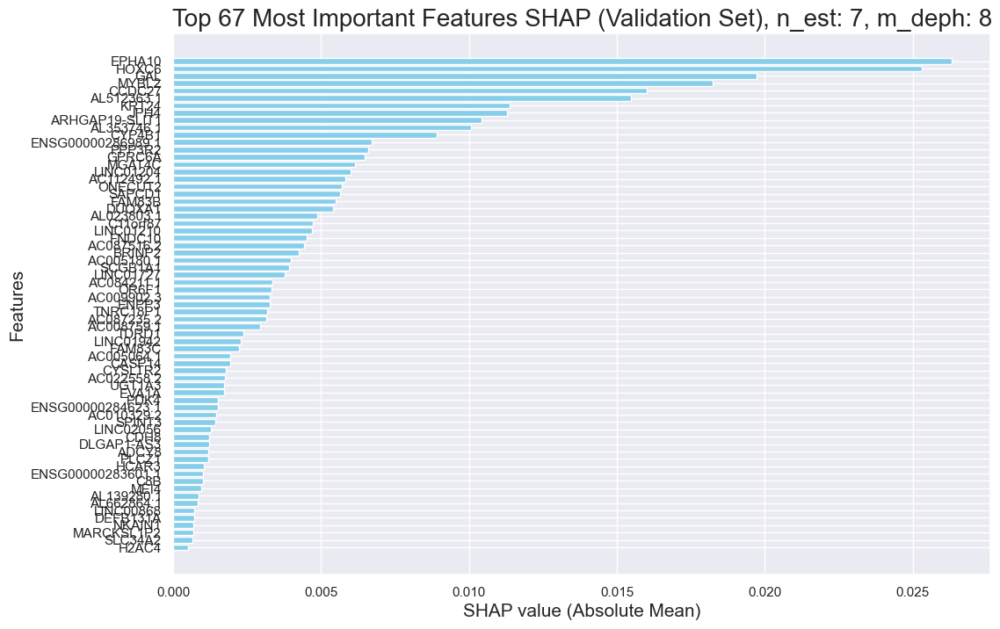

In [19]:
# Find the indices of features with the highest absolute mean SHAP values
N=67
top_feature_indices_test = np.argsort(shap_values_abs_mean_test.mean(axis=0))[::-1][:N]

# Retrieve the corresponding feature names from the features list
top_features_test = [features[i] for i in top_feature_indices_test]

# Print the features with the highest absolute mean SHAP values
print("\nFeatures with the highest absolute mean SHAP values:")
for feature, shap_value in zip(top_features_test, shap_values_abs_mean_test[:, top_feature_indices_test].mean(axis=0)):
    print("{:<30}: {:.6f}".format(feature, shap_value))


# Plot the features with the highest feature importance values
plt.figure(figsize=(12, 8))
plt.barh(top_features_test,shap_values_abs_mean_test[:, top_feature_indices_test].mean(axis=0), color='skyblue')
plt.xlabel('SHAP value (Absolute Mean)',fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title(f'Top {N} Most Important Features SHAP (Validation Set), n_est: {n_est}, m_deph: {m_deph}', fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

# rename features to compare

top_features_SHAP_test_split = top_features_test




Features with the highest absolute mean SHAP values in the training set:
EPHA10                        : 0.023361
HOXC6                         : 0.022415
CCDC27                        : 0.018814
GAL                           : 0.016876
MYBL2                         : 0.015653
AL512363.1                    : 0.015103
JPH4                          : 0.012252
CYP4B1                        : 0.011239
KRT24                         : 0.011232
ARHGAP19-SLIT1                : 0.009725
AL353746.1                    : 0.009615
GPRC6A                        : 0.007854
AL023803.1                    : 0.007476
ONECUT2                       : 0.007110
SCGB1A1                       : 0.006493
PPP3R2                        : 0.006474
FNDC10                        : 0.006425
LINC01204                     : 0.006204
MGAT4C                        : 0.005649
SAPCD1                        : 0.005218
AC112492.1                    : 0.005213
BRINP2                        : 0.005005
LINC01210               

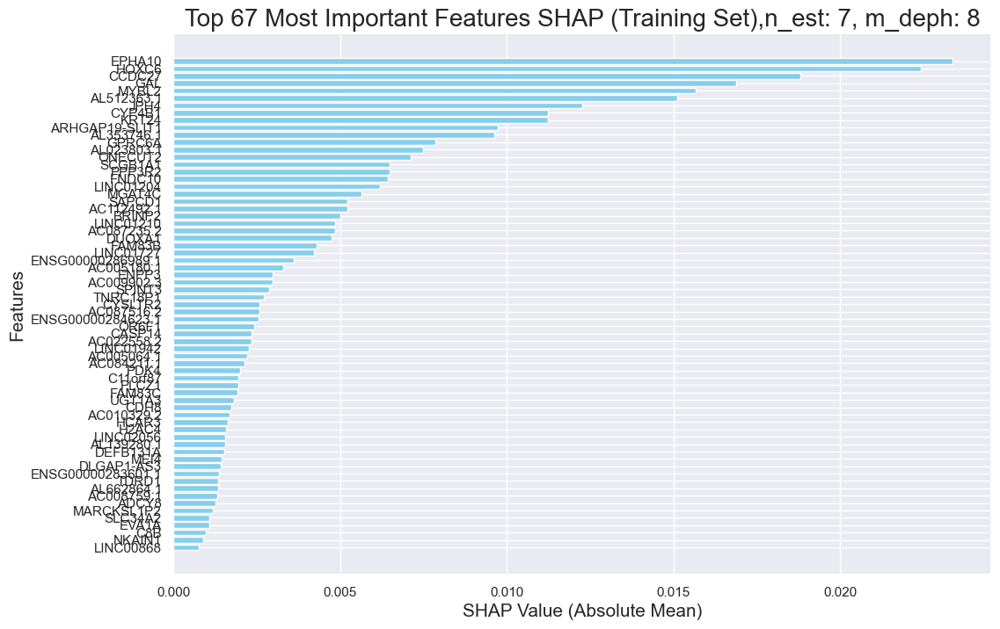

In [20]:
# Compute SHAP values for the training set
shap_values_train = explainer.shap_values(x_train)

# Calculate the absolute mean of the SHAP values along the last axis (axis=-1)
shap_values_abs_mean_train = np.abs(shap_values_train).mean(axis=-1)

N= 67
# Find the indices of features with the highest absolute mean SHAP values in the training set
top_feature_indices_train = np.argsort(shap_values_abs_mean_train.mean(axis=0))[::-1][:N]

# Retrieve the corresponding feature names from the features list
top_features_SHAP_train = [features[i] for i in top_feature_indices_train]

# Print the features with the highest absolute mean SHAP values in the training set
print("\nFeatures with the highest absolute mean SHAP values in the training set:")
for feature, shap_value in zip(top_features_SHAP_train, shap_values_abs_mean_train[:, top_feature_indices_train].mean(axis=0)):
    print("{:<30}: {:.6f}".format(feature, shap_value))

# Plot the features with the highest SHAP values in the training set
plt.figure(figsize=(12, 8))
plt.barh(top_features_SHAP_train, shap_values_abs_mean_train[:, top_feature_indices_train].mean(axis=0), color='skyblue')
plt.xlabel('SHAP Value (Absolute Mean)', fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title(f'Top {N} Most Important Features SHAP (Training Set),n_est: {n_est}, m_deph: {m_deph}', fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

# Save top features for comparison with other models
top_features_SHAP_train_split = top_features_SHAP_train


              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95        10
         1.0       1.00      0.98      0.99        62

    accuracy                           0.99        72
   macro avg       0.95      0.99      0.97        72
weighted avg       0.99      0.99      0.99        72



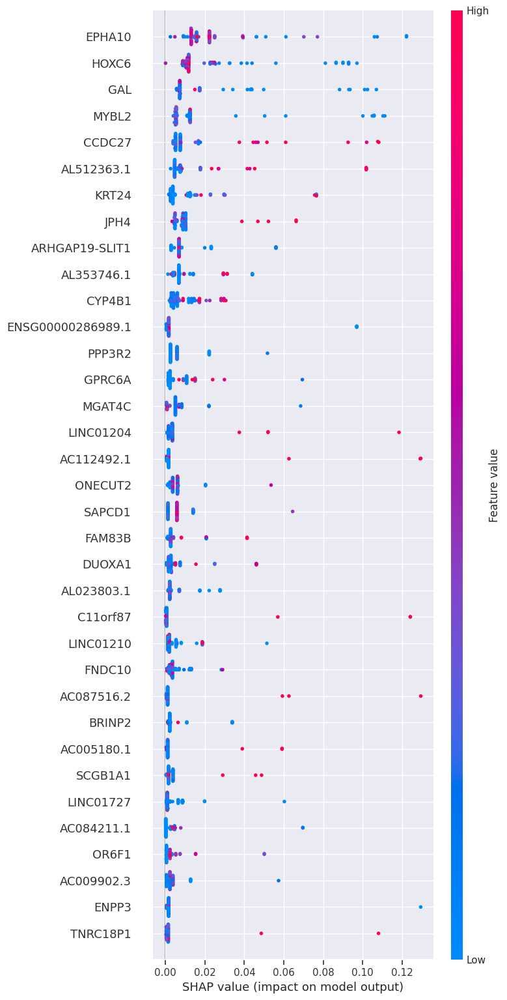

In [ ]:
# SHAP for model interpretation with DATA FRAME input and plotting using the SHAP plot utilities

# split the data in training and test sets:

df_x_train, df_x_test, y_train_df, y_test_df = train_test_split(df_x, y, test_size=0.2, random_state=42, stratify=y)

#RandomForestClassifier parameters
m_deph = 8
n_est = 7


# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)


rfc.fit(df_x_train, y_train_df)

# Prediction
y_pred = rfc.predict(df_x_test)

# Model evaluation
print(classification_report(y_pred, y_test_df))

# Create a SHAP explainer
explainer = shap.Explainer(rfc)


# Compute SHAP values for the test set
shap_values_test_df = explainer.shap_values(df_x_test) # this save just the shap values

# Calculate the absolute mean of the shap values along the last axis (axis=-1)
shap_values_abs_mean_df = np.abs(shap_values_test_df).mean(axis=-1)

shap.summary_plot(shap_values_abs_mean_df, df_x_test,max_display=35)




In [ ]:
# compute SHAP values but save as explainer
explainer = shap.Explainer(rfc, df_x_test)
shap_values_test_df_explainer = explainer(df_x_test)

In [ ]:
print('shape shap_values_test_df', shap_values_test_df.shape)
print(shap_values_test_df)
print('shape shap_values_test_df_explainer',shap_values_test_df_explainer.shape)
print(shap_values_test_df_explainer)


shape shap_values_test_df (72, 1380, 2)
[[[ 0.          0.        ]
  [ 0.          0.        ]
  [-0.00017498  0.00017498]
  ...
  [ 0.          0.        ]
  [ 0.          0.        ]
  [ 0.          0.        ]]

 [[ 0.          0.        ]
  [ 0.          0.        ]
  [-0.00058007  0.00058007]
  ...
  [ 0.          0.        ]
  [ 0.          0.        ]
  [ 0.          0.        ]]

 [[ 0.          0.        ]
  [ 0.          0.        ]
  [-0.00026217  0.00026217]
  ...
  [ 0.          0.        ]
  [ 0.          0.        ]
  [ 0.          0.        ]]

 ...

 [[ 0.          0.        ]
  [ 0.          0.        ]
  [-0.00058007  0.00058007]
  ...
  [ 0.          0.        ]
  [ 0.          0.        ]
  [ 0.          0.        ]]

 [[ 0.          0.        ]
  [ 0.          0.        ]
  [-0.00058007  0.00058007]
  ...
  [ 0.          0.        ]
  [ 0.          0.        ]
  [ 0.          0.        ]]

 [[ 0.          0.        ]
  [ 0.          0.        ]
  [-0.00058007  0.

SHAP values for class 0 (first sample): [ 0.          0.         -0.00017498 ...  0.          0.
  0.        ]
SHAP values for class 1 (first sample): [0.         0.         0.00017498 ... 0.         0.         0.        ]


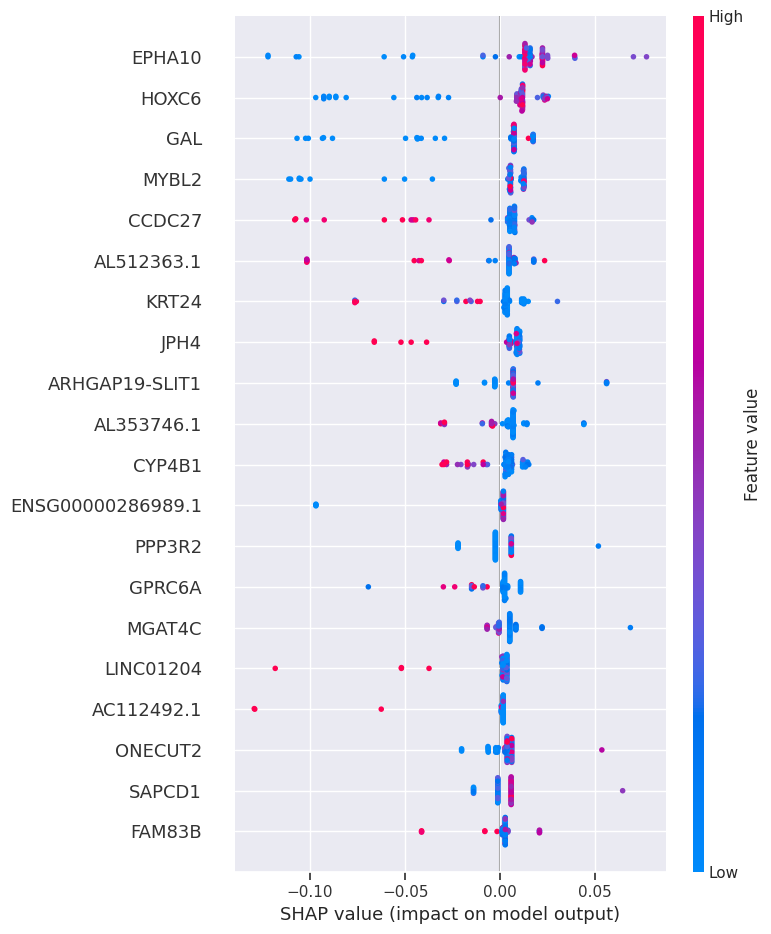

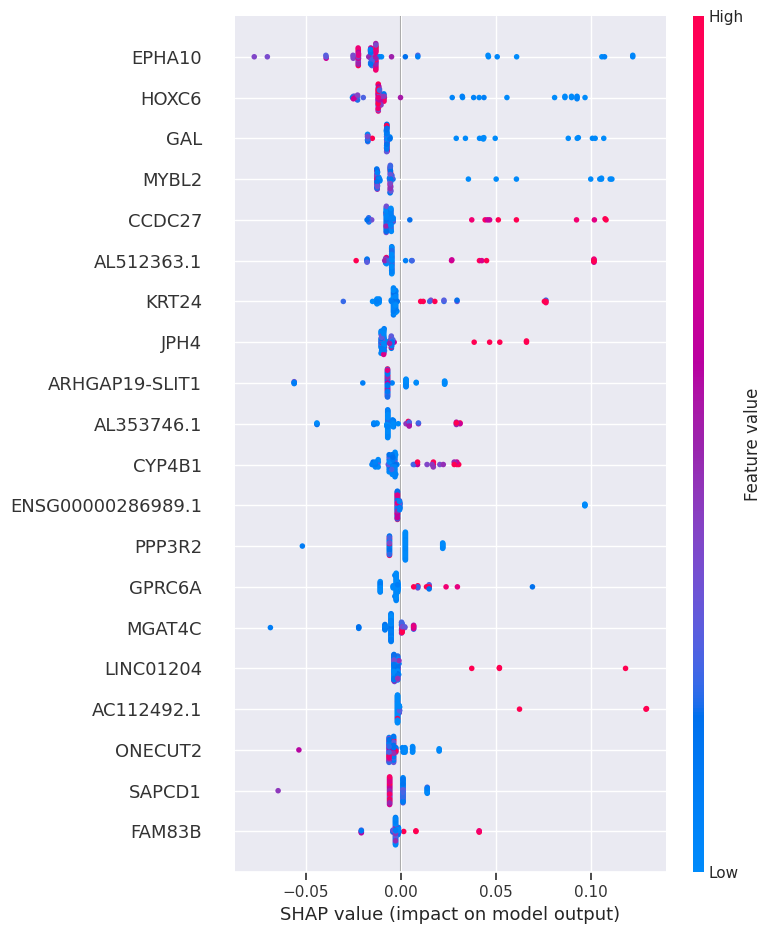

(72, 1380)


In [ ]:
 # with the binary classification, each feature has 2 shap values, for predicting both categories:SHAP value for class 1: Indicates how much each feature contributes to increasing or decreasing the probability of the positive class (class 1).
#SHAP value for class 0: Indicates how much each feature contributes to increasing or decreasing the probability of the negative class (class 0).
# This is often just the negative of the SHAP value for class 1, because increasing the probability of class 1 by a certain amount is equivalent to decreasing the probability of class 0 by the same amount, and vice versa.

shap_values_class_0 = shap_values_test_df[:, :, 0]  # SHAP values for class 0
shap_values_class_1 = shap_values_test_df[:, :, 1]  # SHAP values for class 1

# Example: SHAP values for the first sample in the test set
print("SHAP values for class 0 (first sample):", shap_values_class_0[0])
print("SHAP values for class 1 (first sample):", shap_values_class_1[0])

# Summary plot for class 1
shap.summary_plot(shap_values_class_1, df_x_test, feature_names=features)

# Summary plot for class 0
shap.summary_plot(shap_values_class_0, df_x_test, feature_names=features)

print(shap_values_class_0.shape)

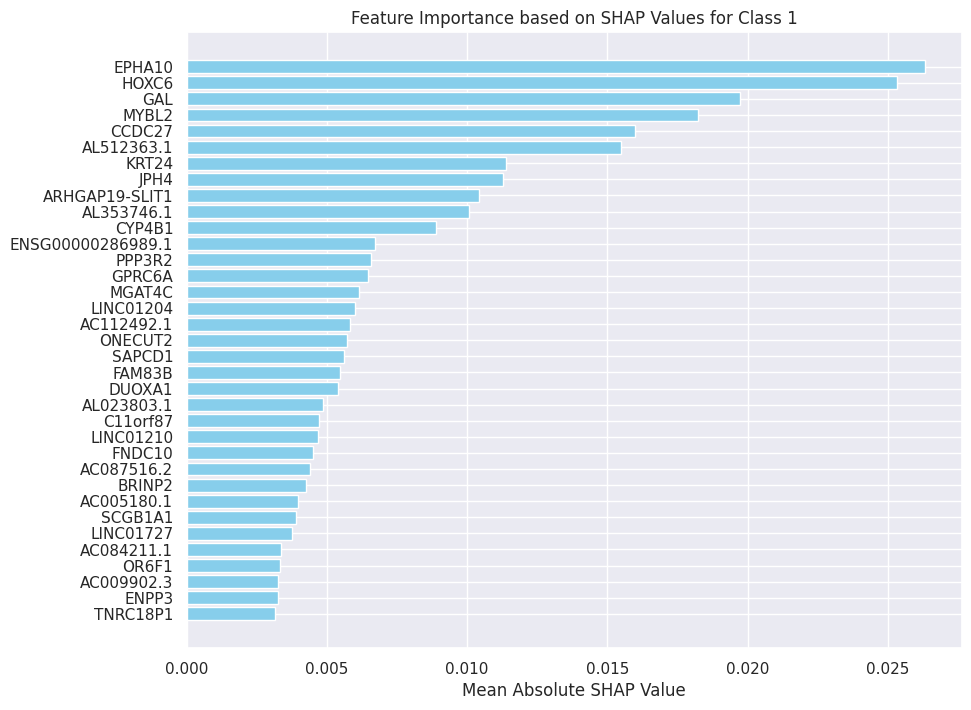

In [ ]:
# one can also plot as before the absolute mean of SHAP values

# Calculate the mean absolute SHAP values for each feature
mean_abs_shap_values_class_1 = np.mean(np.abs(shap_values_class_1), axis=0)

# Create a bar plot
plt.figure(figsize=(10, 8))
sorted_indices = np.argsort(mean_abs_shap_values_class_1)[::-1]  # Indices of features sorted by importance
sorted_features = [features[i] for i in sorted_indices]
sorted_shap_values = mean_abs_shap_values_class_1[sorted_indices]

plt.barh(sorted_features[:35], sorted_shap_values[:35], color='skyblue')  # Plot top 20 features
plt.xlabel("Mean Absolute SHAP Value")
plt.title("Feature Importance based on SHAP Values for Class 1")
plt.gca().invert_yaxis()  # Highest values at the top
plt.show()




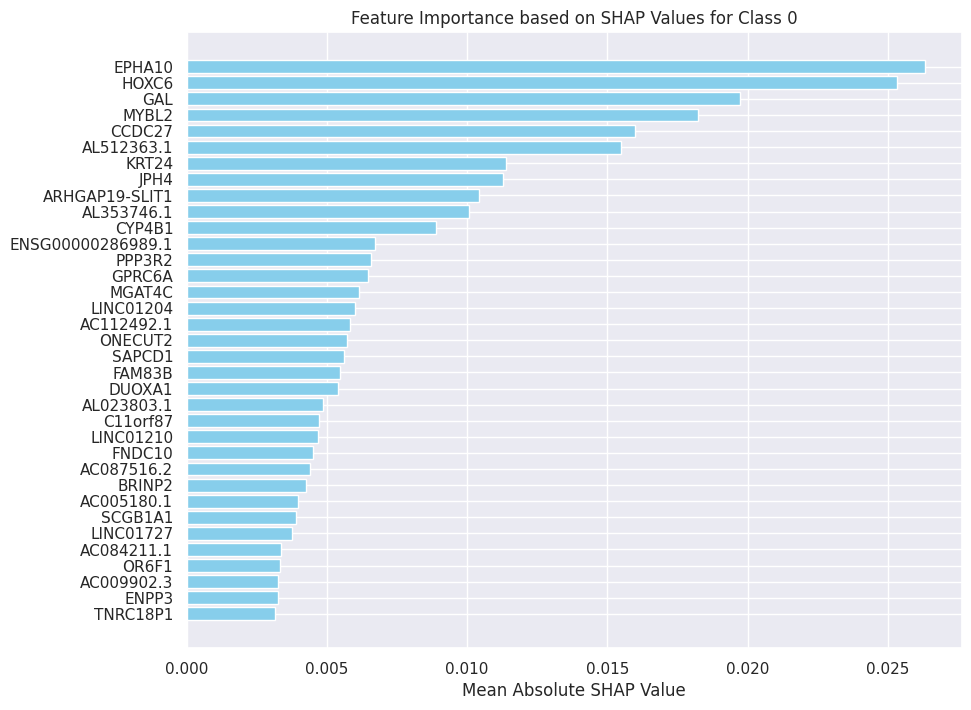

In [ ]:
# Calculate the mean absolute SHAP values for each feature for class 0 (should give the same)
mean_abs_shap_values_class_0 = np.mean(np.abs(shap_values_class_0), axis=0)

# Create a bar plot
plt.figure(figsize=(10, 8))
sorted_indices = np.argsort(mean_abs_shap_values_class_0)[::-1]  # Indices of features sorted by importance
sorted_features = [features[i] for i in sorted_indices]
sorted_shap_values = mean_abs_shap_values_class_0[sorted_indices]

plt.barh(sorted_features[:35], sorted_shap_values[:35], color='skyblue')  # Plot top 20 features
plt.xlabel("Mean Absolute SHAP Value")
plt.title("Feature Importance based on SHAP Values for Class 0")
plt.gca().invert_yaxis()  # Highest values at the top
plt.show()

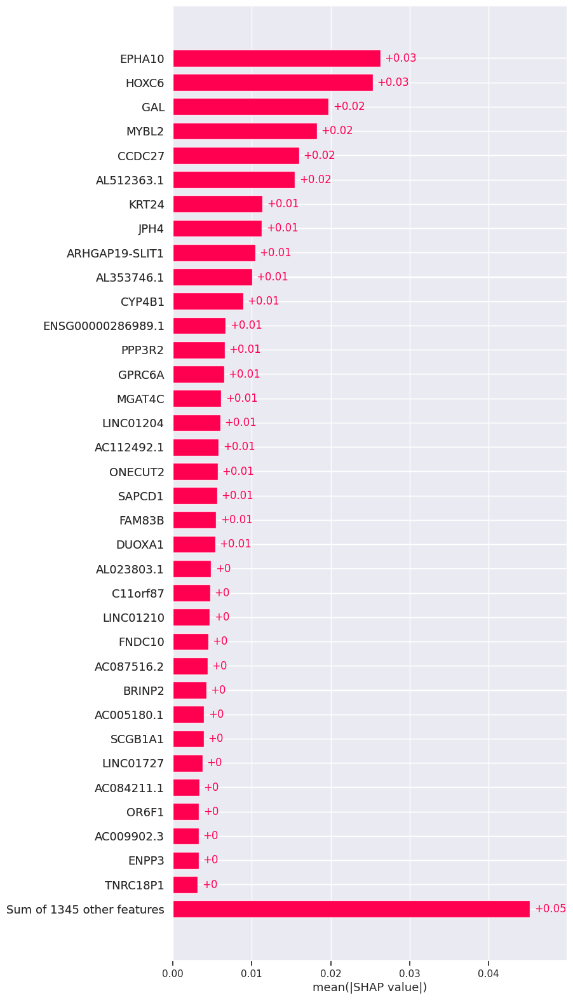

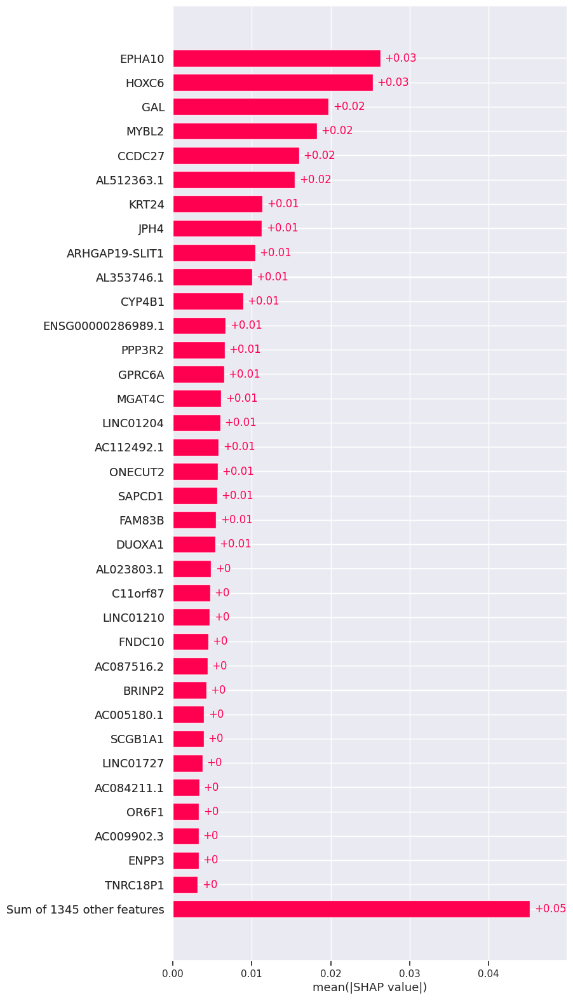

In [ ]:
# Create SHAP value objects for visualization of Shap values for class 1
shap_values_class_1 = shap.Explanation(values=shap_values_class_1,
                                       base_values=explainer.expected_value[1],
                                       data=df_x_test,
                                       feature_names=features)

# Plot bar plot using shap.plots.bar for class 1
shap.plots.bar(shap_values_class_1, max_display=36)

# Create SHAP value objects for visualization of Shap values for class 0
shap_values_class_0 = shap.Explanation(values=shap_values_class_0,
                                       base_values=explainer.expected_value[0],
                                       data=df_x_test,
                                       feature_names=features)

# Plot bar plot using shap.plots.bar for class 0
shap.plots.bar(shap_values_class_0, max_display=36)


# Clustering and dendograms of the top selected features in the validation set


Features with the highest absolute mean SHAP values:
EPHA10                        : 0.026315
HOXC6                         : 0.025320
GAL                           : 0.019731
MYBL2                         : 0.018230
CCDC27                        : 0.016000
AL512363.1                    : 0.015478
KRT24                         : 0.011376
JPH4                          : 0.011297
ARHGAP19-SLIT1                : 0.010430
AL353746.1                    : 0.010058
CYP4B1                        : 0.008895
ENSG00000286989.1             : 0.006709
PPP3R2                        : 0.006592
GPRC6A                        : 0.006482
MGAT4C                        : 0.006142
LINC01204                     : 0.006003
AC112492.1                    : 0.005824
ONECUT2                       : 0.005709
SAPCD1                        : 0.005628
FAM83B                        : 0.005479
DUOXA1                        : 0.005395
AL023803.1                    : 0.004863
C11orf87                      : 0.004717
LIN

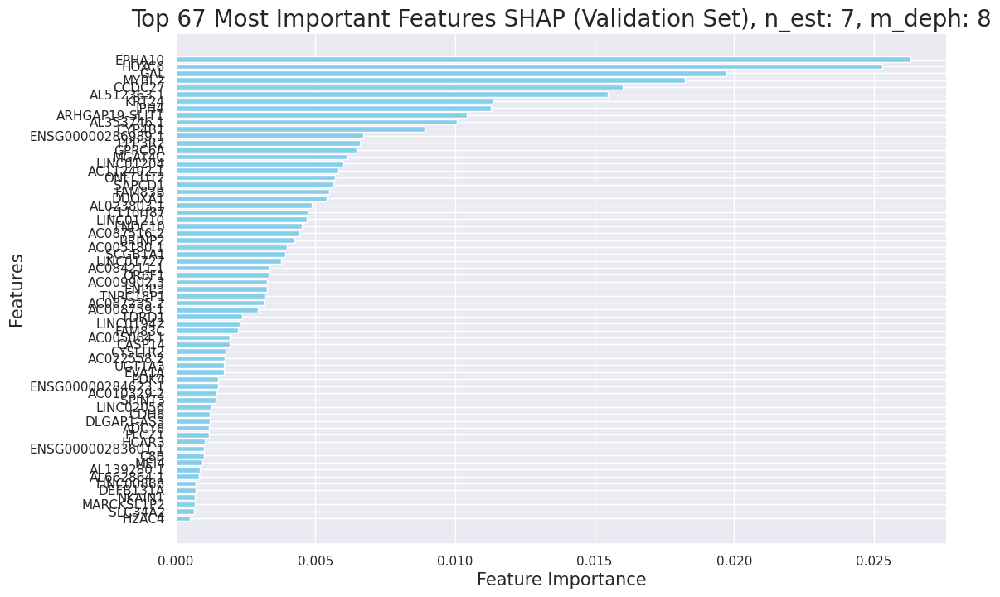

In [55]:
# calculate the top features names and indices we want to test using the Df data
N=67
top_feature_indices_test_df = np.argsort(shap_values_abs_mean_df.mean(axis=0))[::-1][:N]

# Retrieve the corresponding feature names from the features list
top_features_test_df = [features[i] for i in top_feature_indices_test_df]

# Print the features with the highest absolute mean SHAP values
print("\nFeatures with the highest absolute mean SHAP values:")
for feature, shap_value in zip(top_features_test_df, shap_values_abs_mean_df[:, top_feature_indices_test_df].mean(axis=0)):
    print("{:<30}: {:.6f}".format(feature, shap_value))


# Plot the features with the highest feature importance values
plt.figure(figsize=(12, 8))
plt.barh(top_features_test_df,shap_values_abs_mean_df[:, top_feature_indices_test_df].mean(axis=0), color='skyblue')
plt.xlabel('Feature Importance',fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title(f'Top {N} Most Important Features SHAP (Validation Set), n_est: {n_est}, m_deph: {m_deph}', fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()



In [56]:
# Step 4: Perform hierarchical clustering on these top features

# Use only the top features for clustering to manage memory usage.
print ('shape df_x_test;', df_x_test.shape)

x_test_top_features_df = df_x_test[top_features_test_df]
print('shape x_test_top_features:',x_test_top_features_df.shape)
print('shape y_test:', y_test.shape)
# Compute hierarchical clustering

clustering_df = shap.utils.hclust(x_test_top_features_df, y_test)




shape df_x_test; (72, 1380)
shape x_test_top_features: (72, 67)
shape y_test: (72,)


 54%|█████▎    | 36/67 [01:57<00:41,  1.35s/it]/usr/local/lib/python3.10/dist-packages/shap/utils/_clustering.py:126: UserWarning: No/low signal found from feature 35 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
  warnings.warn(f"No/low signal found from feature {i} (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).")
68it [02:22,  2.15s/it]


In [57]:
print("Shape of clustering:", clustering_df.shape)

Shape of clustering: (66, 4)


In [58]:
print(clustering_df )



[[7.00000000e+00 6.20000000e+01 9.26882240e-06 2.00000000e+00]
 [1.70000000e+01 5.80000000e+01 3.40888910e-02 2.00000000e+00]
 [6.70000000e+01 6.80000000e+01 3.92168388e-02 4.00000000e+00]
 [4.50000000e+01 4.90000000e+01 3.92675065e-02 2.00000000e+00]
 [2.00000000e+01 7.00000000e+01 4.66893390e-02 3.00000000e+00]
 [5.40000000e+01 6.90000000e+01 4.91618477e-02 5.00000000e+00]
 [7.10000000e+01 7.20000000e+01 5.13925962e-02 8.00000000e+00]
 [4.60000000e+01 7.30000000e+01 5.66374213e-02 9.00000000e+00]
 [3.00000000e+00 7.40000000e+01 5.83466552e-02 1.00000000e+01]
 [6.00000000e+00 7.50000000e+01 1.45470440e-01 1.10000000e+01]
 [4.00000000e+00 7.60000000e+01 1.57635480e-01 1.20000000e+01]
 [2.60000000e+01 7.70000000e+01 1.72513947e-01 1.30000000e+01]
 [1.80000000e+01 7.80000000e+01 1.89432517e-01 1.40000000e+01]
 [1.00000000e+01 7.90000000e+01 2.11298734e-01 1.50000000e+01]
 [2.00000000e+00 8.00000000e+01 2.32630894e-01 1.60000000e+01]
 [2.40000000e+01 8.10000000e+01 2.37267077e-01 1.700000

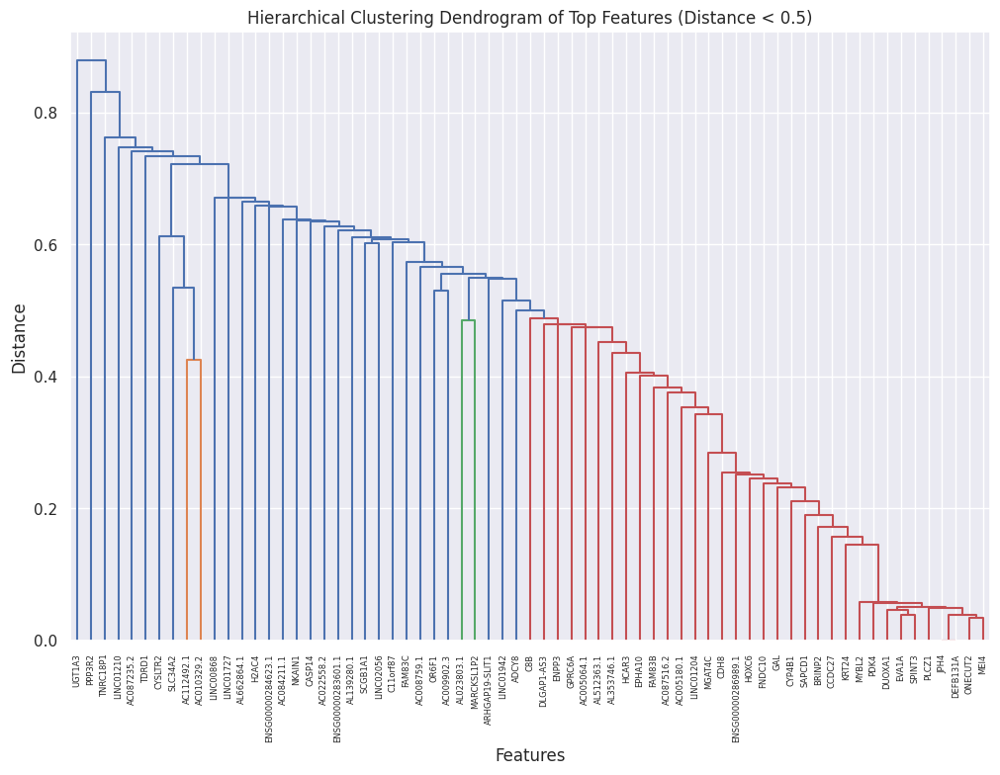

In [59]:
# plot Clusters as dendograms

# Plot dendrogram with color threshold
plt.figure(figsize=(12, 8))
dendrogram = sch.dendrogram(clustering_df, labels=top_features_test_df, color_threshold=0.5)

# Add title and labels
plt.title('Hierarchical Clustering Dendrogram of Top Features (Distance < 0.5)')
plt.xlabel('Features')
plt.ylabel('Distance')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show plot
plt.show()


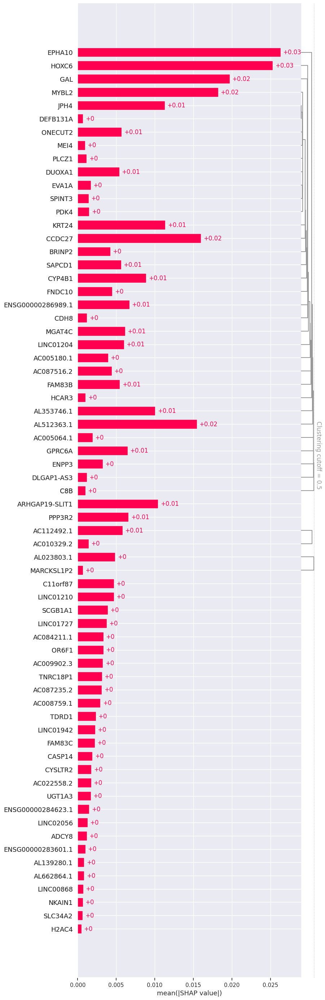

<Figure size 640x480 with 0 Axes>

In [62]:
# Plot clusters in the same graph as the shap values for the validation set

#Subset  shap_values_class_1 to only include the top selected features

shap_values_class_1_top = shap_values_class_1[:, top_feature_indices_test_df]

# Create SHAP value objects for visualization with selcted top features
shap_values_class_1_top_exp = shap.Explanation(values=shap_values_class_1_top,
                                                  base_values=explainer.expected_value[1],
                                                  data=x_test_top_features_df,
                                                  feature_names=top_features_test_df)

# Plot bar plot using shap.plots.bar with clustering for top 67 features
plt.figure(figsize=(15, 50))
shap.plots.bar(shap_values_class_1_top_exp, clustering=clustering_df, max_display=67,clustering_cutoff=0.5)
# Adjust the layout and spacing
plt.tight_layout(pad=10)  # Adjust the padding between and around subplots

# Adjust layout to provide more spacing
plt.subplots_adjust(left=0.2, right=20, top=0.9, bottom=0.1)
# Show the plot
plt.show()

# Analysis of common features /genes for model prediction

# Venn diagrams funtions:

# Venn for 3 sets:

In [13]:
# Make function to create venn diagrams and get overlapping genes/important features:

def venn_diagrams(set1, set2, set3, label1='Set 1', label2='Set 2', label3='Set 3'):
    # Convert lists of genes to sets
    set1 = set(set1)
    set2 = set(set2)
    set3 = set(set3)

    # Compute the sizes of the intersections
    sizes = [
        len(set1 - set2 - set3),        # Unique to set1
        len(set2 - set1 - set3),        # Unique to set2
        len((set1 & set2) - set3),      # Intersection of set1 and set2
        len(set3 - set1 - set2),        # Unique to set3
        len((set1 & set3) - set2),      # Intersection of set1 and set3
        len((set2 & set3) - set1),      # Intersection of set2 and set3
        len(set1 & set2 & set3)         # Common to all three sets
    ]
    print(sizes)
    # save the common genes in variables:

    Int_all= set1 & set2 & set3
    Int_set1_set2_notset3 =(set1 & set2) - set3
    Int_set1_set3_notset2 =(set1 & set3) - set2
    Int_set2_set3_notset1 =(set2 & set3) - set1

    fig = plt.figure(figsize=(8, 6))
    # Plot the Venn diagram with custom labels
    venn3([set1, set2, set3], set_labels=(label1, label2, label3))

    # Set labels outside of the function
    plt.title(f'Venn Diagram of {label1}, {label2}, and {label3}')
    #plt.legend([label1, label2, label3], loc='lower left', bbox_to_anchor=(1, 0.5))

    plt.show()


    # Print common genes in all sets
    print('Common genes in all sets:', Int_all)
    print(f'Genes in {label1} and {label2} not in {label3}:', Int_set1_set2_notset3)
    print(f'Genes in {label1} and {label3} not in {label2}:', Int_set1_set3_notset2)
    print(f'Genes in {label2} and {label3} not in {label1}:', Int_set2_set3_notset1)

    return Int_all



# Venn for 2 Sets:

In [14]:
# venn2 fucntion to get venn diagrams of 2 sets of features, get common genes lists:
def venn2_diagrams(set1, set2, label1='Set 1', label2='Set 2'):
    # Convert lists of genes to sets
    set1 = set(set1)
    set2 = set(set2)


    # Compute the sizes of the intersections
    sizes = [
        len(set1 - set2),        # Unique to set1
        len(set2 - set1),        # Unique to set2
        len((set1 & set2))]      # Intersection of set1 and set2

    print(sizes)
    # save the common genes in variables:

    Int_all= set1 & set2
    Unique_set1 = set1 - set2
    Unique_set2= set2 - set1


    fig = plt.figure(figsize=(8, 6))
    # Plot the Venn diagram with custom labels
    venn2([set1, set2], set_labels=(label1, label2))

    # Set labels outside of the function
    plt.title(f'Venn Diagram of {label1},and, {label2}')
   # plt.legend([label1, label2], loc='lower left', bbox_to_anchor=(1, 0.5))

    plt.show()


    # Print common genes in all sets
    print('Common genes in all sets:', Int_all)

    # # I would then trust the features that appear in the training sets by Gini 
    #And that they were found also important in the test sets either in permutation importance analyis or SHAP analyis
    # so the intersection, plus the ones that are only in int_all_call_1 and Int_all_cal_2

    Top_Selected_Features = Int_all | Unique_set1 | Unique_set2


    return Int_all, Top_Selected_Features




# Analysing common genes by making venn diagrams for different calculated feature importance and DE genes data sets

[0, 0, 45, 0, 0, 0, 22]


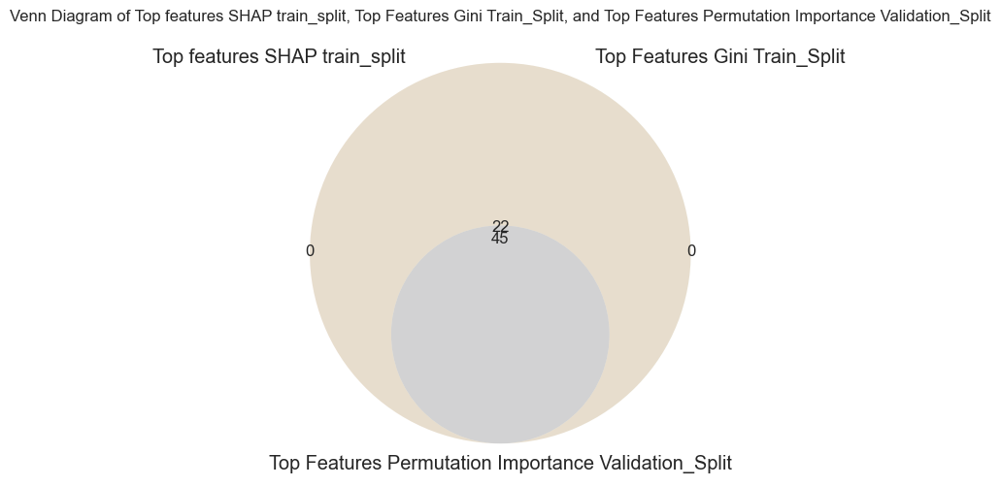

Common genes in all sets: {'SAPCD1', 'EPHA10', 'ENPP3', 'AC005180.1', 'MYBL2', 'KRT24', 'ARHGAP19-SLIT1', 'AC010329.2', 'PDK4', 'JPH4', 'FAM83C', 'ENSG00000286989.1', 'DUOXA1', 'AC008759.1', 'AC022558.2', 'AC087235.2', 'CCDC27', 'AC005064.1', 'GAL', 'EVA1A', 'SCGB1A1', 'PPP3R2'}
Genes in Top features SHAP train_split and Top Features Gini Train_Split not in Top Features Permutation Importance Validation_Split: {'HOXC6', 'SLC34A2', 'SPINT3', 'ADCY8', 'BRINP2', 'LINC02056', 'FNDC10', 'AL353746.1', 'AC112492.1', 'AC087516.2', 'AC084211.1', 'H2AC4', 'ENSG00000283601.1', 'CASP14', 'LINC00868', 'LINC01204', 'C11orf87', 'LINC01942', 'OR6F1', 'FAM83B', 'CDH8', 'HCAR3', 'AL512363.1', 'AL023803.1', 'UGT1A3', 'CYSLTR2', 'PLCZ1', 'AL139280.1', 'AL662864.1', 'MARCKSL1P2', 'DLGAP1-AS3', 'AC009902.3', 'DEFB131A', 'NKAIN1', 'LINC01210', 'C8B', 'LINC01727', 'TNRC18P1', 'GPRC6A', 'CYP4B1', 'MEI4', 'ENSG00000284623.1', 'ONECUT2', 'TDRD1', 'MGAT4C'}
Genes in Top features SHAP train_split and Top Features 

In [23]:
# # call funtion with different lists
Int_split_SHAP_Gini_train_Perm_test= venn_diagrams(top_features_SHAP_train_split, Gini_split_top_features_train, Permutation_split_top_features_test,
      label1='Top features SHAP train_split', label2='Top Features Gini Train_Split', label3='Top Features Permutation Importance Validation_Split')

print(Int_split_SHAP_Gini_train_Perm_test)

[0, 0, 45, 0, 0, 0, 22]


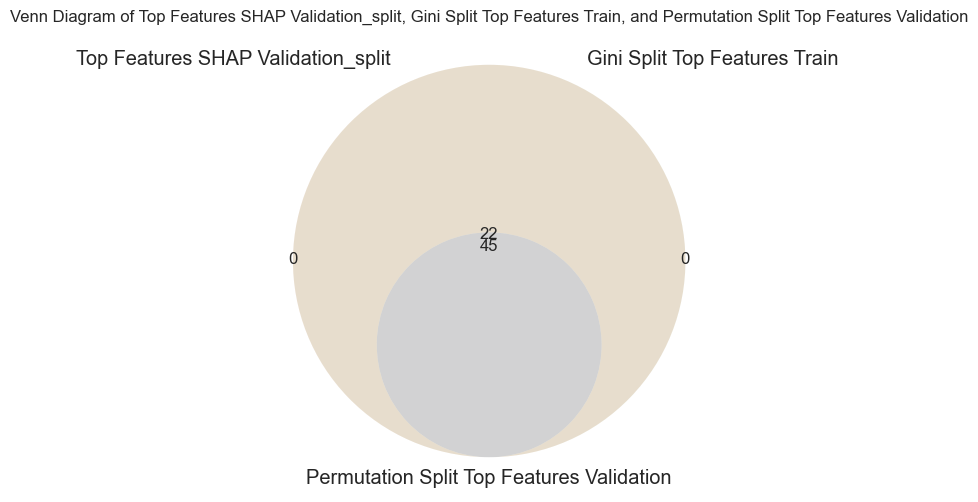

Common genes in all sets: {'SAPCD1', 'EPHA10', 'ENPP3', 'AC005180.1', 'MYBL2', 'KRT24', 'ARHGAP19-SLIT1', 'AC010329.2', 'PDK4', 'JPH4', 'FAM83C', 'ENSG00000286989.1', 'DUOXA1', 'AC008759.1', 'AC022558.2', 'AC087235.2', 'CCDC27', 'AC005064.1', 'GAL', 'EVA1A', 'SCGB1A1', 'PPP3R2'}
Genes in Top Features SHAP Validation_split and Gini Split Top Features Train not in Permutation Split Top Features Validation: {'HOXC6', 'SLC34A2', 'SPINT3', 'ADCY8', 'BRINP2', 'LINC02056', 'FNDC10', 'AL353746.1', 'AC112492.1', 'AC087516.2', 'AC084211.1', 'H2AC4', 'ENSG00000283601.1', 'CASP14', 'LINC00868', 'LINC01204', 'C11orf87', 'LINC01942', 'OR6F1', 'FAM83B', 'CDH8', 'HCAR3', 'AL512363.1', 'AL023803.1', 'UGT1A3', 'CYSLTR2', 'PLCZ1', 'AL139280.1', 'AL662864.1', 'MARCKSL1P2', 'DLGAP1-AS3', 'AC009902.3', 'DEFB131A', 'NKAIN1', 'LINC01210', 'C8B', 'LINC01727', 'TNRC18P1', 'GPRC6A', 'CYP4B1', 'MEI4', 'ENSG00000284623.1', 'ONECUT2', 'TDRD1', 'MGAT4C'}
Genes in Top Features SHAP Validation_split and Permutation Sp

{'AC005064.1',
 'AC005180.1',
 'AC008759.1',
 'AC010329.2',
 'AC022558.2',
 'AC087235.2',
 'ARHGAP19-SLIT1',
 'CCDC27',
 'DUOXA1',
 'ENPP3',
 'ENSG00000286989.1',
 'EPHA10',
 'EVA1A',
 'FAM83C',
 'GAL',
 'JPH4',
 'KRT24',
 'MYBL2',
 'PDK4',
 'PPP3R2',
 'SAPCD1',
 'SCGB1A1'}

In [24]:
# call funtion with different lists
venn_diagrams(top_features_SHAP_test_split, Gini_split_top_features_train, Permutation_split_top_features_test,
      label1='Top Features SHAP Validation_split', label2='Gini Split Top Features Train', label3='Permutation Split Top Features Validation')



[0, 0, 45, 0, 0, 0, 22]


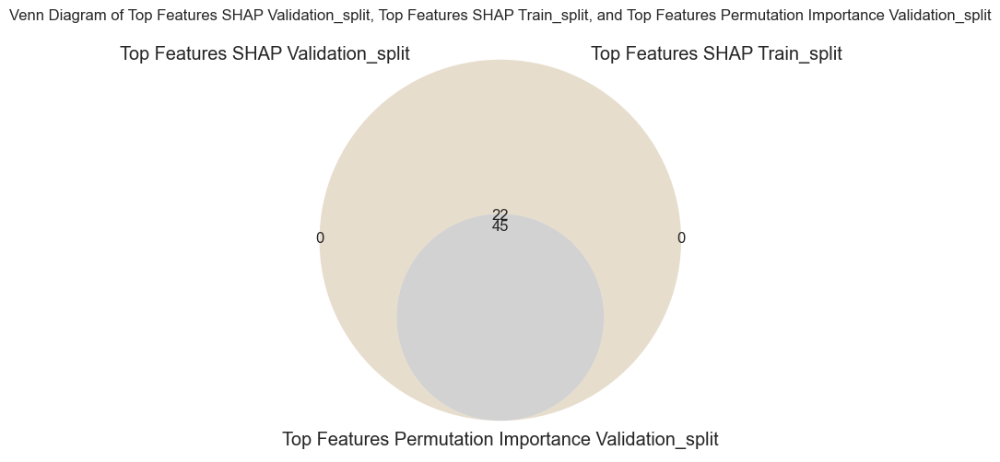

Common genes in all sets: {'FAM83C', 'ARHGAP19-SLIT1', 'GAL', 'SAPCD1', 'EPHA10', 'KRT24', 'EVA1A', 'PPP3R2', 'DUOXA1', 'ENPP3', 'AC005064.1', 'AC022558.2', 'PDK4', 'MYBL2', 'AC008759.1', 'JPH4', 'SCGB1A1', 'AC010329.2', 'CCDC27', 'AC087235.2', 'ENSG00000286989.1', 'AC005180.1'}
Genes in Top Features SHAP Validation_split and Top Features SHAP Train_split not in Top Features Permutation Importance Validation_split: {'FNDC10', 'DLGAP1-AS3', 'MGAT4C', 'LINC00868', 'OR6F1', 'FAM83B', 'AC084211.1', 'NKAIN1', 'CYSLTR2', 'C8B', 'LINC01727', 'AL512363.1', 'BRINP2', 'TNRC18P1', 'AL353746.1', 'CASP14', 'UGT1A3', 'HCAR3', 'AC009902.3', 'HOXC6', 'AC087516.2', 'H2AC4', 'MARCKSL1P2', 'DEFB131A', 'LINC01210', 'ENSG00000283601.1', 'TDRD1', 'GPRC6A', 'ONECUT2', 'AC112492.1', 'LINC02056', 'AL139280.1', 'MEI4', 'SLC34A2', 'LINC01942', 'ENSG00000284623.1', 'AL662864.1', 'LINC01204', 'ADCY8', 'CDH8', 'SPINT3', 'PLCZ1', 'AL023803.1', 'C11orf87', 'CYP4B1'}
Genes in Top Features SHAP Validation_split and Top

{'AC005064.1',
 'AC005180.1',
 'AC008759.1',
 'AC010329.2',
 'AC022558.2',
 'AC087235.2',
 'ARHGAP19-SLIT1',
 'CCDC27',
 'DUOXA1',
 'ENPP3',
 'ENSG00000286989.1',
 'EPHA10',
 'EVA1A',
 'FAM83C',
 'GAL',
 'JPH4',
 'KRT24',
 'MYBL2',
 'PDK4',
 'PPP3R2',
 'SAPCD1',
 'SCGB1A1'}

In [ ]:
venn_diagrams(top_features_SHAP_test_split, top_features_SHAP_train_split, Permutation_split_top_features_test,
      label1='Top Features SHAP Validation_split', label2='Top Features SHAP Train_split', label3='Top Features Permutation Importance Validation_split')


[0, 0, 0, 0, 0, 0, 67]


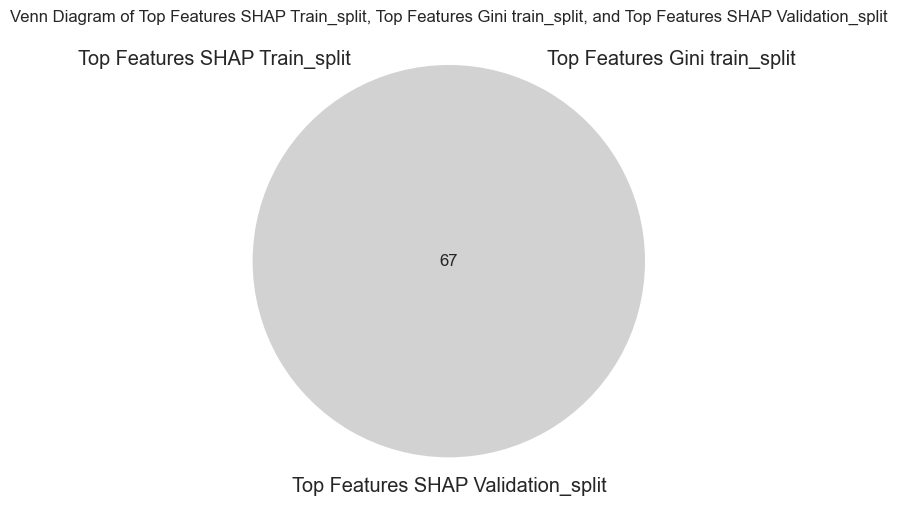

Common genes in all sets: {'HOXC6', 'SAPCD1', 'SLC34A2', 'SPINT3', 'EPHA10', 'ADCY8', 'BRINP2', 'LINC02056', 'AC112492.1', 'AL353746.1', 'FNDC10', 'AC087516.2', 'AC084211.1', 'ENPP3', 'ENSG00000283601.1', 'AC005180.1', 'CASP14', 'LINC00868', 'MYBL2', 'KRT24', 'ARHGAP19-SLIT1', 'LINC01204', 'C11orf87', 'AC010329.2', 'LINC01942', 'MGAT4C', 'H2AC4', 'OR6F1', 'PDK4', 'FAM83B', 'JPH4', 'CDH8', 'HCAR3', 'AL512363.1', 'FAM83C', 'AL023803.1', 'UGT1A3', 'ENSG00000286989.1', 'DUOXA1', 'AC008759.1', 'PLCZ1', 'AL139280.1', 'AC087235.2', 'AC022558.2', 'AL662864.1', 'MARCKSL1P2', 'AC009902.3', 'DLGAP1-AS3', 'DEFB131A', 'CCDC27', 'NKAIN1', 'LINC01210', 'C8B', 'AC005064.1', 'LINC01727', 'TNRC18P1', 'GAL', 'SCGB1A1', 'EVA1A', 'PPP3R2', 'GPRC6A', 'CYP4B1', 'ENSG00000284623.1', 'MEI4', 'ONECUT2', 'TDRD1', 'CYSLTR2'}
Genes in Top Features SHAP Train_split and Top Features Gini train_split not in Top Features SHAP Validation_split: set()
Genes in Top Features SHAP Train_split and Top Features SHAP Validati

In [25]:
Int_split_SHAP_Gini_train_SHAP_test= venn_diagrams(top_features_SHAP_train_split, Gini_split_top_features_train, top_features_SHAP_test_split,
      label1='Top Features SHAP Train_split', label2='Top Features Gini train_split', label3='Top Features SHAP Validation_split')

print(Int_split_SHAP_Gini_train_SHAP_test)

[0, 0, 0, 0, 0, 45, 22]


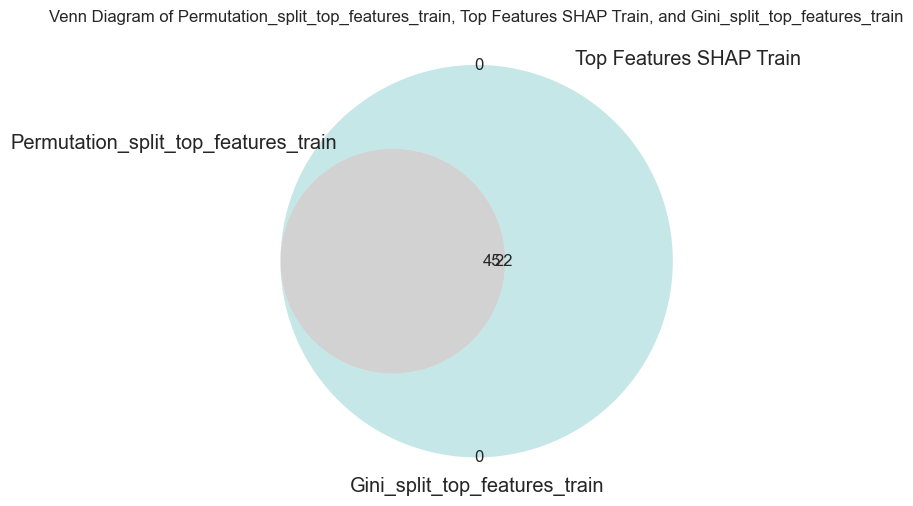

Common genes in all sets: {'ARHGAP19-SLIT1', 'GAL', 'MGAT4C', 'SAPCD1', 'EPHA10', 'KRT24', 'FAM83B', 'AL512363.1', 'AC005064.1', 'PDK4', 'CASP14', 'MYBL2', 'MARCKSL1P2', 'SLC34A2', 'SCGB1A1', 'AL139280.1', 'MEI4', 'CCDC27', 'ENSG00000284623.1', 'LINC01204', 'PLCZ1', 'AC087235.2'}
Genes in Permutation_split_top_features_train and Top Features SHAP Train not in Gini_split_top_features_train: set()
Genes in Permutation_split_top_features_train and Gini_split_top_features_train not in Top Features SHAP Train: set()
Genes in Top Features SHAP Train and Gini_split_top_features_train not in Permutation_split_top_features_train: {'FAM83C', 'FNDC10', 'DLGAP1-AS3', 'LINC00868', 'OR6F1', 'PPP3R2', 'EVA1A', 'AC084211.1', 'NKAIN1', 'DUOXA1', 'CYSLTR2', 'ENPP3', 'C8B', 'LINC01727', 'BRINP2', 'AC022558.2', 'TNRC18P1', 'AL353746.1', 'HCAR3', 'UGT1A3', 'AC009902.3', 'HOXC6', 'AC087516.2', 'H2AC4', 'AC008759.1', 'DEFB131A', 'LINC01210', 'AC112492.1', 'ONECUT2', 'JPH4', 'GPRC6A', 'TDRD1', 'LINC02056', 'E

{'AC005064.1',
 'AC087235.2',
 'AL139280.1',
 'AL512363.1',
 'ARHGAP19-SLIT1',
 'CASP14',
 'CCDC27',
 'ENSG00000284623.1',
 'EPHA10',
 'FAM83B',
 'GAL',
 'KRT24',
 'LINC01204',
 'MARCKSL1P2',
 'MEI4',
 'MGAT4C',
 'MYBL2',
 'PDK4',
 'PLCZ1',
 'SAPCD1',
 'SCGB1A1',
 'SLC34A2'}

In [ ]:
venn_diagrams(Permutation_split_top_features_train, top_features_SHAP_train_split, Gini_split_top_features_train,
      label1='Permutation_split_top_features_train', label2='Top Features SHAP Train', label3='Gini_split_top_features_train')
# makes no sense to use the permutation importance in the train set...since many featurs were 0 values, but the Gini and SHAP impprtance have a high overlap

[0, 0, 0, 34, 11, 11, 11]


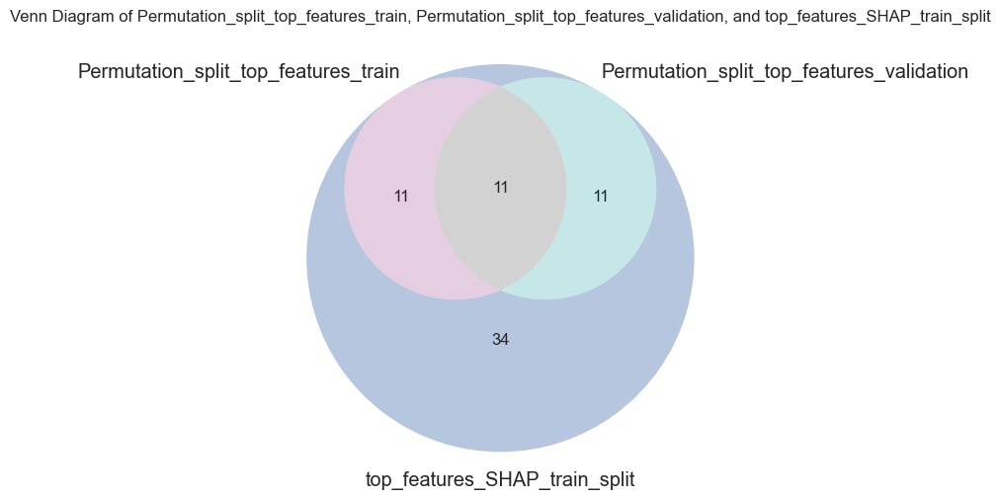

Common genes in all sets: {'PDK4', 'CCDC27', 'ARHGAP19-SLIT1', 'GAL', 'MYBL2', 'EPHA10', 'SAPCD1', 'AC087235.2', 'KRT24', 'SCGB1A1', 'AC005064.1'}
Genes in Permutation_split_top_features_train and Permutation_split_top_features_validation not in top_features_SHAP_train_split: set()
Genes in Permutation_split_top_features_train and top_features_SHAP_train_split not in Permutation_split_top_features_validation: {'FAM83B', 'CASP14', 'ENSG00000284623.1', 'MGAT4C', 'LINC01204', 'MARCKSL1P2', 'PLCZ1', 'AL512363.1', 'SLC34A2', 'AL139280.1', 'MEI4'}
Genes in Permutation_split_top_features_validation and top_features_SHAP_train_split not in Permutation_split_top_features_train: {'FAM83C', 'EVA1A', 'PPP3R2', 'AC008759.1', 'DUOXA1', 'ENPP3', 'JPH4', 'ENSG00000286989.1', 'AC010329.2', 'AC022558.2', 'AC005180.1'}


{'AC005064.1',
 'AC087235.2',
 'ARHGAP19-SLIT1',
 'CCDC27',
 'EPHA10',
 'GAL',
 'KRT24',
 'MYBL2',
 'PDK4',
 'SAPCD1',
 'SCGB1A1'}

In [ ]:
venn_diagrams(Permutation_split_top_features_train, Permutation_split_top_features_test, top_features_SHAP_train_split,
      label1='Permutation_split_top_features_train', label2='Permutation_split_top_features_validation', label3='top_features_SHAP_train_split')
# makes no sense to use the permutation importance in the train set...since many featurs were 0 values, but the Gini and SHAP impprtance have a high overlap


[0, 0, 0, 34, 11, 11, 11]


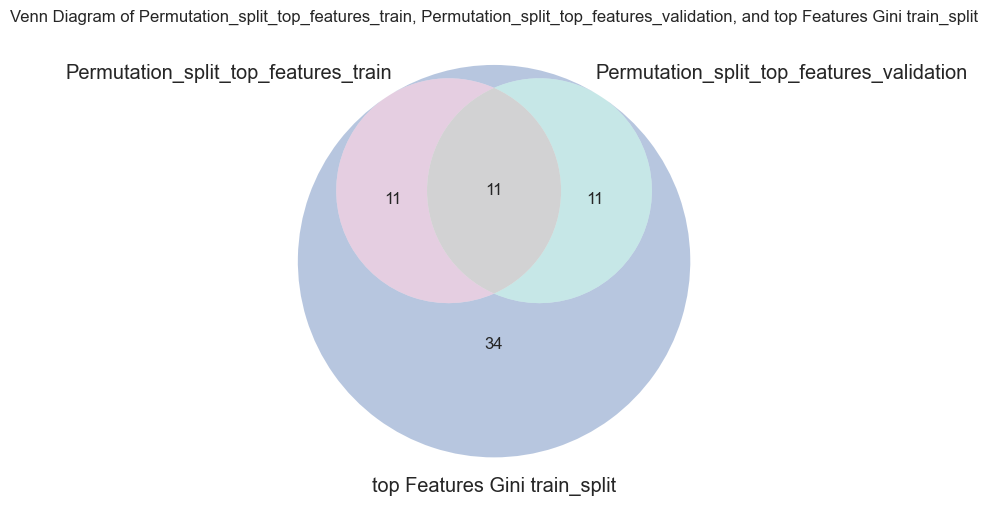

Common genes in all sets: {'PDK4', 'CCDC27', 'ARHGAP19-SLIT1', 'GAL', 'MYBL2', 'EPHA10', 'SAPCD1', 'AC087235.2', 'KRT24', 'SCGB1A1', 'AC005064.1'}
Genes in Permutation_split_top_features_train and Permutation_split_top_features_validation not in top Features Gini train_split: set()
Genes in Permutation_split_top_features_train and top Features Gini train_split not in Permutation_split_top_features_validation: {'FAM83B', 'CASP14', 'ENSG00000284623.1', 'MGAT4C', 'LINC01204', 'MARCKSL1P2', 'PLCZ1', 'AL512363.1', 'SLC34A2', 'AL139280.1', 'MEI4'}
Genes in Permutation_split_top_features_validation and top Features Gini train_split not in Permutation_split_top_features_train: {'FAM83C', 'EVA1A', 'PPP3R2', 'AC008759.1', 'DUOXA1', 'ENPP3', 'JPH4', 'ENSG00000286989.1', 'AC010329.2', 'AC022558.2', 'AC005180.1'}


{'AC005064.1',
 'AC087235.2',
 'ARHGAP19-SLIT1',
 'CCDC27',
 'EPHA10',
 'GAL',
 'KRT24',
 'MYBL2',
 'PDK4',
 'SAPCD1',
 'SCGB1A1'}

In [ ]:
venn_diagrams(Permutation_split_top_features_train, Permutation_split_top_features_test, Gini_split_top_features_train,
      label1='Permutation_split_top_features_train', label2='Permutation_split_top_features_validation', label3='top Features Gini train_split')
# makes no sense to use the permutation importance in the train set...since many featurs were 0 values, but the Gini and SHAP impprtance have a high overlap


In [ ]:
# get the list of the top genes with higher log2fold DE (already selected pval 0.05 and fold >2 or < -2) to compare as well
# change path or script to open in google collab

DE_Genes_PRAD_filtered_padj_pval = pd.read_csv(os.path.join(OUTPUT_PATH,'DE_Genes_PRAD_filtered_padj_pval.csv'))
DE_Genes_PRAD_filtered_padj_pval
print(DE_Genes_PRAD_filtered_padj_pval)
# Since the table is order by log 2 fold descending we take the 100 up and down rows in the table:
# get the top 100 upregulate genes in tumors:

Number_genes= 100
TOP_DE_Up_regulated_DF = DE_Genes_PRAD_filtered_padj_pval.iloc[0:Number_genes,:]

TOP_DE_Up_regulated_genes =TOP_DE_Up_regulated_DF["gene_name"].tolist()
print(TOP_DE_Up_regulated_genes)

# get the top 100 downregulated genes in tumors:

TOP_DE_Down_regulated_DF = DE_Genes_PRAD_filtered_padj_pval.iloc[- Number_genes:,:]
TOP_DE_Down_regulated_genes =TOP_DE_Down_regulated_DF["gene_name"].tolist()

# retrive the TOP both (down-up) DE expressed genes (higher abs value of log2fold)

#Sort the DataFrame based on the absolute log2fold change value in descending order
DE_Genes_PRAD_filtered_padj_pval_sorted = DE_Genes_PRAD_filtered_padj_pval.reindex(DE_Genes_PRAD_filtered_padj_pval['log2FoldChange'].abs().sort_values(ascending=False).index)

# Retrieve the top DE genes with the highest absolute log2fold change values
TOP_DE_genes_DE = DE_Genes_PRAD_filtered_padj_pval_sorted.head(Number_genes)  # Change N to the number of top genes to retrieve
#DE_Genes_PRAD_filtered_padj_pval_sorted
TOP_DE_genes = TOP_DE_genes_DE["gene_name"].tolist()
TOP_DE_genes


DataMiner-main/PRAD/pyDeseq2_output
                 gene_id       baseMean  log2FoldChange     lfcSE       stat  \
0      ENSG00000286051.1      27.717864        6.907367  1.101520   6.270759   
1      ENSG00000235687.9      56.492625        6.696587  0.696363   9.616520   
2      ENSG00000234918.1      10.620741        6.248233  0.978153   6.387784   
3     ENSG00000203972.10      13.605079        5.992823  0.873671   6.859358   
4      ENSG00000258162.4     170.584842        5.701483  0.447602  12.737831   
...                  ...            ...             ...       ...        ...   
1375   ENSG00000124157.7  105632.470313       -9.066004  0.629150 -14.409921   
1376  ENSG00000124233.12  221128.511679       -9.323130  0.676771 -13.775893   
1377   ENSG00000215203.3      26.453573       -9.536459  0.751186 -12.695211   
1378   ENSG00000181562.5     153.687657       -9.760261  1.214192  -8.038480   
1379  ENSG00000122133.17     357.327049       -9.796896  0.594667 -16.474589   

   

['PAEP',
 'EDDM3A',
 'GRXCR1',
 'SEMG1',
 'SEMG2',
 'TMEM114',
 'AQP2',
 'PATE4',
 'PATE1',
 'DEFB131A',
 'EDDM3B',
 'PIP',
 'CLDN2',
 'POU3F3',
 'CRISP1',
 'SPINK2',
 'ACSL6-AS1',
 'ENSG00000286051.1',
 'SERPINA5',
 'SCGB1D4',
 'LINC00993',
 'AL049767.1',
 'LCN1',
 'EMX2',
 'SULT2A1',
 'SLC13A2',
 'AL157387.1',
 'ENSG00000286523.1',
 'LINC01159',
 'KCNJ16',
 'PANTR1',
 'SLAMF6P1',
 'HOXB8',
 'LINC02707',
 'LHX1',
 'GLYATL3',
 'MFSD2A',
 'OR7E83P',
 'ENSG00000286922.1',
 'PKD1L2',
 'EMX2OS',
 'SIM1',
 'AC069228.1',
 'CES5A',
 'DEFB129',
 'UGT2B7',
 'Z82210.1',
 'PATE3',
 'AL354793.1',
 'SPINK13',
 'ANXA13',
 'APOA2',
 'PAEPP1',
 'AL513324.1',
 'LIPF',
 'OR7E85P',
 'AC079612.1',
 'PATE2',
 'LINC02137',
 'SPINT3',
 'LINC01475',
 'MCF2',
 'LINC02674',
 'SMR3B',
 'OPRPN',
 'GPC5-AS1',
 'FAM83A',
 'LHX1-DT',
 'COL2A1',
 'AC025252.2',
 'CDX4',
 'ANKRD30A',
 'AL035660.2',
 'ENSG00000285012.1',
 'ZIC5',
 'CRAT37',
 'KRT24',
 'HS3ST5',
 'HOXB-AS3',
 'AL161645.1',
 'NPFFR2',
 'SLC45A2',
 'ENSG00

In [ ]:
# get the TOP DE genes selected only by the lower padj
# reorder the data frame with ascending padj
# take the upper 100 genes

#Sort the DataFrame
DE_Genes_PRAD_filtered_padj_pval_sorted_by_padj = DE_Genes_PRAD_filtered_padj_pval.reindex(DE_Genes_PRAD_filtered_padj_pval['padj'].sort_values(ascending=True).index)

# Retrieve the top 100 DE genes with the lowest padj

TOP_DE_genes_DF_by_paj = DE_Genes_PRAD_filtered_padj_pval_sorted_by_padj.head(Number_genes)  # Change N to the number of top genes to retrieve
#DE_Genes_PRAD_filtered_padj_pval_sorted convert to list
TOP_DE_genes_by_padj = TOP_DE_genes_DF_by_paj["gene_name"].tolist()
TOP_DE_genes_by_padj


['MFSD2A',
 'SERPINA5',
 'MCF2',
 'PKD1L2',
 'AKR1B1',
 'ACSL6',
 'EMX2',
 'CRTAC1',
 'CLDN2',
 'KLHL14',
 'HOXB8',
 'SPINK2',
 'EMX2OS',
 'PIP',
 'NDRG4',
 'ATP13A4',
 'RASL10B',
 'LINC00839',
 'SLC2A9',
 'WNT9B',
 'MRO',
 'PATE2',
 'LINC01116',
 'CYP19A1',
 'CA2',
 'CYSLTR2',
 'KCP',
 'LINC02137',
 'KCNJ5',
 'EPHA10',
 'TMEM114',
 'ABCG2',
 'LPL',
 'ANO1',
 'NKX2-3',
 'ANO7L1',
 'ANXA13',
 'PAQR8',
 'ENSG00000285417.1',
 'PAEP',
 'ENSG00000288547.3',
 'KCNJ16',
 'AC012123.1',
 'HPN-AS1',
 'PTGES',
 'SPINK13',
 'GSTM3',
 'PNMT',
 'FUT3',
 'SLC45A2',
 'AC074141.1',
 'ENSG00000286250.1',
 'HPN',
 'PIK3C2G',
 'ENSG00000286523.1',
 'SLC16A12',
 'SLC13A2',
 'ZPLD2P',
 'FAM83A',
 'CLU',
 'AQP2',
 'PATE4',
 'KIRREL3',
 'PCAT7',
 'GCNT4',
 'AL354793.1',
 'PLA2G4A',
 'EVA1A',
 'ENSG00000286201.1',
 'UNC5B',
 'AMACR',
 'KCNJ15',
 'STAC2',
 'QPRT',
 'AC103702.2',
 'HS3ST5',
 'FRMD3',
 'LINC01085',
 'SLCO4C1',
 'UGT2B7',
 'G0S2',
 'CHEK1',
 'AL161645.1',
 'HOXB6',
 'HOXC6',
 'ZIC2',
 'SEMG2',
 'P

[99, 99, 0, 20, 1, 1, 0]


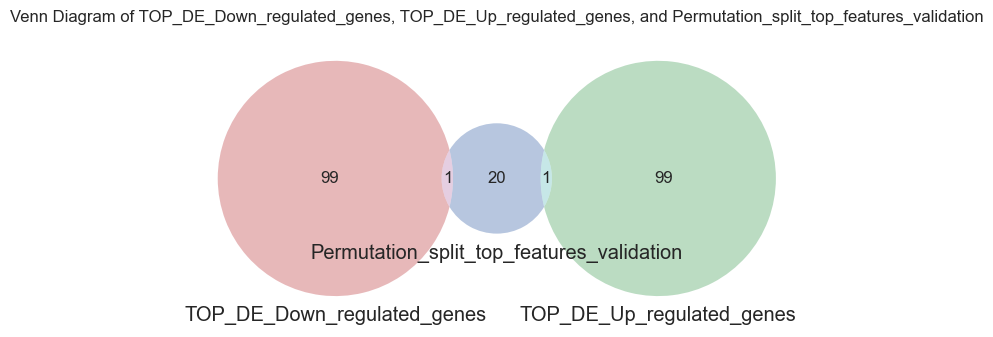

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in Permutation_split_top_features_validation: set()
Genes in TOP_DE_Down_regulated_genes and Permutation_split_top_features_validation not in TOP_DE_Up_regulated_genes: {'KRT24'}
Genes in TOP_DE_Up_regulated_genes and Permutation_split_top_features_validation not in TOP_DE_Down_regulated_genes: {'ARHGAP19-SLIT1'}
[97, 99, 0, 63, 3, 1, 0]


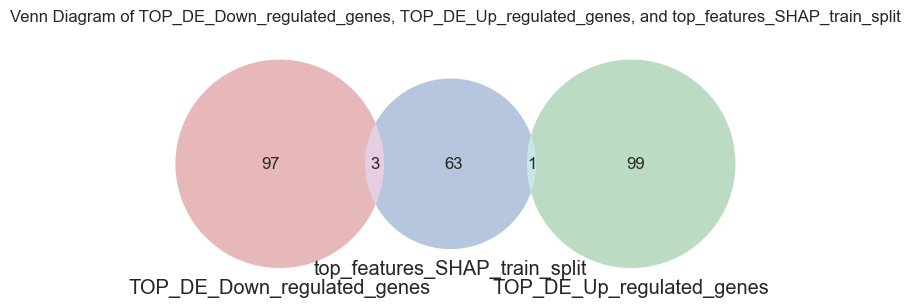

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in top_features_SHAP_train_split: set()
Genes in TOP_DE_Down_regulated_genes and top_features_SHAP_train_split not in TOP_DE_Up_regulated_genes: {'SPINT3', 'DEFB131A', 'KRT24'}
Genes in TOP_DE_Up_regulated_genes and top_features_SHAP_train_split not in TOP_DE_Down_regulated_genes: {'ARHGAP19-SLIT1'}
[97, 99, 0, 63, 3, 1, 0]


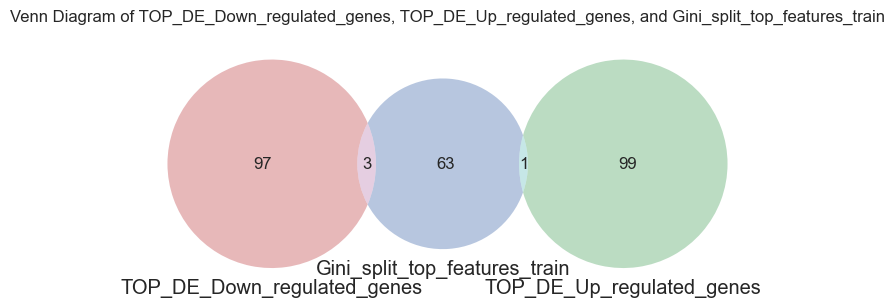

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in Gini_split_top_features_train: set()
Genes in TOP_DE_Down_regulated_genes and Gini_split_top_features_train not in TOP_DE_Up_regulated_genes: {'SPINT3', 'DEFB131A', 'KRT24'}
Genes in TOP_DE_Up_regulated_genes and Gini_split_top_features_train not in TOP_DE_Down_regulated_genes: {'ARHGAP19-SLIT1'}
[97, 0, 0, 43, 2, 21, 1]


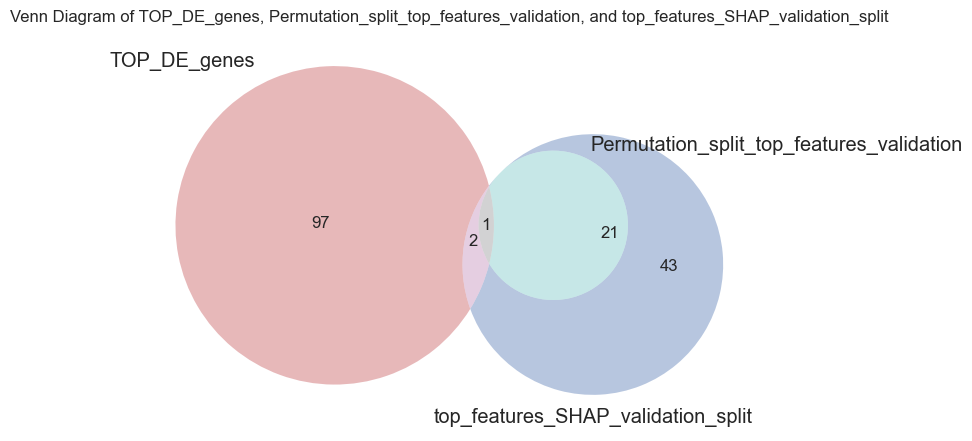

Common genes in all sets: {'KRT24'}
Genes in TOP_DE_genes and Permutation_split_top_features_validation not in top_features_SHAP_validation_split: set()
Genes in TOP_DE_genes and top_features_SHAP_validation_split not in Permutation_split_top_features_validation: {'DEFB131A', 'SPINT3'}
Genes in Permutation_split_top_features_validation and top_features_SHAP_validation_split not in TOP_DE_genes: {'FAM83C', 'ARHGAP19-SLIT1', 'GAL', 'SAPCD1', 'EPHA10', 'EVA1A', 'PPP3R2', 'DUOXA1', 'ENPP3', 'AC005064.1', 'AC022558.2', 'PDK4', 'MYBL2', 'AC008759.1', 'JPH4', 'SCGB1A1', 'AC010329.2', 'CCDC27', 'AC087235.2', 'ENSG00000286989.1', 'AC005180.1'}
[20, 80, 0, 0, 80, 20, 0]


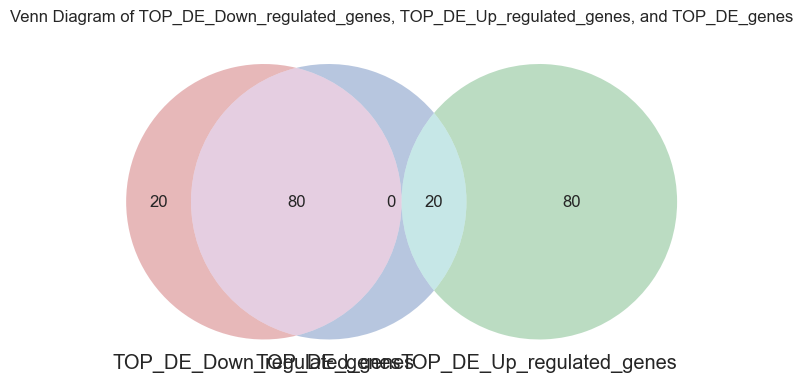

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in TOP_DE_genes: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_genes not in TOP_DE_Up_regulated_genes: {'SIM1', 'KRT24', 'UNC93B7', 'AC012307.1', 'ANXA13', 'AL513324.1', 'ENSG00000286922.1', 'CLDN2', 'EMX2OS', 'SEMG1', 'LCN1', 'HS3ST5', 'ACSL6-AS1', 'LINC02674', 'PIP', 'ENSG00000285417.1', 'WFDC9', 'HOXB8', 'LINC01159', 'AL354793.1', 'ENSG00000285012.1', 'PKD1L2', 'OR7E83P', 'AL161645.1', 'PATE3', 'PAEP', 'PATE1', 'ACSL6', 'SULT2A1', 'AC111000.2', 'SPINK13', 'PATE2', 'CRAT37', 'AL035660.2', 'OPRPN', 'ENSG00000286201.1', 'CRISP1', 'EDDM3B', 'AC025252.2', 'SLAMF6P1', 'CES5A', 'PAEPP1', 'DEFB129', 'AQP2', 'UGT2B7', 'LHX1-DT', 'SLCO4C1', 'DEFB131A', 'PANTR1', 'AC079612.1', 'OR7E85P', 'HOXB-AS3', 'SMR3B', 'POU3F3', 'ATP13A4', 'AL049767.1', 'MFSD2A', 'EMX2', 'SLC26A3', 'EDDM3A', 'PNMT', 'LINC02137', 'SEMG2', 'MCF2', 'KCNJ16', 'LHX1', 'TMEM114', 'LINC02707', 'CDX4', 'GRXCR1', 'ENSG00

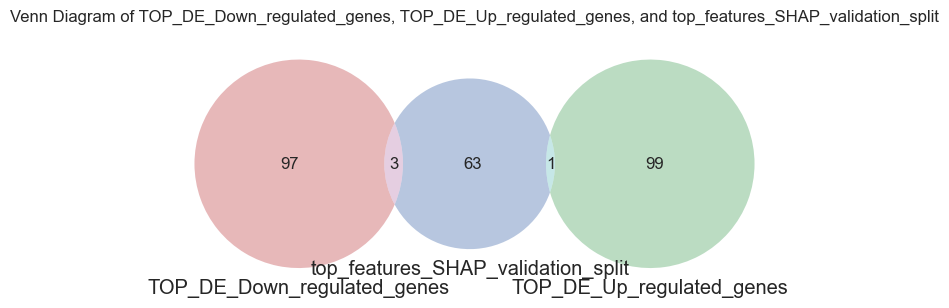

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in top_features_SHAP_validation_split: set()
Genes in TOP_DE_Down_regulated_genes and top_features_SHAP_validation_split not in TOP_DE_Up_regulated_genes: {'SPINT3', 'DEFB131A', 'KRT24'}
Genes in TOP_DE_Up_regulated_genes and top_features_SHAP_validation_split not in TOP_DE_Down_regulated_genes: {'ARHGAP19-SLIT1'}


set()

In [ ]:
# venn diagrams with DE expressed genes
venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes, Permutation_split_top_features_test,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='Permutation_split_top_features_validation')
# makes no sense to use the permutation importance in the train set...since many featurs were 0 values, but the Gini and SHAP impprtance have a high overlap
venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes, top_features_SHAP_train_split,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='top_features_SHAP_train_split')

venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes, Gini_split_top_features_train,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='Gini_split_top_features_train')

venn_diagrams(TOP_DE_genes,Permutation_split_top_features_test, top_features_SHAP_test_split,
      label1='TOP_DE_genes', label2='Permutation_split_top_features_validation', label3='top_features_SHAP_validation_split')

venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes, TOP_DE_genes,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='TOP_DE_genes')

venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes, top_features_SHAP_test_split,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='top_features_SHAP_validation_split')


[0, 45, 22]


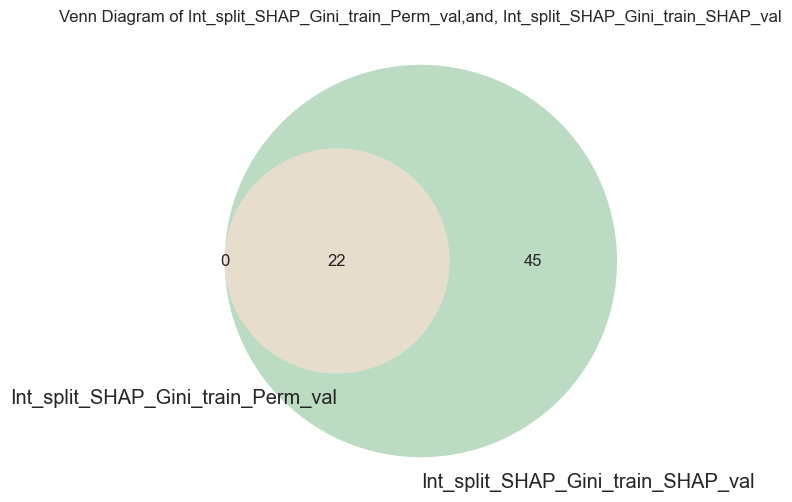

Common genes in all sets: {'SAPCD1', 'EPHA10', 'ENPP3', 'AC005180.1', 'MYBL2', 'KRT24', 'ARHGAP19-SLIT1', 'AC010329.2', 'PDK4', 'JPH4', 'FAM83C', 'ENSG00000286989.1', 'DUOXA1', 'AC008759.1', 'AC087235.2', 'AC022558.2', 'CCDC27', 'AC005064.1', 'GAL', 'EVA1A', 'SCGB1A1', 'PPP3R2'}
Top selected features in train-split training:  {'SAPCD1', 'SLC34A2', 'ADCY8', 'FNDC10', 'AC112492.1', 'KRT24', 'ARHGAP19-SLIT1', 'LINC01942', 'PDK4', 'JPH4', 'CDH8', 'AL512363.1', 'FAM83C', 'UGT1A3', 'DUOXA1', 'AC008759.1', 'PLCZ1', 'AC022558.2', 'AL662864.1', 'AC009902.3', 'DLGAP1-AS3', 'CCDC27', 'LINC01210', 'TNRC18P1', 'SCGB1A1', 'PPP3R2', 'MEI4', 'ONECUT2', 'TDRD1', 'MGAT4C', 'CYSLTR2', 'HOXC6', 'SPINT3', 'EPHA10', 'BRINP2', 'LINC02056', 'AC087516.2', 'AL353746.1', 'ENSG00000283601.1', 'AC084211.1', 'ENPP3', 'H2AC4', 'LINC00868', 'AC005180.1', 'CASP14', 'MYBL2', 'AC010329.2', 'LINC01204', 'C11orf87', 'OR6F1', 'FAM83B', 'HCAR3', 'AL023803.1', 'ENSG00000286989.1', 'AL139280.1', 'AC087235.2', 'MARCKSL1P2', 'D

In [27]:
# # call funtion with different lists
Int_all_Split, Top_features_Split = venn2_diagrams(Int_split_SHAP_Gini_train_Perm_test
, Int_split_SHAP_Gini_train_SHAP_test,label1='Int_split_SHAP_Gini_train_Perm_val', label2='Int_split_SHAP_Gini_train_SHAP_val')
#print('Common genes in all sets:', Int_all_venn2)
print('Top selected features in train-split training: ', Top_features_Split)
print(len(Top_features_Split))

[99, 99, 0, 20, 1, 1, 0]


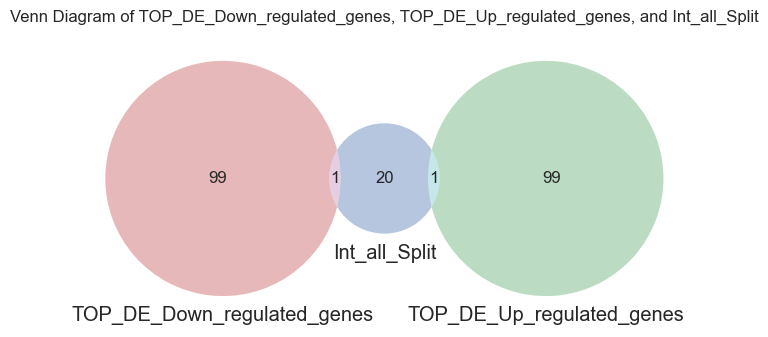

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in Int_all_Split: set()
Genes in TOP_DE_Down_regulated_genes and Int_all_Split not in TOP_DE_Up_regulated_genes: {'KRT24'}
Genes in TOP_DE_Up_regulated_genes and Int_all_Split not in TOP_DE_Down_regulated_genes: {'ARHGAP19-SLIT1'}


set()

In [ ]:
venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes,Int_all_Split,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='Int_all_Split')

[61, 63, 36, 18, 3, 1, 0]


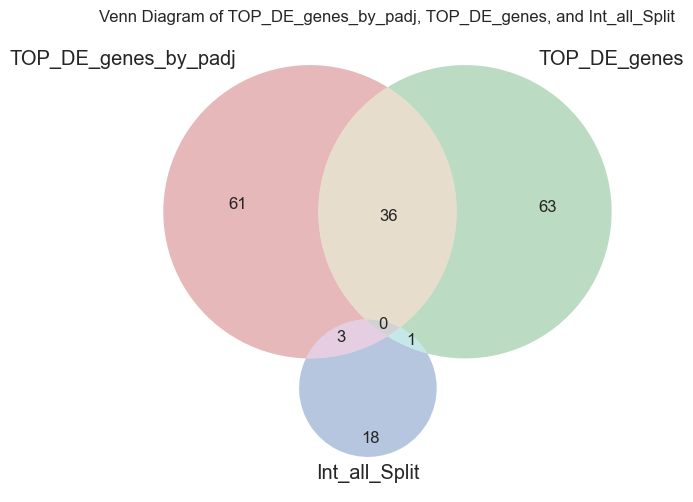

Common genes in all sets: set()
Genes in TOP_DE_genes_by_padj and TOP_DE_genes not in Int_all_Split: {'MFSD2A', 'HOXB8', 'ENSG00000286201.1', 'EMX2', 'CRISP1', 'AL354793.1', 'PNMT', 'LINC02137', 'SLC45A2', 'SEMG2', 'ANXA13', 'PKD1L2', 'MCF2', 'KCNJ16', 'AQP2', 'TMEM114', 'UGT2B7', 'AL161645.1', 'CLDN2', 'EMX2OS', 'AL133325.3', 'PAEP', 'SLCO4C1', 'HS3ST5', 'ENSG00000286523.1', 'ACSL6', 'PATE4', 'SPINK13', 'PATE2', 'FAM83A', 'SERPINA5', 'ATP13A4', 'PIP', 'ENSG00000285417.1', 'SPINK2', 'SLC13A2'}
Genes in TOP_DE_genes_by_padj and Int_all_Split not in TOP_DE_genes: {'EPHA10', 'PDK4', 'EVA1A'}
Genes in TOP_DE_genes and Int_all_Split not in TOP_DE_genes_by_padj: {'KRT24'}


set()

In [ ]:
venn_diagrams(TOP_DE_genes_by_padj, TOP_DE_genes, Int_all_Split,
      label1='TOP_DE_genes_by_padj', label2='TOP_DE_genes', label3='Int_all_Split')

[59, 61, 36, 59, 5, 3, 0]


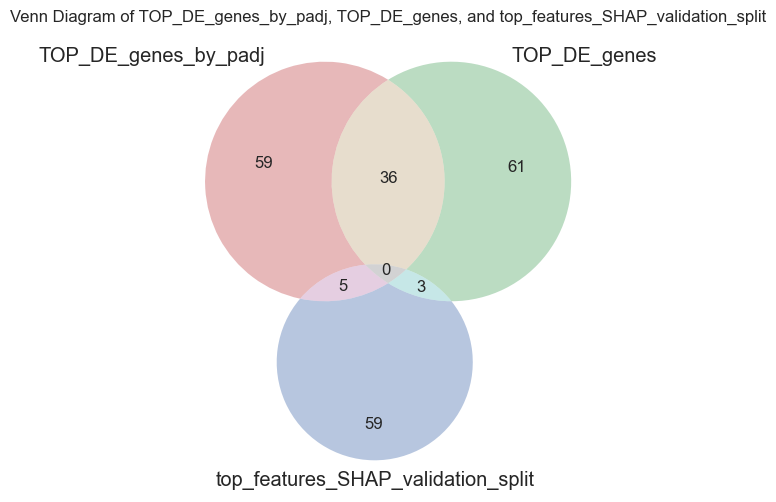

Common genes in all sets: set()
Genes in TOP_DE_genes_by_padj and TOP_DE_genes not in top_features_SHAP_validation_split: {'MFSD2A', 'HOXB8', 'ENSG00000286201.1', 'EMX2', 'CRISP1', 'AL354793.1', 'PNMT', 'LINC02137', 'SLC45A2', 'SEMG2', 'ANXA13', 'PKD1L2', 'MCF2', 'KCNJ16', 'AQP2', 'TMEM114', 'UGT2B7', 'AL161645.1', 'CLDN2', 'EMX2OS', 'AL133325.3', 'PAEP', 'SLCO4C1', 'HS3ST5', 'ENSG00000286523.1', 'ACSL6', 'PATE4', 'SPINK13', 'PATE2', 'FAM83A', 'SERPINA5', 'ATP13A4', 'PIP', 'ENSG00000285417.1', 'SPINK2', 'SLC13A2'}
Genes in TOP_DE_genes_by_padj and top_features_SHAP_validation_split not in TOP_DE_genes: {'PDK4', 'EVA1A', 'HOXC6', 'CYSLTR2', 'EPHA10'}
Genes in TOP_DE_genes and top_features_SHAP_validation_split not in TOP_DE_genes_by_padj: {'SPINT3', 'DEFB131A', 'KRT24'}


set()

In [ ]:
venn_diagrams(TOP_DE_genes_by_padj, TOP_DE_genes,top_features_SHAP_test_split ,
      label1='TOP_DE_genes_by_padj', label2='TOP_DE_genes', label3='top_features_SHAP_validation_split')

In [ ]:
 # Save list to DF to use as input in R for GO analyis of TOP genes
 #save in pyDeseq2-output-folder

# Create DataFrames
TOP_DE_genes_by_padj_DF= pd.DataFrame(TOP_DE_genes_by_padj, columns =["gene_name"])
TOP_DE_genes_DF = pd.DataFrame(TOP_DE_genes, columns=["gene_name"])
top_features_SHAP_test_split_DF= pd.DataFrame(top_features_SHAP_test_split, columns=["gene_name"])
Int_all_Split_DF =pd.DataFrame(Int_all_Split,columns=["gene_name"])
TOP_DE_genes_by_padj_DF


,gene_name
0,MFSD2A
1,SERPINA5
2,MCF2
3,PKD1L2
4,AKR1B1
...,...
95,SNAP25
96,CRISP1
97,AL133325.3
98,FAM167A


# Save important fetures list to files to use for GO analyis in R

In [ ]:
# for GO anaylsis we need the Ensemble ID and we have the gene_name
# take id from original data and add to data frames

folder_path_2 = "DataMiner-main/PRAD/Primary_Tumor/combined_data_Primary_Tumor.csv"
#Open the combined data:
Primary_Tumor_PRAD = pd.read_csv(folder_path_2)
# create a df with gene id,gene type and gene name to use later
Gene_info_df= Primary_Tumor_PRAD[['gene_id','gene_name', 'gene_type']].copy()
# drop the first 4 rows, general info:
Gene_info_df =Gene_info_df.iloc[4:]

# there are Nan values in 'gene_name' column, replace before mearging with  the corresponding 'gene_id' values
Gene_info_df['gene_name'].fillna(Gene_info_df['gene_id'], inplace=True)

# add gene_Id by merging df on gene name that is the common column

TOP_DE_genes_by_padj_DF = pd.merge(TOP_DE_genes_by_padj_DF, Gene_info_df, on= 'gene_name')
TOP_DE_genes_DF = pd.merge(TOP_DE_genes_DF, Gene_info_df, on= 'gene_name')
top_features_SHAP_test_split_DF = pd.merge(top_features_SHAP_test_split_DF, Gene_info_df, on= 'gene_name')
Int_all_Split_DF  = pd.merge(Int_all_Split_DF , Gene_info_df, on= 'gene_name')
Int_all_Split_DF

TOP_DE_genes_by_padj_DF

/var/folders/07/cmbl5t2576sckxlm_hl6tw1c0000gn/T/ipykernel_4228/3225520533.py:6: DtypeWarning:

Columns (307,308) have mixed types. Specify dtype option on import or set low_memory=False.



,gene_name,gene_id,gene_type
0,MFSD2A,ENSG00000168389.18,protein_coding
1,SERPINA5,ENSG00000188488.14,protein_coding
2,MCF2,ENSG00000101977.21,protein_coding
3,PKD1L2,ENSG00000166473.17,polymorphic_pseudogene
4,AKR1B1,ENSG00000085662.14,protein_coding
...,...,...,...
95,SNAP25,ENSG00000132639.13,protein_coding
96,CRISP1,ENSG00000124812.15,protein_coding
97,AL133325.3,ENSG00000278041.1,lncRNA
98,FAM167A,ENSG00000154319.16,protein_coding


In [73]:

# Save DataFrames to CSV files
TOP_DE_genes_by_padj_DF.to_csv(os.path.join(OUTPUT_PATH, 'TOP_DE_genes_by_padj_DF.csv'),index=False)
TOP_DE_genes_DF.to_csv(os.path.join(OUTPUT_PATH, 'TOP_DE_genes_DF.csv'), index=False)
top_features_SHAP_test_split_DF.to_csv(os.path.join(OUTPUT_PATH, 'top_features_SHAP_test_split_DF.csv'), index=False)
Int_all_Split_DF.to_csv(os.path.join(OUTPUT_PATH, 'Int_all_Split_DF.csv'),index=False)

NameError: name 'TOP_DE_genes_by_padj_DF' is not defined

# Random Forest Tunning with Crossvalidation:

In [ ]:
# When using PCA redifine the x and y (this variables are defined above in the JN):

x=x_PCA
y=y_PCA


# Checking best hyperparameters by crossvalidation:
- whole data set is used for training, split: stratified. 90% training, 10 % validation, 10 folds

Best Parameters: {'n_estimators': 80, 'max_depth': 8}
Best Mean CV Score: 0.9581746031746032


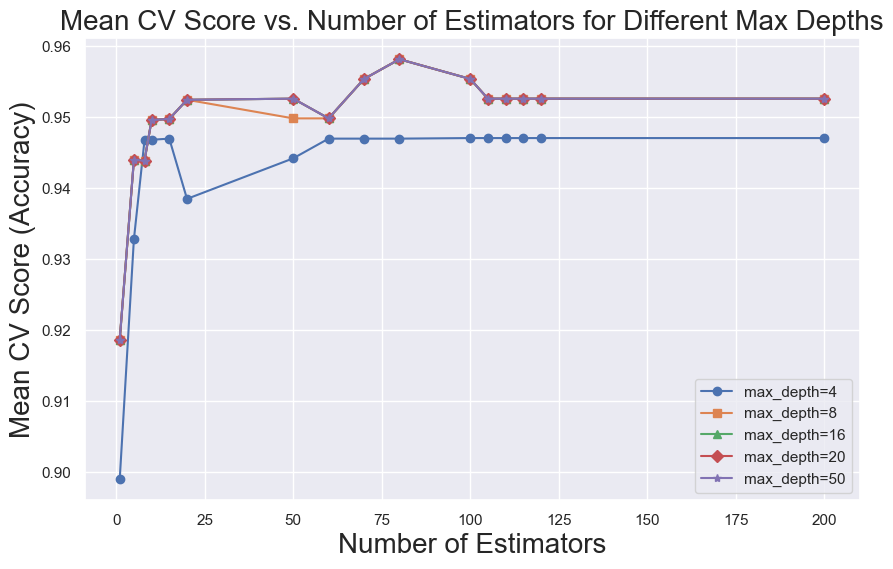

In [ ]:
# check best paramethers through cross-validation:

# Define the range of values for n_estimators and max_depth with cross validation scores
n_estimators_range = [1, 5, 8, 10, 15, 20, 50,60,70,80, 100,105,110,115, 120, 200]
#n_estimators_range = [1, 5, 8, 10, 15, 20, 43,45,50,55,57,60,70]
# You can extend this range as needed
max_depth_range = [4, 8, 16, 20, 50]

# Store mean CV scores for each combination
mean_scores = np.zeros((len(max_depth_range), len(n_estimators_range)))

best_score = -1
best_params = {}

# Loop over n_estimators and max_depth
for i, m_deph in enumerate(max_depth_range):
    for j, n_est in enumerate(n_estimators_range):
        # Define RandomForestClassifier with current parameters
        rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

        # Define the cross-validation strategy
        cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

        # Perform cross-validation (takes the whole data set)
        cv_scores = cross_val_score(rfc, x, y, cv=cv, scoring='accuracy')
        mean_score = np.mean(cv_scores)
        mean_scores[i, j] = mean_score

        # Check if current parameters yield a better score
        if mean_score > best_score:
            best_score = mean_score
            best_params['n_estimators'] = n_est
            best_params['max_depth'] = m_deph

# Print and save the best parameters and score
print("Best Parameters:", best_params)
print("Best Mean CV Score:", best_score)


# Plot the accuracy scores for each max_depth
plt.figure(figsize=(10, 6))
markers = ['o', 's', '^', 'D', '*']  # Define markers for each max_depth
for i, m_deph in enumerate(max_depth_range):
    plt.plot(n_estimators_range, mean_scores[i, :], marker=markers[i % len(markers)], label=f'max_depth={m_deph}')
plt.xlabel('Number of Estimators',fontsize=20)
plt.ylabel('Mean CV Score (Accuracy)', fontsize=20)
plt.title('Mean CV Score vs. Number of Estimators for Different Max Depths',fontsize=20)
plt.legend()
plt.grid(True)
plt.show()


# Plot CV scores across folds with the best hyperparameters

Cross Validation Scores: [0.91666667 0.94444444 0.97222222 0.88888889 0.91666667 0.97222222
 1.         0.97142857 0.97142857 1.        ]
Mean CV Score: 0.9553968253968254
Median CV Score; 0.9714285714285714


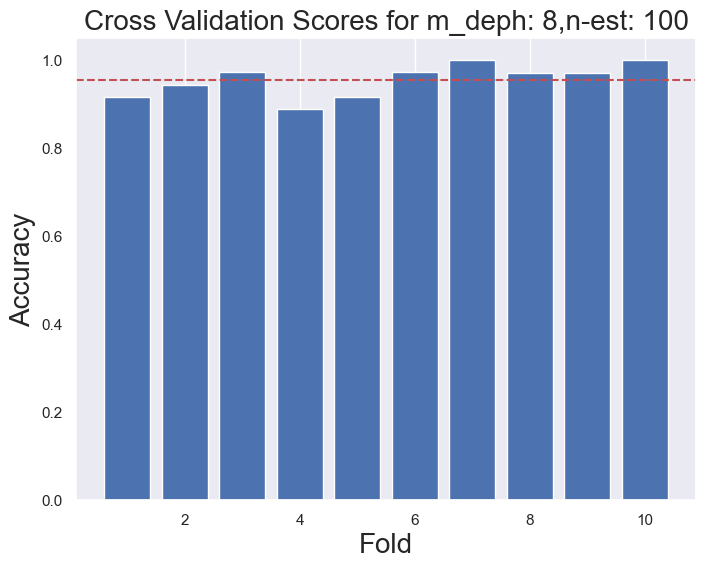

In [ ]:
# Performed cross validation: on the whole data set with the “best hyperparameters“ and plot accuracy through the different folds of CVs

# Define your RandomForestClassifier parameters
m_deph = 8 # 4 when keepin 10% out
n_est = 100 #50 for PCA # 50 when keeping 10% out

# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Define your cross-validation strategy
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)


# Perform cross-validation
cv_scores = cross_val_score(rfc, x, y, cv=cv, scoring='accuracy')
print("Cross Validation Scores:", cv_scores)
mean_cv_score = np.mean(cv_scores)
print("Mean CV Score:", mean_cv_score)
median_cv_score =np.median(cv_scores)
print("Median CV Score;", median_cv_score)


# Plot the cross-validation scores
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(cv_scores) + 1), cv_scores)
plt.xlabel('Fold',fontsize= 20)
plt.ylabel('Accuracy', fontsize= 20)
plt.title(f'Cross Validation Scores for m_deph: {m_deph},n-est: {n_est}', fontsize=20)
plt.grid(axis='y')
plt.axhline(y=mean_cv_score, color='r', linestyle='--', label='Mean CV Score')
plt.show()



# Median clasification matrix and classification report across folds of CV

training with parameters:m_deph: 8,n_est: 100

Median Clasification Report (Validation):
Class        Precision  Recall     F1-score   Support   
0.0          1.00       0.80       0.89       5.0       
1.0          0.97       1.00       0.98       30.0      


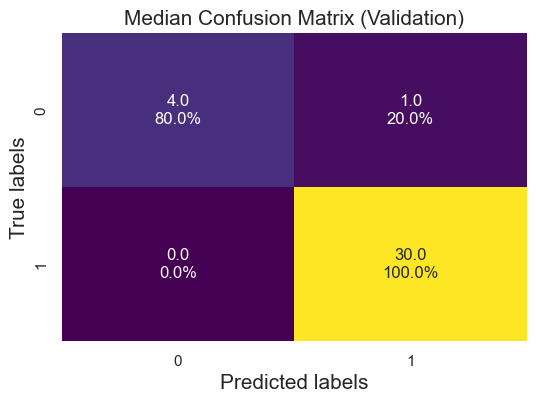


Median Clasification Report (Train):
Class        Precision  Recall     F1-score   Support   
0.0          1.00       1.00       1.00       47.0      
1.0          1.00       1.00       1.00       274.0     


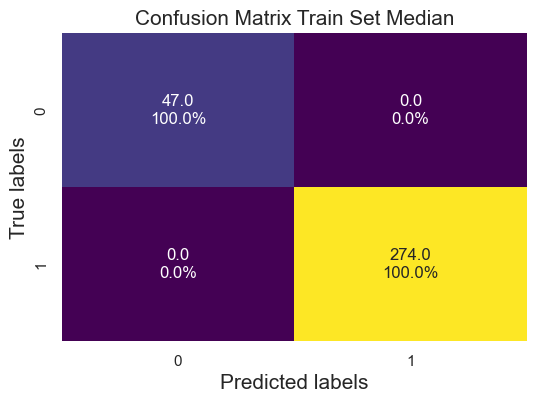

In [ ]:
# calculating median classification reports and median confusion matrixes for each fold and making a median confusion matrix


# Define your RandomForestClassifier parameters
m_deph = 8
n_est = 100

# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Define your cross-validation strategy
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Define lists to store classification reports and confusion matrices
classification_reports_test = []
confusion_matrices_test = []
classification_reports_train = []
confusion_matrices_train = []

# Perform cross-validation
for train_index, test_index in cv.split(x, y):
    # Split data into training and test sets for this fold
    x_train, x_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Fit the model on the training data for this fold
    rfc.fit(x_train, y_train)

    # Make predictions on the test data and train data
    y_pred_test = rfc.predict(x_test)
    y_pred_train = rfc.predict(x_train)

    # Calculate classification report and confusion matrix for test set
    classification_report_test = classification_report(y_test, y_pred_test, output_dict=True)
    confusion_matrix_test = confusion_matrix(y_test, y_pred_test)

    # Calculate classification report and confusion matrix for training set
    classification_report_train = classification_report(y_train, y_pred_train, output_dict=True)
    confusion_matrix_train = confusion_matrix(y_train, y_pred_train)

    # Append classification reports and confusion matrices to lists
    classification_reports_test.append(classification_report_test)
    confusion_matrices_test.append(confusion_matrix_test)
    classification_reports_train.append(classification_report_train)
    confusion_matrices_train.append(confusion_matrix_train)


# Aggregate confusion matrices from all folds
all_confusion_matrices_test = np.array(confusion_matrices_test)
all_confusion_matrices_train = np.array(confusion_matrices_train)

# Compute median confusion matrices
median_confusion_matrix_test = np.median(all_confusion_matrices_test, axis=0)
median_confusion_matrix_train = np.median(all_confusion_matrices_train, axis=0)

# Display the median confusion matrices
#print("\nMedian Confusion Matrix (Validation):")
#print(median_confusion_matrix_test)

#print("\nMedian Confusion Matrix (Train):")
#print(median_confusion_matrix_train)


# Aggregate classification reports from all folds
all_classification_reports_test = classification_reports_test
all_classification_reports_train = classification_reports_train

# Define classes (assuming keys of classification report dictionaries)
classes = list(classification_reports_test[0].keys())[:-3]  # Exclude 'micro avg', 'macro avg', 'weighted avg'

# Initialize dictionaries to store aggregated metrics for each class
aggregated_metrics_test = {cls: {'precision': [], 'recall': [], 'f1-score': [], 'support': []} for cls in classes}
aggregated_metrics_train = {cls: {'precision': [], 'recall': [], 'f1-score': [], 'support': []} for cls in classes}

# Aggregate metrics for each class across all folds
for report in all_classification_reports_test:
    for cls in classes:
        metrics = report[cls]
        for metric, value in metrics.items():
            aggregated_metrics_test[cls][metric].append(value)

for report in all_classification_reports_train:
    for cls in classes:
        metrics = report[cls]
        for metric, value in metrics.items():
            aggregated_metrics_train[cls][metric].append(value)

# Compute median metrics for each class
median_classification_report_test = {cls: {metric: np.median(values) for metric, values in metrics.items()} for cls, metrics in aggregated_metrics_test.items()}
median_classification_report_train = {cls: {metric: np.median(values) for metric, values in metrics.items()} for cls, metrics in aggregated_metrics_train.items()}

print(f'training with parameters:m_deph: {m_deph},n_est: {n_est}')
# Display media classification Report validation set:

print("\nMedian Clasification Report (Validation):")
headers = ["Class", "Precision", "Recall", "F1-score", "Support"]
print("{:<12} {:<10} {:<10} {:<10} {:<10}".format(*headers))
for key, value in median_classification_report_test.items():
    if isinstance(value, dict):
        print("{:<12} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format(key, value['precision'], value['recall'], value['f1-score'], value['support']))
    else:
        print("{:<12} {:<10} {:<10} {:<10} {:<10}".format(key, "", "", "", value))


# Display the median confusion matrix val with values and percentages:

cm_sum = np.sum(median_confusion_matrix_test, axis=1, keepdims=True)
cm_percentages = median_confusion_matrix_test / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
median_confusion_matrix_test,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(median_confusion_matrix_test.flatten(), cm_with_percentages.flatten())]).reshape(median_confusion_matrix_test.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Median Confusion Matrix (Validation)',fontsize=15)
plt.show()

# Display median clasifiction report train set:

print("\nMedian Clasification Report (Train):")
headers = ["Class", "Precision", "Recall", "F1-score", "Support"]
print("{:<12} {:<10} {:<10} {:<10} {:<10}".format(*headers))
for key, value in median_classification_report_train.items():
    if isinstance(value, dict):
        print("{:<12} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format(key, value['precision'], value['recall'], value['f1-score'], value['support']))
    else:
        print("{:<12} {:<10} {:<10} {:<10} {:<10}".format(key, "", "", "", value))


# Display the media confusion matrix train with values and percentages:

cm_sum = np.sum(median_confusion_matrix_train, axis=1, keepdims=True)
cm_percentages = median_confusion_matrix_train / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
median_confusion_matrix_train,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(median_confusion_matrix_train.flatten(), cm_with_percentages.flatten())]).reshape(median_confusion_matrix_train.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Train Set Median',fontsize=15)
plt.show()


In [ ]:
#print(all_confusion_matrices_test)
#print(confusion_matrices_test)

# Mean clasification matrix and classification report  across folds of CV

{'0.0': {'precision': 0.915, 'recall': 0.7733333333333333, 'f1-score': 0.8309090909090908, 'support': 5.2}, '1.0': {'precision': 0.9621792521994135, 'recall': 0.9870967741935484, 'f1-score': 0.974293436747165, 'support': 30.4}, 'macro avg': {'precision': 0.9385896260997069, 'recall': 0.8802150537634409, 'f1-score': 0.9026012638281278, 'support': 35.6}, 'weighted avg': {'precision': 0.9559943109086255, 'recall': 0.9553968253968254, 'f1-score': 0.9533031328113296, 'support': 35.6}}
Mean Classification Report (Validation Sets):
Class        Precision  Recall     F1-score   Support   
0.0          0.92       0.77       0.83       5.2       
1.0          0.96       0.99       0.97       30.4      
macro avg    0.94       0.88       0.90       35.6      
weighted avg 0.96       0.96       0.95       35.6      

Mean Classification Report (Training Sets):
Class        Precision  Recall     F1-score   Support   
0.0          1.00       1.00       1.00       46.8      
1.0          1.00       1

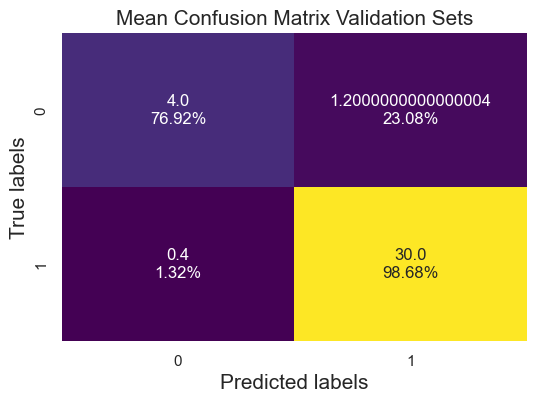

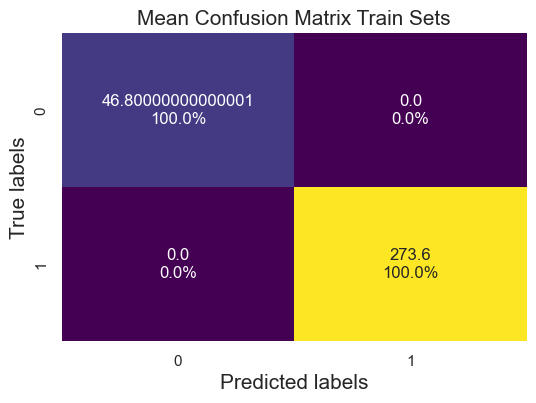

In [ ]:
# Calculate mean classification report and confusion matrix for test set
mean_classification_report_test = {}
mean_confusion_matrix_test = np.zeros_like(confusion_matrices_test[0], dtype=float)
for report in classification_reports_test:
    for key, value in report.items():
        if isinstance(value, dict):
            if key not in mean_classification_report_test:
                mean_classification_report_test[key] = {}
            for metric, score in value.items():
                if metric not in mean_classification_report_test[key]:
                    mean_classification_report_test[key][metric] = []
                mean_classification_report_test[key][metric].append(score)
for i, matrix in enumerate(confusion_matrices_test):
    mean_confusion_matrix_test += matrix / len(confusion_matrices_test)

# Calculate mean classification report and confusion matrix for training set
mean_classification_report_train = {}
mean_confusion_matrix_train = np.zeros_like(confusion_matrices_train[0], dtype=float)
for report in classification_reports_train:
    for key, value in report.items():
        if isinstance(value, dict):
            if key not in mean_classification_report_train:
                mean_classification_report_train[key] = {}
            for metric, score in value.items():
                if metric not in mean_classification_report_train[key]:
                    mean_classification_report_train[key][metric] = []
                mean_classification_report_train[key][metric].append(score)
for i, matrix in enumerate(confusion_matrices_train):
    mean_confusion_matrix_train += matrix / len(confusion_matrices_train)

# Calculate the mean of the classification reports
for key, value in mean_classification_report_test.items():
    for metric, scores in value.items():
        mean_classification_report_test[key][metric] = np.mean(scores)

for key, value in mean_classification_report_train.items():
    for metric, scores in value.items():
        mean_classification_report_train[key][metric] = np.mean(scores)

# Print mean classification report for test set
print(mean_classification_report_test)
print("Mean Classification Report (Validation Sets):")
headers = ["Class", "Precision", "Recall", "F1-score", "Support"]
print("{:<12} {:<10} {:<10} {:<10} {:<10}".format(*headers))
for key, value in mean_classification_report_test.items():
    print("{:<12} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format(key, value['precision'], value['recall'], value['f1-score'], value['support']))

# Print mean classification report for training set
print("\nMean Classification Report (Training Sets):")
print("{:<12} {:<10} {:<10} {:<10} {:<10}".format(*headers))
for key, value in mean_classification_report_train.items():
    print("{:<12} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format(key, value['precision'], value['recall'], value['f1-score'], value['support']))






# Display the mean confusion matrix test with values and percentages

cm_sum = np.sum(mean_confusion_matrix_test, axis=1, keepdims=True)
cm_percentages = mean_confusion_matrix_test / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
mean_confusion_matrix_test,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(mean_confusion_matrix_test.flatten(), cm_with_percentages.flatten())]).reshape(mean_confusion_matrix_test.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Mean Confusion Matrix Validation Sets',fontsize=15)
plt.show()


# Display the mean confusion matrix train with values and percentages

cm_sum = np.sum(mean_confusion_matrix_train, axis=1, keepdims=True)
cm_percentages = mean_confusion_matrix_train / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
mean_confusion_matrix_train,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(mean_confusion_matrix_train.flatten(), cm_with_percentages.flatten())]).reshape(mean_confusion_matrix_train.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Mean Confusion Matrix Train Sets',fontsize=15)
plt.show()


# Code to run final inference evaluation in unseen data if set was split in 3 sets (train, test and validation)-on crossvalidation

training with parameters:m_deph: 8,n_est: 50

Classification Report (Entire Dataset):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        47
         1.0       1.00      1.00      1.00       273

    accuracy                           1.00       320
   macro avg       1.00      1.00      1.00       320
weighted avg       1.00      1.00      1.00       320


Confusion Matrix (Entire Dataset):


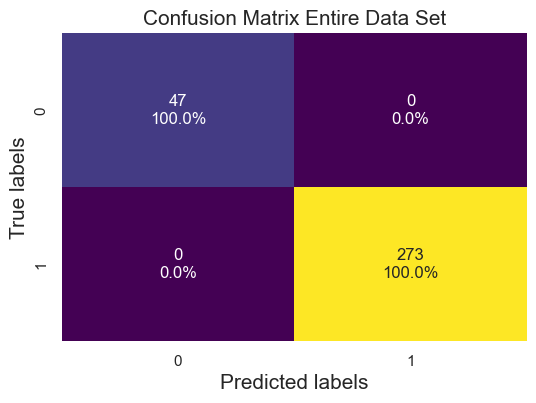


Classification Report Test( Kept unseen data):
              precision    recall  f1-score   support

         0.0       0.80      0.80      0.80         5
         1.0       0.97      0.97      0.97        31

    accuracy                           0.94        36
   macro avg       0.88      0.88      0.88        36
weighted avg       0.94      0.94      0.94        36



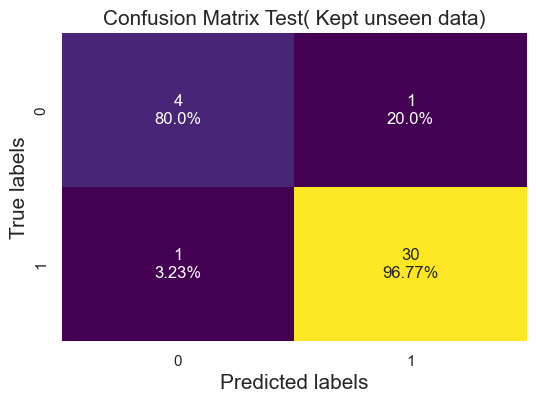

In [ ]:
# RUN THIS CODE FOR EVALUATION of the models IF DATA WAS SPLIT BEFORE in 3 sets:


# Define the RandomForestClassifier parameters (best parameters)
#m_deph = 8
#n_est = 100

# Define the RandomForestClassifier (not needed,if already run before)
#rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Fit the model on the entire dataset

rfc.fit(x, y)

# Get predictions for the entire dataset
y_pred = rfc.predict(x)


print(f'training with parameters:m_deph: {m_deph},n_est: {n_est}')

# Print classification report and confusion matrix for the entire dataset
print("\nClassification Report (Entire Dataset):")
print(classification_report(y, y_pred))

print("\nConfusion Matrix (Entire Dataset):")
cm = confusion_matrix(y, y_pred)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Entire Data Set',fontsize=15)
plt.show()

# evaluate the evaluation set (keep unseen)

y_pred_val = rfc.predict(x_val)
print("\nClassification Report Test( Kept unseen data):")
print(classification_report(y_val,y_pred_val))


#print("Confusion Matrix validations set:")
cm = confusion_matrix(y_val, y_pred_val)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Test( Kept unseen data)',fontsize=15)
plt.show()




# Feature importance: mean permutation importances across folds of CV
Note: at the moment the code gives 0 value features- code would need further testing

In [ ]:
# Calculate permutation importances for each fold in train sets and plot the means
# Note: the code is not getting properly the features

# Define your RandomForestClassifier parameters
m_deph = 8
n_est = 100

# try rescaling the x for future importance does not change anything

#scaler = MinMaxScaler()
#x = scaler.fit_transform(x)


# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Define your cross-validation strategy
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)


importances_cv_train = []
for train_index, _ in cv.split(x, y):
    rfc.fit(x[train_index], y[train_index])  # Fit model on training data for this fold
    p_importances_fold_train = permutation_importance(rfc, x[train_index], y[train_index], n_repeats=20, n_jobs=-1, random_state=42)
    importances_fold_train = p_importances_fold_train.importances_mean
    importances_cv_train.append(importances_fold_train)


# Calculate average importances across folds
perm_importances_cv_mean_train = np.mean(importances_cv_train, axis=0)
perm_std_importances_cv_train = np.std(importances_cv_train, axis=0)




Top 35 Most Important Features across cross-validation folds_train sets:
ENSG00000288658.1
LIPF
CFAP65
EDDM3B
EDDM3A
TMEM252
LINC00301
USH1G
MGAT4C
KCNA4
FAM87A
PENK
EPGN
CCNYL2
HCAR2
KRTAP13-2
NKX2-5
C2CD4C
POTEC
EPHA10
TMEM132C
CHRM2
PPP3R2
RPRML
OR51N1P
PRDM16-DT
CAPZA3
LCN15
HTR1A
DEFB125
LGALS7B
OR4K11P
LRRC3B
CXCR2
ITLN1


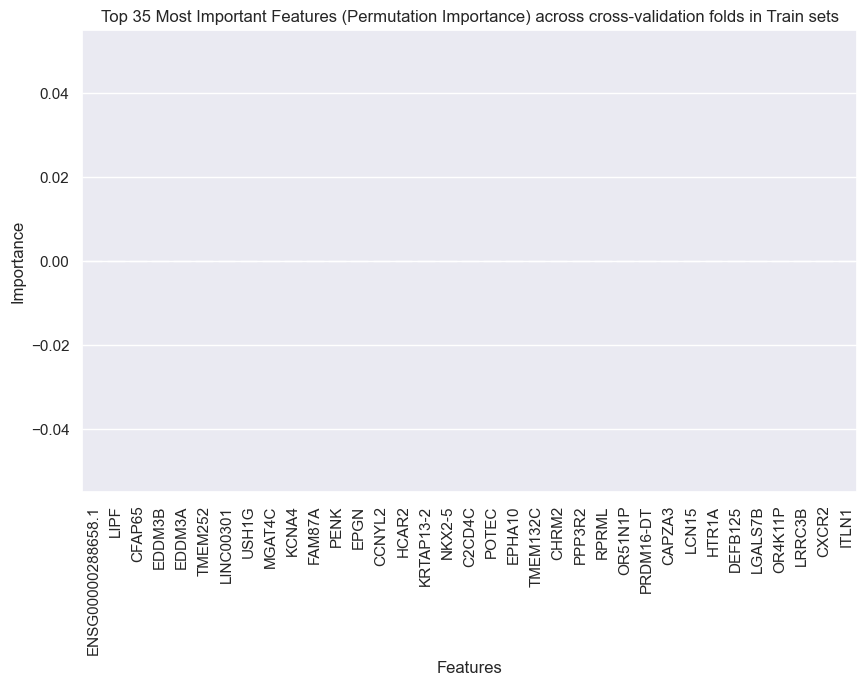

In [ ]:
# Get the indices of the top N most important features
N = 35  # Number of top features to print
top_indices_cv_train = np.argsort(perm_importances_cv_mean_train)[::-1][:N]

# Get the names of the top N most important features
top_features_cv_train = [features[i] for i in top_indices_cv_train]

# Print the top N most important features
print("\nTop", N, "Most Important Features across cross-validation folds_train sets:")
for feature in top_features_cv_train:
    print(feature)

# Plot the permutation importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_cv_train, y=perm_importances_cv_mean_train[top_indices_cv_train], yerr=perm_std_importances_cv_train[top_indices_cv_train])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Top {} Most Important Features (Permutation Importance) across cross-validation folds in Train sets'.format(N))
plt.show()

# save importances for further analyis

Top_Features_cv_Permutation_train =top_features_cv_train



In [ ]:
# Calculate permutation importances for each fold in test sets

importances_cv_test = []
for train_index, test_index in cv.split(x, y):
    rfc.fit(x[train_index], y[train_index])  # Fit model on train data
    p_importances_fold_test = permutation_importance(rfc, x[test_index], y[test_index], n_repeats=20, n_jobs=-1, random_state=42)
    importances_fold_test = p_importances_fold_test.importances_mean
    importances_cv_test.append(importances_fold_test)

# Calculate average importances across folds
perm_importances_cv_mean_test = np.mean(importances_cv_test, axis=0)
perm_std_importances_cv_test = np.std(importances_cv_test, axis=0)



Top 35 Most Important Features across cross-validation folds_validation sets:
APOBEC3C
SIM2
HJURP
DLX2
CFAP65
NKX2-3
DNAH5
LINC01475
DLX1
AL031123.2
ARSF
AC105450.1
TDRD1
OR51A7
AL022332.1
AC004801.5
AC005726.1
LINC00301
KRTAP13-2
EDDM3A
TMEM252
HCAR2
CCNYL2
LIPF
USH1G
MGAT4C
EPGN
EDDM3B
KCNA4
FAM87A
ENSG00000288658.1
CXCR2
TMEM132C
FAR2P1
HTR1A


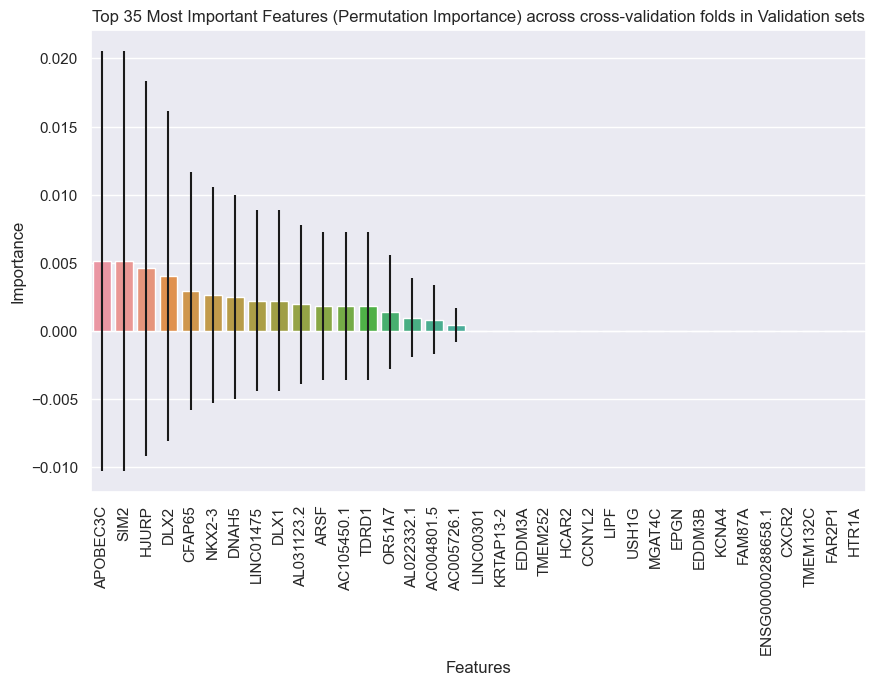

In [ ]:
# Get the indices of the top N most important features
N = 35  # Number of top features to print
top_indices_cv_test = np.argsort(perm_importances_cv_mean_test)[::-1][:N]

# Get the names of the top N most important features
top_features_cv_test = [features[i] for i in top_indices_cv_test]

# Print the top N most important features
print("\nTop", N, "Most Important Features across cross-validation folds_validation sets:")
for feature in top_features_cv_test:
    print(feature)

# Plot the permutation importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_cv_test, y=perm_importances_cv_mean_test[top_indices_cv_test], yerr=perm_std_importances_cv_test[top_indices_cv_test])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Top {} Most Important Features (Permutation Importance) across cross-validation folds in Validation sets'.format(N))
plt.show()

# save for further analyis

Top_Features_cv_Permutation_test= top_features_cv_test

# Feature importance: mean Gini importances across folds of CV

In [ ]:

# Calculate Gini importances for each fold in train sets and plot the means


# Define your RandomForestClassifier parameters
m_deph = 8
n_est = 100

# try rescaling the x for future importance does not change anything

#scaler = MinMaxScaler()
#x = scaler.fit_transform(x)


n_splits=10

# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Define your cross-validation strategy
cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)


importances_cv_train = []
for train_index, _ in cv.split(x, y):
    rfc.fit(x[train_index], y[train_index])  # Fit model on training data for this fold
    importances_fold_train = rfc.feature_importances_
    importances_cv_train.append(importances_fold_train)

# Calculate average importances across folds
importances_cv_mean_train = np.mean(importances_cv_train, axis=0)
std_importances_cv_train = np.std(importances_cv_train, axis=0)




Top 100 Most Important Features (Gini) across cross-validation folds_train sets:
APOBEC3C
FOXP4-AS1
SIM2
DLX2
GAL
PCAT7
AOX1
HJURP
SLC45A2
HPN
PIK3C2G
AL031123.2
EPHA10
PLBD1-AS1
GCNT4
DLX1
CA14
AMACR
GSTM3
AL353622.1
HOXC4
ARSF
AC005180.1
SLC2A9
LINC00958
PHYHIPL
AC008555.2
HOXC6
ANGPT1
NKX2-3
ENSG00000285972.1
AC012531.1
LINC01509
AC026469.1
CCDC27
KRT222
AL133325.3
HPN-AS1
PCP4L1
COL10A1
CYP4B1
RPE65
FAM83B
SCGB3A1
C2orf88
CFAP65
AC108718.1
LINC02139
B3GAT1-DT
SNORA73B
SNHG4
TDRD1
FNDC10
KCNF1
ADAMTS9-AS1
AL359314.1
PCAT14
DLX2-DT
JPH4
MYBL2
GSTP1
PGM5P4
GATA3
KY
CLU
TRH
UCN
PLAAT5
DUOX1
TERT
G0S2
KCNJ15
SNHG25
LINC01204
SLC46A2
GNAO1
DUOXA1
LINC01671
C10orf82
AC011523.1
SMR3B
AL512363.1
PLA2G4C-AS1
MTDHP3
AC105450.1
HSPA6
LGR6
LYVE1
AC110285.6
AC100803.4
ARHGAP19-SLIT1
AC068057.1
ENSG00000283766.1
SNORD104
MYH6
PNMT
KLHL4
MIR5704
AL359551.1
MCF2


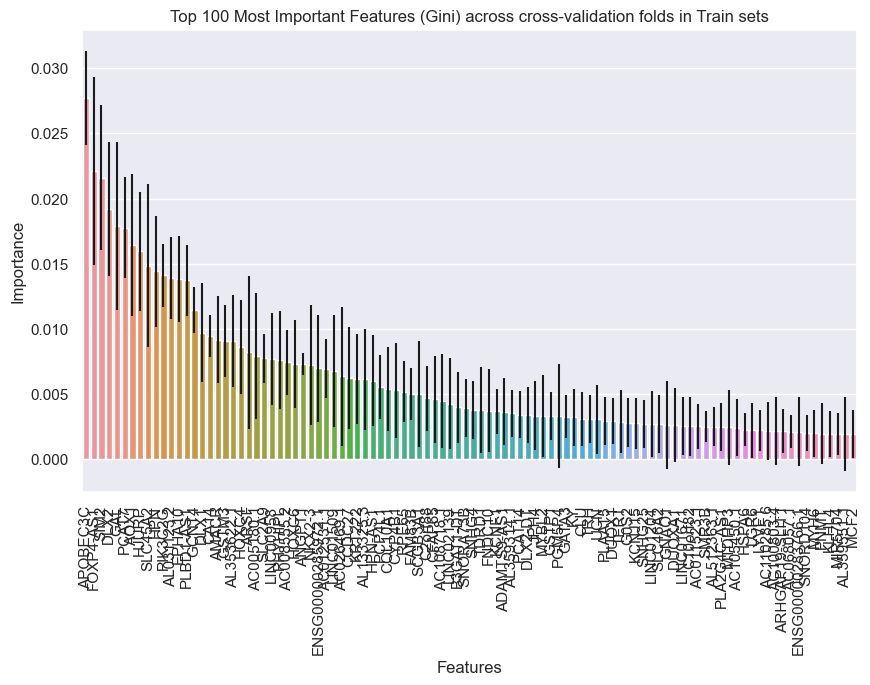

In [ ]:
# plot and save most important features in train set:

# Get the indices of the top N most important features

N = 100  # Number of top features to print
top_indices_cv_train = np.argsort(importances_cv_mean_train)[::-1][:N]

# Get the names of the top N most important features
top_features_cv_train = [features[i] for i in top_indices_cv_train]


# Print the top N most important features
print("\nTop", N, "Most Important Features (Gini) across cross-validation folds_train sets:")
for feature in top_features_cv_train:
    print(feature)

# Plot the permutation importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_cv_train, y=importances_cv_mean_train[top_indices_cv_train], yerr=std_importances_cv_train[top_indices_cv_train])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Top {} Most Important Features (Gini) across cross-validation folds in Train sets'.format(N))
plt.show()


# save with another name to compare the features with other models

Gini_cross_top_features_cv_train = top_features_cv_train


In [ ]:
# Calculate Gini permutation importances for each fold in test sets

importances_cv_test = []
for _, test_index in cv.split(x, y):
    rfc.fit(x[test_index], y[test_index])  # Fit model on test data for this fold
    importances_fold_test = rfc.feature_importances_
    importances_cv_test.append(importances_fold_test)

# Calculate average importances across folds
importances_cv_mean_test = np.mean(importances_cv_test, axis=0)
std_importances_cv_test = np.std(importances_cv_test, axis=0)




Top 100 Most Important Features (Gini) across cross-validation folds_validation sets:
ENSG00000285972.1
SIM2
SLC45A2
COL10A1
SNHG25
GCNT4
ARSF
AC011523.1
HOXC4
MTDHP3
AC026469.1
HPN-AS1
HPN
ANO1
PCAT7
CRTAC1
AOX1
LINC00958
AMACR
DLX2
PGM5P4
FOXP4-AS1
PNMT
FAM163A
CYP4F22
G0S2
LINC01509
PIK3C2G
AC084816.1
CA14
STAC
ARHGAP19-SLIT1
EVX2
AC005180.1
FABP7
LINC01204
SCGB3A1
JPH4
C10orf82
AC008555.2
GSTP1
KCNH5
ATP6V1G3
FAM83B
FABP5
SMR3B
UNC5B
SNORA73B
SLC6A21P
CLDN19
APOBEC3C
CYP4B1
FNDC10
CABS1
PLA2G4C-AS1
AC112492.1
HJURP
TRGJP
LGR6
CDH8
CPNE6
UCN
AL353746.1
AL121781.1
TDRD1
PAQR8
SNAP25
ENSG00000284874.1
EBF2
AC068057.1
PTGS1
TMED11P
MNX1-AS1
AL353622.1
MSLN
GLIS3
CCDC27
KRT222
MYBL2
ENSG00000288047.1
AL513304.1
ENSG00000284636.1
PDK4
LRRC3B
GPX2
DMRT2
KY
FOLR1
AC105450.1
AQP5
SNORD104
HCAR3
C2CD4C
SLC6A2
GAL
AC092535.5
DUOX1
ATP6V0D2
ANGPTL3
AC009063.2


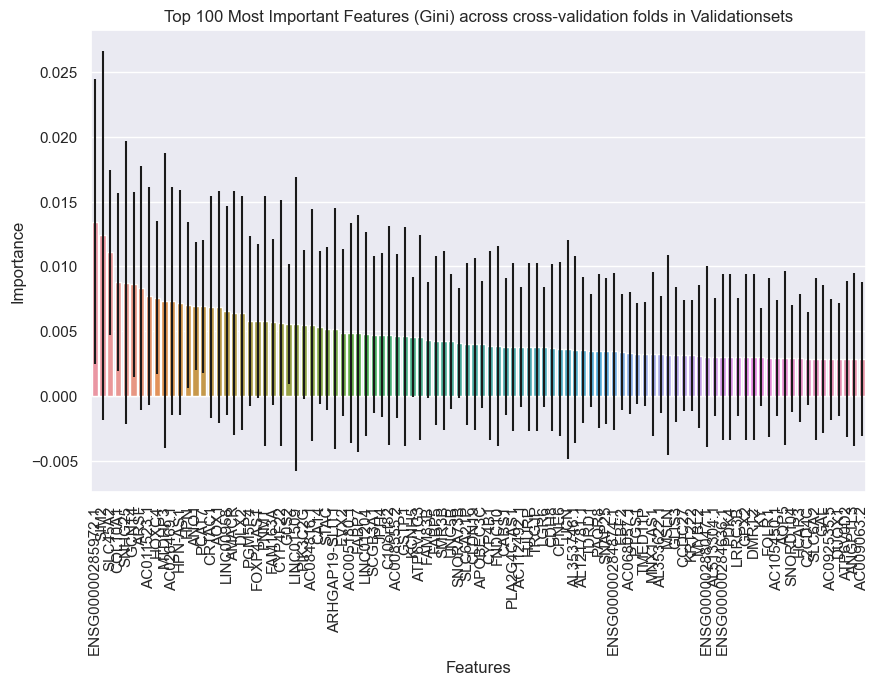

In [ ]:
# Get the indices of the top N most important features
N = 100  # Number of top features to print
top_indices_cv_test = np.argsort(importances_cv_mean_test)[::-1][:N]

# Get the names of the top N most important features
top_features_cv_test = [features[i] for i in top_indices_cv_test]

# Print the top N most important features
print("\nTop", N, "Most Important Features (Gini) across cross-validation folds_validation sets:")
for feature in top_features_cv_test:
    print(feature)

# Plot the permutation importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features_cv_test, y=importances_cv_mean_test[top_indices_cv_test], yerr=std_importances_cv_test[top_indices_cv_test])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Top {} Most Important Features (Gini) across cross-validation folds in Validationsets'.format(N))
plt.show()


# save with another name to compare the features with other models

Gini_cross_top_features_cv_test = top_features_cv_test


# Feature importance: mean SHAP values  across folds of CV

In [ ]:
# Calculate mean SHAP values for crossvalidation in vakidation folds


# Define your RandomForestClassifier parameters
m_deph = 8
n_est = 100

n_splits= 20

# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Define your cross-validation strategy
cv = StratifiedKFold(
    n_splits= n_splits, shuffle=True, random_state=42)


# Initialize a list to store SHAP values for each fold
shap_values_folds_test = []

# Perform cross-validation
for train_index, test_index in cv.split(x, y):
    x_train_fold, x_test_fold = x[train_index], x[test_index]
    y_train_fold, y_test_fold = y[train_index], y[test_index]

    # Train RandomForestClassifier on the current fold
    rfc.fit(x_train_fold, y_train_fold)

    # Create a SHAP explainer for the current fold
    explainer = shap.TreeExplainer(rfc)

    # Calculate SHAP values for the test data
    shap_values_fold_test = explainer.shap_values(x_test_fold)
    #print(f' shap value fold, {shap_values_fold}')
    print(f' shap value fold validation, {shap_values_fold_test.shape}')

    # Append SHAP values for the current fold
    for SHAPs in shap_values_fold_test:
        shap_values_folds_test.append(SHAPs)



# Convert the list of SHAP values for each fold to a numpy array
shap_values_folds_test = np.array(shap_values_folds_test)
print(f' shap value shape-appended=shap values folds validation, {shap_values_folds_test.shape}')


# Calculate the mean of SHAP values across folds
shap_values_mean_across_folds_test = np.mean(shap_values_folds_test, axis=0)
print(f'shap_values_mean_across_folds_validation, {shap_values_mean_across_folds_test.shape}')

# Calculate the absolute mean of the SHAP values along the last axis (axis=-1) across all folds
shap_values_abs_mean_test = np.abs(shap_values_mean_across_folds_test.mean(axis=-1))
print(f' shap_values_abs_mean_validation, {shap_values_abs_mean_test.shape}')




 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (18, 1380, 2)
 shap value fold validation, (17, 1380, 2)
 shap value fold validation, (17, 1380, 2)
 shap value fold validation, (17, 1380, 2)
 shap value fold validation, (17, 1380, 2)
 shap value shape-appended=shap values folds validation, (356, 1380, 2)
shap_values_mean_across_folds_validation, (1380, 2)
 shap_values_abs

Shape of shap_values_mean_across_folds: (1380, 2)
Shape of shap_values_abs_mean: (72, 1380)
Top feature indices: [ 675  605  478  299  549  574 1271  237  707 1357  121 1214 1162   74
 1182 1115  783  718 1197  706  143  301   48  471  257  750  349  572
  283 1169  759  875  454  411  755  606  915 1209  936 1310  607 1348
 1105  320  416  395 1198  274  392  732  893   88 1263 1110  376  837
  306   41  451 1057  294  171  208  644 1060  764  988 1131  769  790
  507 1163   98  494  729  564  929  138  858  417 1042  220 1212  226
 1103 1156  210  469  503  140 1333  209  872 1132  908   10 1172  834
  144 1142]

Features with the highest absolute mean SHAP values across all folds:
SIM2                          : 0.000000
SLC45A2                       : 0.000000
PHYHIPL                       : 0.000000
HOXC4                         : 0.000000
AOX1                          : 0.000000
TERT                          : 0.000000
ENSG00000286250.1             : 0.000000
CFAP65              

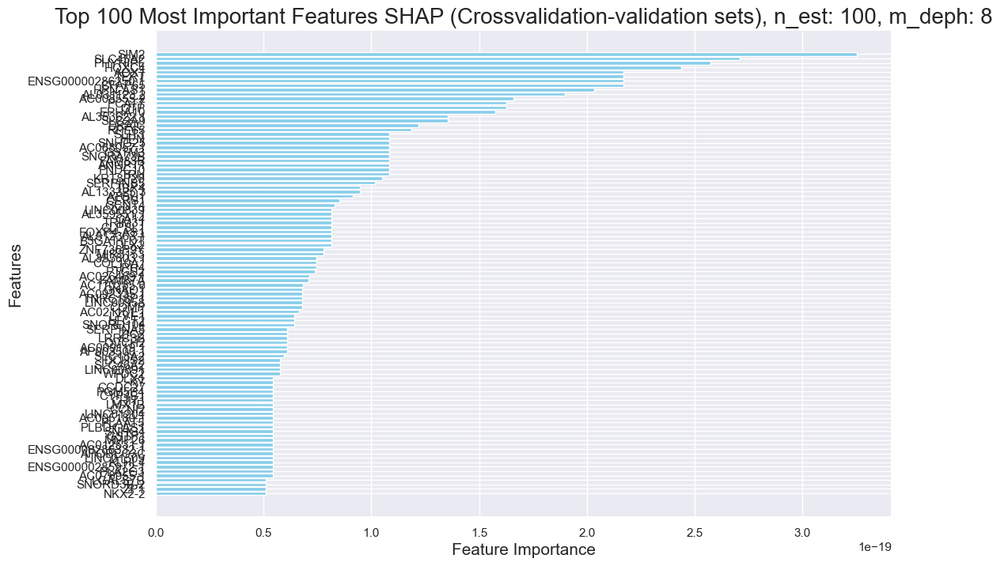

In [ ]:
# plot and save important the most important features

#number of features:

N=100

# Find the indices of features with the highest absolute mean SHAP values across all folds
top_feature_indices_test = np.argsort(shap_values_abs_mean_test)[::-1][:N]

# Retrieve the corresponding feature names from the features list
top_features_cv_test = [features[i] for i in top_feature_indices_test]


print("Shape of shap_values_mean_across_folds:", shap_values_mean_across_folds_test.shape)
print("Shape of shap_values_abs_mean:", shap_values_abs_mean.shape)
print("Top feature indices:", top_feature_indices)

# Print the features with the highest absolute mean SHAP values across all folds
print("\nFeatures with the highest absolute mean SHAP values across all folds:")
for feature, shap_value in zip(top_features_cv_test, shap_values_abs_mean_test[top_feature_indices_test]):
    print("{:<30}: {:.6f}".format(feature, shap_value))

# Plot the features with the highest feature importance values
plt.figure(figsize=(12, 8))
plt.barh(top_features_cv_test,shap_values_abs_mean_test[top_feature_indices_test], color='skyblue')
plt.xlabel('Feature Importance',fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title(f'Top {N} Most Important Features SHAP (Crossvalidation-validation sets), n_est: {n_est}, m_deph: {m_deph}', fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

#rename fetures to compare:

SHAP_cv_test_features=top_features_cv_test


In [ ]:
# calculate Shap values for train sets in the folds by cv and calculte the mean of SHAP values across folds

# Define your RandomForestClassifier parameters
m_deph = 8
n_est = 100


# Define your RandomForestClassifier
rfc = ensemble.RandomForestClassifier(max_depth=m_deph, n_estimators=n_est, random_state=42)

# Define your cross-validation strategy
cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize a list to store SHAP values for each fold
shap_values_folds_train = []

# Perform cross-validation
for train_index, test_index in cv.split(x, y):
    x_train_fold, x_test_fold = x[train_index], x[test_index]
    y_train_fold, y_test_fold = y[train_index], y[test_index]

    # Train RandomForestClassifier on the current fold
    rfc.fit(x_train_fold, y_train_fold)

    # Create a SHAP explainer for the current fold
    explainer = shap.TreeExplainer(rfc)

    # Calculate SHAP values for the train data
    shap_values_fold_train = explainer.shap_values(x_train_fold)
    #print(f' shap value fold, {shap_values_fold}')
    print(f' shap value fold train, {shap_values_fold_train.shape}')

    # Append SHAP values for the current fold
    for SHAPs in shap_values_fold_train:
        shap_values_folds_train.append(SHAPs)


# Convert the list of SHAP values for each fold to a numpy array
shap_values_folds_train = np.array(shap_values_folds_train)
print(f' shap value shape-appended=shap values folds train, {shap_values_folds_train.shape}')

# Calculate the mean of SHAP values across folds
shap_values_mean_across_folds_train = np.mean(shap_values_folds_train, axis=0)
print(f'shap_values_mean_across_folds_train, {shap_values_mean_across_folds_train.shape}')

# Calculate the absolute mean of the SHAP values along the last axis (axis=-1) across all folds
shap_values_abs_mean_train = np.abs(shap_values_mean_across_folds_train.mean(axis=-1))

print(f' shap_values_abs_mean_train, {shap_values_abs_mean_train.shape}')



 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (338, 1380, 2)
 shap value fold train, (339, 1380, 2)
 shap value fold train, (339, 1380, 2)
 shap value fold train, (339, 1380, 2)
 shap value fold train, (339, 1380, 2)
 shap value shape-appended=shap values folds train, (6764, 1380, 2)
shap_values_mean_across_folds_train, (1380, 2)
 shap_values_abs_mean_train, (1380,)



Features with the highest absolute mean SHAP values across all folds:
AC005180.1                    : 0.000000
KCNJ15                        : 0.000000
UNC5B                         : 0.000000
ENSG00000285981.1             : 0.000000
AC084759.3                    : 0.000000
SIM2                          : 0.000000
AC084879.1                    : 0.000000
SAPCD1                        : 0.000000
LINC00379                     : 0.000000
PCAT7                         : 0.000000
AC092376.1                    : 0.000000
AC100860.1                    : 0.000000
CRISP1                        : 0.000000
LINC01204                     : 0.000000
AOX1                          : 0.000000
SMR3A                         : 0.000000
CCDC83                        : 0.000000
C2orf88                       : 0.000000
SNHG25                        : 0.000000
TWIST1                        : 0.000000
DEFB132                       : 0.000000
INSYN2B                       : 0.000000
ENSG00000284874.1          

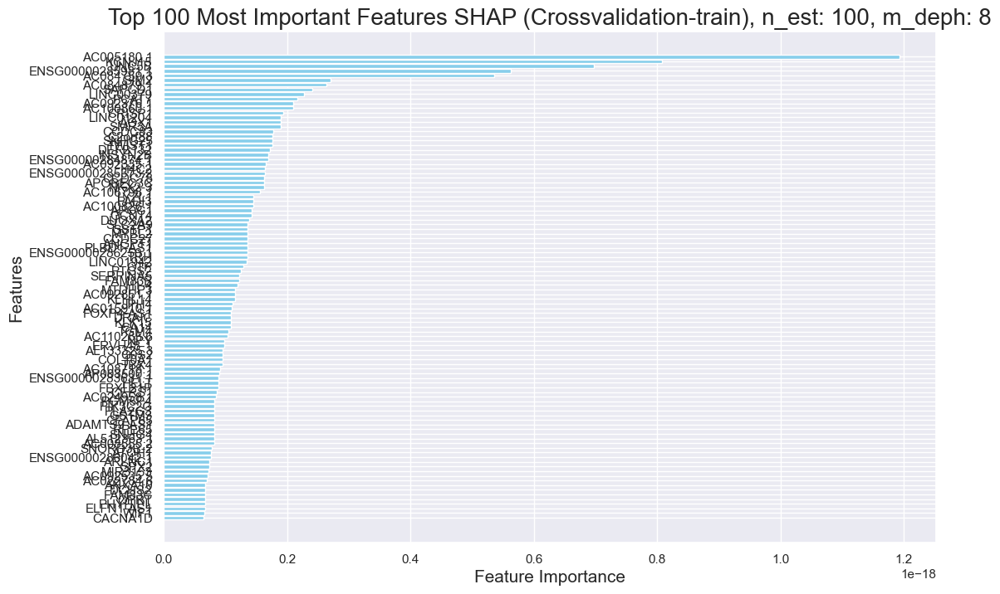

In [ ]:
# plot and save the most important SHAP features for the train set

N =100


# Find the indices of features with the highest absolute mean SHAP values across all folds
top_feature_indices_train = np.argsort(shap_values_abs_mean_train)[::-1][:N]

# Retrieve the corresponding feature names from the features list
top_features_cv_train = [features[i] for i in top_feature_indices_train]



# Print the features with the highest absolute mean SHAP values across all folds
print("\nFeatures with the highest absolute mean SHAP values across all folds:")
for feature, shap_value in zip(top_features_cv_train, shap_values_abs_mean_train[top_feature_indices_train]):
    print("{:<30}: {:.6f}".format(feature, shap_value))

# Plot the features with the highest feature importance values
plt.figure(figsize=(12, 8))
plt.barh(top_features_cv_train,shap_values_abs_mean_train[top_feature_indices_train], color='skyblue')
plt.xlabel('Feature Importance',fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title(f'Top {N} Most Important Features SHAP (Crossvalidation-train), n_est: {n_est}, m_deph: {m_deph}', fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

#rename fetures to compare:

SHAP_cv_train_features= top_features_cv_train


# Common features in CV sets: analysis with Venn diagrams

[29, 58, 17, 42, 33, 4, 21]


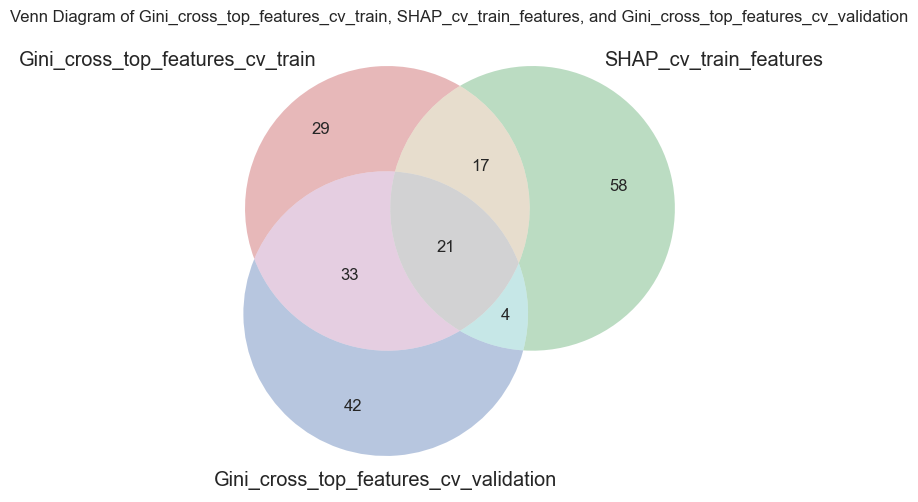

Common genes in all sets: {'PGM5P4', 'SNHG25', 'SIM2', 'GCNT4', 'FOXP4-AS1', 'PIK3C2G', 'FAM83B', 'COL10A1', 'APOBEC3C', 'CA14', 'MYBL2', 'JPH4', 'MTDHP3', 'AOX1', 'CCDC27', 'G0S2', 'LINC01204', 'GSTP1', 'AC008555.2', 'PCAT7', 'AC005180.1'}
Genes in Gini_cross_top_features_cv_train and SHAP_cv_train_features not in Gini_cross_top_features_cv_validation: {'TRH', 'NKX2-3', 'ANGPT1', 'RPE65', 'AL133325.3', 'AC108718.1', 'PHYHIPL', 'SLC2A9', 'CFAP65', 'KCNJ15', 'AL512363.1', 'ADAMTS9-AS1', 'GSTM3', 'PLBD1-AS1', 'SNHG4', 'AC110285.6', 'C2orf88'}
Genes in Gini_cross_top_features_cv_train and Gini_cross_top_features_cv_validation not in SHAP_cv_train_features: {'FNDC10', 'ARHGAP19-SLIT1', 'GAL', 'LINC00958', 'SCGB3A1', 'AC105450.1', 'AC026469.1', 'AC011523.1', 'C10orf82', 'PNMT', 'ENSG00000285972.1', 'SLC45A2', 'KY', 'LINC01509', 'DLX2', 'PLA2G4C-AS1', 'SNORA73B', 'SNORD104', 'ARSF', 'DUOX1', 'HPN', 'AMACR', 'UCN', 'HPN-AS1', 'TDRD1', 'HOXC4', 'SMR3B', 'HJURP', 'KRT222', 'AL353622.1', 'AC0680

In [ ]:
# Venn diagrams on genes found important by crossvalidation:


#genes = SHAP_cv_test_features
#genes = SHAP_cv_train_features
#genes = Gini_cross_top_features_cv_test
#genes = Gini_cross_top_features_cv_train

Int_SHAP_Gini_train_Gini_test= venn_diagrams(Gini_cross_top_features_cv_train,SHAP_cv_train_features, Gini_cross_top_features_cv_test,
      label1='Gini_cross_top_features_cv_train', label2='SHAP_cv_train_features', label3='Gini_cross_top_features_cv_validation')


[34, 48, 9, 29, 28, 14, 29]


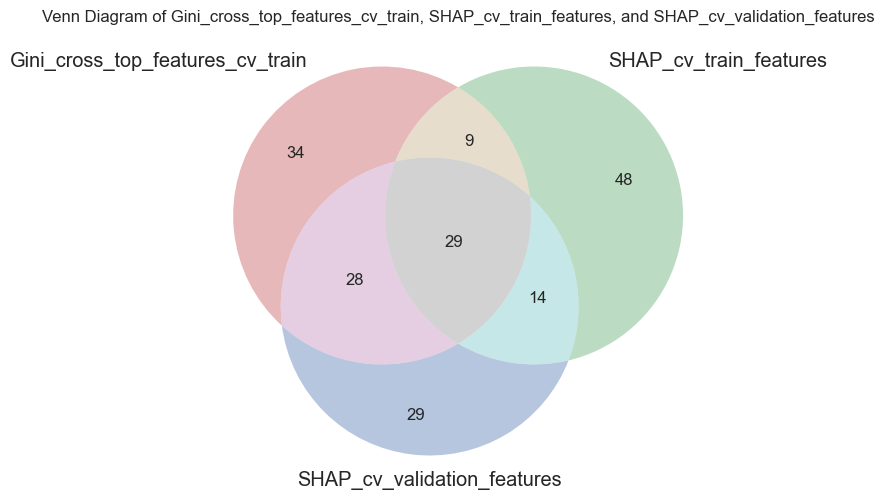

Common genes in all sets: {'PGM5P4', 'SNHG25', 'PHYHIPL', 'SIM2', 'GCNT4', 'FOXP4-AS1', 'FAM83B', 'COL10A1', 'APOBEC3C', 'CA14', 'CFAP65', 'AL512363.1', 'SNHG4', 'AC110285.6', 'TRH', 'ANGPT1', 'RPE65', 'AL133325.3', 'SLC2A9', 'JPH4', 'AOX1', 'CCDC27', 'LINC01204', 'GSTP1', 'AC008555.2', 'GSTM3', 'PCAT7', 'PLBD1-AS1', 'AC005180.1'}
Genes in Gini_cross_top_features_cv_train and SHAP_cv_train_features not in SHAP_cv_validation_features: {'NKX2-3', 'PIK3C2G', 'G0S2', 'MYBL2', 'AC108718.1', 'KCNJ15', 'ADAMTS9-AS1', 'C2orf88', 'MTDHP3'}
Genes in Gini_cross_top_features_cv_train and SHAP_cv_validation_features not in SHAP_cv_train_features: {'FNDC10', 'LINC00958', 'DLX1', 'AC026469.1', 'B3GAT1-DT', 'EPHA10', 'PLAAT5', 'ENSG00000285972.1', 'SLC45A2', 'KY', 'AL359551.1', 'DLX2', 'LINC01509', 'AL031123.2', 'SNORA73B', 'GNAO1', 'SNORD104', 'KLHL4', 'HPN', 'HPN-AS1', 'LYVE1', 'HOXC4', 'AC012531.1', 'AL353622.1', 'SLC46A2', 'TERT', 'AC068057.1', 'CYP4B1'}
Genes in SHAP_cv_train_features and SHAP_cv

In [ ]:
Int_SHAP_Gini_train_SHAP_test= venn_diagrams(Gini_cross_top_features_cv_train,SHAP_cv_train_features, SHAP_cv_test_features,
      label1='Gini_cross_top_features_cv_train', label2='SHAP_cv_train_features', label3='SHAP_cv_validation_features')


[12, 4, 17]


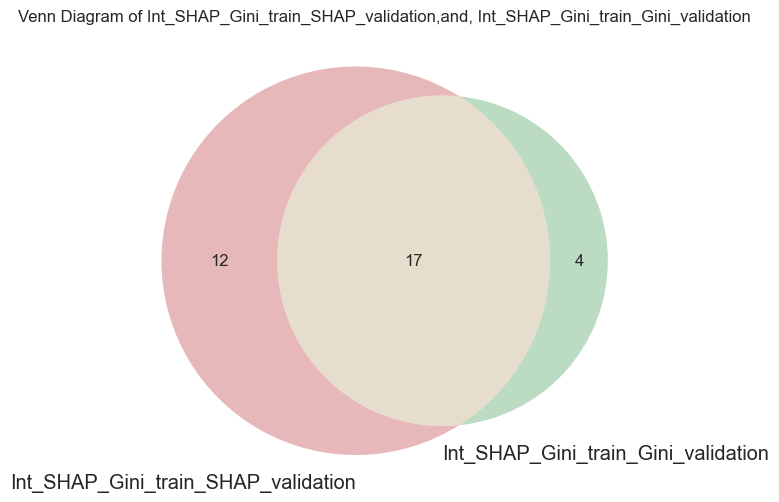

Common genes in all sets: {'PCAT7', 'CCDC27', 'FOXP4-AS1', 'FAM83B', 'COL10A1', 'APOBEC3C', 'LINC01204', 'GSTP1', 'PGM5P4', 'AC005180.1', 'AOX1', 'SNHG25', 'AC008555.2', 'CA14', 'JPH4', 'SIM2', 'GCNT4'}
Top selected features in cv training:  {'TRH', 'ANGPT1', 'RPE65', 'AL133325.3', 'MYBL2', 'PGM5P4', 'SNHG25', 'PHYHIPL', 'SLC2A9', 'JPH4', 'MTDHP3', 'AOX1', 'SIM2', 'GCNT4', 'CCDC27', 'FOXP4-AS1', 'PIK3C2G', 'FAM83B', 'G0S2', 'COL10A1', 'APOBEC3C', 'LINC01204', 'GSTP1', 'AC008555.2', 'CA14', 'CFAP65', 'GSTM3', 'AL512363.1', 'PLBD1-AS1', 'PCAT7', 'SNHG4', 'AC110285.6', 'AC005180.1'}
{'PCAT7', 'CCDC27', 'FOXP4-AS1', 'FAM83B', 'COL10A1', 'APOBEC3C', 'LINC01204', 'GSTP1', 'PGM5P4', 'AC005180.1', 'AOX1', 'SNHG25', 'AC008555.2', 'CA14', 'JPH4', 'SIM2', 'GCNT4'}


In [ ]:
# # call venn 2 function for the intersections:
Int_all_cv, Top_features_cv = venn2_diagrams(Int_SHAP_Gini_train_SHAP_test, Int_SHAP_Gini_train_Gini_test,
      label1='Int_SHAP_Gini_train_SHAP_validation', label2='Int_SHAP_Gini_train_Gini_validation')
#print('Common genes in all sets:', Int_all_venn2)
print('Top selected features in cv training: ', Top_features_cv)
print(Int_all_cv)

[62, 62, 31, 24, 4, 4, 3]


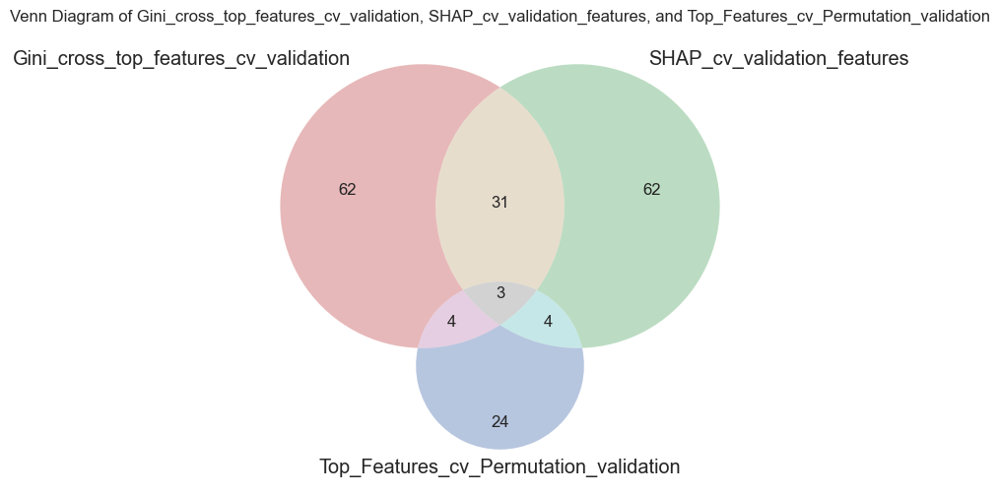

Common genes in all sets: {'APOBEC3C', 'SIM2', 'DLX2'}
Genes in Gini_cross_top_features_cv_validation and SHAP_cv_validation_features not in Top_Features_cv_Permutation_validation: {'PCAT7', 'FNDC10', 'LINC00958', 'PGM5P4', 'SNHG25', 'AC026469.1', 'GCNT4', 'FOXP4-AS1', 'FAM83B', 'ENSG00000285972.1', 'SLC45A2', 'COL10A1', 'KY', 'LINC01509', 'CA14', 'SNORA73B', 'SNORD104', 'HPN', 'HPN-AS1', 'JPH4', 'AOX1', 'CCDC27', 'HOXC4', 'LINC01204', 'GSTP1', 'LRRC3B', 'AC008555.2', 'AL353622.1', 'AC068057.1', 'CYP4B1', 'AC005180.1'}
Genes in Gini_cross_top_features_cv_validation and Top_Features_cv_Permutation_validation not in SHAP_cv_validation_features: {'TDRD1', 'AC105450.1', 'ARSF', 'HJURP'}
Genes in SHAP_cv_validation_features and Top_Features_cv_Permutation_validation not in Gini_cross_top_features_cv_validation: {'DLX1', 'CFAP65', 'FAM87A', 'AL031123.2'}
[38, 42, 51, 23, 5, 1, 6]


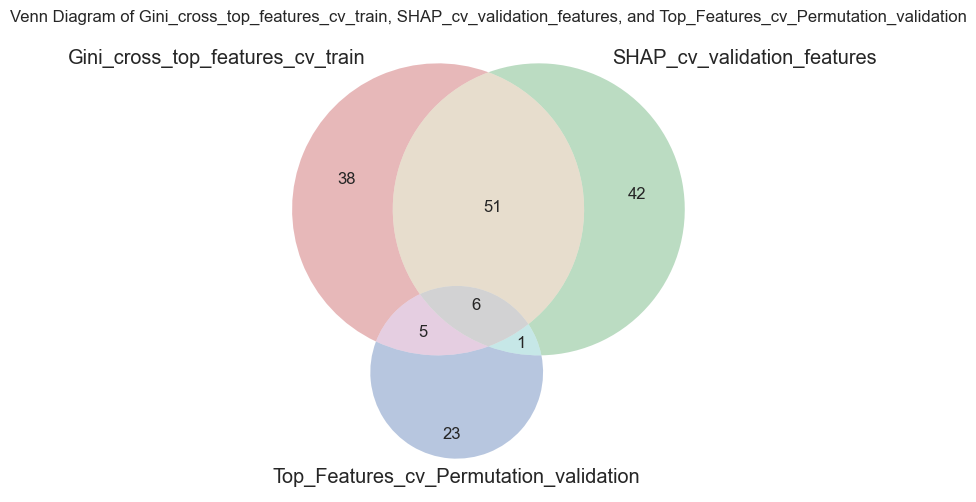

Common genes in all sets: {'DLX1', 'APOBEC3C', 'DLX2', 'CFAP65', 'AL031123.2', 'SIM2'}
Genes in Gini_cross_top_features_cv_train and SHAP_cv_validation_features not in Top_Features_cv_Permutation_validation: {'AC068057.1', 'FNDC10', 'LINC00958', 'PGM5P4', 'SNHG25', 'PHYHIPL', 'AC026469.1', 'B3GAT1-DT', 'EPHA10', 'GCNT4', 'PLAAT5', 'FOXP4-AS1', 'FAM83B', 'ENSG00000285972.1', 'SLC45A2', 'COL10A1', 'KY', 'AL359551.1', 'LINC01509', 'CA14', 'AL512363.1', 'SNHG4', 'AC110285.6', 'TRH', 'SNORA73B', 'ANGPT1', 'GNAO1', 'RPE65', 'AL133325.3', 'SNORD104', 'KLHL4', 'HPN', 'SLC2A9', 'HPN-AS1', 'JPH4', 'AOX1', 'LYVE1', 'HOXC4', 'AC012531.1', 'CCDC27', 'LINC01204', 'GSTP1', 'AC008555.2', 'AL353622.1', 'SLC46A2', 'GSTM3', 'TERT', 'PCAT7', 'CYP4B1', 'PLBD1-AS1', 'AC005180.1'}
Genes in Gini_cross_top_features_cv_train and Top_Features_cv_Permutation_validation not in SHAP_cv_validation_features: {'NKX2-3', 'AC105450.1', 'ARSF', 'HJURP', 'TDRD1'}
Genes in SHAP_cv_validation_features and Top_Features_cv_Pe

In [ ]:
Int_SHAP_Gini_Permutation_test= venn_diagrams(Gini_cross_top_features_cv_test,SHAP_cv_test_features, Top_Features_cv_Permutation_test,
      label1='Gini_cross_top_features_cv_validation', label2='SHAP_cv_validation_features', label3='Top_Features_cv_Permutation_validation')


Int_Gini_train_SHAP_Permutation_test= venn_diagrams(Gini_cross_top_features_cv_train,SHAP_cv_test_features, Top_Features_cv_Permutation_test,
      label1='Gini_cross_top_features_cv_train', label2='SHAP_cv_validation_features', label3='Top_Features_cv_Permutation_validation')


[26, 19, 3]


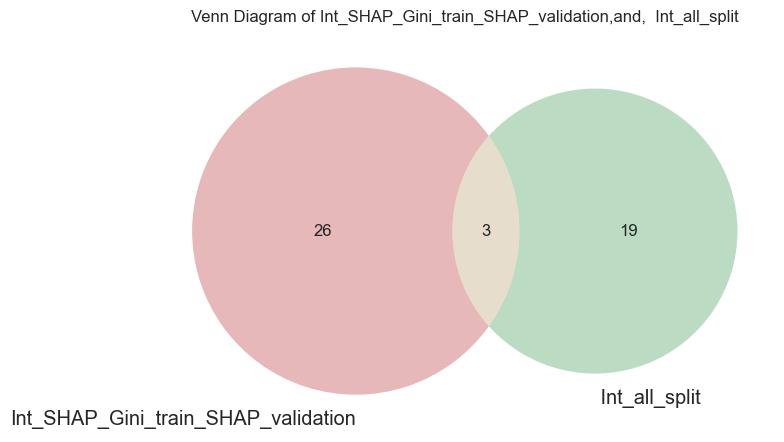

Common genes in all sets: {'JPH4', 'CCDC27', 'AC005180.1'}
Top selected features in split and cv:  {'FAM83C', 'FNDC10', 'GAL', 'DLGAP1-AS3', 'MGAT4C', 'SAPCD1', 'OR6F1', 'KRT24', 'PPP3R2', 'NKAIN1', 'DUOXA1', 'ENPP3', 'AL512363.1', 'AC005064.1', 'BRINP2', 'AC022558.2', 'PDK4', 'AL353746.1', 'CASP14', 'MYBL2', 'UGT1A3', 'H2AC4', 'DEFB131A', 'LINC01210', 'ENSG00000283601.1', 'SLC34A2', 'ONECUT2', 'SCGB1A1', 'TDRD1', 'LINC02056', 'ENSG00000284623.1', 'LINC01204', 'ADCY8', 'PLCZ1', 'C11orf87', 'CYP4B1', 'ARHGAP19-SLIT1', 'LINC00868', 'EPHA10', 'EVA1A', 'FAM83B', 'AC084211.1', 'CYSLTR2', 'C8B', 'LINC01727', 'TNRC18P1', 'HCAR3', 'AC009902.3', 'HOXC6', 'AC087516.2', 'MARCKSL1P2', 'AC008759.1', 'AC112492.1', 'JPH4', 'GPRC6A', 'AC010329.2', 'AL139280.1', 'MEI4', 'CCDC27', 'LINC01942', 'AL662864.1', 'CDH8', 'SPINT3', 'AL023803.1', 'AC087235.2', 'ENSG00000286989.1', 'AC005180.1'}
67


In [ ]:
# # call funtion with different lists
Int_all_split_cv, Top_features_split_cv = venn2_diagrams(Int_SHAP_Gini_train_SHAP_test,Int_all_Split,label1='Int_SHAP_Gini_train_SHAP_validation', label2=' Int_all_split')
#print('Common genes in all sets:', Int_all_venn2)
print('Top selected features in split and cv: ', Top_features_Split)
print(len(Top_features_Split))

[90, 0, 0, 39, 6, 18, 4]


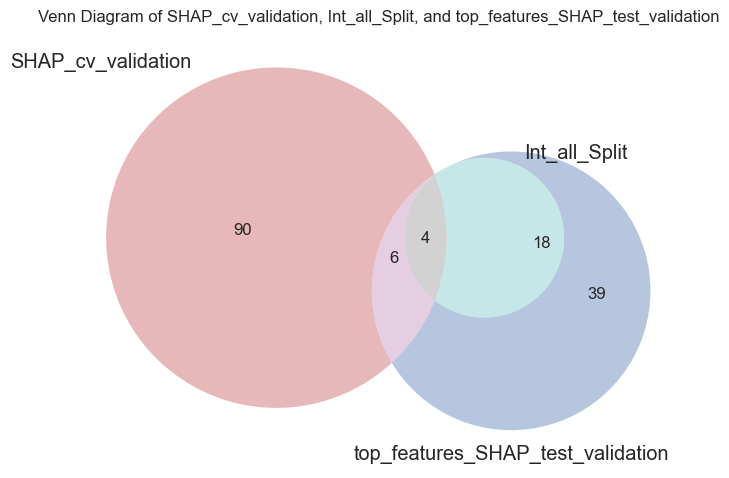

Common genes in all sets: {'EPHA10', 'CCDC27', 'JPH4', 'AC005180.1'}
Genes in SHAP_cv_validation and Int_all_Split not in top_features_SHAP_test_validation: set()
Genes in SHAP_cv_validation and top_features_SHAP_test_validation not in Int_all_Split: {'TNRC18P1', 'FNDC10', 'FAM83B', 'LINC01204', 'AL512363.1', 'CYP4B1'}
Genes in Int_all_Split and top_features_SHAP_test_validation not in SHAP_cv_validation: {'FAM83C', 'PDK4', 'ARHGAP19-SLIT1', 'GAL', 'EVA1A', 'PPP3R2', 'MYBL2', 'AC008759.1', 'DUOXA1', 'ENSG00000286989.1', 'ENPP3', 'SAPCD1', 'AC087235.2', 'KRT24', 'SCGB1A1', 'AC010329.2', 'AC005064.1', 'AC022558.2'}


In [ ]:
Int_all_plus_shap_spli_plus_cv= venn_diagrams(SHAP_cv_test_features,Int_all_Split, top_features_SHAP_test_split,
      label1='SHAP_cv_validation', label2='Int_all_Split', label3='top_features_SHAP_test_validation')



# PCA analysis

In [ ]:
PRAD_ML_df_gene_names

,Condition,TNMD,AOC1,PDK4,ZMYND10,MYH13,SLC13A2,MATK,TFAP2B,TENM1,...,ENSG00000288047.1,ENSG00000288048.1,ENSG00000288060.1,ENSG00000288086.1,ENSG00000288097.1,ENSG00000288101.1,ENSG00000288104.1,ENSG00000288172.1,ENSG00000288547.3,ENSG00000288658.1
unstranded_2fa8c89c-893e-465a-aeb5-e3fb81a200c7.rna_seq.augmented_star_gene_counts.tsv,1,15.966137,865.532686,3723.471197,31.091951,0.840323,0.840323,874.776239,0.000000,715.955193,...,0.000000,35.293566,0.000000,5.041938,0.840323,3.361292,1.680646,0.000000,52.940349,0.000000
unstranded_288d2dc8-9fb3-4164-8e6a-cee107d11404.rna_seq.augmented_star_gene_counts.tsv,1,11.725003,34.002509,1224.090334,69.177519,0.000000,1.172500,315.402586,68.005019,1279.197849,...,0.000000,16.415004,2.345001,8.207502,0.000000,0.000000,5.862502,0.000000,22.277506,2.345001
unstranded_7b97885a-f365-4f11-8f35-9bf17a7344b5.rna_seq.augmented_star_gene_counts.tsv,1,1.597117,251.545950,1652.217685,46.316397,8.784144,3.194234,528.645775,1.597117,177.280003,...,0.000000,0.798559,1.597117,0.000000,0.000000,0.000000,3.194234,0.000000,22.359640,0.798559
unstranded_e32fc401-5ddd-4dfc-8be4-8d4072a080c3.rna_seq.augmented_star_gene_counts.tsv,1,4.584119,51.342133,150.359103,257.627488,2.750471,8.251414,110.935680,8.251414,16160.853136,...,1.833648,6.417767,23.837419,0.000000,0.916824,0.000000,106.351561,0.000000,5.500943,7.334590
unstranded_16eca87b-206a-4c2d-8ab7-f8c2fdb51b0e.rna_seq.augmented_star_gene_counts.tsv,1,2.606933,196.388934,13978.373392,48.662745,0.868978,0.000000,146.857211,2.606933,78.207982,...,0.000000,21.724440,2.606933,0.000000,0.000000,0.000000,4.344888,0.000000,92.980601,0.868978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unstranded_422d5778-bfe0-4e2f-b254-2a753c777686.rna_seq.augmented_star_gene_counts.tsv,0,362.026157,85.928388,359838.505069,23.947256,7.043310,8271.663796,30.990566,153.544168,209.890652,...,14.086621,390.199399,0.000000,7.043310,8.451973,0.000000,1.408662,16.903945,2842.680099,177.491423
unstranded_60028d9d-c8e5-4c4e-a75c-cc3df6f2eea1.rna_seq.augmented_star_gene_counts.tsv,0,37.214004,5730.956592,877.946703,26.581431,0.000000,0.759469,30.378779,0.759469,841.492169,...,0.759469,15.948859,0.000000,5.316286,0.000000,0.000000,3.037878,0.000000,12.910981,0.000000
unstranded_2c022016-756e-4cbf-9baa-dab196b6e715.rna_seq.augmented_star_gene_counts.tsv,0,15.963598,27217.934445,12411.697379,17.959048,0.000000,9.312099,67.845291,1.330300,1197.934994,...,1.330300,24.610547,0.000000,9.312099,0.665150,0.665150,0.000000,0.000000,21.949947,2.660600
unstranded_998581d3-8fdc-4f4a-92cd-d98fc0f910bc.rna_seq.augmented_star_gene_counts.tsv,0,501.478180,7.975796,33270.036453,41.872930,0.000000,6171.272232,24.924363,121.630891,56.827547,...,48.851751,447.641556,0.000000,0.996975,26.918312,0.000000,0.996975,8.972771,2408.690422,280.149838


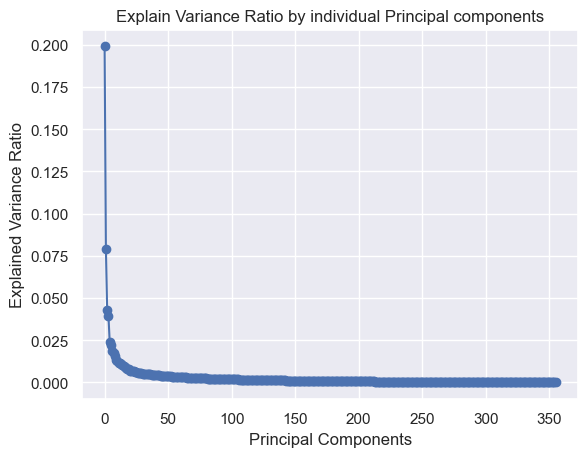

In [ ]:
#PCA analyis

# prepare data for PCA by removing the column condition

df =  PRAD_ML_df_gene_names.copy() 


# Drop the first 2 columns
df_x = df.drop(df.columns[:1], axis=1)
df_x = df_x.reset_index(drop=True)

scaler = MinMaxScaler()

df_x_norm = scaler.fit_transform(df_x)


from sklearn.decomposition import PCA
pca=PCA()
pca.fit(df_x_norm)
#pca.fit_transform(df_x_norm)



plt.plot(pca.explained_variance_ratio_,'-o')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explain Variance Ratio by individual Principal components')
plt.show()






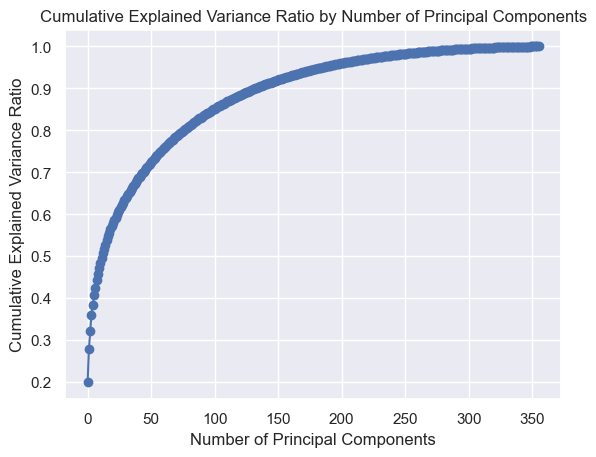

In [ ]:
#print(df_x)


# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(cumulative_variance_ratio, '-o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Number of Principal Components')
plt.show()

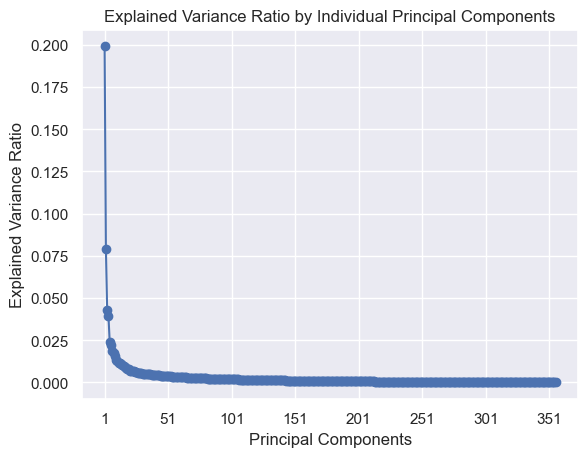

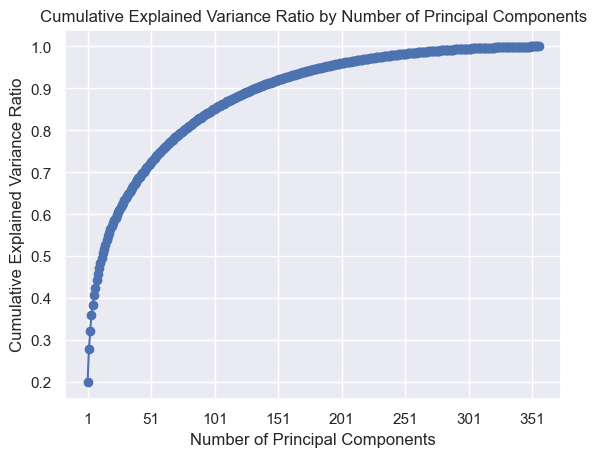

In [ ]:
# plot the PCAs with correct labels, since they start in PC1

# Define the labels for the principal components
num_components = len(pca.explained_variance_ratio_)
pc_labels = [f'PC{i+1}' for i in range(num_components)]

# Define the x-ticks to be every 10th component
x_ticks = np.arange(1, num_components+1, 50)
x_labels = [f'{i}' for i in x_ticks]

# Plot the explained variance ratio for each principal component
plt.plot(np.arange(1, num_components+1), pca.explained_variance_ratio_, '-o')
plt.xticks(ticks=x_ticks, labels=x_labels)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Individual Principal Components')
plt.show()

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(np.arange(1, num_components+1), cumulative_variance_ratio, '-o')
plt.xticks(ticks=x_ticks, labels=x_labels)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Number of Principal Components')
plt.show()


In [ ]:
# Determine the number of components needed to explain desired variance (e.g., 80%)


# Determine the number of components needed to explain desired variance (e.g., 90%)
threshold = 0.90
#threshold =0.80
num_components = np.argmax(cumulative_variance_ratio >= threshold) + 1

print(f"Number of components to explain {threshold*100}% variance: {num_components}")




Number of components to explain 90.0% variance: 134


[0.19915616 0.0791266  0.04267972 0.03952269 0.02390509 0.02186468
 0.01865148 0.01753918 0.01536649 0.01313612]


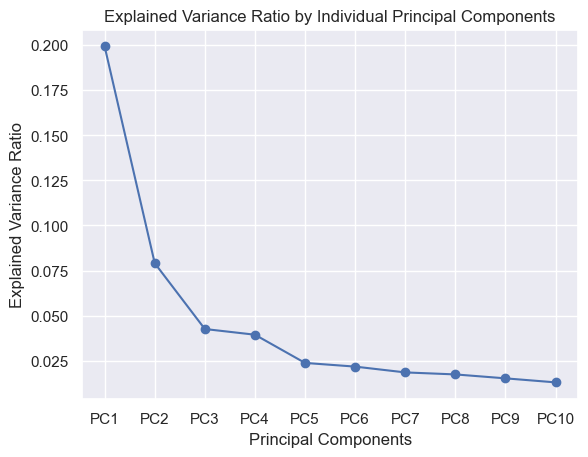

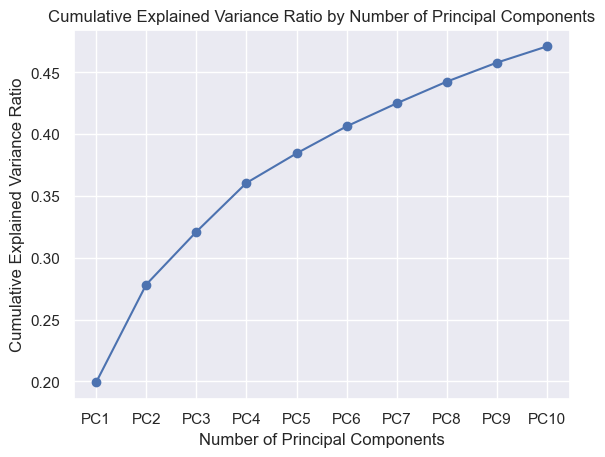

In [ ]:
# Plots with only teh first desired components

num_components =10

pca=PCA(n_components = num_components)
pca.fit(df_x_norm)
#pca.fit_transform(df_x_norm)

# Define the labels for the principal components
pc_labels = [f'PC{i+1}' for i in range(num_components)]
print(pca.explained_variance_ratio_)

# Plot the explained variance ratio for each principal component
plt.plot(pca.explained_variance_ratio_, '-o')
plt.xticks(ticks=np.arange(num_components), labels=pc_labels)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Individual Principal Components')
plt.show()



# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)


# Plot the cumulative explained variance ratio
plt.plot(cumulative_variance_ratio, '-o')
plt.xticks(ticks=np.arange(num_components), labels =pc_labels)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Number of Principal Components')
plt.show()


# PCA components loadings to analyze feature importances

Top Features for the 1 Principal Component:
Index(['SIM1', 'HOXB-AS3', 'HOXB8', 'LMO3', 'KCNJ15', 'AC009102.2', 'ANO1',
       'DUOXA1', 'HOXB7', 'EMX2OS', 'GNAO1', 'GSTP1', 'LINC02817', 'APOBEC3C',
       'PIK3C2G', 'PLBD1-AS1', 'SPATA20P1', 'PNMT', 'MCF2', 'AC106865.1',
       'HOXB9', 'DUOX1', 'LINC02086', 'AC100860.1', 'LINC01152', 'KCNS1',
       'ACSL6', 'AL358334.2', 'CLU', 'AL354793.1', 'CRABP2', 'VWA5B2', 'ADTRP',
       'TRIM9', 'AL354863.1', 'GLIS3', 'SLC39A2', 'AC129507.4', 'TNRC18P1',
       'HOXD3', 'ZFHX4-AS1', 'LINC01116', 'EMX2', 'POU3F3', 'TMEM132C',
       'AL354824.1', 'ENSG00000286523.1', 'ZNF209P', 'LINC01671', 'HOXB5',
       'LINC02137', 'GATA3', 'LINC01139', 'NDRG4', 'CA14', 'SLC34A2', 'SPINK2',
       'ENSG00000285012.1', 'KLHL14', 'LINC01182', 'CT75', 'EVA1A', 'CYSLTR2',
       'FOXI2', 'CXCR2', 'SNAP25-AS1', 'GATA3-AS1', 'LINC02707', 'AC023158.1',
       'GPX6', 'CA3-AS1', 'SERPINA5', 'LINC01159', 'AGXT2', 'AKR1B1', 'PRDM16',
       'UNC5B', 'SNAP25', 'KRT24

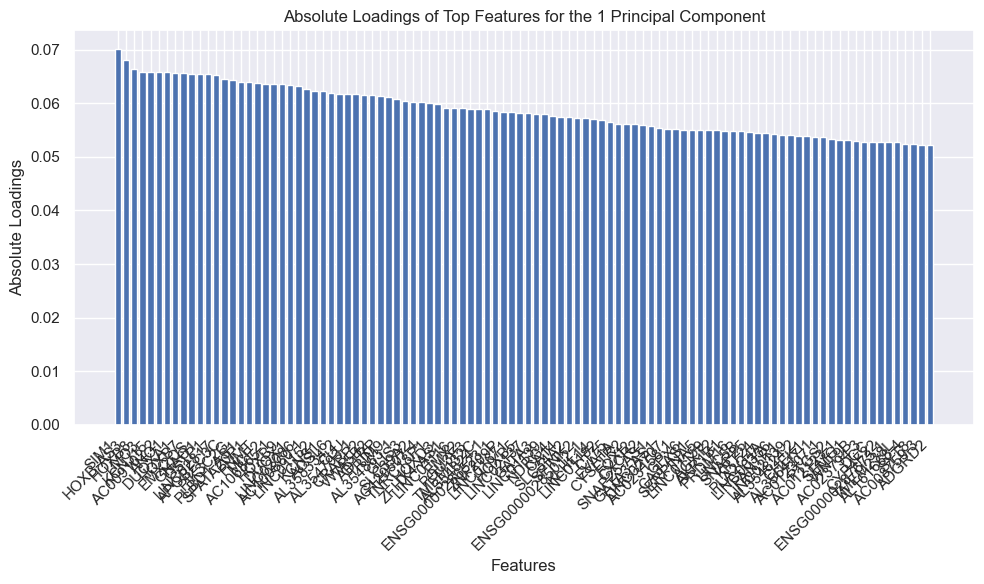

Top Features for the 2 Principal Component:
Index(['ANGPT1', 'EPHA10', 'AL512363.1', 'DLX1', 'AL117329.1', 'AC074141.1',
       'LGR6', 'AL031123.2', 'ASPA', 'TBX4', 'AC105398.1', 'ENSG00000286989.1',
       'STAC', 'PCAT7', 'HOXC5', 'FOXP4-AS1', 'AP003548.1', 'ADAMTS9-AS1',
       'PIMREGP2', 'PLA2G4C-AS1', 'HOXC6', 'AL133153.1', 'CCDC27', 'PCA3',
       'RPE65', 'C2orf88', 'AL355987.5', 'AC144450.1', 'ENSG00000287894.1',
       'PGM5P4', 'BMP5', 'AP002981.1', 'PHYHIPL', 'KMT5AP3', 'DRAIC',
       'AC141930.1', 'NKX2-3', 'AC022432.1', 'ERG', 'AC018358.1', 'FBXL21P',
       'FAM163A', 'FP325330.3', 'IGSF1', 'TMEM252', 'FNDC10', 'FAM83B',
       'CLEC18B', 'CACNA1D', 'AL356010.2', 'DLX2-DT', 'LINC02242', 'WIF1',
       'AC084816.1', 'CTBP1-AS', 'AC108718.1', 'MTDHP3', 'PDE1C', 'LINC01509',
       'IFITM3P9', 'OR51L1', 'AC011487.1', 'EVX2', 'ENSG00000286027.1', 'HPN',
       'LINC02492', 'WASF5P', 'TRPM2-AS', 'AC026469.1', 'AC107419.1', 'CRYGD',
       'AL359314.1', 'AC092535.2', 'LINC01

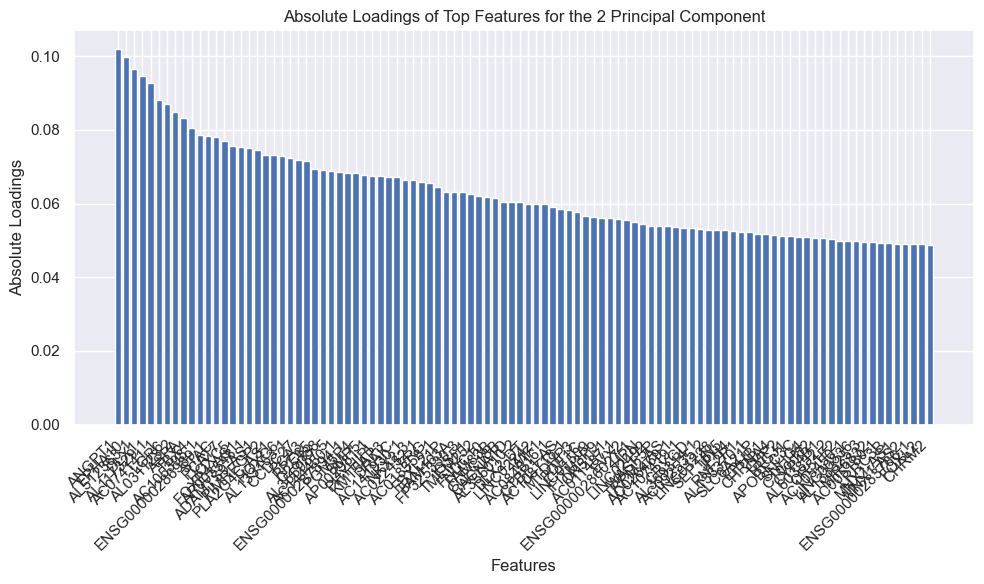

Top Features for the 3 Principal Component:
Index(['ERG', 'AL117329.1', 'OR51L1', 'OR51A8P', 'SSXP10', 'ENSG00000287191.1',
       'ENSG00000285253.1', 'OR52R1', 'LINC01866', 'AL358232.1', 'OR2J3',
       'TRPM2-AS', 'OR51C4P', 'FAR2P4', 'OR51T1', 'AL157702.2', 'ASH1L-IT1',
       'OR51F3P', 'AL138847.2', 'SNORD3B-2', 'AL512622.1', 'INSYN2B', 'XIAPP2',
       'OR13G1', 'H4C2', 'RNA5SP48', 'AC012414.5', 'AMELX', 'OR51F5P',
       'AC108860.1', 'SYNJ2-IT1', 'OR51F2', 'AC024267.4', 'PCOTH',
       'ARHGEF38-IT1', 'ARLNC1', 'TENM1', 'OR51H1', 'AC084816.1', 'OR51N1P',
       'ENSG00000287818.1', 'LINC00939', 'OTX1', 'ENSG00000286332.1',
       'SNORA62', 'SLC2A2', 'OR51F4P', 'NKAIN1', 'LAMTOR5P1', 'AL031710.1',
       'ADGRG4', 'FAR2P1', 'ENSG00000287340.1', 'ENSG00000286850.1',
       'THRA1/BTR', 'ENSG00000284677.1', 'AC011487.1', 'H1-5', 'TRGJ1',
       'AC021915.2', 'AL360181.4', 'HOXC5', 'OR51S1', 'TRGJP', 'C1QTNF9B',
       'XACT', 'KIAA0087', 'B3GAT1-DT', 'AC078950.1', 'OR51A7', 'AC0

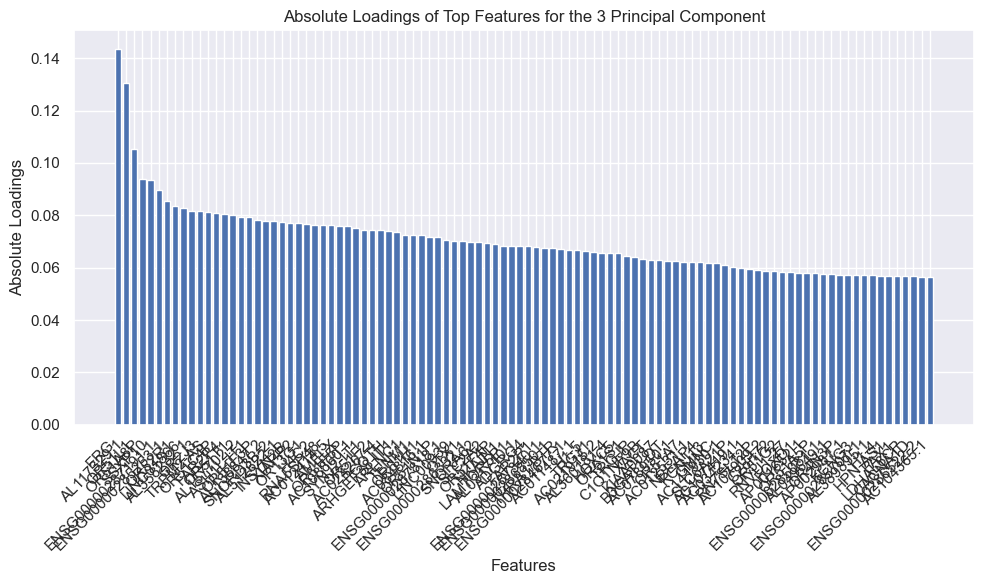

Top Features for the 4 Principal Component:
Index(['AL117329.1', 'ERG', 'AC144450.1', 'CACNA1D', 'FP325330.3',
       'AL360181.4', 'AC141930.1', 'OTX1', 'AL358216.1', 'TDRD1', 'AC011487.1',
       'AL157702.2', 'PCOTH', 'TRPM2-AS', 'RNF2P1', 'KIAA0087', 'AC021915.2',
       'UNC5A', 'AC009902.2', 'VDAC1P13', 'SRARP', 'NLRP12', 'HLA-Z',
       'ENSG00000286332.1', 'C2orf72', 'AC105450.1', 'AC009407.1', 'NKAIN1',
       'TFF3', 'PPFIA2-AS1', 'C1QTNF9B', 'AC012291.1', 'AC009902.3', 'SHISA8',
       'AC005064.1', 'ENSG00000285707.1', 'HPN-AS1', 'SSXP10', 'INSYN2B',
       'AC024267.4', 'RNA5SP48', 'AC104820.1', 'ENSG00000286944.1', 'GEMIN8P1',
       'OR51C4P', 'AL389895.1', 'ASH1L-IT1', 'GNG13', 'PAX1', 'LINC00898',
       'KCNG3', 'H1-5', 'ENSG00000288060.1', 'ENSG00000287818.1', 'DRAIC',
       'ZIC2', 'KLF2P4', 'AP000844.2', 'OR13G1', 'XIAPP2', 'OR51F3P', 'AMELX',
       'AC084816.1', 'LINC01524', 'SLC2A2', 'PCAT5', 'AC025674.2',
       'ZNF649-AS1', 'LINC01866', 'AC012414.5', 'PLA2G4

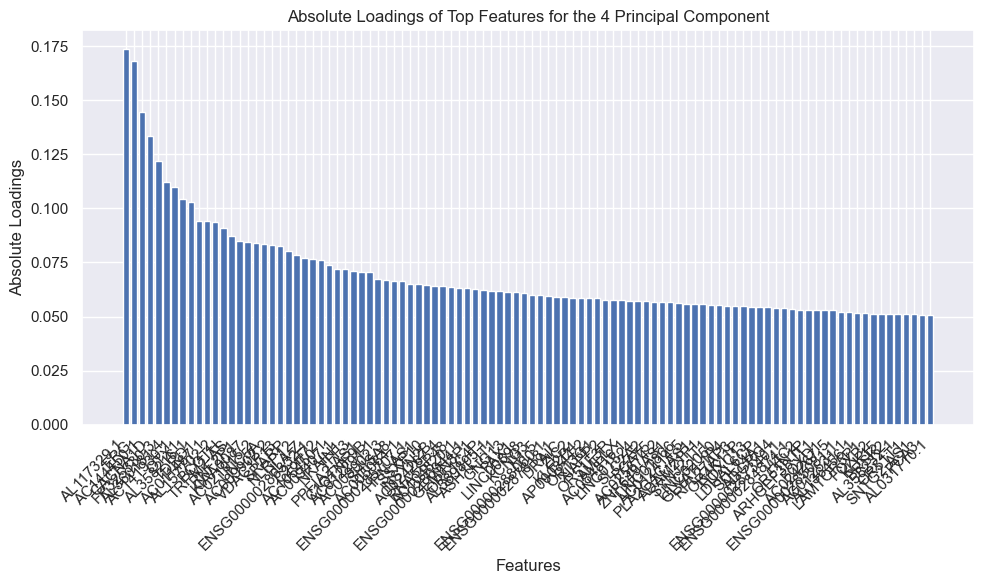

Top Features for the 5 Principal Component:
Index(['TBX4', 'BMP5', 'AL133370.1', 'FBXL21P', 'STAC', 'AP003548.1', 'CHP2',
       'HTR1E', 'DUOXA1', 'S100A14', 'AL356010.2', 'LINGO2', 'LINC01228',
       'ANGPT1', 'LINC00836', 'CYP4B1', 'LGALS7B', 'LINC02351', 'IFITM3P9',
       'COLEC10', 'CCDC27', 'RHCG', 'AC020687.1', 'AC026469.1', 'ADGRG4',
       'DMBT1', 'EPHB1', 'CRYGD', 'IGSF1', 'PGM5P4', 'LMO3', 'AL353746.1',
       'ADAMTS9-AS1', 'CRABP2', 'CHRNA4', 'AL359924.1', 'LINC02139',
       'ENSG00000284623.1', 'FAM163A', 'AC084816.1', 'FOXI2', 'ZNF736P9Y',
       'LINC02747', 'FAM83C', 'C2orf88', 'AC105398.1', 'AC108718.1',
       'LINC00958', 'LINC00891', 'USH1G', 'ENSG00000287038.1', 'ASPA',
       'LRRC3B', 'TMPRSS11A', 'AL512363.1', 'TMEM252', 'PCP4L1', 'MUC21',
       'DSG4', 'SBSPON', 'LINC00643', 'MTDHP3', 'GPX2', 'ASTL', 'JPH4',
       'AP001046.1', 'HCAR3', 'ENSG00000288086.1', 'KLHL4', 'AC005180.1',
       'SERPINB5', 'HCG22', 'HSD17B13', 'FOXQ1', 'DLX1', 'SCGB3A1', 'ADRB3'

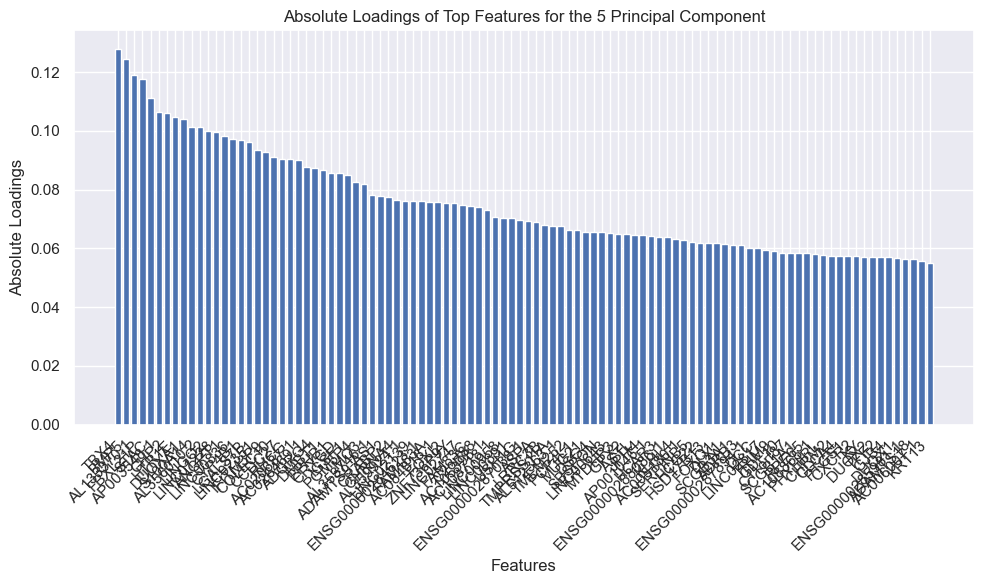

Top Features for the 6 Principal Component:
Index(['OR51E2', 'ENSG00000286027.1', 'NLRP12', 'OR51A8P', 'AC144450.1',
       'AL355987.5', 'OR51L1', 'PCA3', 'AC141930.1', 'ENSG00000286989.1',
       'TMEM249', 'HOXC5', 'ENSG00000287894.1', 'AP002981.1', 'APOF',
       'LINC01509', 'NUTM2F', 'MMP26', 'HOXC6', 'OR51H2P', 'TRGJ1', 'FNDC10',
       'PCAT14', 'SEPTIN5', 'LINC00634', 'AL133325.3', 'AMH', 'MIR6832',
       'AC092535.2', 'ZIC2', 'AL360181.4', 'PCOTH', 'PPFIA2', 'AL133153.1',
       'ADAM21P1', 'ENSG00000285205.2', 'HOXC4', 'ARHGDIG',
       'ENSG00000288060.1', 'RHOXF1P2', 'DLL3', 'FOXP4-AS1', 'SRARP',
       'AC107419.1', 'AP001610.3', 'AC007687.1', 'UCN', 'VAX1', 'MNX1-AS1',
       'CCDC78', 'MNX1', 'AC104564.4', 'BRSK2', 'FOXN4', 'HNF1A', 'AL359314.1',
       'ZIC5', 'RPSAP1', 'MNX1-AS2', 'PPFIA2-AS1', 'BAIAP2L2', 'HOXC13',
       'SNORD104', 'ULBP1', 'EPHA10', 'ELAVL2', 'OR52R1', 'ENSG00000286874.1',
       'SNHG25', 'ENSG00000286767.1', 'USH1G', 'SULT4A1', 'AC012291.1',
  

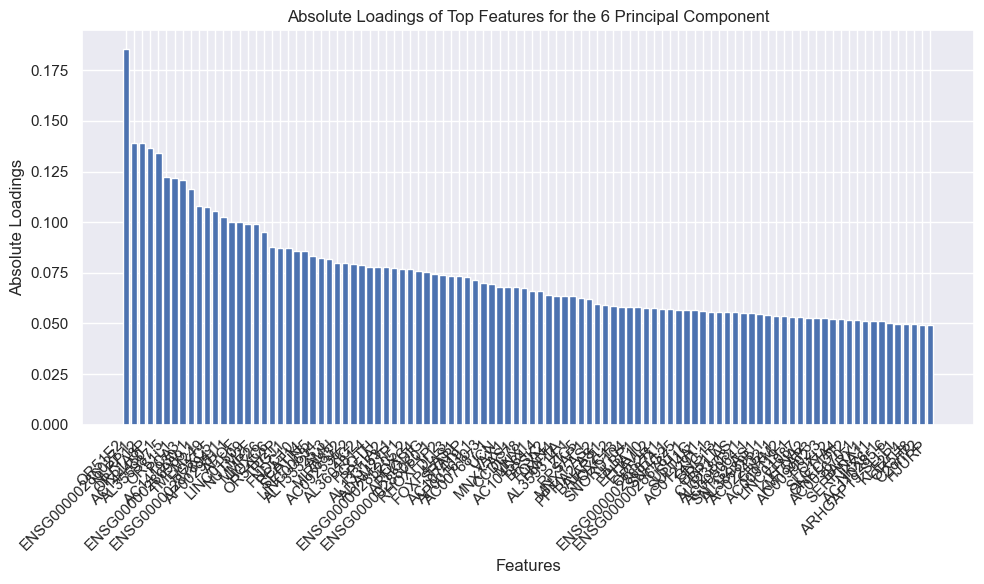

Top Features for the 7 Principal Component:
Index(['FOXP4-AS1', 'AP006748.1', 'AL023803.1', 'AL360181.4',
       'ENSG00000286874.1', 'LINC01509', 'AC140481.3', 'SNORD104',
       'AL662864.1', 'AC007687.1', 'AL359314.1', 'HNF1A', 'SNHG25', 'UCN',
       'AC107419.1', 'AL022324.3', 'ENSG00000287894.1', 'MATK',
       'ENSG00000286767.1', 'MMP26', 'FOXN4', 'SNTG2-AS1', 'AC009119.1',
       'DLX1', 'PHGR1', 'CFAP65', 'ENSG00000287635.1', 'AC009407.1', 'OR52R1',
       'ZIC5', 'HOXC6', 'LINC01087', 'OR51L1', 'KMT5AP3', 'AC012414.5',
       'S100A14', 'HOXC13', 'CHP2', 'ENSG00000286481.1', 'KLK15', 'CLEC18B',
       'KLF2P3', 'ZNF649-AS1', 'FAR2P4', 'ENSG00000283766.1', 'KLF2P4',
       'CYP4F30P', 'IFITM3P9', 'AC005670.1', 'AL133370.1', 'LGALS7B',
       'PLA2G4C-AS1', 'DLX2-DT', 'KLF2P1', 'ENSG00000286058.1', 'PPFIA2',
       'CYP4B1', 'HOXC5', 'FNDC10', 'ENSG00000286592.1', 'ARSF', 'ZIC2',
       'FAR2P1', 'LINC02492', 'UNC5A', 'PCA3', 'OR4K11P', 'AP001610.3',
       'USH1G', 'CYP4F62P'

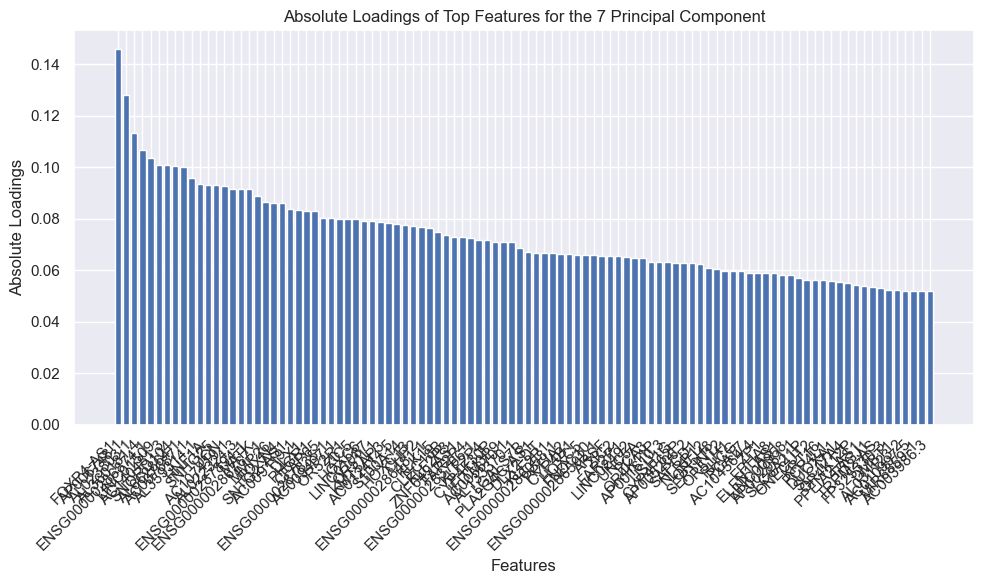

Top Features for the 8 Principal Component:
Index(['AL359314.1', 'PCA3', 'PCAT14', 'AC074141.1', 'AC012414.5', 'KLF2P4',
       'FAR2P4', 'B3GAT1-DT', 'TRGJ1', 'AC140481.3', 'DLX2-DT', 'FAR2P1',
       'ZEB2P1', 'AC011487.1', 'ENSG00000286027.1', 'AC021915.2', 'KLF2P3',
       'KLF2P1', 'BAIAP2L2', 'AL008721.1', 'CYP4F30P', 'IGLVIVOR22-1',
       'AC021818.1', 'ENSG00000286058.1', 'OR4K12P', 'ENSG00000284948.1',
       'HNF1A', 'OR5H8', 'AC010624.4', 'AC104365.1', 'GEMIN8P1', 'CTBP1-AS',
       'PLA2G4C-AS1', 'CYP4F62P', 'MYBL2', 'PCOTH', 'AL133153.1', 'LINC02475',
       'AC005064.1', 'C2orf72', 'AC011523.1', 'LINC01087', 'AL662890.1',
       'CHP2', 'HJURP', 'AC087379.1', 'SLC17A4', 'FOXP4-AS1', 'FABP5P7',
       'RNF2P1', 'OR4K11P', 'COL10A1', 'DLX1', 'ERG', 'FOXI2', 'OR4N3P',
       'LINC01194', 'AL691420.1', 'AC002511.2', 'F2RL2', 'ENSG00000286522.2',
       'PGBD4P8', 'LINC01193', 'CXCR2', 'AL512363.1', 'AL133370.1',
       'AL023803.1', 'LINC01509', 'ACSM1', 'CYP4B1', 'ENSG00000

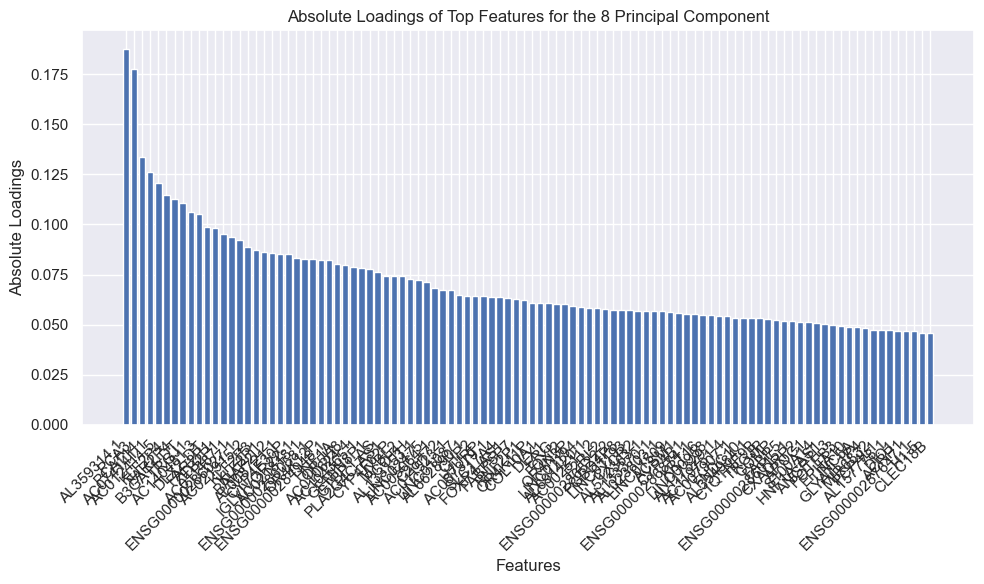

Top Features for the 9 Principal Component:
Index(['ELSPBP1', 'ENSG00000283631.1', 'WFDC10A', 'WFDC13', 'WFDC9', 'SPINT3',
       'DEFB125', 'CRISP1', 'DEFB129', 'WFDC8', 'EDDM3B', 'ADCY8', 'MAT1A',
       'AC024958.1', 'ATP10B', 'REG3G', 'CLPSL1', 'LINC01976', 'AL034397.1',
       'ATP2B3', 'LINC01555', 'AC111000.2', 'MGAM', 'ASTL', 'PRR35',
       'ENSG00000288003.1', 'UCA1', 'TFAP2B', 'PRSS1', 'KRT8P28', 'AC104237.3',
       'DCAF12L1', 'DEFB132', 'UGT2B7', 'AC021146.2', 'LINC01942', 'SFRP5',
       'DNAJB6P2', 'WFDC2', 'AC104237.2', 'AC007993.2', 'AC084759.3', 'MUC15',
       'ENSG00000286124.1', 'SIAH3', 'BRINP2', 'EPPIN', 'AC021146.12', 'ROS1',
       'DUOXA1', 'IL1RL1', 'OVCH2', 'AL359551.1', 'ENSG00000286201.1', 'TNMD',
       'AC034205.2', 'AL139275.2', 'CYP1A2', 'LINC01320', 'CCDC198',
       'AC021146.3', 'PAX2', 'AL355922.4', 'AP001046.1', 'AC007907.1',
       'LINC01819', 'NYX', 'AC092376.1', 'LCN8', 'AL161668.3', 'AL133371.3',
       'CRABP2', 'ENSG00000285972.1', 'OR5H8'

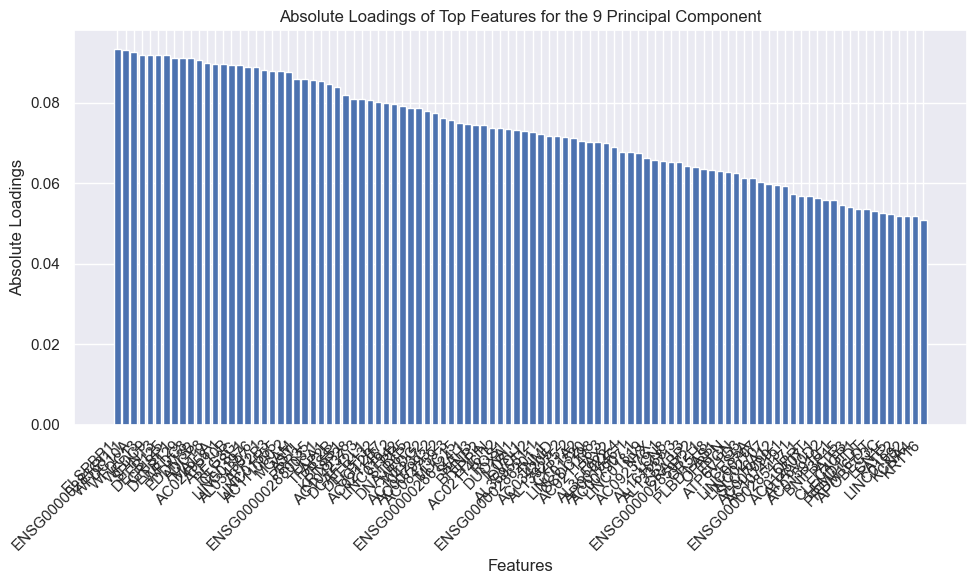

Top Features for the 10 Principal Component:
Index(['PCA3', 'TRGJ1', 'SRARP', 'SIM2', 'ZNF560', 'AC144450.1', 'SNHG4',
       'DLX1', 'AC141930.1', 'ENSG00000287635.1', 'NKX2-3', 'AC020656.2',
       'AC022432.1', 'HPN', 'IGLVIVOR22-1', 'AL603832.2', 'ERVH48-1',
       'AC107419.1', 'AC147067.2', 'FNDC10', 'HJURP', 'SPON2', 'MYBL2',
       'EPHA10', 'ZP1', 'WASF5P', 'OR51E2', 'U3.1', 'WIF1', 'ARHGAP19-SLIT1',
       'AL662864.1', 'KMT5AP3', 'CFAP65', 'KLK15', 'PCAT7', 'TRGJP',
       'LINC01060', 'AL355987.5', 'LINC02492', 'ENSG00000286027.1', 'TRGV9',
       'ENSG00000287407.1', 'AL031123.2', 'UCN', 'DSG4', 'ZNF556',
       'AL008721.1', 'PANX3', 'OTP', 'AC007128.1', 'LINC01019', 'APOC3',
       'PCAT14', 'AL023803.1', 'CST1', 'DLX2-DT', 'PAQR6', 'TDRD1', 'CHRM2',
       'AL133370.1', 'APOA2', 'APOC1', 'COL2A1', 'AC005165.1', 'AL133467.2',
       'AL596442.1', 'AP002981.1', 'SCML2P1', 'VDAC1P13', 'LINC01518', 'SLIT1',
       'SLC6A21P', 'UNC5A', 'KRT73', 'PIGCP2', 'SNORD104', 'ARHGEF3

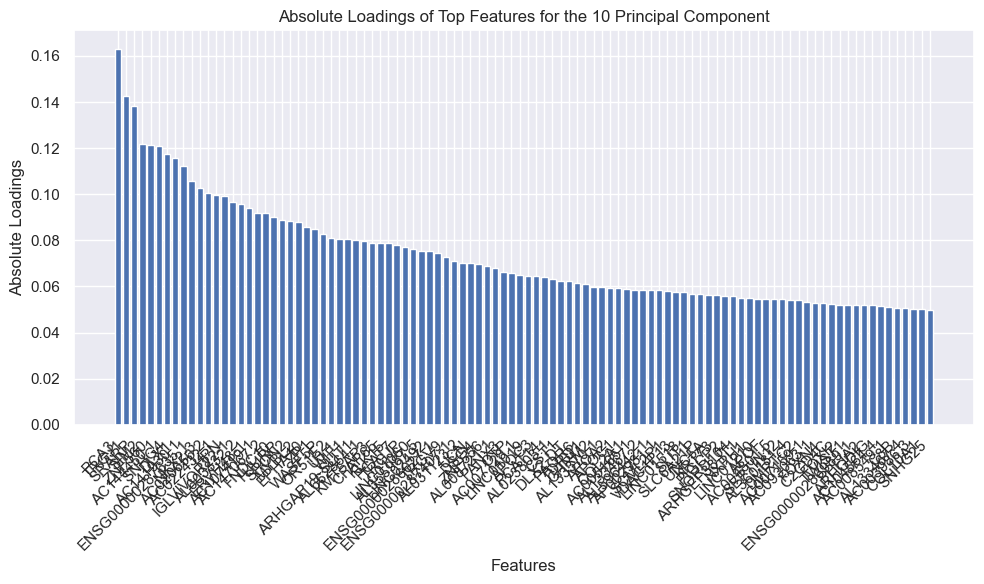


Top Features for Each Principal Component:
{'PC1': ['SIM1', 'HOXB-AS3', 'HOXB8', 'LMO3', 'KCNJ15', 'AC009102.2', 'ANO1', 'DUOXA1', 'HOXB7', 'EMX2OS', 'GNAO1', 'GSTP1', 'LINC02817', 'APOBEC3C', 'PIK3C2G', 'PLBD1-AS1', 'SPATA20P1', 'PNMT', 'MCF2', 'AC106865.1', 'HOXB9', 'DUOX1', 'LINC02086', 'AC100860.1', 'LINC01152', 'KCNS1', 'ACSL6', 'AL358334.2', 'CLU', 'AL354793.1', 'CRABP2', 'VWA5B2', 'ADTRP', 'TRIM9', 'AL354863.1', 'GLIS3', 'SLC39A2', 'AC129507.4', 'TNRC18P1', 'HOXD3', 'ZFHX4-AS1', 'LINC01116', 'EMX2', 'POU3F3', 'TMEM132C', 'AL354824.1', 'ENSG00000286523.1', 'ZNF209P', 'LINC01671', 'HOXB5', 'LINC02137', 'GATA3', 'LINC01139', 'NDRG4', 'CA14', 'SLC34A2', 'SPINK2', 'ENSG00000285012.1', 'KLHL14', 'LINC01182', 'CT75', 'EVA1A', 'CYSLTR2', 'FOXI2', 'CXCR2', 'SNAP25-AS1', 'GATA3-AS1', 'LINC02707', 'AC023158.1', 'GPX6', 'CA3-AS1', 'SERPINA5', 'LINC01159', 'AGXT2', 'AKR1B1', 'PRDM16', 'UNC5B', 'SNAP25', 'KRT24', 'PLA2G4A', 'LINC00336', 'PANTR1', 'LINC02139', 'AL354824.2', 'CHEK1', 'AL356417

In [ ]:
# Dictionary to store the top features for each principal component
top_features_dict = {}

# Loop over the components
for component_num in range(num_components):
    # Get the loadings for the current principal component
    component_loadings = pca.components_[component_num]

    # Get the absolute values of the loadings
    abs_loadings = abs(component_loadings)

    # Sort the absolute loadings in descending order and get the indices
    sorted_indices = abs_loadings.argsort()[::-1]

    # Get the indices of the top features (e.g., top 35 features)
    N = 100
    top_feature_indices = sorted_indices[:N]  # Adjust the number as needed

    # Get the names of the top features
    top_features = df_x.columns[top_feature_indices]

    # Save the top features for the current principal component
    top_features_dict[f'PC{component_num + 1}'] = list(top_features)

    # Print the top features for the current principal component
    print(f"Top Features for the {component_num + 1} Principal Component:")
    print(top_features)

    # Plot the absolute loadings of the top features for the current component
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(top_feature_indices)), abs_loadings[top_feature_indices], align='center')
    plt.xticks(range(len(top_feature_indices)), top_features, rotation=45, ha='right')
    plt.xlabel('Features')
    plt.ylabel('Absolute Loadings')
    plt.title(f'Absolute Loadings of Top Features for the {component_num + 1} Principal Component')
    plt.tight_layout()
    plt.show()

# Print the dictionary containing the top features for each principal component
print("\nTop Features for Each Principal Component:")
print(top_features_dict)


In [ ]:
# access the dictionaries and save the variables to check the 100 most important features for further analyis:
# Accessing the top features separately for each principal component
top_features_pc1 = top_features_dict['PC1']
top_features_pc2 = top_features_dict['PC2']
top_features_pc3 = top_features_dict['PC3']

# Print the top features for each principal component to check
print("Top Features for Principal Component 1:")
print(top_features_pc1)
print("\nTop Features for Principal Component 2:")
print(top_features_pc2)
print("\nTop Features for Principal Component 3:")
print(top_features_pc3)


Top Features for Principal Component 1:
['SIM1', 'HOXB-AS3', 'HOXB8', 'LMO3', 'KCNJ15', 'AC009102.2', 'ANO1', 'DUOXA1', 'HOXB7', 'EMX2OS', 'GNAO1', 'GSTP1', 'LINC02817', 'APOBEC3C', 'PIK3C2G', 'PLBD1-AS1', 'SPATA20P1', 'PNMT', 'MCF2', 'AC106865.1', 'HOXB9', 'DUOX1', 'LINC02086', 'AC100860.1', 'LINC01152', 'KCNS1', 'ACSL6', 'AL358334.2', 'CLU', 'AL354793.1', 'CRABP2', 'VWA5B2', 'ADTRP', 'TRIM9', 'AL354863.1', 'GLIS3', 'SLC39A2', 'AC129507.4', 'TNRC18P1', 'HOXD3', 'ZFHX4-AS1', 'LINC01116', 'EMX2', 'POU3F3', 'TMEM132C', 'AL354824.1', 'ENSG00000286523.1', 'ZNF209P', 'LINC01671', 'HOXB5', 'LINC02137', 'GATA3', 'LINC01139', 'NDRG4', 'CA14', 'SLC34A2', 'SPINK2', 'ENSG00000285012.1', 'KLHL14', 'LINC01182', 'CT75', 'EVA1A', 'CYSLTR2', 'FOXI2', 'CXCR2', 'SNAP25-AS1', 'GATA3-AS1', 'LINC02707', 'AC023158.1', 'GPX6', 'CA3-AS1', 'SERPINA5', 'LINC01159', 'AGXT2', 'AKR1B1', 'PRDM16', 'UNC5B', 'SNAP25', 'KRT24', 'PLA2G4A', 'LINC00336', 'PANTR1', 'LINC02139', 'AL354824.2', 'CHEK1', 'AL356417.1', 'AC0123

# Compare PCA loadings with TOP DE genes or genes identify as beeing important for outcome prediction by the random forest model using Venn diagrams

[94, 0, 0, 42, 3, 19, 3]


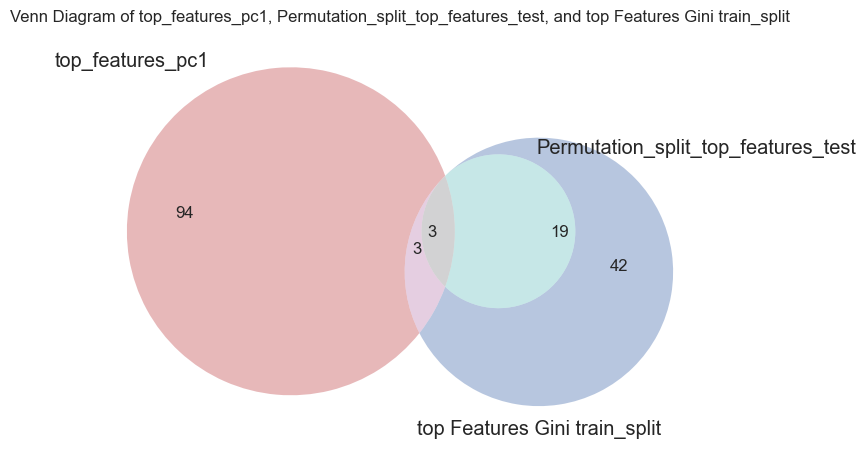

Common genes in all sets: {'KRT24', 'EVA1A', 'DUOXA1'}
Genes in top_features_pc1 and Permutation_split_top_features_test not in top Features Gini train_split: set()
Genes in top_features_pc1 and top Features Gini train_split not in Permutation_split_top_features_test: {'SLC34A2', 'TNRC18P1', 'CYSLTR2'}
Genes in Permutation_split_top_features_test and top Features Gini train_split not in top_features_pc1: {'FAM83C', 'ARHGAP19-SLIT1', 'GAL', 'SAPCD1', 'EPHA10', 'PPP3R2', 'ENPP3', 'AC005064.1', 'AC022558.2', 'PDK4', 'MYBL2', 'AC008759.1', 'JPH4', 'SCGB1A1', 'AC010329.2', 'CCDC27', 'AC087235.2', 'ENSG00000286989.1', 'AC005180.1'}
[90, 0, 0, 40, 5, 17, 5]


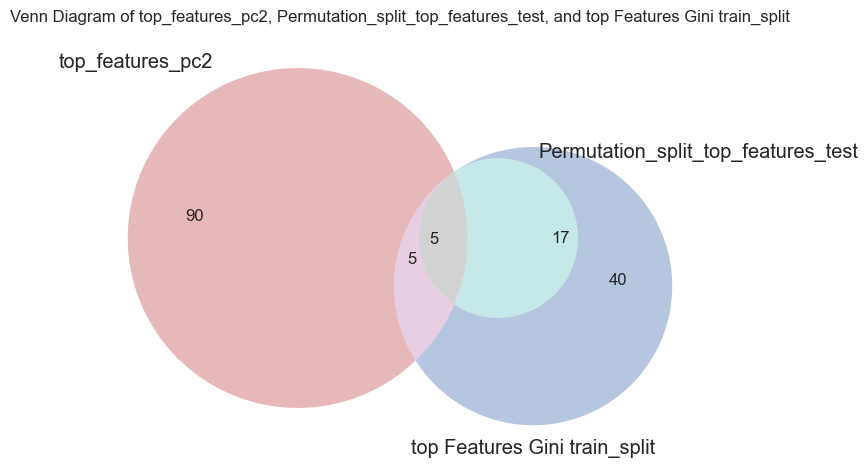

Common genes in all sets: {'CCDC27', 'EPHA10', 'JPH4', 'ENSG00000286989.1', 'AC005180.1'}
Genes in top_features_pc2 and Permutation_split_top_features_test not in top Features Gini train_split: set()
Genes in top_features_pc2 and top Features Gini train_split not in Permutation_split_top_features_test: {'FNDC10', 'FAM83B', 'HOXC6', 'AL512363.1', 'CYP4B1'}
Genes in Permutation_split_top_features_test and top Features Gini train_split not in top_features_pc2: {'FAM83C', 'PDK4', 'ARHGAP19-SLIT1', 'GAL', 'EVA1A', 'PPP3R2', 'MYBL2', 'AC008759.1', 'DUOXA1', 'ENPP3', 'SAPCD1', 'AC087235.2', 'KRT24', 'SCGB1A1', 'AC010329.2', 'AC005064.1', 'AC022558.2'}
[99, 0, 0, 44, 1, 22, 0]


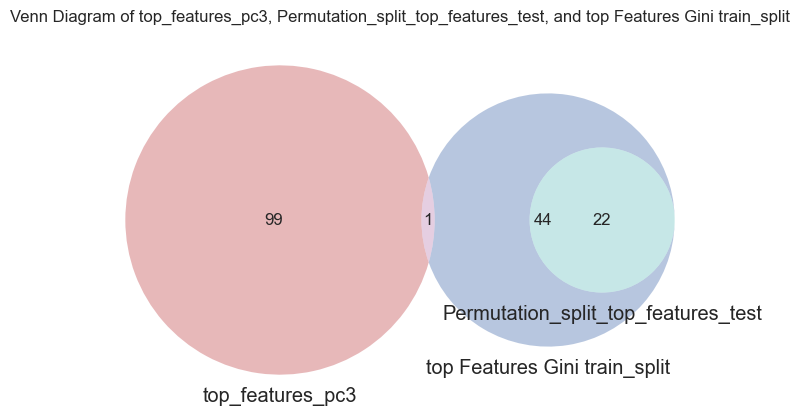

Common genes in all sets: set()
Genes in top_features_pc3 and Permutation_split_top_features_test not in top Features Gini train_split: set()
Genes in top_features_pc3 and top Features Gini train_split not in Permutation_split_top_features_test: {'NKAIN1'}
Genes in Permutation_split_top_features_test and top Features Gini train_split not in top_features_pc3: {'FAM83C', 'ARHGAP19-SLIT1', 'GAL', 'SAPCD1', 'EPHA10', 'KRT24', 'EVA1A', 'PPP3R2', 'DUOXA1', 'ENPP3', 'AC005064.1', 'AC022558.2', 'PDK4', 'MYBL2', 'AC008759.1', 'JPH4', 'SCGB1A1', 'AC010329.2', 'CCDC27', 'AC087235.2', 'ENSG00000286989.1', 'AC005180.1'}
[99, 86, 1, 87, 0, 13, 0]


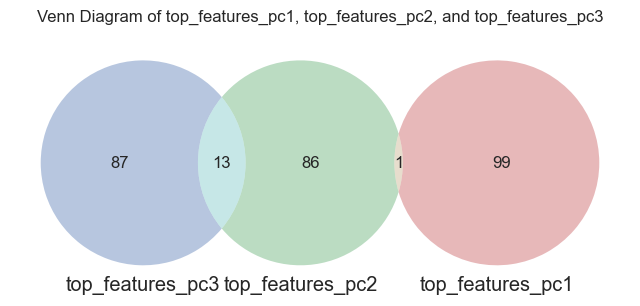

Common genes in all sets: set()
Genes in top_features_pc1 and top_features_pc2 not in top_features_pc3: {'APOBEC3C'}
Genes in top_features_pc1 and top_features_pc3 not in top_features_pc2: set()
Genes in top_features_pc2 and top_features_pc3 not in top_features_pc1: {'AC011487.1', 'AC107419.1', 'AC141930.1', 'AP002981.1', 'OR51L1', 'ERG', 'TRGJ1', 'AL117329.1', 'TRPM2-AS', 'CACNA1D', 'AC084816.1', 'SLC6A21P', 'HOXC5'}
[96, 94, 1, 14, 3, 5, 0]


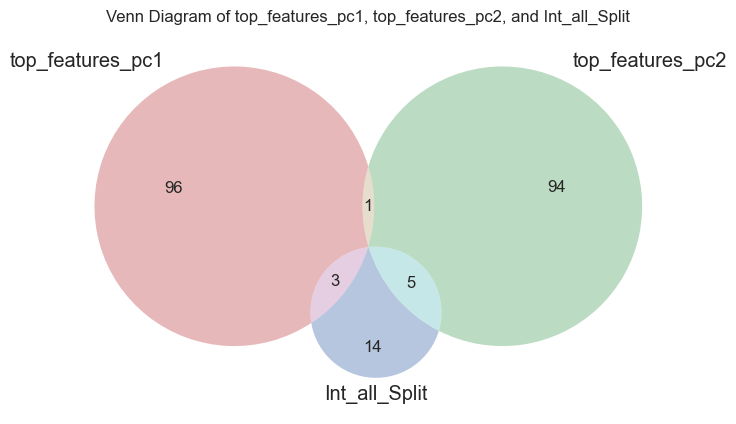

Common genes in all sets: set()
Genes in top_features_pc1 and top_features_pc2 not in Int_all_Split: {'APOBEC3C'}
Genes in top_features_pc1 and Int_all_Split not in top_features_pc2: {'KRT24', 'EVA1A', 'DUOXA1'}
Genes in top_features_pc2 and Int_all_Split not in top_features_pc1: {'CCDC27', 'EPHA10', 'JPH4', 'ENSG00000286989.1', 'AC005180.1'}
[93, 89, 1, 51, 6, 10, 0]


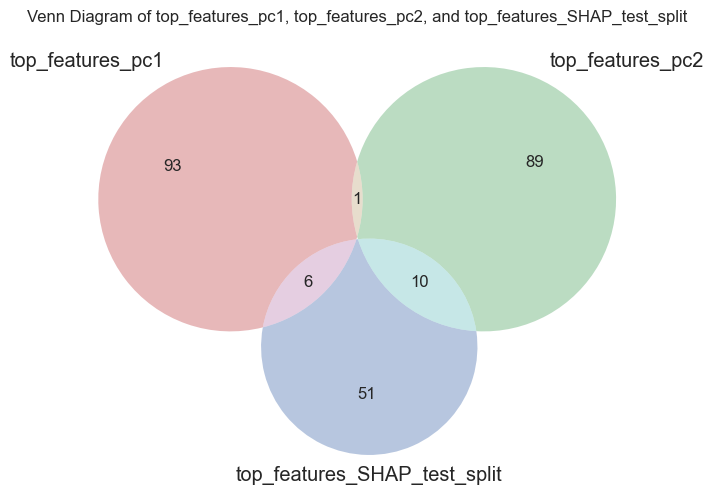

Common genes in all sets: set()
Genes in top_features_pc1 and top_features_pc2 not in top_features_SHAP_test_split: {'APOBEC3C'}
Genes in top_features_pc1 and top_features_SHAP_test_split not in top_features_pc2: {'TNRC18P1', 'EVA1A', 'DUOXA1', 'CYSLTR2', 'SLC34A2', 'KRT24'}
Genes in top_features_pc2 and top_features_SHAP_test_split not in top_features_pc1: {'FNDC10', 'CCDC27', 'FAM83B', 'HOXC6', 'EPHA10', 'AL512363.1', 'JPH4', 'CYP4B1', 'ENSG00000286989.1', 'AC005180.1'}
[75, 100, 0, 75, 25, 0, 0]


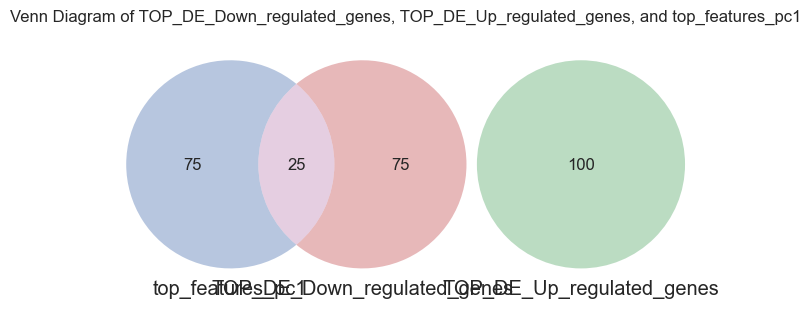

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in top_features_pc1: set()
Genes in TOP_DE_Down_regulated_genes and top_features_pc1 not in TOP_DE_Up_regulated_genes: {'HOXB8', 'EMX2', 'LINC01159', 'AC012123.1', 'LINC01182', 'SIM1', 'KRT24', 'AL354793.1', 'ENSG00000285012.1', 'PNMT', 'PIK3C2G', 'LINC02137', 'AC012307.1', 'WNT9B', 'MCF2', 'LINC02707', 'EMX2OS', 'SEMG1', 'ENSG00000286523.1', 'ACSL6', 'PANTR1', 'HOXB-AS3', 'POU3F3', 'SERPINA5', 'SPINK2'}
Genes in TOP_DE_Up_regulated_genes and top_features_pc1 not in TOP_DE_Down_regulated_genes: set()
[100, 95, 0, 95, 0, 5, 0]


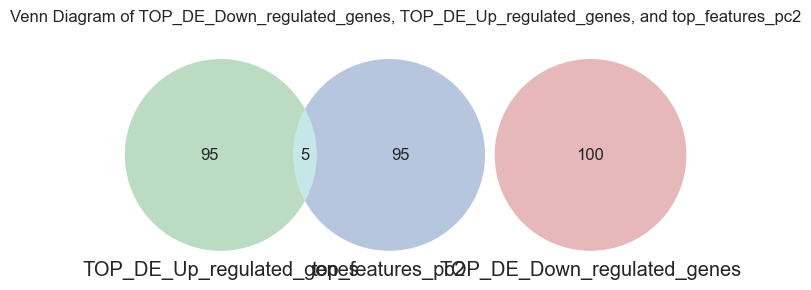

Common genes in all sets: set()
Genes in TOP_DE_Down_regulated_genes and TOP_DE_Up_regulated_genes not in top_features_pc2: set()
Genes in TOP_DE_Down_regulated_genes and top_features_pc2 not in TOP_DE_Up_regulated_genes: set()
Genes in TOP_DE_Up_regulated_genes and top_features_pc2 not in TOP_DE_Down_regulated_genes: {'AL359314.1', 'NKX2-3', 'AC107419.1', 'AL133325.3', 'OR51L1'}


set()

In [ ]:
# compare venn diagrams with top features calculated for test set, etc by random forest will all features:
venn_diagrams(top_features_pc1, Permutation_split_top_features_test, Gini_split_top_features_train,
      label1='top_features_pc1', label2='Permutation_split_top_features_test', label3='top Features Gini train_split')

venn_diagrams(top_features_pc2, Permutation_split_top_features_test, Gini_split_top_features_train,
      label1='top_features_pc2', label2='Permutation_split_top_features_test', label3='top Features Gini train_split')

venn_diagrams(top_features_pc3, Permutation_split_top_features_test, Gini_split_top_features_train,
      label1='top_features_pc3', label2='Permutation_split_top_features_test', label3='top Features Gini train_split')

venn_diagrams(top_features_pc1, top_features_pc2, top_features_pc3,
      label1='top_features_pc1', label2='top_features_pc2', label3='top_features_pc3')

venn_diagrams(top_features_pc1, top_features_pc2, Int_all_Split ,
      label1='top_features_pc1', label2='top_features_pc2', label3='Int_all_Split')

venn_diagrams(top_features_pc1, top_features_pc2, top_features_SHAP_test_split ,
      label1='top_features_pc1', label2='top_features_pc2', label3='top_features_SHAP_test_split')

venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes,top_features_pc1,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='top_features_pc1')

venn_diagrams(TOP_DE_Down_regulated_genes,TOP_DE_Up_regulated_genes,top_features_pc2,
      label1='TOP_DE_Down_regulated_genes', label2='TOP_DE_Up_regulated_genes', label3='top_features_pc2')


# 3D Visualization of the PCs

In [ ]:
# Fit PCA and transform the normalized data
principal_components = pca.fit_transform(df_x_norm)
print(principal_components)

# Create a DataFrame to store the principal components
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])
print(principal_df)




[[-2.37721882e-01 -3.63181433e-01  5.45282806e-01 ... -1.30701327e-01
  -9.48602859e-02 -5.28655714e-03]
 [-6.70558104e-01  8.73884213e-01  1.03250671e+00 ... -1.79720888e+00
  -4.35037019e-01  8.84700067e-02]
 [-9.16375036e-01  1.23169454e+00 -9.48245181e-01 ... -3.00219277e-01
  -6.81656932e-02  1.97801099e-01]
 ...
 [ 6.94113705e-01 -1.64154263e+00 -1.64756559e-01 ... -1.50211952e-01
  -1.48529166e-01  1.33882611e-01]
 [ 1.14075065e+01  2.76282026e+00 -5.19508155e-01 ...  6.92845065e-01
  -1.47315117e+00  2.36684133e-01]
 [ 1.03361479e+01  2.14616452e+00 -3.80725520e-01 ...  4.28513429e-02
   1.61663038e-01 -1.23912508e-01]]
           PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0    -0.237722 -0.363181  0.545283 -0.330913 -0.276695 -0.522900  0.087289   
1    -0.670558  0.873884  1.032507 -0.777936 -0.379954  0.719694 -0.963472   
2    -0.916375  1.231695 -0.948245  1.039005 -0.216934  0.325751  0.000403   
3    -0.500465  1.012390  0.392410 -0.556670 -0.0210

In [ ]:
principal_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.237722,-0.363181,0.545283,-0.330913,-0.276695,-0.522900,0.087289,-0.130701,-0.094860,-0.005287
1,-0.670558,0.873884,1.032507,-0.777936,-0.379954,0.719694,-0.963472,-1.797209,-0.435037,0.088470
2,-0.916375,1.231695,-0.948245,1.039005,-0.216934,0.325751,0.000403,-0.300219,-0.068166,0.197801
3,-0.500465,1.012390,0.392410,-0.556670,-0.021099,1.394452,-0.377347,1.251099,0.609135,0.849904
4,-0.152473,-0.339142,-0.477628,0.179909,0.339814,-0.315895,-0.197041,0.262397,0.079613,-0.180072
...,...,...,...,...,...,...,...,...,...,...
351,9.445247,1.324793,-0.107127,-0.050764,-0.941120,-0.021358,-0.402288,0.236483,-0.735436,0.098861
352,0.360315,-1.558539,0.025084,-0.004913,0.068497,-0.149755,-0.090696,0.114306,0.010571,-0.021114
353,0.694114,-1.641543,-0.164757,0.003753,0.916387,0.177739,0.250608,-0.150212,-0.148529,0.133883
354,11.407507,2.762820,-0.519508,-0.534242,-0.370685,-0.600742,-0.722489,0.692845,-1.473151,0.236684


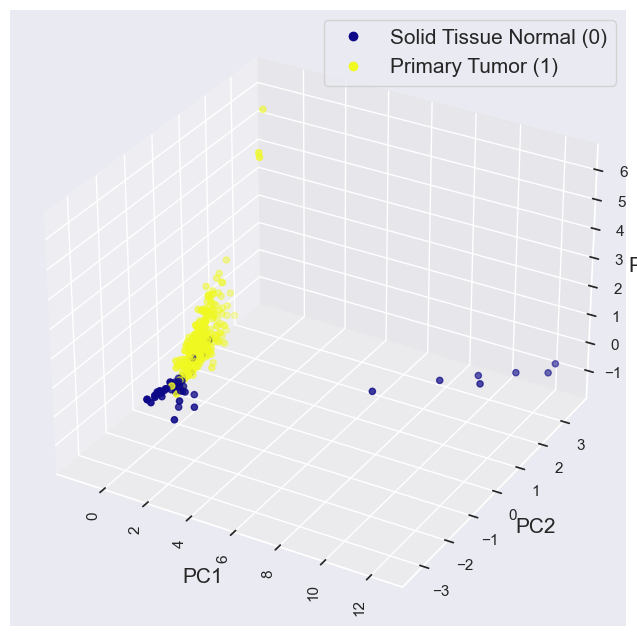

In [ ]:
#%matplotlib notebook (unclick to make plot interactive)

# Create a new figure and set it up for 3D projection
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points in 3D
scatter = ax.scatter(principal_df['PC1'], principal_df['PC2'], principal_df['PC3'], c=df['Condition'], cmap='plasma')
ax.set_xlabel('PC1',fontsize=15)
ax.set_ylabel('PC2',fontsize=15)
ax.set_zlabel('PC3',fontsize=15)
plt.legend(handles=scatter.legend_elements()[0], labels=['Solid Tissue Normal (0)', 'Primary Tumor (1)'],fontsize=15)
plt.xticks(rotation = 90)

# Show the plot
plt.show()


In [ ]:
# Create a plot where one can see which point correspond to which sample 

# Create the figure
fig = go.Figure()

# Add a 3D scatter plot
fig.add_trace(go.Scatter3d(
    x=principal_df['PC1'],
    y=principal_df['PC2'],
    z=principal_df['PC3'],
    mode='markers',
    marker=dict(
        size=8,
        color=df['Condition'],  # Color by condition
        colorscale='plasma',   # Choose a colorscale
        opacity=0.8
    ),
    text=df.index,  # Sample names for hover text
    hoverinfo='text'
))

# Update layout
fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
    ),
    legend=dict(
        title='Condition',
        traceorder='normal',
        font=dict(
            size=12,
        ),
    ),
    title='Interactive 3D Scatter Plot with Plotly',
    width=800,  # Adjust width
    height=600   # Adjust height
)

# Show the plot
fig.show()


In [ ]:
df['Condition']

unstranded_2fa8c89c-893e-465a-aeb5-e3fb81a200c7.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_288d2dc8-9fb3-4164-8e6a-cee107d11404.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_7b97885a-f365-4f11-8f35-9bf17a7344b5.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_e32fc401-5ddd-4dfc-8be4-8d4072a080c3.rna_seq.augmented_star_gene_counts.tsv    1
unstranded_16eca87b-206a-4c2d-8ab7-f8c2fdb51b0e.rna_seq.augmented_star_gene_counts.tsv    1
                                                                                         ..
unstranded_422d5778-bfe0-4e2f-b254-2a753c777686.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_60028d9d-c8e5-4c4e-a75c-cc3df6f2eea1.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_2c022016-756e-4cbf-9baa-dab196b6e715.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_998581d3-8fdc-4f4a-92cd-d98fc0f910bc.rna_seq.augmented_star_gene_counts.tsv    0
unstranded_9975ae8f-09f2-4343-9281-cbe13c775dca.rna_seq.augmented_star_gene_coun

In [ ]:
principal_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.237722,-0.363181,0.545283,-0.330913,-0.276695,-0.522900,0.087289,-0.130701,-0.094860,-0.005287
1,-0.670558,0.873884,1.032507,-0.777936,-0.379954,0.719694,-0.963472,-1.797209,-0.435037,0.088470
2,-0.916375,1.231695,-0.948245,1.039005,-0.216934,0.325751,0.000403,-0.300219,-0.068166,0.197801
3,-0.500465,1.012390,0.392410,-0.556670,-0.021099,1.394452,-0.377347,1.251099,0.609135,0.849904
4,-0.152473,-0.339142,-0.477628,0.179909,0.339814,-0.315895,-0.197041,0.262397,0.079613,-0.180072
...,...,...,...,...,...,...,...,...,...,...
351,9.445247,1.324793,-0.107127,-0.050764,-0.941120,-0.021358,-0.402288,0.236483,-0.735436,0.098861
352,0.360315,-1.558539,0.025084,-0.004913,0.068497,-0.149755,-0.090696,0.114306,0.010571,-0.021114
353,0.694114,-1.641543,-0.164757,0.003753,0.916387,0.177739,0.250608,-0.150212,-0.148529,0.133883
354,11.407507,2.762820,-0.519508,-0.534242,-0.370685,-0.600742,-0.722489,0.692845,-1.473151,0.236684


# Preparation of PC data for ML

In [ ]:
# Prepare PCA components for ML and use code above to run the random forest and cross-validation with random forest

# Reset the index if one of the DataFrames has its index set before concatenating
df.reset_index(drop=True, inplace=True)
principal_df.reset_index(drop=True, inplace=True)

# Display the merged DataFrame

df_PCA = pd.concat([principal_df, df['Condition']], axis=1)
df_PCA

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,Condition
0,-0.237722,-0.363181,0.545283,-0.330913,-0.276695,-0.522900,0.087289,-0.130701,-0.094860,-0.005287,1
1,-0.670558,0.873884,1.032507,-0.777936,-0.379954,0.719694,-0.963472,-1.797209,-0.435037,0.088470,1
2,-0.916375,1.231695,-0.948245,1.039005,-0.216934,0.325751,0.000403,-0.300219,-0.068166,0.197801,1
3,-0.500465,1.012390,0.392410,-0.556670,-0.021099,1.394452,-0.377347,1.251099,0.609135,0.849904,1
4,-0.152473,-0.339142,-0.477628,0.179909,0.339814,-0.315895,-0.197041,0.262397,0.079613,-0.180072,1
...,...,...,...,...,...,...,...,...,...,...,...
351,9.445247,1.324793,-0.107127,-0.050764,-0.941120,-0.021358,-0.402288,0.236483,-0.735436,0.098861,0
352,0.360315,-1.558539,0.025084,-0.004913,0.068497,-0.149755,-0.090696,0.114306,0.010571,-0.021114,0
353,0.694114,-1.641543,-0.164757,0.003753,0.916387,0.177739,0.250608,-0.150212,-0.148529,0.133883,0
354,11.407507,2.762820,-0.519508,-0.534242,-0.370685,-0.600742,-0.722489,0.692845,-1.473151,0.236684,0


In [ ]:
# choose the principal components to use in the random forest 

#Components = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8']
#Components = ['PC1', 'PC2','PC3','PC4','PC5']
#Components =['PC1', 'PC2','PC3']
#Components =['PC1', 'PC2','PC3','PC4']
Components = ['PC1', 'PC2']
x_PCA = df_PCA[Components]  # Use the principal components as features
scaler = MinMaxScaler()

x_PCA = scaler.fit_transform(x_PCA)

y_PCA = df_PCA['Condition']  # Use the outcome variable
# transform to np arrays
print(y_PCA)
y_PCA= y_PCA.to_numpy().astype(np.float32)
#print(y_PCA)
#print(df)

0      1
1      1
2      1
3      1
4      1
      ..
351    0
352    0
353    0
354    0
355    0
Name: Condition, Length: 356, dtype: int64


# Logistic regression

In [ ]:
# Use this code to scale the features if needed:
#Note: scaling gave worst performance
# chose a scaler:
# normalization to values between 0 and 1
#scaler = MinMaxScaler()

# normalization with 0 as center
#scaler = StandardScaler()

# normalize x if requiered
#x_train = scaler.fit_transform(x_train)
#print(x)

# normalize x_val for final test of the model if data was keep unseen
#x_val = scaler.fit_transform(x_val)


Training time: 0.0s in 1 iterations
Training score: 0.867 in 1 iterations
Test score: 0.906 in 1 iterations

Training time: 0.0s in 2 iterations
Training score: 0.867 in 2 iterations
Test score: 0.906 in 2 iterations

Training time: 0.0s in 3 iterations
Training score: 0.887 in 3 iterations
Test score: 0.922 in 3 iterations

Training time: 0.0s in 4 iterations
Training score: 0.910 in 4 iterations
Test score: 0.953 in 4 iterations

Training time: 0.0s in 5 iterations
Training score: 0.922 in 5 iterations
Test score: 0.969 in 5 iterations

Training time: 0.0s in 6 iterations
Training score: 0.938 in 6 iterations
Test score: 0.984 in 6 iterations

Training time: 0.0s in 7 iterations
Training score: 0.941 in 7 iterations
Test score: 0.969 in 7 iterations

Training time: 0.0s in 8 iterations
Training score: 0.938 in 8 iterations
Test score: 0.969 in 8 iterations

Training time: 0.0s in 9 iterations
Training score: 0.938 in 9 iterations
Test score: 0.969 in 9 iterations

Training time: 0.0


Training time: 0.3s in 49 iterations
Training score: 1.000 in 49 iterations
Test score: 0.969 in 49 iterations

Training time: 0.3s in 50 iterations
Training score: 1.000 in 50 iterations
Test score: 0.953 in 50 iterations

Training time: 0.3s in 51 iterations
Training score: 1.000 in 51 iterations
Test score: 0.953 in 51 iterations

Training time: 0.3s in 52 iterations
Training score: 1.000 in 52 iterations
Test score: 0.953 in 52 iterations

Training time: 0.3s in 53 iterations
Training score: 1.000 in 53 iterations
Test score: 0.953 in 53 iterations

Training time: 0.3s in 54 iterations
Training score: 1.000 in 54 iterations
Test score: 0.953 in 54 iterations

Training time: 0.3s in 55 iterations
Training score: 1.000 in 55 iterations
Test score: 0.953 in 55 iterations

Training time: 0.3s in 56 iterations
Training score: 1.000 in 56 iterations
Test score: 0.953 in 56 iterations

Training time: 0.3s in 57 iterations
Training score: 1.000 in 57 iterations
Test score: 0.953 in 57 ite

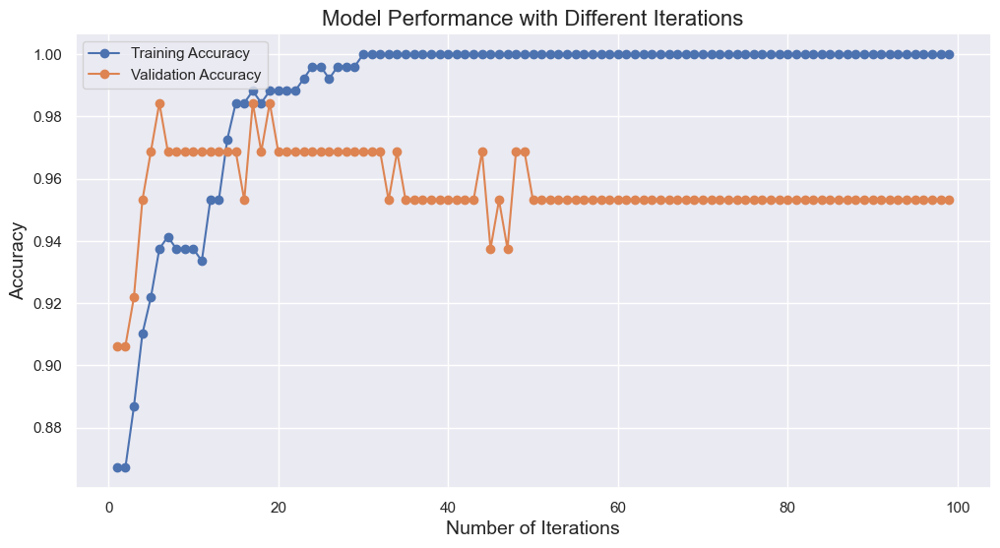

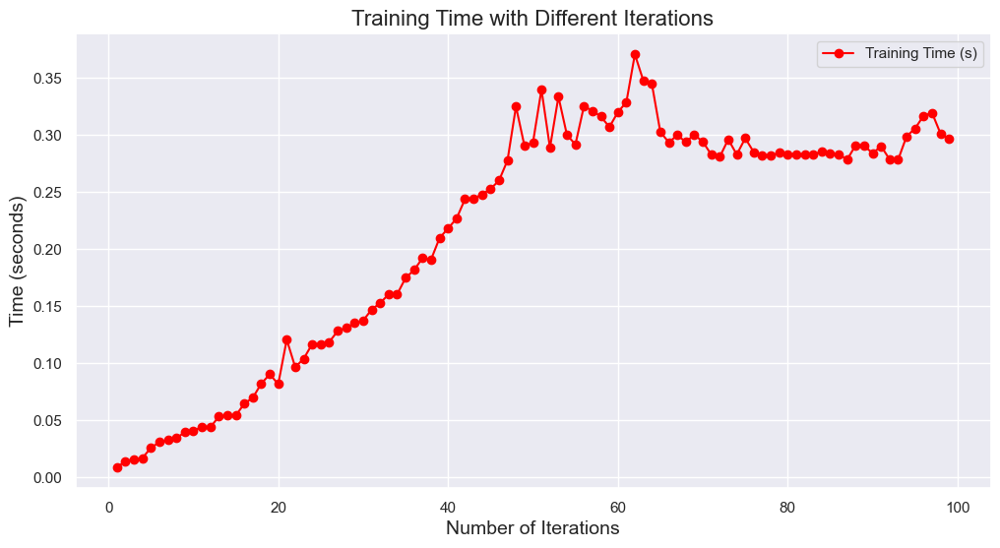

In [ ]:

# Lists to store results
iterations = range(1,100)
train_scores = []
test_scores = []
times = []

# Loop through different values of max_iter
for n_iter in iterations:
    # Initialize the logistic regression model
    clf = linear_model.LogisticRegression(solver='liblinear', max_iter=n_iter, multi_class='ovr')

    # Fit the model and time the fitting process
    t1 = timer()

    # Catch convergence warnings
    with warnings.catch_warnings(record=True) as w:
        warnings.simplefilter('always', ConvergenceWarning)
        clf.fit(x_train, y_train)
        t2 = timer()
        print("")
        print(f'Training time: {t2 - t1:.1f}s in {n_iter} iterations')
        times.append(t2 - t1)

        # Check if a convergence warning was raised
        if any(issubclass(warning.category, ConvergenceWarning) for warning in w):
            print(f'ConvergenceWarning: Model did not converge in {n_iter} iterations')

    # Make predictions
    y_train_pred = clf.predict(x_train)
    y_test_pred = clf.predict(x_test)

    # Evaluate accuracy on the training dataset
    train_score = np.mean(y_train_pred == y_train)
    train_scores.append(train_score)
    print(f"Training score: {train_score:.3f} in {n_iter} iterations")

    # Evaluate accuracy on the test dataset
    test_score = np.mean(y_test_pred == y_test)
    test_scores.append(test_score)
    print(f"Test score: {test_score:.3f} in {n_iter} iterations")

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(iterations, train_scores, label='Training Accuracy', marker='o')
plt.plot(iterations, test_scores, label='Validation Accuracy', marker='o')
plt.xlabel('Number of Iterations', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Model Performance with Different Iterations', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()

# Optionally, plot training times
plt.figure(figsize=(12, 6))
plt.plot(iterations, times, label='Training Time (s)', marker='o', color='red')
plt.xlabel('Number of Iterations', fontsize=14)
plt.ylabel('Time (seconds)', fontsize=14)
plt.title('Training Time with Different Iterations', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
#Predict probabilities for the test set
probabilities = clf.predict_proba(x_test)
print(f"Predicted probabilities: {probabilities}")

Predicted probabilities: [[8.25493916e-001 1.74506084e-001]
 [0.00000000e+000 1.00000000e+000]
 [3.28626015e-014 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [1.00000000e+000 2.25886109e-019]
 [0.00000000e+000 1.00000000e+000]
 [1.04849887e-006 9.99998952e-001]
 [0.00000000e+000 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [4.67981209e-012 1.00000000e+000]
 [6.59472477e-014 1.00000000e+000]
 [1.57545088e-010 1.00000000e+000]
 [1.90958360e-014 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [9.21496213e-011 1.00000000e+000]
 [1.84519067e-013 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [7.74935671e-014 1.00000000e+000]
 [3.10862447e-015 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [5.77315973e-015 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [2.54984700e-010 1.00000000e+000]
 [0.00000000e+000 1.00000000e+000]
 [8.97192608e-002 9.10280739e-

Note: scaling the features lead to worst performance

              precision    recall  f1-score   support

         0.0       0.88      0.78      0.82         9
         1.0       0.96      0.98      0.97        55

    accuracy                           0.95        64
   macro avg       0.92      0.88      0.90        64
weighted avg       0.95      0.95      0.95        64



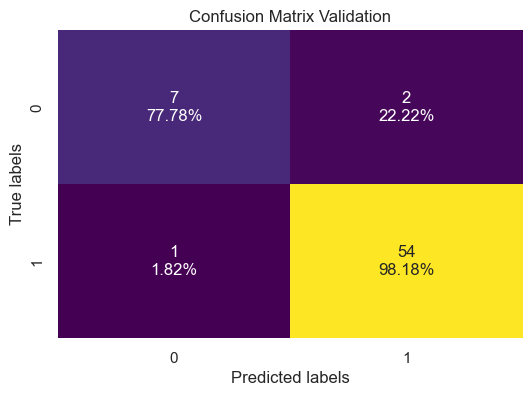

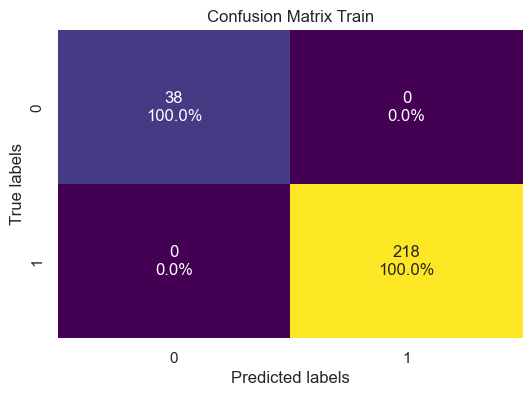

In [ ]:
# Evaluate the confusion matrix on the validation and train sets

# select the first itineration where the model converged

#n_iter = 35 # for split 2 data
n_iter = 52 # for split 3 data


y_pred_test = clf.predict(x_test)
#y_pred_test_proba= clf.predict_proba(x_test)
#np.sum(_pred_test_proba[0])
sklearn.metrics.confusion_matrix(y_test, y_pred_test, labels=None, sample_weight=None, normalize=None)
y_pred_train=clf.predict(x_train)
sklearn.metrics.confusion_matrix(y_train,y_pred_train)


# Calculate the confusion matrixes
confusion_test = confusion_matrix(y_test, y_pred_test)

confusion_train = confusion_matrix(y_train, y_pred_train)


print(classification_report(y_test, y_pred_test))


# Display the confusion matrix with values and percentages
cm_sum = np.sum(confusion_test, axis=1, keepdims=True)
cm_percentages = confusion_test / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
    confusion_test,
    annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(confusion_test.flatten(), cm_with_percentages.flatten())]).reshape(confusion_test.shape),
    fmt='',
    cmap='viridis',
    cbar=False
)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Validation')
plt.show()


cm_sum = np.sum(confusion_train, axis=1, keepdims=True)
cm_percentages = confusion_train / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

# Display the confusion matrix with values and percentages
plt.figure(figsize=(6, 4))
sns.heatmap(
    confusion_train,
    annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(confusion_train.flatten(), cm_with_percentages.flatten())]).reshape(confusion_train.shape),
    fmt='',
    cmap='viridis',
    cbar=False
)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Train')
plt.show()


Classification Report (Entire Dataset):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        47
         1.0       1.00      1.00      1.00       273

    accuracy                           1.00       320
   macro avg       1.00      1.00      1.00       320
weighted avg       1.00      1.00      1.00       320


Confusion Matrix (Entire Dataset):


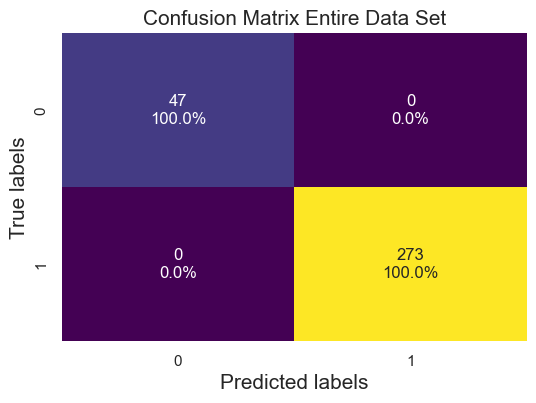


Classification Report Test( Kept unseen data):
              precision    recall  f1-score   support

         0.0       0.75      0.60      0.67         5
         1.0       0.94      0.97      0.95        31

    accuracy                           0.92        36
   macro avg       0.84      0.78      0.81        36
weighted avg       0.91      0.92      0.91        36



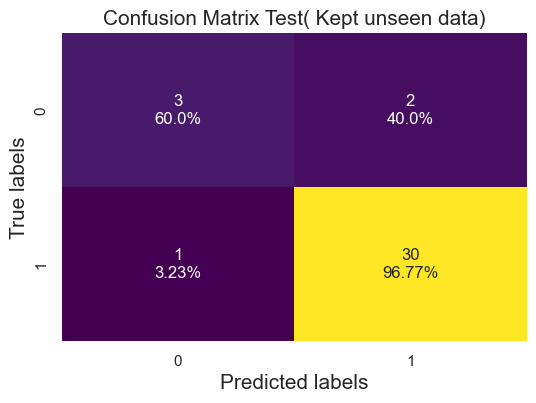

In [ ]:
# Final evaluation if data was split in 3 sets:

# RUN THIS CODE FOR EVALUATION of the models IF DATA WAS SPLIT BEFORE:


# fit to the whole data set (validation plus training) and then make final testing in the keep anseen test (called x_val, y_val)


clf.fit(x, y)

# Get predictions for the entire dataset for all features




y_pred = clf.predict(x)

# Print classification report and confusion matrix for the entire dataset
print("\nClassification Report (Entire Dataset):")
print(classification_report(y, y_pred))

print("\nConfusion Matrix (Entire Dataset):")
cm = confusion_matrix(y, y_pred)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Entire Data Set',fontsize=15)
plt.show()

# evaluate the evaluation set (keep unseen)

y_pred_val = clf.predict(x_val)
print("\nClassification Report Test( Kept unseen data):")
print(classification_report(y_val,y_pred_val))


#print("Confusion Matrix validations set:")
cm = confusion_matrix(y_val, y_pred_val)

# Display the confusion matrix with values and percentages
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_percentages = cm / cm_sum.astype(float) * 100
cm_with_percentages = np.round(cm_percentages, 2)

plt.figure(figsize=(6, 4))
sns.heatmap(
cm,
annot=np.array([f'{v1}\n{v2}%' for v1, v2 in zip(cm.flatten(), cm_with_percentages.flatten())]).reshape(cm.shape),
fmt='',
cmap='viridis',
cbar=False)

plt.xlabel('Predicted labels',fontsize=15)
plt.ylabel('True labels',fontsize=15)
plt.title('Confusion Matrix Test( Kept unseen data)',fontsize=15)
plt.show()





In [ ]:
# check best hyperparamethers for logistic regression through cross-validation:

# Store mean CV scores for each combination
mean_scores = []

best_score = -1
best_params = {}

n_iter_range = [2,10,20,50,100,200,500,1000,10000, 100000]

for n_iter in n_iter_range:
    # Initialize the logistic regression model
    clf = linear_model.LogisticRegression(solver='liblinear', max_iter=n_iter, multi_class='ovr')

    # Define the cross-validation strategy
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Perform cross-validation
    cv_scores = cross_val_score(clf, x, y, cv=cv, scoring='accuracy')
    mean_score = np.mean(cv_scores)
    mean_scores.append(mean_score)


     # Check if current parameters yield a better score
    if mean_score > best_score:
        best_score = mean_score
        best_params['max_iter'] = n_iter


# Print and save the best parameters and score
print("Best Parameters:", best_params)
print("Best Mean CV Score:", best_score)
print(mean_scores)


/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/paula/opt/anaconda3/envs/Env-Dep-

Best Parameters: {'max_iter': 10}
Best Mean CV Score: 0.915625
[0.875, 0.915625, 0.909375, 0.90625, 0.90625, 0.903125, 0.903125, 0.903125, 0.903125, 0.903125]


In [ ]:

# check best parameters through cross-validation:

# Store mean CV scores for each combination
mean_scores = []

best_score = -1
best_params = {}

n_iter_range = [2, 10, 20, 50, 100, 200, 500, 1000, 10000, 100000,100000000]

for n_iter in n_iter_range:
    # Initialize the logistic regression model
    clf = linear_model.LogisticRegression(solver='liblinear', max_iter=n_iter, multi_class='ovr')

    # Define the cross-validation strategy
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Perform cross-validation
    with warnings.catch_warnings():  # Suppress ConvergenceWarning
        warnings.filterwarnings('ignore', category=Warning)
        cv_scores = cross_val_score(clf, x, y, cv=cv, scoring='accuracy')

    mean_score = np.mean(cv_scores)
    mean_scores.append(mean_score)

    # Check if current parameters yield a better score
    if mean_score > best_score:
        best_score = mean_score
        best_params['max_iter'] = n_iter

    # Print a warning if the model did not converge
    if not hasattr(clf, 'converged_') or not clf.converged_:
        print(f"Warning: Model did not converge with max_iter={n_iter}. Consider increasing max_iter.")

# Print and save the best parameters and score
print("Best Parameters:", best_params)
print("Best Mean CV Score:", best_score)
print(mean_scores)


Best Parameters: {'max_iter': 10}
Best Mean CV Score: 0.915625
[0.875, 0.915625, 0.909375, 0.90625, 0.90625, 0.903125, 0.903125, 0.903125, 0.903125, 0.903125, 0.903125]


In [ ]:
print (f' n_inter_range: {n_iter_range}')
print (f'mean_scores: {mean_scores}')

 n_inter_range: [2, 10, 20, 50, 100, 200, 500, 1000, 10000, 100000]
mean_scores: [0.875, 0.915625, 0.909375, 0.90625, 0.90625, 0.903125, 0.903125, 0.903125, 0.903125, 0.903125]


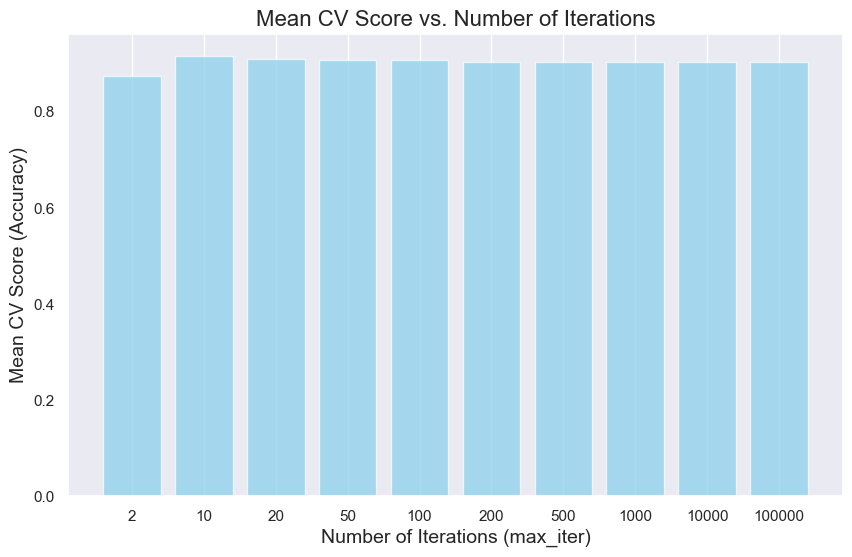

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))

# Change color and increase bar width
bars = plt.bar(range(len(n_iter_range)), mean_scores, color='skyblue', alpha=0.7, width=0.8)

# Set the x-axis ticks to the specified iterations
plt.xticks(range(len(n_iter_range)), n_iter_range)

# Add labels and title
plt.xlabel('Number of Iterations (max_iter)', fontsize=14)
plt.ylabel('Mean CV Score (Accuracy)', fontsize=14)
plt.title('Mean CV Score vs. Number of Iterations', fontsize=16)

# Add grid
plt.grid(axis='y')

# Show the plot
plt.show()


In [ ]:
# note the model did not converge using cross validation and stratifiedKfolds?

# Get information on articles publish for the selected genes by fetching data from PubMed and Euro PMC


In [ ]:
# get information and titles of publications for specific genes from PubMed using Bio import Entrez, example for one gene

# Set the email address
Entrez.email = "paulavazq@gmail.com"

# Define the search query
search_query = '"cancer"[Title/Abstract] AND "SPON2"'

try:
    # Search PubMed using the query
    handle = Entrez.esearch(db="pubmed", term=search_query, retmax=10)  # Change retmax as needed
    record = Entrez.read(handle)

    # Get the list of PubMed IDs
    pubmed_ids = record["IdList"]

    # Fetch and print the article details
    for pubmed_id in pubmed_ids:
        article_handle = Entrez.efetch(db="pubmed", id=pubmed_id, rettype="medline", retmode="text")
        article_record = article_handle.read()

        # Extract article details (title, journal info, and abstract)
        title = re.search(r'TI\s*-\s*(.*?)\n', article_record).group(1)
        journal_info = re.search(r'JT\s*-\s*(.*?)\n', article_record).group(1)
        abstract_match = re.search(r'AB\s*-\s*(.*?)\n', article_record, re.DOTALL)
        abstract = abstract_match.group(1) if abstract_match else "No abstract available"

        # Print article details
        print("PubMed ID:", pubmed_id)
        print("Title:", title)
        print("Journal Information:", journal_info)
        print("Abstract:", abstract)
        print("\n")

        article_handle.close()

    # Close the search handle
    handle.close()

except Exception as e:
    print("An error occurred:", e)


PubMed ID: 38264743
Title: The biological functions and related signaling pathways of SPON2.
Journal Information: Frontiers in oncology
Abstract: Spondin-2 (SPON2), also referred to as M-spondin or DIL-1, is a member of the 


PubMed ID: 38193115
Title: An engineered niche delineates metastatic potential of breast cancer.
Journal Information: Bioengineering & translational medicine
Abstract: Metastatic breast cancer is often not diagnosed until secondary tumors have 


PubMed ID: 37713832
Title: Comprehensive analysis of the oncogenic and immunological role of SPON2 in human 
Journal Information: Medicine
Abstract: BACKGROUND: Sapiens spondin-2 (SPON2) is a protein found in the extracellular 


PubMed ID: 36959811
Title: Knockdown of SPON2 inhibits the growth of triple-negative breast cancer.
Journal Information: Frontiers in oncology
Abstract: OBJECTIVE: Spondin-2 (SPON2) is highly expressed in a variety of tumors and has 


PubMed ID: 36427776
Title: SPON2 promotes the bone metastasi

In [ ]:
#make a list of random gene names to use as control: open one file and load the random gene names#
# open one of the merged tables to get random gene names
folder_path_2 = "DataMiner-main/PRAD/Primary_Tumor/combined_data_Primary_Tumor.csv"

#Open the combined data:

Primary_Tumor_PRAD = pd.read_csv(folder_path_2)


 # create a df with gene id,gene type and gene name to use later
Gene_names_all= Primary_Tumor_PRAD[['gene_name']].copy()
# drop the first 4 rows, general info:
Gene_names_all =Gene_names_all.iloc[4:]
print(Gene_names_all)


# Drop rows with NaN values in the gene column
Gene_names_clean = Gene_names_all.dropna(subset=['gene_name'])

Number_to_sample= 100
# Sample 100 random gene names
random_genes1 = Gene_names_clean ['gene_name'].sample(n=Number_to_sample, random_state=42)  # You can set any random_state for reproducibility
print(random_genes1)
random_genes2 = Gene_names_clean ['gene_name'].sample(n=Number_to_sample, random_state=10)  # You can set any random_state for reproducibility
print(random_genes1)
print(random_genes2)

/var/folders/07/cmbl5t2576sckxlm_hl6tw1c0000gn/T/ipykernel_3361/2773589636.py:7: DtypeWarning: Columns (307,308) have mixed types. Specify dtype option on import or set low_memory=False.
  Primary_Tumor_PRAD = pd.read_csv(folder_path_2)


      gene_name
4        TSPAN6
5          TNMD
6          DPM1
7         SCYL3
8      C1orf112
...         ...
60659       NaN
60660       NaN
60661       NaN
60662       NaN
60663       NaN

[60660 rows x 1 columns]
26079        GBP1P1
40061    AL137186.3
44566    AL356022.1
42710        SMIM35
44607    AL137230.1
            ...    
10373           ACE
5352           TRIR
38392     LINC02212
35904      RPL34P33
4256          ARMC8
Name: gene_name, Length: 100, dtype: object
26079        GBP1P1
40061    AL137186.3
44566    AL356022.1
42710        SMIM35
44607    AL137230.1
            ...    
10373           ACE
5352           TRIR
38392     LINC02212
35904      RPL34P33
4256          ARMC8
Name: gene_name, Length: 100, dtype: object
1003           NEO1
29305      FKBP1AP3
55158    AC091905.2
9680         ZDHHC7
33393    AP006216.2
            ...    
19616         OR2T5
11725     SERPINA12
15827       TMEM186
13753         WDR49
47520      CIAPIN1P
Name: gene_name, Length: 100, dtyp

In [ ]:
# take random genes but from previously selected genes used for ML, that were up-down reguated in cancer

PRAD_ML_df_gene_names
Gene_names_ML = PRAD_ML_df_gene_names.columns.tolist()
Gene_names_ML =Gene_names_ML[1:]
#print(Gene_names_ML)

Number_to_sample= 100
# Sample 100 random gene names
random_genes_ML1 = random.sample(Gene_names_ML, Number_to_sample)  # set any random_state for reproducibility
print(random_genes_ML1)
random_genes_ML2 = random.sample(Gene_names_ML, Number_to_sample)

['SPINT3', 'C21orf62', 'CCDC83', 'UNC5B', 'GCNT4', 'HCG22', 'AC068491.2', 'ENSG00000287064.1', 'OR2T4', 'ENSG00000287340.1', 'TEX13D', 'OR52R1', 'USH1G', 'PAEPP1', 'GRIN3A', 'ANKRD30A', 'AL354761.1', 'KCP', 'LINC01942', 'LINC02830', 'SERPINB5', 'FEZF1-AS1', 'DSG4', 'CHEK1', 'OVCH2', 'STATH', 'KCNS1', 'PRR35', 'C1QTNF9B', 'LINC01060', 'HOXB5', 'FAR2P4', 'DCHS2', 'SERPINA5', 'CTBP1-AS', 'AC084026.2', 'SNTG2-AS1', 'PATE3', 'NALCN-AS1', 'LINC02242', 'SIM2', 'MAGEA11', 'LINC02674', 'LINC02137', 'AC015910.1', 'SLC2A9', 'CLDN2', 'KLF2P4', 'ZNF556', 'CST2', 'AL023802.1', 'AC004947.1', 'AP002498.1', 'SLC12A5-AS1', 'PLAAT5', 'LEMD1-DT', 'PRDM16-DT', 'DIO1', 'LINC00868', 'ENSG00000286250.1', 'DNAH8', 'NBEAP4', 'ZIC3', 'LINGO2', 'B3GAT1-DT', 'BX284656.1', 'AC068787.1', 'IL21-AS1', 'AC073862.3', 'DEFB129', 'TMEM171', 'ENSG00000286015.1', 'AC007993.2', 'LMX1B', 'EPPIN', 'TRPM2-AS', 'IVL', 'TRPM3', 'LINC01727', 'AL353753.1', 'FOXN4', 'GPRC6A', 'LINC00313', 'H1-5', 'AC008060.1', 'AL513210.1', 'SLC26A3

In [ ]:
# make the loop for Pubmed to get numbers and plot

# Set the email address
Entrez.email = "paulavazq@gmail.com"

# List of genes to search for references:

# from train-split:
#merged fetures:
#genes = Top_features_Split


#genes = Permutation_split_top_features_test
#genes = Permutation_split_top_features_train # not good plots
#genes = Gini_split_top_features_train
genes =top_features_SHAP_test_split
#genes =top_features_SHAP_train_split
#genes =Int_split_SHAP_Gini_train_Perm_test
#genes =Int_split_SHAP_Gini_train_SHAP_test
#genes =Int_all_Split
#genes =Top_features_Split

# random genes:
#genes = random_genes1
#genes= random_genes2
#genes = random_genes_ML1
#genes= random_genes_ML2

# from crossvalidation:
#genes = SHAP_cv_test_features
#genes = SHAP_cv_train_features
#genes = Gini_cross_top_features_cv_test
#genes = Gini_cross_top_features_cv_train

#genes= Top_Features_cv_Permutation_train
#genes= Top_Features_cv_Permutation_test

#genes =Int_all_cv
#genes =Top_features_cv

# from PCA
#genes =top_features_pc1
#genes =top_features_pc2
#genes =top_features_pc3

#from DE analyis
#genes = TOP_DE_Down_regulated_genes
#genes = TOP_DE_Up_regulated_genes
#genes = TOP_DE_genes
# terms

#cancer_term = "cancer"
#cancer_term = "prostate cancer"
#cancer_term = "prostate"

# Define the search query template
#search_query_template = '"cancer"[Title/Abstract] AND "{}"'
#search_query_template = '"prostate"[Title/Abstract] AND "{}"'
# Define the search query template


search_query_template = '("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract]'
#search_query_template = '("tumor" OR "neoplasm" OR “tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Text]'
#search_query_template = '("tumor" OR "neoplasm" OR “tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}" AND"prostate"[Title/Abstract]'
#search_query_template = '("tumor" OR "neoplasm" OR “tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}" AND"prostate"[Text]'

# Function to search for articles related to a gene
def search_gene_articles(gene):
    try:
        # Construct the search query with the gene name
        search_query = search_query_template.format(gene)
        #search_query = search_query_template.format(gene, gene) #if we set twice the gene in the template search
        # Search PubMed using the query
        handle = Entrez.esearch(db="pubmed", term=search_query, retmax=10)  # Change retmax as needed number of articles retivr by gene
        record = Entrez.read(handle)

        # Get the list of PubMed IDs
        pubmed_ids = record["IdList"]

        # Return the count of articles found
        return len(pubmed_ids)

    except Exception as e:
        print(f"An error occurred for gene {gene}: {e}")
        return 0

# Dictionary to store gene-article counts
gene_article_counts = {}

# Loop through each gene and search for articles
for gene in genes:
    article_count = search_gene_articles(gene)
    gene_article_counts[gene] = article_count

    # Print the gene name and the count of articles found
    print(f"Gene: {gene}, Querry: {search_query_template},Article count: {article_count}")




Gene: EPHA10, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 10
Gene: HOXC6, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 10
Gene: GAL, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 10
Gene: MYBL2, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 10
Gene: CCDC27, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 0
Gene: AL512363.1, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 2
Gene: KRT24, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],

Gene: ENSG00000283601.1, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 0
Gene: C8B, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 9
Gene: MEI4, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 10
Gene: AL139280.1, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 1
Gene: AL662864.1, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 0
Gene: LINC00868, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract],Article count: 0
Gene: DEFB131A, Querry: ("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}

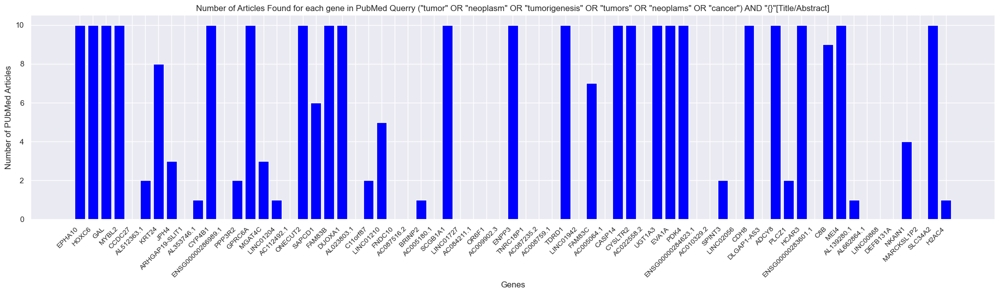

In [ ]:
# Plot the number of articles per gene
plt.figure(figsize=(20, 6)) # 10,6 for less genes
plt.bar(gene_article_counts.keys(), gene_article_counts.values(), color='blue')
plt.xlabel('Genes')
plt.ylabel('Number of PUbMed Articles')
plt.title(f'Number of Articles Found for each gene in PubMed Querry {search_query_template}')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate gene names for better visibility
plt.tight_layout()
plt.show()


In [ ]:
# calculate number of genes with publications in the area:
#print(gene_article_counts)
# Count the number of zeros in the values of the dictionary
num_zeros = sum(1 for count in gene_article_counts.values() if count == 0)
Percentage = (len(gene_article_counts)- num_zeros)/len(gene_article_counts)* 100
print ('Percentage:', Percentage, "%")

Percentage: 59.70149253731343 %


In [ ]:
# Plot the number of genes with publications in the different gene lists 

#Define a dictionary to store gene lists
gene_lists =  {
    'random_genes1': random_genes1,
    'random_genes2': random_genes2,
    'random_genes_ML1': random_genes_ML1,
    'random_genes_ML2': random_genes_ML2,
    'TOP_DE_Down':TOP_DE_Down_regulated_genes,
    'TOP_DE_Up_regulated_genes':TOP_DE_Up_regulated_genes,
    'TOP_DE_genes':TOP_DE_genes,
    'Top_features_Split': Top_features_Split,
    #'Permutation_split_top_features_validation': Permutation_split_top_features_test,
    #'Permutation_split_top_features_train': Permutation_split_top_features_train,
    #'Gini_split_top_features_train': Gini_split_top_features_train,
    'top_features_SHAP_validation_split': top_features_SHAP_test_split,
    #'top_features_SHAP_train_split': top_features_SHAP_train_split,
    #'Int_split_SHAP_Gini_train_Perm_test': Int_split_SHAP_Gini_train_Perm_test,
    #'Int_split_SHAP_Gini_train_SHAP_test': Int_split_SHAP_Gini_train_SHAP_test,
    'Int_all_Split': Int_all_Split,
    #'Top_features_Split': Top_features_Split,

    'SHAP_cv_test_features': SHAP_cv_test_features,
    'SHAP_cv_train_features': SHAP_cv_train_features,
    #'Gini_cross_top_features_cv_validation': Gini_cross_top_features_cv_test,
    'Int_SHAP_Gini_train_SHAP_validation':Int_SHAP_Gini_train_SHAP_test,
    'Gini_cross_top_features_cv_train': Gini_cross_top_features_cv_train,
    #'Top_Features_cv_Permutation_train': Top_Features_cv_Permutation_train,
    #'Top_Features_cv_Permutation_validation': Top_Features_cv_Permutation_test,
    #'Int_all_cv': Int_all_cv,
    #'Top_features_cv': Top_features_cv,

    'top_features_pc1': top_features_pc1,
    'top_features_pc2': top_features_pc2,
    'top_features_pc3': top_features_pc3
}

In [ ]:

# Dictionary to store gene-article counts
list_percentage_dict = {}

# Loop through each gene list and search for articles
for gene_list_name, gene_list in gene_lists.items():
    gene_article_counts = {}
    for gene in gene_list:
        article_count = search_gene_articles(gene)
        gene_article_counts[gene] = article_count

    # Calculate percentage of genes with articles found
    num_genes_with_articles = sum(1 for count in gene_article_counts.values() if count > 0)
    total_genes = len(gene_list)
    percentage = (num_genes_with_articles / total_genes) * 100

    # Print the gene list name, the percentage of genes with articles found, and save percentages in dictionary
    print(f"Gene List: {gene_list_name}, Percentage of Genes with Articles: {percentage:.2f}%")
    list_percentage_dict[gene_list_name] = percentage

# Print dictionary containing percentages
print("Percentage Dictionary:", list_percentage_dict)


Gene List: random_genes1, Percentage of Genes with Articles: 33.00%
Gene List: random_genes2, Percentage of Genes with Articles: 43.00%
Gene List: random_genes_ML1, Percentage of Genes with Articles: 61.00%
Gene List: random_genes_ML2, Percentage of Genes with Articles: 55.00%
Gene List: TOP_DE_Down, Percentage of Genes with Articles: 61.00%
Gene List: TOP_DE_Up_regulated_genes, Percentage of Genes with Articles: 49.00%
Gene List: TOP_DE_genes, Percentage of Genes with Articles: 61.00%
Gene List: Top_features_Split, Percentage of Genes with Articles: 59.70%
Gene List: top_features_SHAP_validation_split, Percentage of Genes with Articles: 59.70%
Gene List: Int_all_Split, Percentage of Genes with Articles: 59.09%
Gene List: SHAP_cv_test_features, Percentage of Genes with Articles: 75.00%
Gene List: SHAP_cv_train_features, Percentage of Genes with Articles: 72.00%
Gene List: Int_SHAP_Gini_train_SHAP_validation, Percentage of Genes with Articles: 82.76%
Gene List: Gini_cross_top_features_c

{'random_genes1': 33.0, 'random_genes2': 43.0, 'random_genes_ML1': 61.0, 'random_genes_ML2': 55.00000000000001, 'TOP_DE_Down': 61.0, 'TOP_DE_Up_regulated_genes': 49.0, 'TOP_DE_genes': 61.0, 'Top_features_Split': 59.70149253731343, 'top_features_SHAP_validation_split': 59.70149253731343, 'Int_all_Split': 59.09090909090909, 'SHAP_cv_test_features': 75.0, 'SHAP_cv_train_features': 72.0, 'Int_SHAP_Gini_train_SHAP_validation': 82.75862068965517, 'Gini_cross_top_features_cv_train': 74.0, 'top_features_pc1': 75.0, 'top_features_pc2': 56.00000000000001, 'top_features_pc3': 40.0}


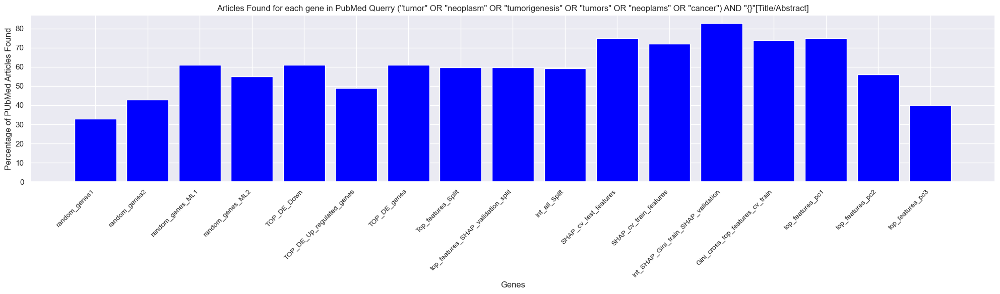

In [ ]:
print(list_percentage_dict)

# Plot the number of articles per gene
plt.figure(figsize=(20, 6)) # 10,6 for less genes
plt.bar(list_percentage_dict.keys(), list_percentage_dict.values(), color='blue')
plt.xlabel('Genes')
plt.ylabel('Percentage of PUbMed Articles Found')
plt.title(f'Articles Found for each gene in PubMed Querry {search_query_template}')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate gene names for better visibility
plt.tight_layout()
plt.show()



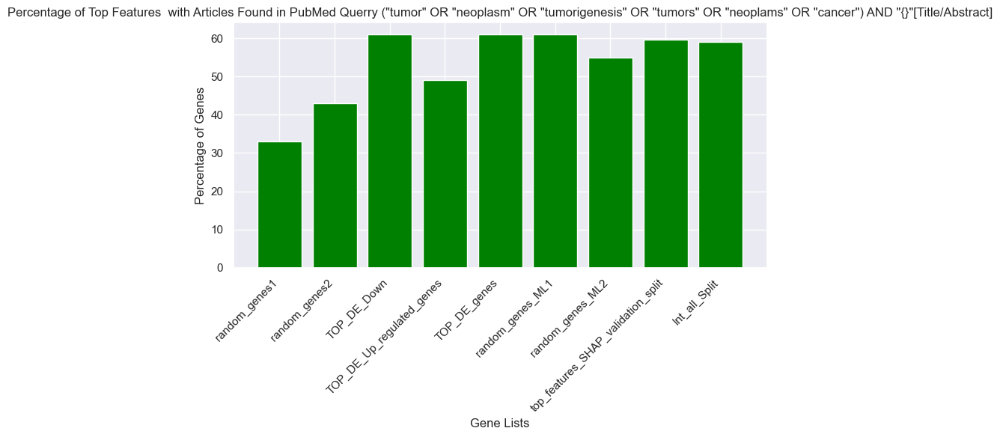

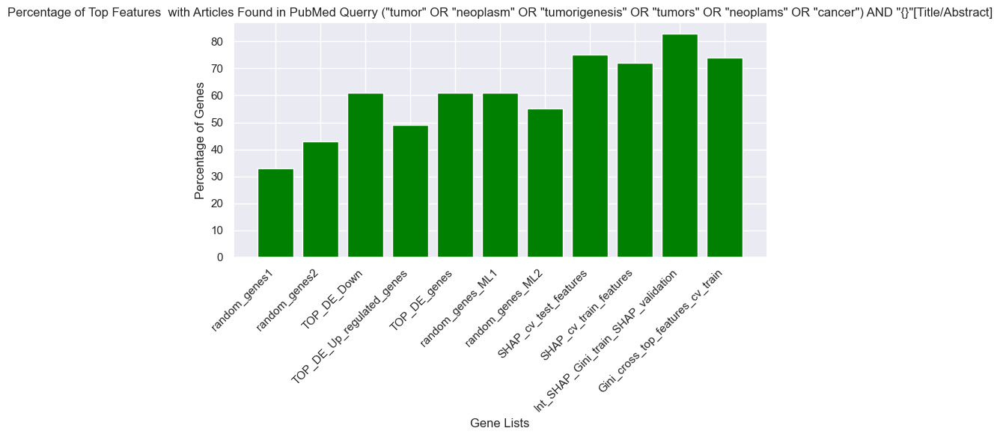

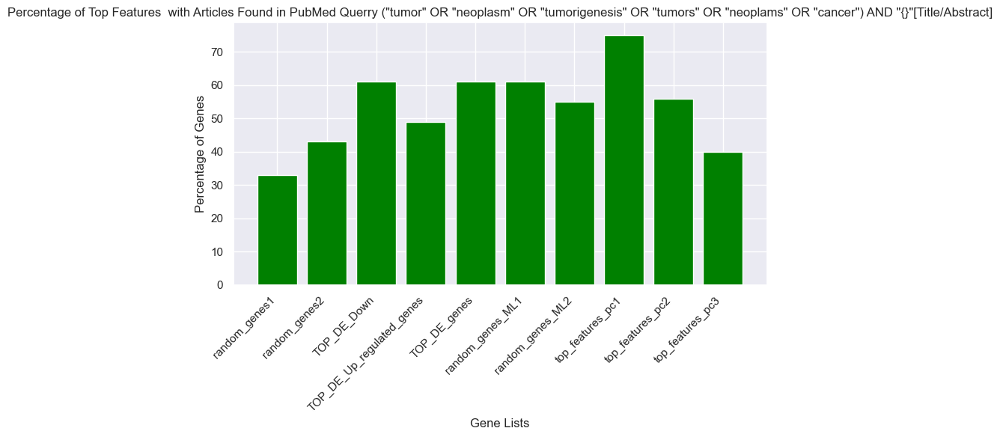

In [ ]:

# Define the gene list names you want to plot
# train-split

gene_lists_to_plot1 = ['random_genes1',
    'random_genes2',
    'TOP_DE_Down',
    'TOP_DE_Up_regulated_genes',
    'TOP_DE_genes',

    'random_genes_ML1',
    'random_genes_ML2',
    #'Top_features_Split','Permutation_split_top_features_test','Permutation_split_top_features_train','Gini_split_top_features_train',
    'top_features_SHAP_validation_split',
    #'top_features_SHAP_train_split',
    #'Int_split_SHAP_Gini_train_Perm_validation',
    #'Int_split_SHAP_Gini_train_SHAP_validation',
    'Int_all_Split',
    #'Top_features_Split'
]


# cv
gene_lists_to_plot2 = ['random_genes1',
    'random_genes2',
    'TOP_DE_Down',
    'TOP_DE_Up_regulated_genes',
    'TOP_DE_genes',
    'random_genes_ML1',
    'random_genes_ML2',
    'SHAP_cv_test_features',
    'SHAP_cv_train_features',
    #'Gini_cross_top_features_cv_validation',
    'Int_SHAP_Gini_train_SHAP_validation', # should have been called cv

    'Gini_cross_top_features_cv_train',
    #'Top_Features_cv_Permutation_train',
    #'Top_Features_cv_Permutation_validation',
    #'Int_all_cv',
    #'Top_features_cv'
]



#

# PCA

gene_lists_to_plot3 = ['random_genes1',
    'random_genes2',
    'TOP_DE_Down',
    'TOP_DE_Up_regulated_genes',
    'TOP_DE_genes',

    'random_genes_ML1',
    'random_genes_ML2',
    'top_features_pc1',
    'top_features_pc2',
    'top_features_pc3']

def Gene_percentages (gene_lists_to_plot):

    # Extract percentages for the gene list names of interest
    percentages_to_plot = [list_percentage_dict[gene_list_name] for gene_list_name in gene_lists_to_plot]

    # Create bar plot
    plt.figure(figsize=(8, 6))
    plt.bar(range(len(gene_lists_to_plot)), percentages_to_plot, color='green')
    plt.xlabel('Gene Lists')
    plt.ylabel('Percentage of Genes')
    plt.title(f'Percentage of Top Features  with Articles Found in PubMed Querry {search_query_template}')

    # Set the x-axis tick positions and labels
    plt.xticks(range(len(gene_lists_to_plot)), gene_lists_to_plot, rotation=45, ha='right')

    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()

# call the funtion with different lists:

Gene_percentages (gene_lists_to_plot1)
Gene_percentages (gene_lists_to_plot2)
Gene_percentages (gene_lists_to_plot3)

# Fetch abstracts and tittle of articles for a specific gene  and search querry in PubMEd

In [ ]:
# get  pubmed info for a specific gene:

from Bio import Entrez
import re

# Set the email address
Entrez.email = "paulavazq@gmail.com"

# Define the search query
search_query = '"cancer"[Title/Abstract] AND "NKX2-3"'


try:
    # Search PubMed using the query
    handle = Entrez.esearch(db="pubmed", term=search_query, retmax=10)  # Change retmax as needed
    record = Entrez.read(handle)

    # Get the list of PubMed IDs
    pubmed_ids = record["IdList"]

    # Fetch and print the article details
    for pubmed_id in pubmed_ids:
        article_handle = Entrez.efetch(db="pubmed", id=pubmed_id, rettype="medline", retmode="text")
        article_record = article_handle.read()

        # Extract article details (title, journal info, and abstract)
        # Extract article details using regular expressions
        title_match = re.search(r'TI\s*-\s*(.*?)\n(?:PMID|JT|AB|FAU|AD|$)', article_record, re.DOTALL)
        title = title_match.group(1).strip() if title_match else "No title available"
        journal_info = re.search(r'JT\s*-\s*(.*?)\n', article_record).group(1)
        abstract_match = re.search(r'AB\s*-\s*(.*?)\n(?:(?:FAU|AD).*?\n)+', article_record, re.DOTALL)
        abstract = abstract_match.group(1) if abstract_match else "No abstract available"

        # Print article details
        print("PubMed ID:", pubmed_id)
        print("Title:", title)
        print("Journal Information:", journal_info)
        print("Abstract:", abstract)
        print("\n")

        article_handle.close()

    # Close the search handle
    handle.close()

except Exception as e:
    print("An error occurred:", e)


PubMed ID: 38617515
Title: Gastric cancer prognosis: unveiling autophagy-related signatures and immune 
      infiltrates.
PG  - 1479-1492
LID - 10.21037/tcr-23-1755 [doi]
Journal Information: Translational cancer research
Abstract: BACKGROUND: Autophagy played a crucial regulatory role in tumor initiation and 
      progression. Therefore, we aimed to comprehensively analyze autophagy-related 
      genes (ARGs) in gastric cancer, focusing on their expression, prognostic value, 
      and potential functions. METHODS: The gastric cancer gene chip datasets (GSE79973 
      and GSE54129) were collected from the Gene Expression Omnibus (GEO) database. 
      Subsequently, the Limma package was employed to identify differentially expressed 
      genes (DEGs) between the normal and disease groups. The selected ARGs were 
      further authenticated using the Human Protein Atlas (HPA) database, The Cancer 
      Genome Atlas (TCGA) database, and GSE19826 database. RESULTS: A total of 15 
 

PubMed ID: 33194339
Title: Identification and validation of prognostic signature for breast cancer based on 
      genes potentially involved in autophagy.
PG  - e9621
LID - 10.7717/peerj.9621 [doi]
LID - e9621
Journal Information: PeerJ
Abstract: We aimed to identify prognostic signature based on autophagy-related genes (ARGs) 
      for breast cancer patients. The datasets of breast cancer were downloaded from 
      The Cancer Genome Atlas (TCGA) and Gene Expression Omnibus (GEO). Least absolute 
      shrinkage and selection operator (LASSO) Cox regression was conducted to 
      construct multiple-ARG risk signature. In total, 32 ARGs were identified as 
      differentially expressed between tumors and adjacent normal tissues based on 
      TCGA. Six ARGs (IFNG, TP63, PPP1R15A, PTK6, EIF4EBP1 and NKX2-3) with non-zero 
      coefficient were selected from the 32 ARGs using LASSO regression. The 6-ARG 
      signature divided patients into high-and low-risk group. Survival analys

# Funtion to fetch abstracts and tittle of articles for a list of genes  in PubMEd with given querry

In [ ]:
# make a loop to get abstracts and tittles from pubmed
# Dictionary to store gene-article counts


# Initialize Entrez with your email
Entrez.email = "your.email@example.com"

# Define the search query template
#search_query_template = '"{0}"[Title/Abstract]' # retrive only with this gene name
search_query_template = '("tumor" OR "neoplasm" OR "tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Title/Abstract]'
#search_query_template = '("tumor" OR "neoplasm" OR “tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}"[Text]'
#search_query_template = '("tumor" OR "neoplasm" OR “tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}" AND"prostate"[Title/Abstract]'
#search_query_template = '("tumor" OR "neoplasm" OR “tumorigenesis" OR "tumors" OR "neoplams" OR "cancer") AND "{}" AND"prostate"[Text]'

# list of genes (saved from the above generated list or  a new list)

genes = ['DEFB131A','AL133325.3','NKX2-3','SLC45A2']
genes = ['JPH4', 'CCDC27', 'AC005180.1']
def search_gene_articles_counts_references(gene):
    try:
        # Construct the search query with the gene name
        search_query = search_query_template.format(gene)
        handle = Entrez.esearch(db="pubmed", term=search_query, retmax=10)  # Change retmax as needed
        record = Entrez.read(handle)
        pubmed_ids = record["IdList"]

        articles = []

        # Fetch and print the article details
        for pubmed_id in pubmed_ids:
            article_handle = Entrez.efetch(db="pubmed", id=pubmed_id, rettype="medline", retmode="text")
            article_record = article_handle.read()

            # Extract article details
            title_match = re.search(r'TI\s*-\s*(.*?)\n(?:PMID|JT|AB|FAU|AD|$)', article_record, re.DOTALL)
            title = title_match.group(1).strip() if title_match else "No title available"
            journal_info = re.search(r'JT\s*-\s*(.*?)\n', article_record).group(1)
            abstract_match = re.search(r'AB\s*-\s*(.*?)\n(?:(?:FAU|AD).*?\n)+', article_record, re.DOTALL)
            abstract = abstract_match.group(1) if abstract_match else "No abstract available"

             # Print article details
            print("PubMed ID:", pubmed_id)
            print("Title:", title)
            print("Journal Information:", journal_info)
            # print("Abstract:", abstract) # if you want to print the abstracts
            print("\n")

            # Store article details
            articles.append({
                "PubMed ID": pubmed_id,
                "Title": title,
                "Journal Information": journal_info,
                "Abstract": abstract
            })

            article_handle.close()

        # Close the search handle
        handle.close()

        return articles

    except Exception as e:
        print(f"An error occurred for gene {gene}: {e}")
        return []



# ANSI escape code for bold text
bold_text = "\033[1m"

# ANSI escape code for bigger text
bigger_text = "\033[3m"

# Reset ANSI escape code (to return to normal text)
reset_text = "\033[0m"

# Loop through each gene and search for articles in the last genes lists generated above or in new lists
for gene in genes:
    print(f"{bold_text}{bigger_text}Searching articles for {gene}{reset_text}")
    articles = search_gene_articles_counts_references(gene)
    for article in articles:
        print("PubMed ID:", article["PubMed ID"])
        print("Title:", article["Title"])
        print("Journal Information:", article["Journal Information"])
        #print("Abstract:", article["Abstract"]) # if you want to print the abstracts
        print("\n")



Searching articles for JPH4
PubMed ID: 35646080
Title: Identifying and Exploring the Candidate Susceptibility Genes of Cirrhosis Using 
      the Multi-Tissue Transcriptome-Wide Association Study.
PG  - 878607
LID - 10.3389/fgene.2022.878607 [doi]
LID - 878607
Journal Information: Frontiers in genetics


PubMed ID: 31952997
Title: A 13-gene risk score system and a nomogram survival model for predicting the 
      prognosis of clear cell renal cell carcinoma.
PG  - 74.e1-74.e11
LID - S1078-1439(19)30523-X [pii]
LID - 10.1016/j.urolonc.2019.12.022 [doi]
Journal Information: Urologic oncology


PubMed ID: 19065659
Title: Dysregulated microRNAs and their predicted targets associated with endometrioid 
      endometrial adenocarcinoma in Hong Kong women.
PG  - 1358-65
LID - 10.1002/ijc.24071 [doi]
Journal Information: International journal of cancer


PubMed ID: 35646080
Title: Identifying and Exploring the Candidate Susceptibility Genes of Cirrhosis Using 
      the Multi-Tissue Transcript

# # Fetch abstracts and tittle of articles for an specific gene  in Euro PMC with given querry

In [ ]:
# Search in the Euro PMC   for a specific gene:

# Define the gene and cancer terms to search for
gene = "AC100826.1"
cancer_term = "cancer"

# Define the search URL template
search_url_template = "https://www.ebi.ac.uk/europepmc/webservices/rest/search?query={}%20AND%20{}"

try:
    # Construct the search URL with the gene and cancer terms
    search_url = search_url_template.format(gene, cancer_term)

    # Send a GET request to the search URL
    response = requests.get(search_url)
    response.raise_for_status()  # Raise an exception for HTTP errors

    # Parse the XML content of the search results
    soup = BeautifulSoup(response.content, "xml")

    # Find and extract relevant information from the search results
    articles = soup.find_all("result")
    for article in articles:
        # Extract article details (title, journal information, abstract)
        title = article.find("title").text.strip() if article.find("title") else "Title not available"
        journal_info = article.find("source").text.strip() if article.find("source") else "Journal information not available"
        abstract = article.find("abstractText").text.strip() if article.find("abstractText") else "Abstract not available"

        # Print article details
        print("Gene:", gene)
        print("Title:", title)
        print("Journal Information:", journal_info)
        print("Abstract:", abstract)
        print("\n")

except Exception as e:
    print("An error occurred:", e)


Gene: AC100826.1
Title: LncRNA AC100826.1 regulated PLCB1 to promote progression in non-small cell lung cancer
Journal Information: PPR
Abstract: Abstract not available


Gene: AC100826.1
Title: Differential Expression Profile of lncRNA in Glioma Cells and the Effect of lncRNA NKX3-1 on Glioma Cells Through Fem1b/SPDEF Pathway.
Journal Information: MED
Abstract: Abstract not available




In [ ]:
print()

['AC100826.1', 'SPON2', 'MARCKSL1P2', 'AL589182.1', 'AL353622.1', 'ZP1', 'SMR3B', 'AC245014.3', 'AC104820.1', 'ACTL8', 'AC084880.3', 'CCDC27', 'AL049649.1', 'LINC01509', 'ENPP3', 'AL691420.1', 'MEI4', 'EPHA10', 'CTBP1-AS', 'NWD2', 'ENSG00000287566.1', 'AL157702.2', 'CST4', 'SH2D1B', 'ARSF', 'CST2', 'DLX2', 'C2orf88', 'LINC00958', 'HOXC6', 'CABS1', 'ARHGAP19-SLIT1', 'AL512363.1', 'COL10A1', 'GAL']


# # Funtion to fetch abstracts and tittle of articles for a list of genes  in Euro PMC with given querry

In [ ]:
# loop through the list of interested genes/ features found by cross validation

# Search in the Euro PMC
import requests

from bs4 import BeautifulSoup

#cancer_term = "cancer"
cancer_term = "prostate cancer"


def search_gene_on_europe_pmc(gene, cancer_term):
    """
    Search for articles related to a gene and cancer term on Europe PMC.
    """
    # Define the search URL template
    search_url_template = "https://www.ebi.ac.uk/europepmc/webservices/rest/search?query={}%20AND%20{}"

    try:
        # Construct the search URL with the gene and cancer terms
        search_url = search_url_template.format(gene, cancer_term)

        # Send a GET request to the search URL
        response = requests.get(search_url)
        response.raise_for_status()  # Raise an exception for HTTP errors

        # Parse the XML content of the search results
        soup = BeautifulSoup(response.content, "xml")

        # Find and extract relevant information from the search results
        articles = soup.find_all("result")
        for article in articles:
            # Extract article details (title, journal information, abstract)
            title = article.find("title").text.strip() if article.find("title") else "Title not available"
            journal_info = article.find("source").text.strip() if article.find("source") else "Journal information not available"
            abstract = article.find("abstractText").text.strip() if article.find("abstractText") else "Abstract not available"

            # Print article details
            print("Gene:", gene)
            print("Title:", title)
            print("Journal Information:", journal_info)
            print("Abstract:", abstract)
            print("\n")

    except Exception as e:
        print("An error occurred for gene {}: {}".format(gene, e))



# Loop through each gene and perform the search
print (f'Publications found with word, {cancer_term}', 'in Euro PMC for the genes:')
print()
for gene in genes:
    search_gene_on_europe_pmc(gene, cancer_term)


Publications found with word, prostate cancer in Euro PMC for the genes:

Gene: DEFB131A
Title: Genome‑wide copy number analysis of circulating tumor cells in breast cancer patients with liver metastasis.
Journal Information: MED
Abstract: Abstract not available


Gene: DEFB131A
Title: Identification of Potential Prostate Cancer-Related Pseudogenes Based on Competitive Endogenous RNA Network Hypothesis.
Journal Information: MED
Abstract: Abstract not available


Gene: AL133325.3
Title: The influence of lncRNAs on the prognosis of prostate cancer based on TCGA database.
Journal Information: MED
Abstract: Abstract not available


Gene: AL133325.3
Title: Construction of Competitive Endogenous RNA Network and Verification of 3-Key LncRNA Signature Associated With Distant Metastasis and Poor Prognosis in Patients With Clear Cell Renal Cell Carcinoma.
Journal Information: MED
Abstract: Abstract not available


Gene: NKX2-3
Title: Significance of <i>NKX2-1</i> as a biomarker for clinical prog

Gene: NEO1
Number of articles found with prostate cancer-gene combination: 25


Gene: FKBP1AP3
Number of articles found with prostate cancer-gene combination: 0


Gene: AC091905.2
Number of articles found with prostate cancer-gene combination: 0


Gene: ZDHHC7
Number of articles found with prostate cancer-gene combination: 25


Gene: AP006216.2
Number of articles found with prostate cancer-gene combination: 1


Gene: TRIM28
Number of articles found with prostate cancer-gene combination: 25


Gene: MIR6165
Number of articles found with prostate cancer-gene combination: 0


Gene: AC021237.1
Number of articles found with prostate cancer-gene combination: 0


Gene: AC091304.4
Number of articles found with prostate cancer-gene combination: 0


Gene: OR5AQ1P
Number of articles found with prostate cancer-gene combination: 0


Gene: SNAP23
Number of articles found with prostate cancer-gene combination: 25


Gene: SLC14A2-AS1
Number of articles found with prostate cancer-gene combination: 4


G

Gene: CIAPIN1P
Number of articles found with prostate cancer-gene combination: 0




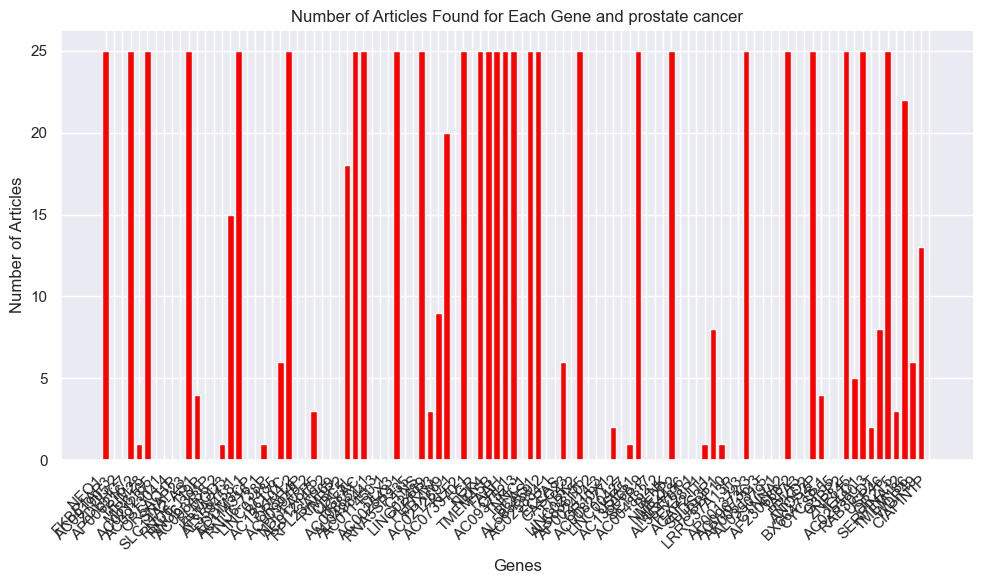

In [ ]:

# number of publication for each gene with a specific querry in Euro PMC

#cancer_term = "cancer"
cancer_term = "prostate cancer"

def search_gene_on_europe_pmc(gene, cancer_term):
    """
    Search for articles related to a gene and cancer term on Europe PMC.
    Return the count of articles found.
    """
    # Define the search URL template
    search_url_template = "https://www.ebi.ac.uk/europepmc/webservices/rest/search?query={}%20AND%20{}"

    try:
        # Construct the search URL with the gene and cancer terms
        search_url = search_url_template.format(gene, cancer_term)

        # Send a GET request to the search URL
        response = requests.get(search_url)
        response.raise_for_status()  # Raise an exception for HTTP errors

        # Parse the XML content of the search results
        soup = BeautifulSoup(response.content, "xml")

        # Find and count the number of articles in the search results
        articles = soup.find_all("result")
        count = len(articles)

        return count

    except Exception as e:
        print("An error occurred for gene {}: {}".format(gene, e))
        return 0  # Return 0 if an error occurs



# Loop through each gene and perform the search
# Perform the search for each gene and store the counts
gene_counts = {}
for gene in genes:
    # Perform the search and get the count of articles found
    article_count = search_gene_on_europe_pmc(gene, cancer_term)

    # Print the gene name and the count of articles found
    print("Gene:", gene)
    print(f'Number of articles found with {cancer_term}-gene combination: {article_count}')
    print("\n")
    gene_counts[gene] = search_gene_on_europe_pmc(gene, cancer_term)




# Plot the counts
plt.figure(figsize=(10, 6))
plt.bar(gene_counts.keys(), gene_counts.values(), color='red')
plt.xlabel('Genes')
plt.ylabel('Number of Articles')
plt.title(f'Number of Articles Found for Each Gene and {cancer_term}')
plt.xticks(rotation=45, ha='right')  # Rotate gene names for better visibility
plt.tight_layout()
plt.show()

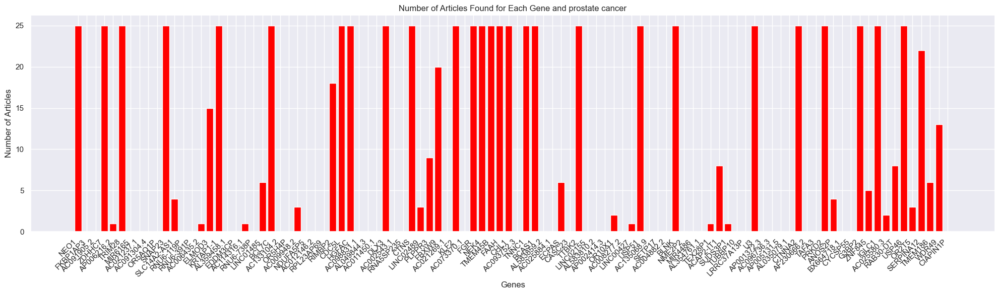

In [ ]:
# Plot the counts
plt.figure(figsize=(20, 6))
plt.bar(gene_counts.keys(), gene_counts.values(), color='red')
plt.xlabel('Genes')
plt.ylabel('Number of Articles')
plt.title(f'Number of Articles Found for Each Gene and {cancer_term}')
plt.xticks(rotation=45, ha='right')  # Rotate gene names for better visibility
plt.tight_layout()
plt.show()

# Plot normalized counts of selected features

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 4.13e+00
Median 1: 1.35e+01


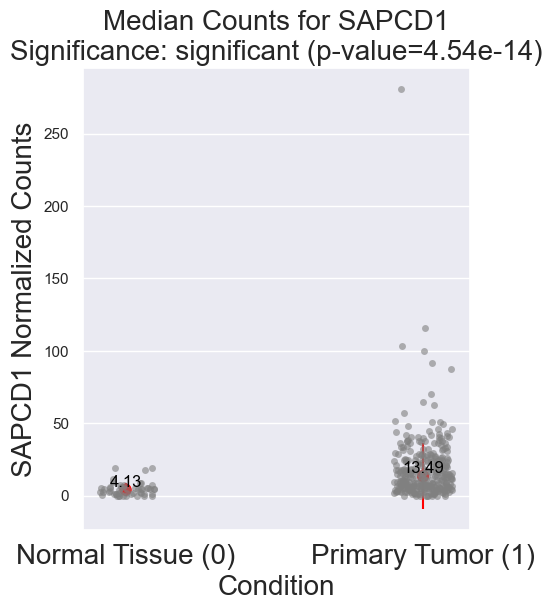

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 1.14e+02
Median 1: 5.49e+02


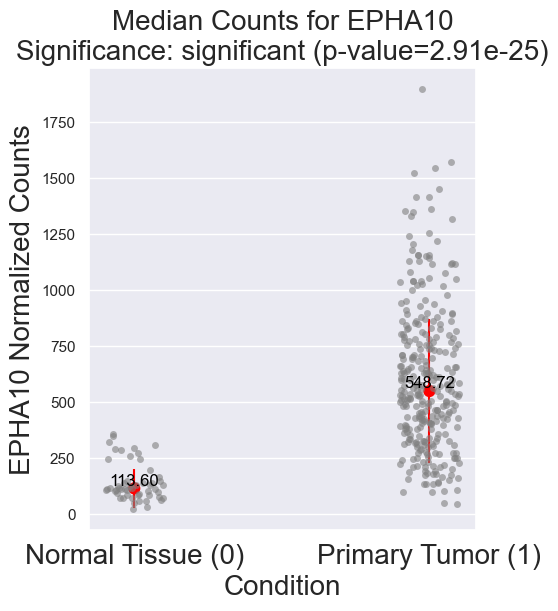

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 1.48e+02
Median 1: 1.62e+02


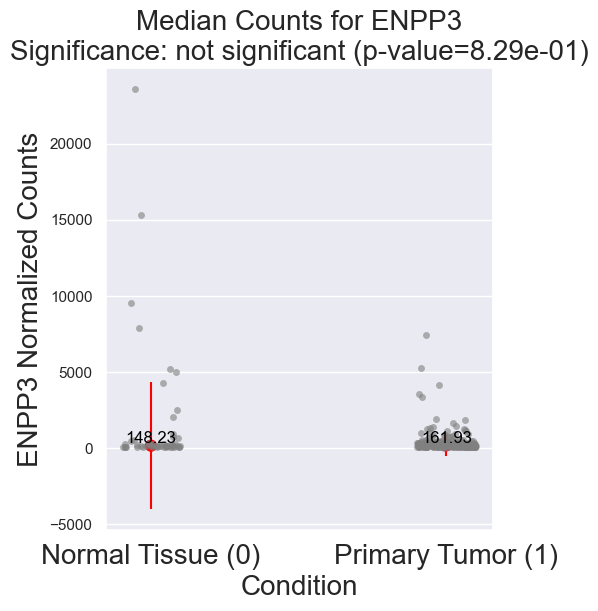

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 3.54e+02
Median 1: 9.51e+01


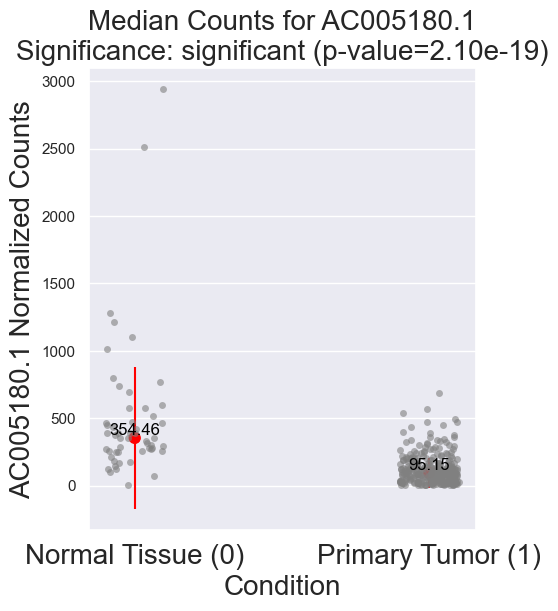

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 4.99e+01
Median 1: 2.24e+02


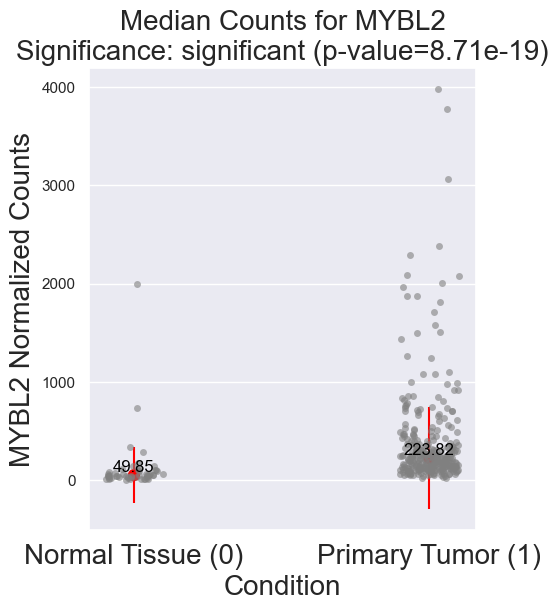

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 6.30e+00
Median 1: 8.60e-01


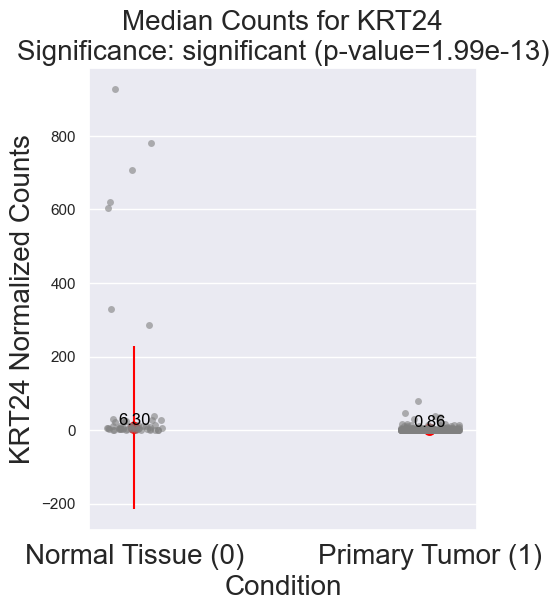

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 0.00e+00
Median 1: 3.55e+00


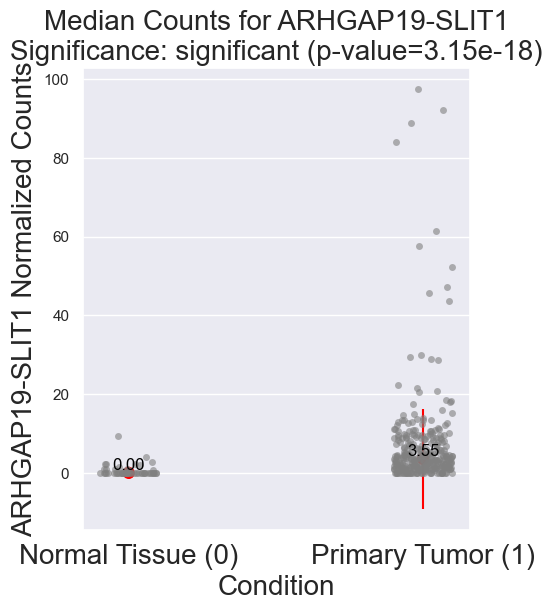

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 0.00e+00
Median 1: 0.00e+00


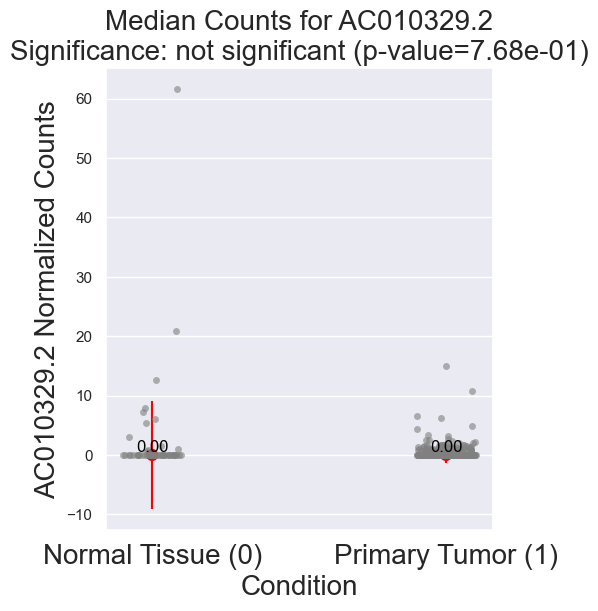

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 9.41e+03
Median 1: 2.14e+03


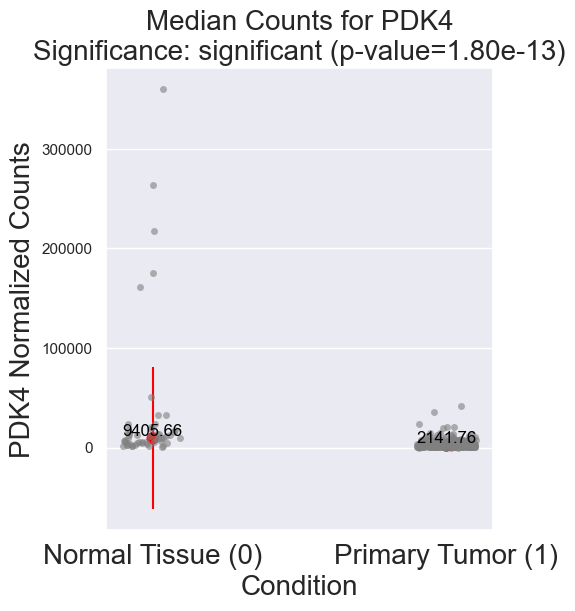

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 1.80e+03
Median 1: 4.26e+02


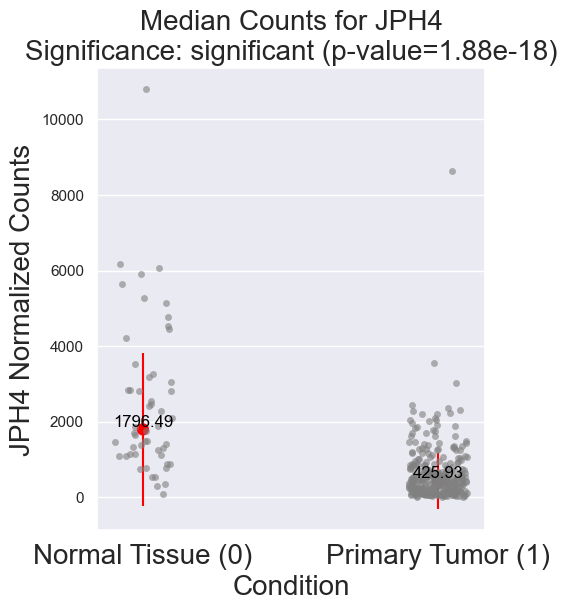

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 2.34e+01
Median 1: 2.25e+00


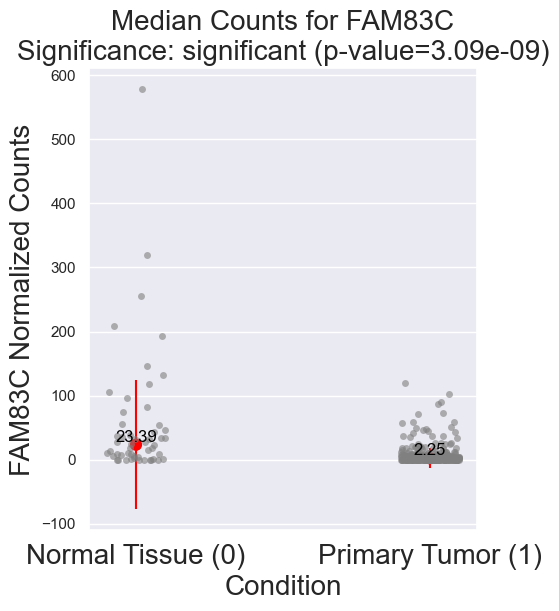

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 6.02e+00
Median 1: 2.47e+01


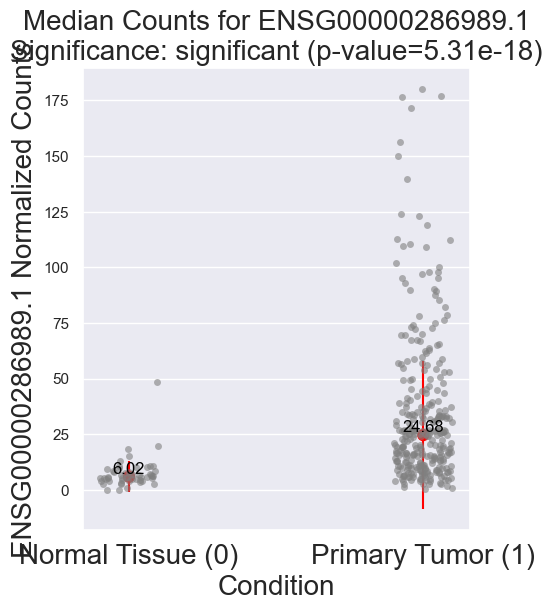

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 5.37e+02
Median 1: 1.24e+02


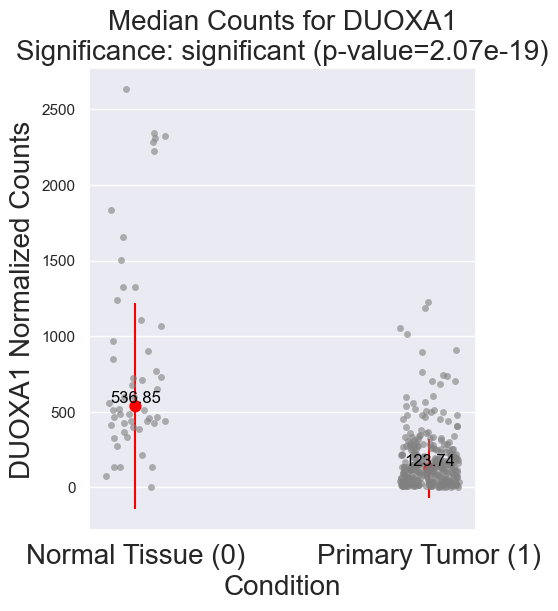

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 0.00e+00
Median 1: 0.00e+00


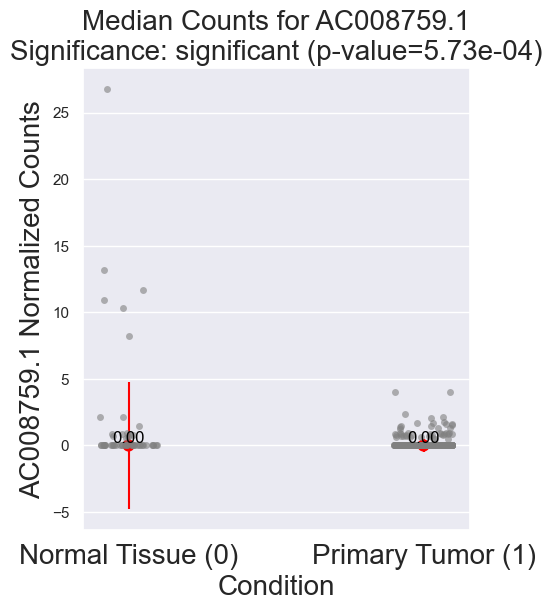

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 1.22e+00
Median 1: 0.00e+00


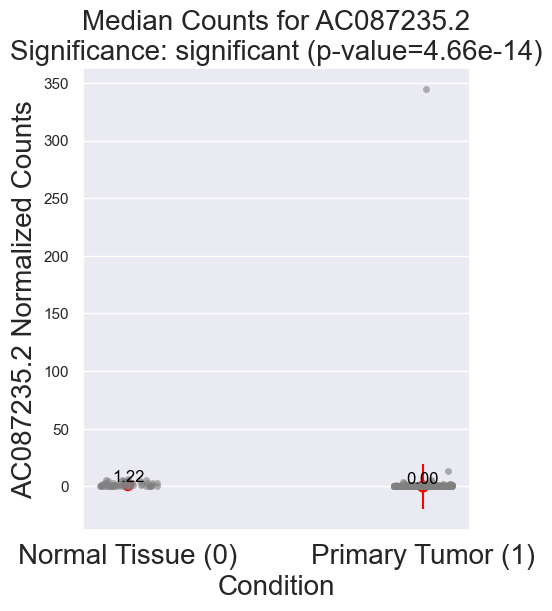

Median 0: 0.00e+00
Median 1: 8.37e-01


/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

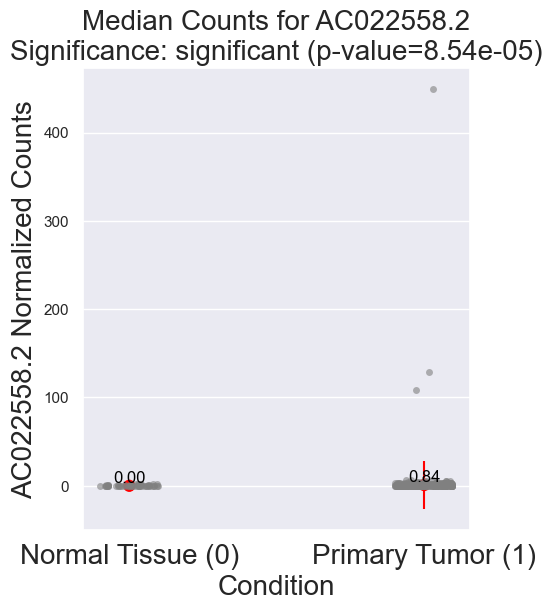

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 2.85e+01
Median 1: 6.06e+00


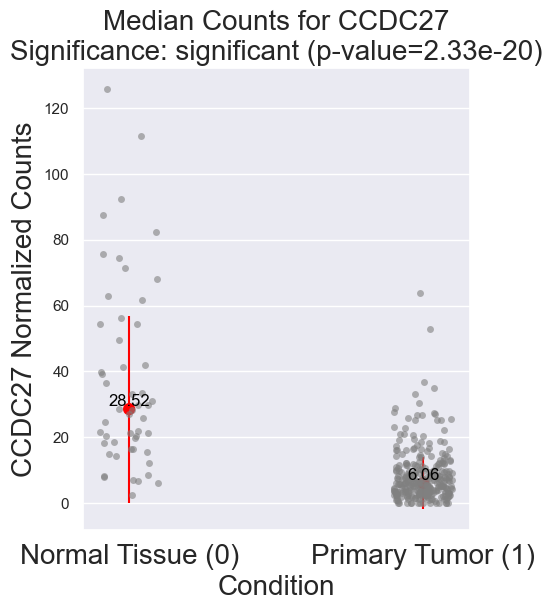

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 4.11e+01
Median 1: 1.40e+02


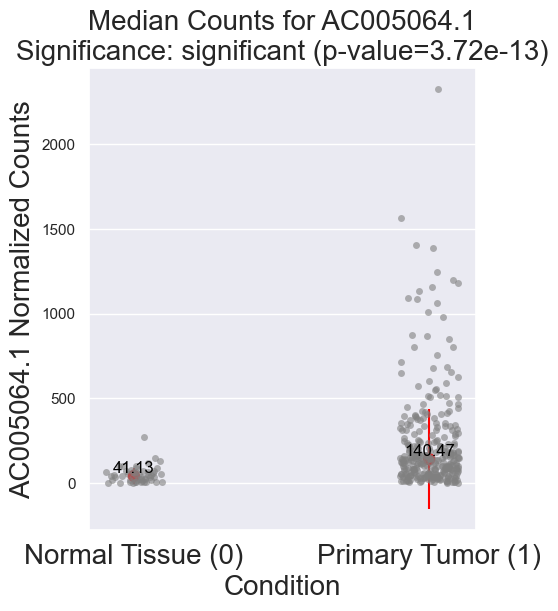

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 1.10e+01
Median 1: 1.19e+02


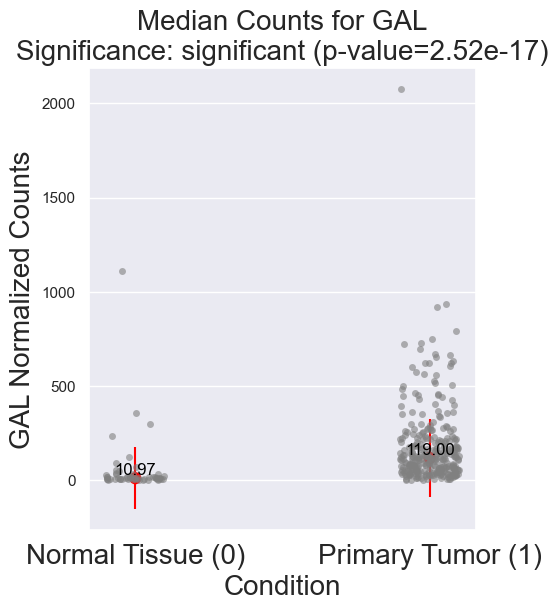

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 6.92e+01
Median 1: 2.95e+01


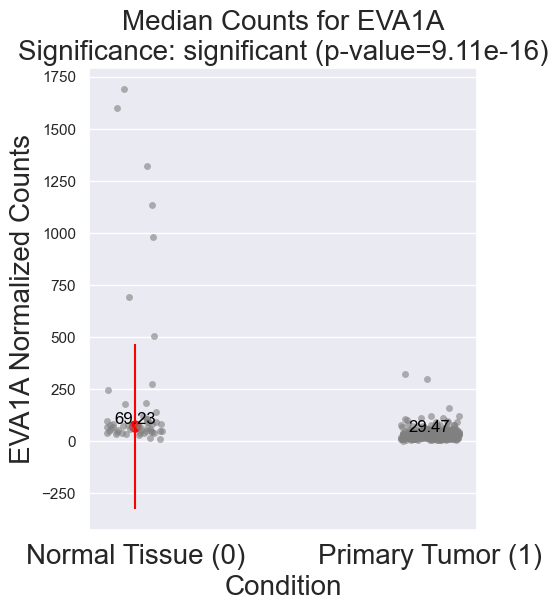

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 3.51e+02
Median 1: 2.94e+01


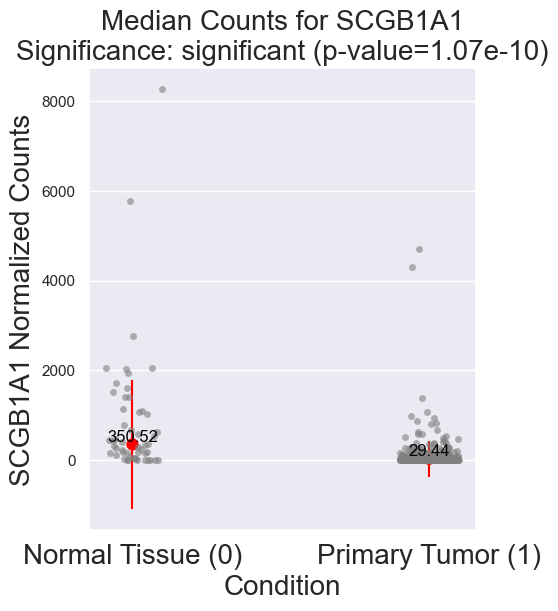

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

Median 0: 7.37e-01
Median 1: 1.47e+00


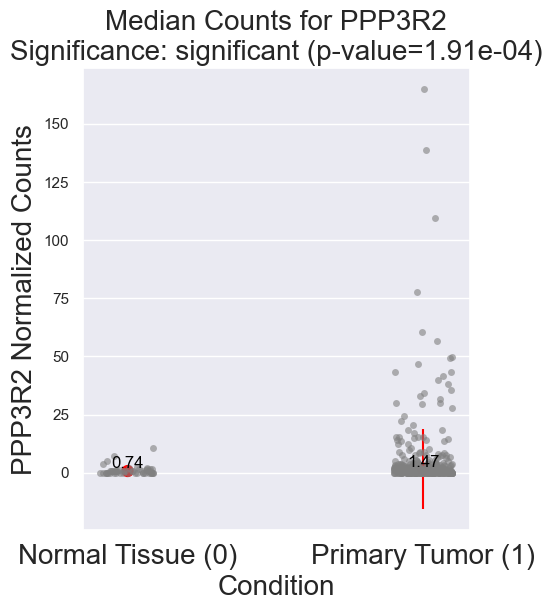

In [45]:
# plot the normalized counts in tumor and normal samples for specific genes and make a Mann Whitney test to check the significance of the means
# a more conservative test was done because we did not test if the data is normally distributed

#genes =top_features_SHAP_test_split
genes =Int_all_Split

for gene in genes:
    # Create the plot
    plt.figure(figsize=(5, 6))

    # Strip plots for individual data points
    sns.stripplot(data=PRAD_ML_df_gene_names, x='Condition', y=gene, jitter=True, color='gray', alpha=0.6)

    # Point plot for medians with error bars for standard deviation
    sns.pointplot(data=PRAD_ML_df_gene_names, x='Condition', y=gene,
                  ci=None, estimator='median', join=False,
                  capsize=0.2, errwidth=1.5, color='red')

    # Calculate median and standard deviation
    gene_median = PRAD_ML_df_gene_names.groupby('Condition')[gene].median()
    gene_std = PRAD_ML_df_gene_names.groupby('Condition')[gene].std()
    
    # Adding median and standard deviation lines manually
    for i, condition in enumerate(gene_median.index):
        plt.errorbar(i, gene_median[condition], yerr=gene_std[condition], fmt='o', color='red')
        plt.text(i, gene_median[condition], f'{gene_median[condition]:.2f}', color='black', ha='center', va='bottom')
        print(f'Median {condition}: {gene_median[condition]:.2e}')
              
    # Perform Mann-Whitney U test
    condition_0_data = PRAD_ML_df_gene_names[PRAD_ML_df_gene_names['Condition'] == 0][gene]
    condition_1_data = PRAD_ML_df_gene_names[PRAD_ML_df_gene_names['Condition'] == 1][gene]
    stat, p_value = mannwhitneyu(condition_0_data, condition_1_data, alternative='two-sided')
    significance = 'significant' if p_value < 0.05 else 'not significant'

    # Format p-value in scientific notation
    p_value_text = f'{p_value:.2e}'

    # Customize plot
    plt.title(f'Median Counts for {gene}\nSignificance: {significance} (p-value={p_value_text})',fontsize =20)
    plt.ylabel(f'{gene} Normalized Counts',fontsize =20)
    plt.xlabel('Condition', fontsize =20)
    plt.xticks(ticks=[0, 1], labels=['Normal Tissue (0)', 'Primary Tumor (1)'], fontsize =20)
    plt.show()


/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

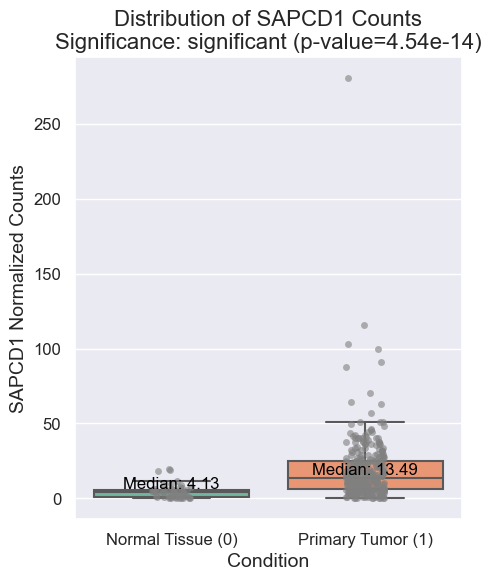

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

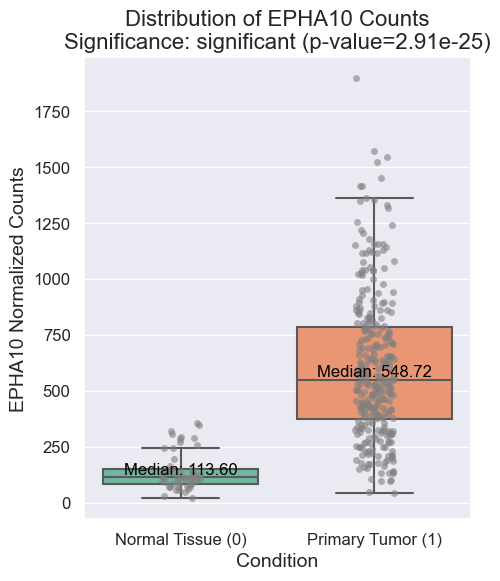

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

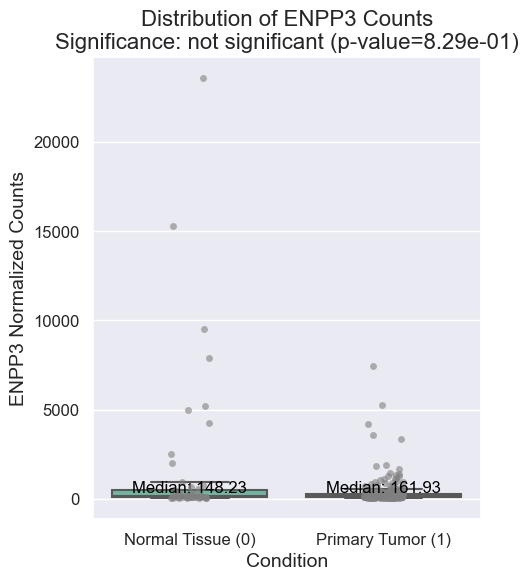

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

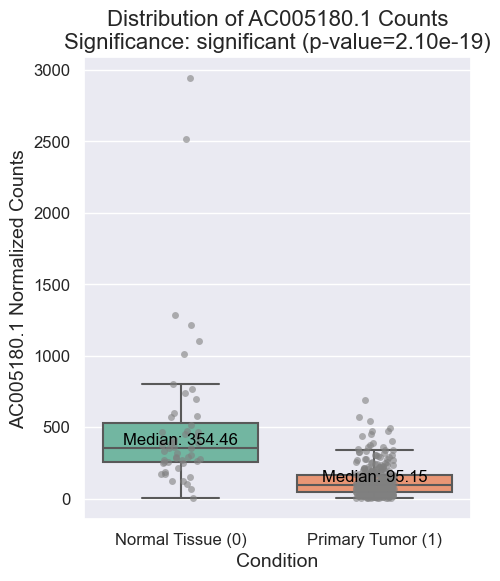

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

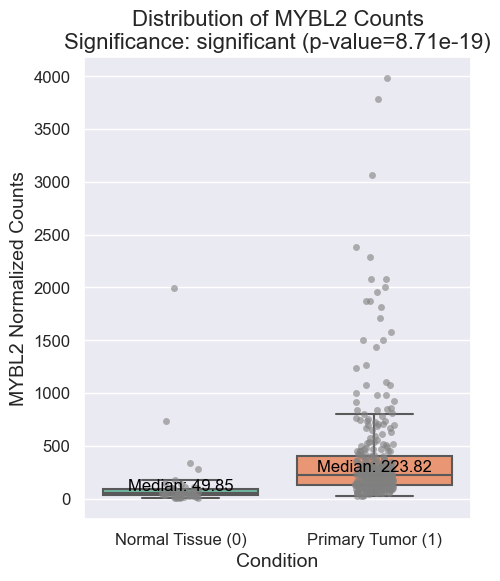

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

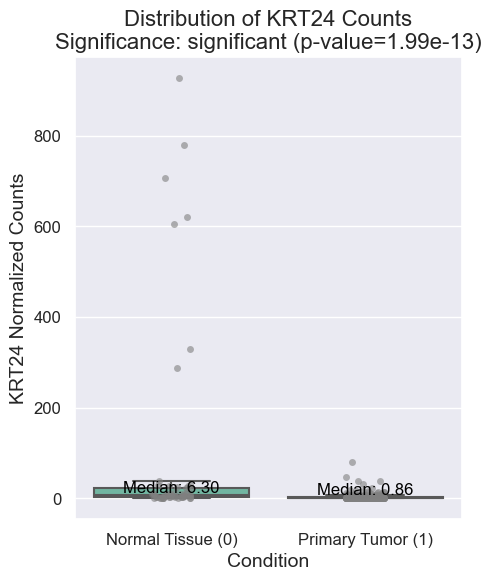

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

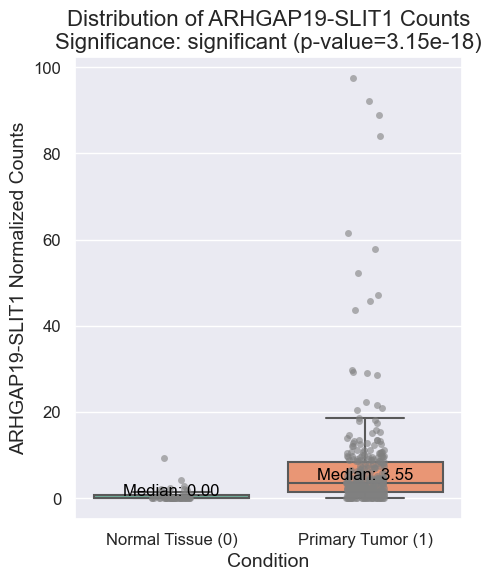

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

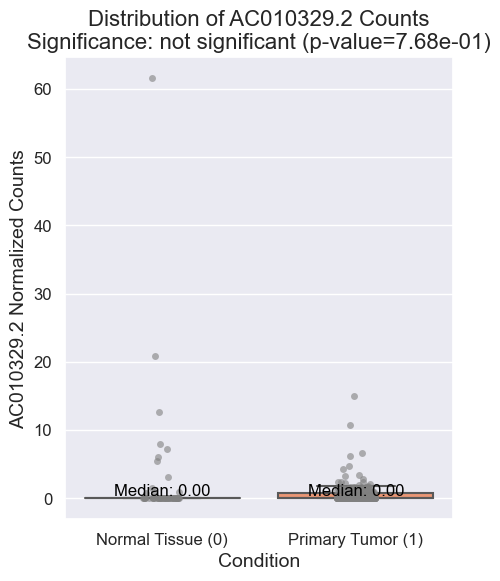

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

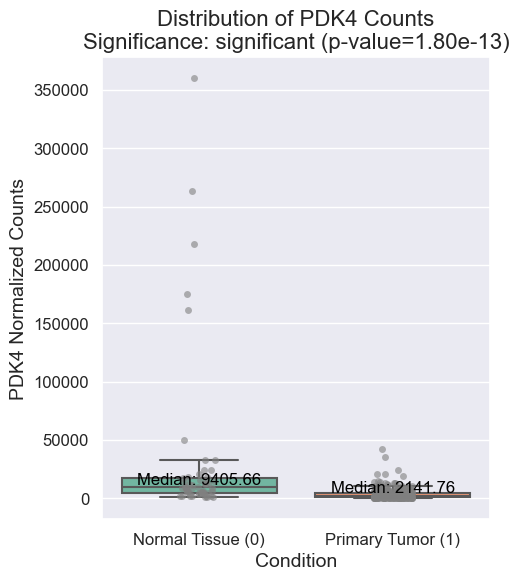

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

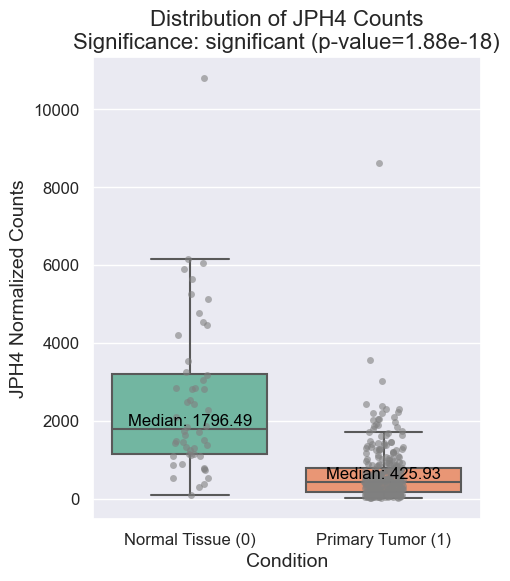

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

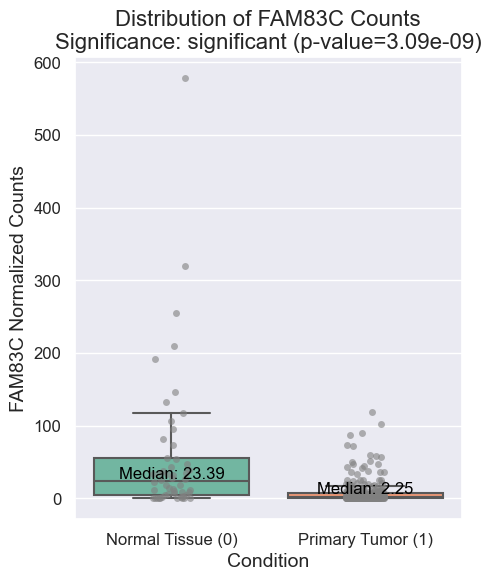

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

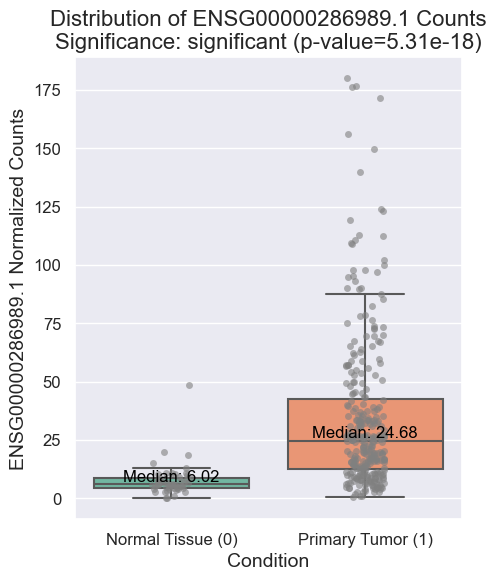

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

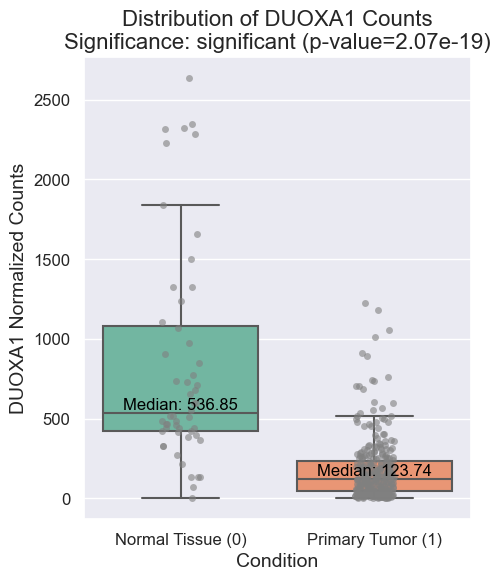

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

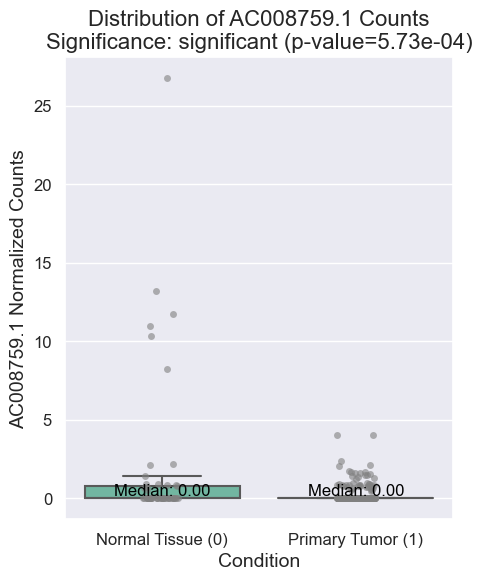

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

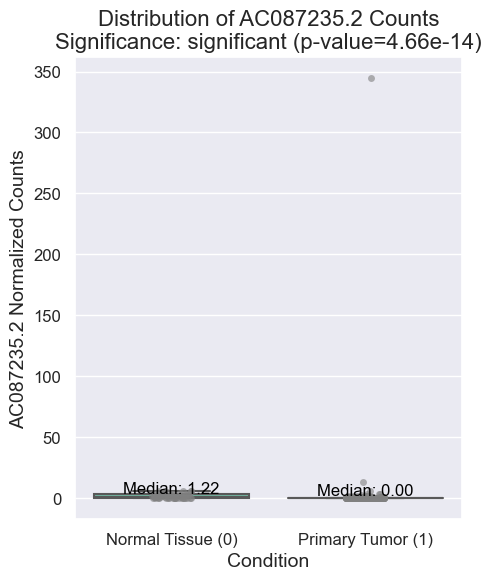

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

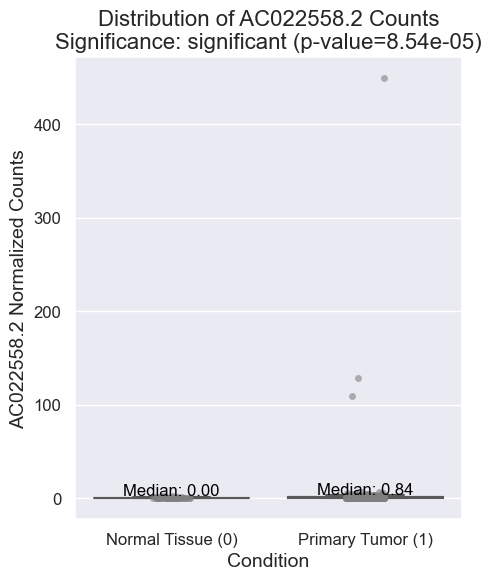

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

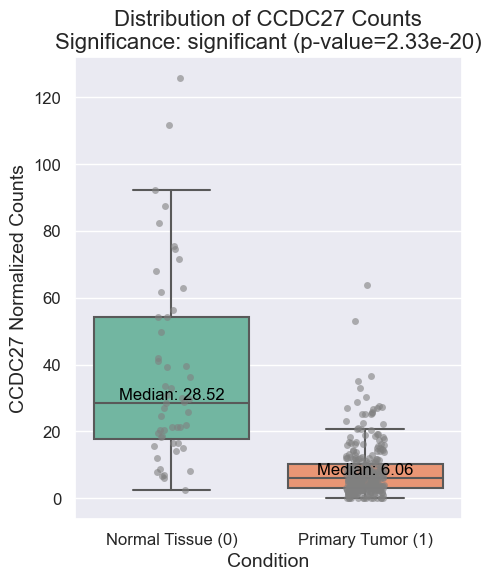

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

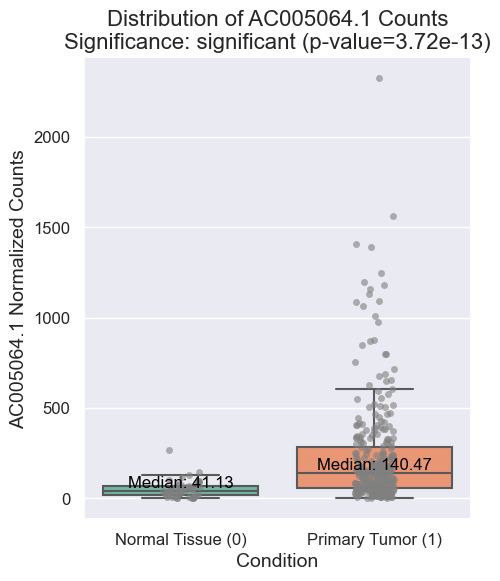

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

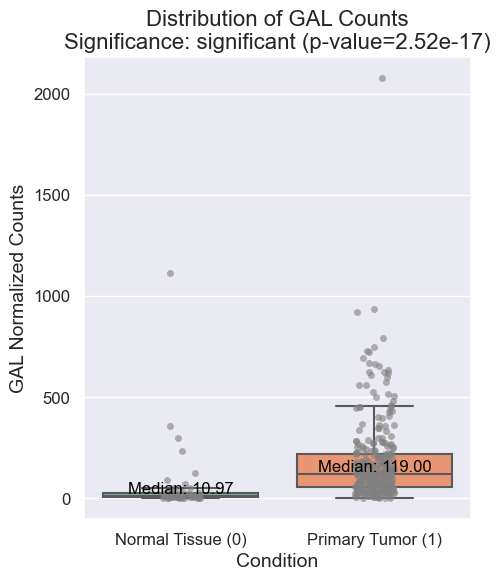

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

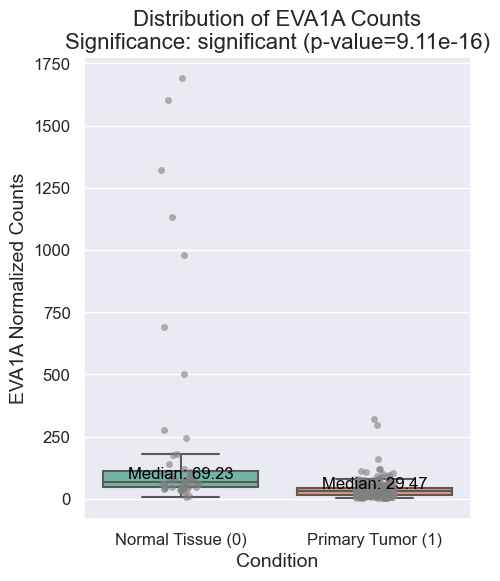

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

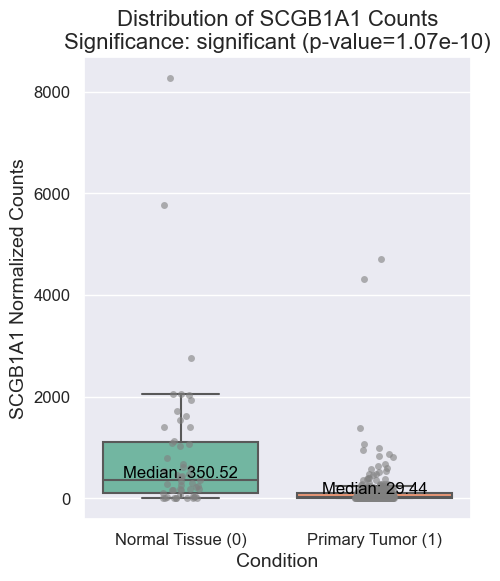

/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/paula/opt/anaconda3/envs/Env-Dep-learning/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

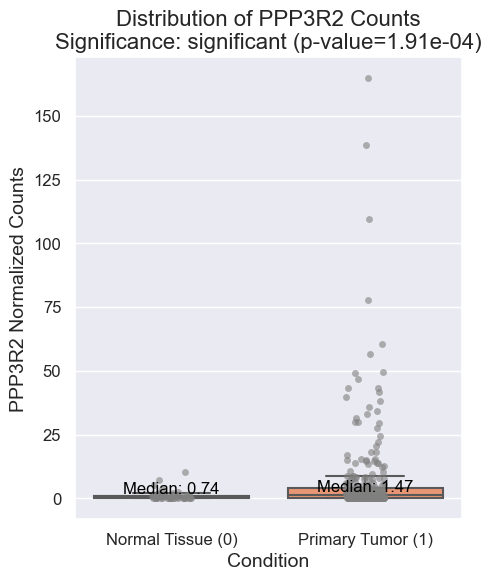

In [47]:
# adding box plots with the meadian to the graphs

for gene in genes:
    # Create the figure
    plt.figure(figsize=(5, 6))
    
    # Create a box plot with strip plot overlay for individual data points
    sns.boxplot(data=PRAD_ML_df_gene_names, x='Condition', y=gene, palette='Set2', showfliers=False)
    sns.stripplot(data=PRAD_ML_df_gene_names, x='Condition', y=gene, jitter=True, color='gray', alpha=0.6)

    # Calculate median and standard deviation
    gene_median = PRAD_ML_df_gene_names.groupby('Condition')[gene].median()
    gene_std = PRAD_ML_df_gene_names.groupby('Condition')[gene].std()

    # Adding median values manually
    for i, condition in enumerate(gene_median.index):
        plt.text(i, gene_median[condition], f'Median: {gene_median[condition]:.2f}', color='black', ha='center', va='bottom')

    # Perform Mann-Whitney U test
    condition_0_data = PRAD_ML_df_gene_names[PRAD_ML_df_gene_names['Condition'] == 0][gene]
    condition_1_data = PRAD_ML_df_gene_names[PRAD_ML_df_gene_names['Condition'] == 1][gene]
    stat, p_value = mannwhitneyu(condition_0_data, condition_1_data, alternative='two-sided')
    significance = 'significant' if p_value < 0.05 else 'not significant'

    # Format p-value in scientific notation
    p_value_text = f'{p_value:.2e}'

    # Customize plot
    plt.title(f'Distribution of {gene} Counts\nSignificance: {significance} (p-value={p_value_text})', fontsize=16)
    plt.ylabel(f'{gene} Normalized Counts', fontsize=14)
    plt.xlabel('Condition', fontsize=14)
    plt.xticks(ticks=[0, 1], labels=['Normal Tissue (0)', 'Primary Tumor (1)'], fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()
